# BYOP - CAPSTONE PROJECT

### (Group - E)

## CREDIT CARD ELIGIBILITY PREDICTION

In [1]:
# Import the Libraries

In [2]:
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams.update({'figure.figsize': (12.0, 8.0)})

import seaborn as sns

import os

import warnings
warnings.filterwarnings('ignore')

### 1. Data combination and de-duplication - Data Pre-processing

This dataset's objective is predicting whether an applicant's credit card approval will be approved or not. 

The dataset contains applicants' basic information and applicant's credit history. 

There are 438557 rows in application.csv. 
ID is from 5008804 to 6842885. 

In credit_record.csv, there are 1048575 rows of 45985 ID's credit record. 
ID is from 5001711 to 5150487.

#### 1.1 Application record

Data Dictionary:-

* ID: Unique Id of the row
* CODE_GENDER: Gender of the applicant. M is male and F is female.
* FLAG_OWN_CAR: Is an applicant with a car. Y is Yes and N is NO.
* FLAG_OWN_REALTY: Is an applicant with realty. Y is Yes and N is No.
* CNT_CHILDREN: Count of children.
* AMT_INCOME_TOTAL: the amount of the income.
* NAME_INCOME_TYPE: The type of income (5 types in total).
* NAME_EDUCATION_TYPE: The type of education (5 types in total).
* NAME_FAMILY_STATUS: The type of family status (6 types in total).
* DAYS_BIRTH: The number of the days from birth (Negative values).
* DAYS_EMPLOYED: The number of the days from employed (Negative values). This column has error values.
* FLAG_MOBIL: Is an applicant with a mobile. 1 is True and 0 is False.
* FLAG_WORK_PHONE: Is an applicant with a work phone. 1 is True and 0 is False.
* FLAG_PHONE: Is an applicant with a phone. 1 is True and 0 is False.
* FLAG_EMAIL: Is an applicant with a email. 1 is True and 0 is False.
* OCCUPATION_TYPE: The type of occupation (19 types in total). This column has missing values.
* CNT_FAM_MEMBERS: The count of family members.

In [3]:
# Check the directory

os.getcwd()

'C:\\Users\\manee\\Data Science\\IPBA\\BYOP\\Final'

In [4]:
# Change the directory of the project

os.chdir('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model')

In [5]:
# Re-check the directory and confirm the changes

os.getcwd()

'D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model'

In [6]:
# Read the dataset application_record

app = pd.read_csv('application_record.csv')
app.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00
1,5008805,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00
2,5008806,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.00
3,5008808,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00
4,5008809,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00


In [7]:
# Check the last few records of the dataset

app.tail()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
438552,6840104,M,N,Y,0,135000.00,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.00
438553,6840222,F,N,N,0,103500.00,Working,Secondary / secondary special,Single / not married,House / apartment,-15939,-3007,1,0,0,0,Laborers,1.00
438554,6841878,F,N,N,0,54000.00,Commercial associate,Higher education,Single / not married,With parents,-8169,-372,1,1,0,0,Sales staff,1.00
438555,6842765,F,N,Y,0,72000.00,Pensioner,Secondary / secondary special,Married,House / apartment,-21673,365243,1,0,0,0,NaN,2.00
438556,6842885,F,N,Y,0,121500.00,Working,Secondary / secondary special,Married,House / apartment,-18858,-1201,1,0,1,0,Sales staff,2.00


In [8]:
# Column names: convert to lower case

app = app.rename(columns = str.lower)
app.head()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members
0,5008804,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00
1,5008805,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00
2,5008806,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.00
3,5008808,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00
4,5008809,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00


In [9]:
# Check the dimensions of the dataset

app.shape

(438557, 18)

In [10]:
# Check the datatypes of the dataset

app.dtypes

id                       int64
code_gender             object
flag_own_car            object
flag_own_realty         object
cnt_children             int64
amt_income_total       float64
name_income_type        object
name_education_type     object
name_family_status      object
name_housing_type       object
days_birth               int64
days_employed            int64
flag_mobil               int64
flag_work_phone          int64
flag_phone               int64
flag_email               int64
occupation_type         object
cnt_fam_members        float64
dtype: object

In [11]:
# Print information about the dataset

app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   438557 non-null  int64  
 1   code_gender          438557 non-null  object 
 2   flag_own_car         438557 non-null  object 
 3   flag_own_realty      438557 non-null  object 
 4   cnt_children         438557 non-null  int64  
 5   amt_income_total     438557 non-null  float64
 6   name_income_type     438557 non-null  object 
 7   name_education_type  438557 non-null  object 
 8   name_family_status   438557 non-null  object 
 9   name_housing_type    438557 non-null  object 
 10  days_birth           438557 non-null  int64  
 11  days_employed        438557 non-null  int64  
 12  flag_mobil           438557 non-null  int64  
 13  flag_work_phone      438557 non-null  int64  
 14  flag_phone           438557 non-null  int64  
 15  flag_email       

In [12]:
# Generate statistical summary of the continuous variables of the dataset and transpose it

app.describe().T

,count,mean,std,min,25%,50%,75%,max
id,438557.00,6022176.27,571637.02,5008804.00,5609375.00,6047745.00,6456971.00,7999952.00
cnt_children,438557.00,0.43,0.72,0.00,0.00,0.00,1.00,19.00
amt_income_total,438557.00,187524.29,110086.85,26100.00,121500.00,160780.50,225000.00,6750000.00
days_birth,438557.00,-15997.90,4185.03,-25201.00,-19483.00,-15630.00,-12514.00,-7489.00
days_employed,438557.00,60563.68,138767.80,-17531.00,-3103.00,-1467.00,-371.00,365243.00
flag_mobil,438557.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
flag_work_phone,438557.00,0.21,0.40,0.00,0.00,0.00,0.00,1.00
flag_phone,438557.00,0.29,0.45,0.00,0.00,0.00,1.00,1.00
flag_email,438557.00,0.11,0.31,0.00,0.00,0.00,0.00,1.00
cnt_fam_members,438557.00,2.19,0.90,1.00,2.00,2.00,3.00,20.00


In [13]:
# Generate statistical summary of the continuous and discrete variables of the dataset and transpose it

app.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,438557.00,NaN,NaN,NaN,6022176.27,571637.02,5008804.00,5609375.00,6047745.00,6456971.00,7999952.00
code_gender,438557,2,F,294440,NaN,NaN,NaN,NaN,NaN,NaN,NaN
flag_own_car,438557,2,N,275459,NaN,NaN,NaN,NaN,NaN,NaN,NaN
flag_own_realty,438557,2,Y,304074,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cnt_children,438557.00,NaN,NaN,NaN,0.43,0.72,0.00,0.00,0.00,1.00,19.00
amt_income_total,438557.00,NaN,NaN,NaN,187524.29,110086.85,26100.00,121500.00,160780.50,225000.00,6750000.00
name_income_type,438557,5,Working,226104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
name_education_type,438557,5,Secondary / secondary special,301821,NaN,NaN,NaN,NaN,NaN,NaN,NaN
name_family_status,438557,5,Married,299828,NaN,NaN,NaN,NaN,NaN,NaN,NaN
name_housing_type,438557,6,House / apartment,393831,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# Check the total count of unique values of all the variables in the dataset

app.nunique()

id                     438510
code_gender                 2
flag_own_car                2
flag_own_realty             2
cnt_children               12
amt_income_total          866
name_income_type            5
name_education_type         5
name_family_status          5
name_housing_type           6
days_birth              16379
days_employed            9406
flag_mobil                  1
flag_work_phone             2
flag_phone                  2
flag_email                  2
occupation_type            18
cnt_fam_members            13
dtype: int64

In [15]:
# Find the missing values of all the variables in the dataset

app.isnull().sum().sort_values(ascending = False)

occupation_type        134203
id                          0
code_gender                 0
flag_email                  0
flag_phone                  0
flag_work_phone             0
flag_mobil                  0
days_employed               0
days_birth                  0
name_housing_type           0
name_family_status          0
name_education_type         0
name_income_type            0
amt_income_total            0
cnt_children                0
flag_own_realty             0
flag_own_car                0
cnt_fam_members             0
dtype: int64

In [16]:
(app.isnull().sum() / len(app) * 100).sort_values(ascending = False)

occupation_type       30.60
id                     0.00
code_gender            0.00
flag_email             0.00
flag_phone             0.00
flag_work_phone        0.00
flag_mobil             0.00
days_employed          0.00
days_birth             0.00
name_housing_type      0.00
name_family_status     0.00
name_education_type    0.00
name_income_type       0.00
amt_income_total       0.00
cnt_children           0.00
flag_own_realty        0.00
flag_own_car           0.00
cnt_fam_members        0.00
dtype: float64

Insights:-

* There are 30.60% of missing values in the occcupation_type variable of the application_record dataset (app).
* Since this is an important variable, therefore we will keep it and impute it later.

NOTE:-

* Any variable which has null values greater than 35% will be dropped (after considering other factors)

In [17]:
# Analysing variables containing null values
# Threshold: 30%

null_var = app.isnull().sum().sort_values(ascending = False)
null_var

occupation_type        134203
id                          0
code_gender                 0
flag_email                  0
flag_phone                  0
flag_work_phone             0
flag_mobil                  0
days_employed               0
days_birth                  0
name_housing_type           0
name_family_status          0
name_education_type         0
name_income_type            0
amt_income_total            0
cnt_children                0
flag_own_realty             0
flag_own_car                0
cnt_fam_members             0
dtype: int64

In [18]:
null_var30 = null_var[null_var.values > (0.30 * len(app))]
null_var30

occupation_type    134203
dtype: int64

Insights:-

* There is only one variable which has null values more than 30%.

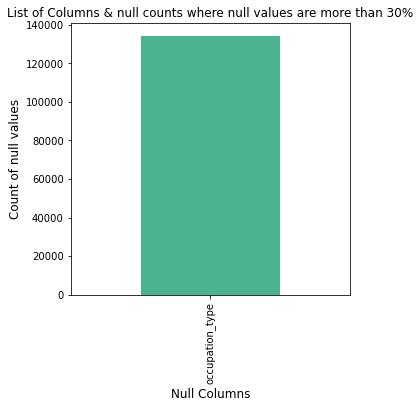

In [19]:
# Plotting Bar Graph for null values greater than 30%

plt.figure(figsize = (5, 5))
null_var30.plot(kind = 'bar', color = "#4CB391")                           
plt.title('List of Columns & null counts where null values are more than 30%') 

plt.xlabel("Null Columns", fontdict = {"fontsize": 12, "fontweight": 5}) #Setting X-label and Y-label
plt.ylabel("Count of null values", fontdict = {"fontsize": 12, "fontweight": 5})
plt.show()

In [20]:
# Analysing variables containing null values
# Threshold: 35%

null_var35 = null_var[null_var.values > (0.35 * len(app))]
null_var35

Series([], dtype: int64)

Insights:-

* There are no variable which has null values more than 35%.

In [21]:
# Check the total number of columns having null values greater than 30%

In [22]:
len(null_var30)

1

In [23]:
# List the column name having null values greater than 30%

col_names = list(null_var30.index.values)
col_names

# app.drop(labels = col_names, axis = 1, inplace = True) #Droping those columns

['occupation_type']

Insights:-

* We have decided to not remove this column as of now as it is below our dropping threshold of 35%

In [24]:
# Check the total number of columns having null values greater than 30%

In [25]:
len(null_var35)

0

Insights:-

* There are no columns in the dataset that has null values greater than equal to 35%.
* Had there been any such column/s then we may have dropped them after further analysis.

In [26]:
app.shape

(438557, 18)

In [27]:
# After removing null values, check the percentage of null values for each column again.

In [28]:
null = (app.isnull().sum() / len(app) * 100).sort_values(ascending = False)
null

occupation_type       30.60
id                     0.00
code_gender            0.00
flag_email             0.00
flag_phone             0.00
flag_work_phone        0.00
flag_mobil             0.00
days_employed          0.00
days_birth             0.00
name_housing_type      0.00
name_family_status     0.00
name_education_type    0.00
name_income_type       0.00
amt_income_total       0.00
cnt_children           0.00
flag_own_realty        0.00
flag_own_car           0.00
cnt_fam_members        0.00
dtype: float64

Insights:-
    
* Since there were no columns to remove therefor our dataframe structure and dimensiond remains the same as before.

In [29]:
# Check sample of duplicate records by combining DAYS_EMPLOYED and DAYS_BIRTH

app.loc[app.days_employed == -1194].loc[app.days_birth == -17778]

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members
13,5008819,M,Y,Y,0,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-17778,-1194,1,0,0,0,Laborers,2.00
14,5008820,M,Y,Y,0,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-17778,-1194,1,0,0,0,Laborers,2.00
15,5008821,M,Y,Y,0,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-17778,-1194,1,0,0,0,Laborers,2.00
16,5008822,M,Y,Y,0,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-17778,-1194,1,0,0,0,Laborers,2.00
17,5008823,M,Y,Y,0,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-17778,-1194,1,0,0,0,Laborers,2.00
18,5008824,M,Y,Y,0,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-17778,-1194,1,0,0,0,Laborers,2.00


##### Observations

* There are many duplicate rows in application_record.csv. 
* They have the same values in rows except ID.  
* In this approach we will keep these duplicate records.
* In OCCUPATION_TYPE there is 134203 missing values, which is 30.60%. We will treat it later.

In [30]:
# dropping duplicate values

# app = app.drop_duplicates(subset = app.columns[1:], keep = 'first', inplace = False)
# app.head()

In [31]:
# app.shape

#### 1.2 Credit record

This is a csv file with credit record for a part of ID in application record. We can treat it a file to generate labels for modeling. For the applicants who have a record more than 59 past due, they should be rejected.

Data Dictionary:-

* ID: Unique Id of the row in application record.
* MONTHS_BALANCE: The number of months from record time.
* STATUS: Credit status for this month.
      X: No loan for the month
      C: paid off that month 
      0: 1-29 days past due 
      1: 30-59 days past due 
      2: 60-89 days overdue
      3: 90-119 days overdue 
      4: 120-149 days overdue 
      5: Overdue or bad debts, write-offs for more than 150 days 

In [32]:
# Read the dataset credit_record

cred = pd.read_csv('credit_record.csv')
cred.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [33]:
# View the last few records of the dataset

cred.tail()

,ID,MONTHS_BALANCE,STATUS
1048570,5150487,-25,C
1048571,5150487,-26,C
1048572,5150487,-27,C
1048573,5150487,-28,C
1048574,5150487,-29,C


In [34]:
# Column names: convert to lower case

cred = cred.rename(columns = str.lower)
cred.head()

,id,months_balance,status
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [35]:
# Check the dimensions of the dataset

cred.shape

(1048575, 3)

In [36]:
# Check the datatypes of the dataset

cred.dtypes

id                 int64
months_balance     int64
status            object
dtype: object

In [37]:
# Print information about the dataset

cred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   id              1048575 non-null  int64 
 1   months_balance  1048575 non-null  int64 
 2   status          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [38]:
# Generate statistical summary of the continuous variables of the dataset and transpose it

cred.describe().T

,count,mean,std,min,25%,50%,75%,max
id,1048575.00,5068286.42,46150.58,5001711.00,5023644.00,5062104.00,5113856.00,5150487.00
months_balance,1048575.00,-19.14,14.02,-60.00,-29.00,-17.00,-7.00,0.00


In [39]:
# Generate statistical summary of the continuous and discrete variables of the dataset and transpose it

cred.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,1048575.00,NaN,NaN,NaN,5068286.42,46150.58,5001711.00,5023644.00,5062104.00,5113856.00,5150487.00
months_balance,1048575.00,NaN,NaN,NaN,-19.14,14.02,-60.00,-29.00,-17.00,-7.00,0.00
status,1048575,8,C,442031,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# Find the total count of unique records

cred.nunique()

id                45985
months_balance       61
status                8
dtype: int64

In [41]:
# Find the total number of missing values in every variable

cred.isnull().sum()

id                0
months_balance    0
status            0
dtype: int64

##### Observations

* The applicant's credit records are from current month to the past 60 months.
* There are no missing values in the credit_record.

In [42]:
# Replace X, and C by 0 of the status variable
# We will be considering '0' as Good Customer for our analysis and '1' as Bad Customer (in the status variable)

cred.status.replace('X', 0, inplace = True)
cred.status.replace('C', 0, inplace = True)

cred.head()

,id,months_balance,status
0,5001711,0,0
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,0


In [43]:
# Change the datatype of status variable to 'int'

cred.status = cred.status.astype('int')

In [44]:
# Re-check the datatypes of cred dataset

cred.dtypes

id                int64
months_balance    int64
status            int32
dtype: object

In [45]:
# Verify the records on the basis of the status value

cred.loc[cred.status == 3]

,id,months_balance,status
8912,5002126,-47,3
8913,5002126,-48,3
34911,5003267,-50,3
34912,5003267,-51,3
44246,5003712,-23,3
...,...,...,...
1020098,5148602,-5,3
1025698,5148932,-46,3
1025743,5148934,-13,3
1040956,5149834,-13,3


In [46]:
# Retrieve the frequency of the status variable

cred.status.value_counts()

0    1034381
1      11090
5       1693
2        868
3        320
4        223
Name: status, dtype: int64

In [47]:
# Group the credit_recond dataset according to the 'id' variable to remove the similar 'id' records
# Also we will take the worst credit record of an applicant (i.e) the maximum value of the status variable against the
# applicant's id.
# In this filteration the other values of the staus will be discarded and only the highest values of the status will be
# considered.

cred = cred.groupby('id').status.max()

In [48]:
# View the first few records

cred.head(10)

id
5001711    0
5001712    0
5001713    0
5001714    0
5001715    0
5001717    0
5001718    1
5001719    0
5001720    1
5001723    0
Name: status, dtype: int32

In [49]:
# View the last few records

cred.tail()

id
5150482    0
5150483    0
5150484    0
5150485    0
5150487    0
Name: status, dtype: int32

In [50]:
# View the entire records

cred

id
5001711    0
5001712    0
5001713    0
5001714    0
5001715    0
          ..
5150482    0
5150483    0
5150484    0
5150485    0
5150487    0
Name: status, Length: 45985, dtype: int32

In [51]:
# Retrieve the frequency of the status variable after removing the duplicate ids.

cred.value_counts()

0    40635
1     4683
2      336
5      195
3       88
4       48
Name: status, dtype: int64

##### Merge the Datasets

In [52]:
# Merge the two datasets : app and cred

df = pd.merge(app, cred, how = 'inner', on = ['id'])

In [53]:
# View the first few records

df.head(10)

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,5008804,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00,1
1,5008805,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00,1
2,5008806,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.00,0
3,5008808,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
4,5008809,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
5,5008810,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
6,5008811,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
7,5008812,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.00,0
8,5008813,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.00,0
9,5008814,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.00,0


In [54]:
# Retrieve the frequency of the status variable after merging the datasets.

df.status.value_counts()

0    32166
1     3675
2      314
5      180
3       76
4       46
Name: status, dtype: int64

In [55]:
# Verify any random id of an applicant to confirm if the highest/worst values of his status is chosen and other duplicate ids
# are removed.

df.loc[df.id == 5137203]

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
32520,5137203,M,N,N,0,90000.00,Working,Secondary / secondary special,Single / not married,With parents,-9900,-170,1,1,0,0,Drivers,1.00,4


In [56]:
# Check the dimension of the merged dataset

df.shape

(36457, 19)

In [57]:
# Need to remove other values of status variable and required to keep on '0's and '1's.
# Any value in the status variable that is equal to 2 and above will be converted to '1's and below 2 will be converted to '0's.
# '0's means - Good Customers (including customers that are 0-29 days past due date)
# '1's means - Bad Customers

df.status = df.status.apply(lambda x: 1 if x >= 1 else 0)

df.head(10)

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,5008804,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00,1
1,5008805,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.00,1
2,5008806,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.00,0
3,5008808,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
4,5008809,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
5,5008810,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
6,5008811,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.00,0
7,5008812,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.00,0
8,5008813,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.00,0
9,5008814,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.00,0


In [58]:
# View last few records

df.tail(10)

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
36447,5149145,M,Y,Y,0,247500.00,Working,Secondary / secondary special,Married,House / apartment,-10952,-3577,1,1,0,0,Laborers,2.00,1
36448,5149158,M,Y,Y,0,247500.00,Working,Secondary / secondary special,Married,House / apartment,-10952,-3577,1,1,0,0,Laborers,2.00,1
36449,5149190,M,Y,N,1,450000.00,Working,Higher education,Married,House / apartment,-9847,-502,1,0,1,1,Core staff,3.00,1
36450,5149729,M,Y,Y,0,90000.00,Working,Secondary / secondary special,Married,House / apartment,-19101,-1721,1,0,0,0,NaN,2.00,1
36451,5149775,F,Y,Y,0,130500.00,Working,Secondary / secondary special,Married,House / apartment,-16137,-9391,1,0,1,0,Laborers,2.00,1
36452,5149828,M,Y,Y,0,315000.00,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,1,0,0,0,Managers,2.00,1
36453,5149834,F,N,Y,0,157500.00,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.00,1
36454,5149838,F,N,Y,0,157500.00,Pensioner,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.00,1
36455,5150049,F,N,Y,0,283500.00,Working,Secondary / secondary special,Married,House / apartment,-17958,-655,1,0,0,0,Sales staff,2.00,1
36456,5150337,M,N,Y,0,112500.00,Working,Secondary / secondary special,Single / not married,Rented apartment,-9188,-1193,1,0,0,0,Laborers,1.00,1


In [59]:
# Check the dimensions

df.shape

(36457, 19)

In [60]:
# Verify the same id of an applicant (the one we checked earlier above) to confirm if the status values of 2 and above are
# converted to '1's or not.
# In this example id = 5137203 earlier had the status value of 4.
# But after applying the '1's and '0's functions, we see that it has converted to '1'.

df.loc[df.id == 5137203]

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
32520,5137203,M,N,N,0,90000.00,Working,Secondary / secondary special,Single / not married,With parents,-9900,-170,1,1,0,0,Drivers,1.00,1


##### Status Variable

In [61]:
# Retrieve the frequency of the status variable after converting to '1's and '0's.
# 1 means Rejected applicants
# 0 means Accepted applicants

df.status.value_counts()

0    32166
1     4291
Name: status, dtype: int64

4291 applicants are rejected.

In [62]:
# Sort the dataset according to the 'amt_income_total' variable.

df = df.sort_values('amt_income_total')
df.head()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
30846,5126175,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
30845,5126174,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
34066,5143327,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,1,0,0,Security staff,2.00,0
32169,5135923,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0
32170,5135925,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0


In [63]:
# Reset the index

df = df.reset_index(drop = True)
df.head()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,5126175,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
1,5126174,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
2,5143327,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,1,0,0,Security staff,2.00,0
3,5135923,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0
4,5135925,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0


In [64]:
# View the last few records

df.tail()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
36452,5143234,F,Y,Y,1,1575000.00,Commercial associate,Higher education,Single / not married,House / apartment,-10142,-2479,1,0,0,0,Managers,2.00,0
36453,5143235,F,Y,Y,1,1575000.00,Commercial associate,Higher education,Single / not married,House / apartment,-10142,-2479,1,0,0,0,Managers,2.00,0
36454,5143236,F,Y,Y,1,1575000.00,Commercial associate,Higher education,Single / not married,House / apartment,-10142,-2479,1,0,0,0,Managers,2.00,0
36455,5143237,F,Y,Y,1,1575000.00,Commercial associate,Higher education,Single / not married,House / apartment,-10142,-2479,1,0,0,0,Managers,2.00,0
36456,5143238,F,Y,Y,1,1575000.00,Commercial associate,Higher education,Single / not married,House / apartment,-10142,-2479,1,0,0,0,Managers,2.00,0


In [65]:
# Replace the 'id' variable with the in-built numeric index values.

df.id = df.index
df.head()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
1,1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
2,2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,1,0,0,Security staff,2.00,0
3,3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0
4,4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0


In [66]:
# View the dimensions of the dataset

df.shape

(36457, 19)

In [67]:
# Save the current dataset as csv

df.to_csv('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\merged_data.csv', index = False)

##### Observations

In [68]:
# Print the rejection rate

print('There are ' + str(df.status.sum()) + ' rejected applicants.\n', 
      str(round(df.status.sum() / len(df) * 100, 2)) + '% in 36457 applicants.')

There are 4291 rejected applicants.
 11.77% in 36457 applicants.


In [69]:
# Separate the Good applicants and the Bad applicants

# Good applicants

status0 = df.loc[df["status"] == 0] 
status0.shape[0]

32166

In [70]:
# Bad applicants

status1 = df.loc[df["status"] == 1] 
status1.shape[0]

4291

In [71]:
# Calculate the imbalance ratio

round(len(status0)/len(status1), 2)

7.5

The Imbalance ratio we got  is "7.5"

In [72]:
# Let’s check the distribution of the target variable (status) visually using a pie chart.

count1 = 0 
count0 = 0

for i in df['status'].values:
    if i == 1:
        count1 += 1
    else:
        count0 += 1

In [73]:
count1

4291

In [74]:
count0

32166

In [75]:
count1_perc = (count1 / len(df['status'])) * 100
count0_perc = (count0 / len(df['status'])) * 100

In [76]:
count1_perc

11.77003044682777

In [77]:
count0_perc

88.22996955317223

In [78]:
# Imbalance Ratio

imbalance_ratio = print(str(round(count0_perc / count1_perc, 2)))

7.5


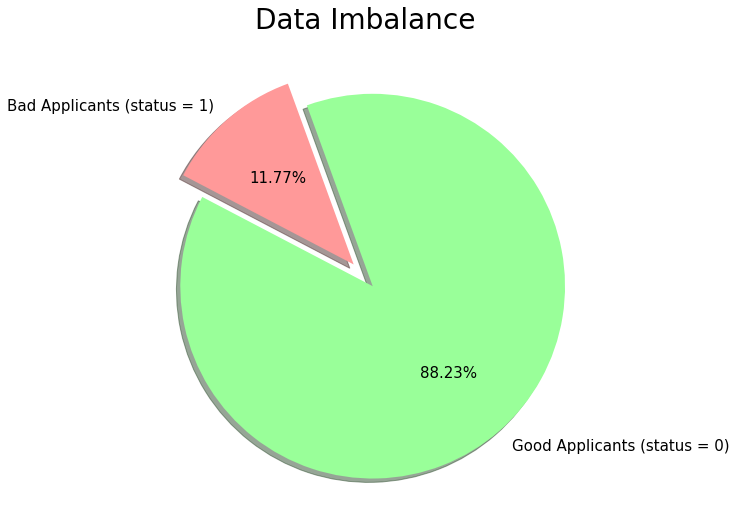

In [79]:
x = ['Bad Applicants (status = 1)', 'Good Applicants (status = 0)']
y = [count1_perc, count0_perc]
explode = (0.15, 0)  # only "explode" the 1st slice

colors = ['#ff9999','#99ff99']

fig1, ax1 = plt.subplots(figsize = (8,8))
ax1.pie(y, explode = explode, labels = x, colors=colors, autopct = '%1.2f%%', 
        shadow = True, startangle = 110, textprops = {'fontsize': 15})
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.suptitle('Data Imbalance', fontsize = 28)
#plt.title('(Status variable)')

plt.show()

Insights:-

* df dataframe that is application record is quite imbalanced. 
* Rejected applicants is 11.77% and Accepted applicants is 88.23%.
* Ratio is 7.50

#### Correlation

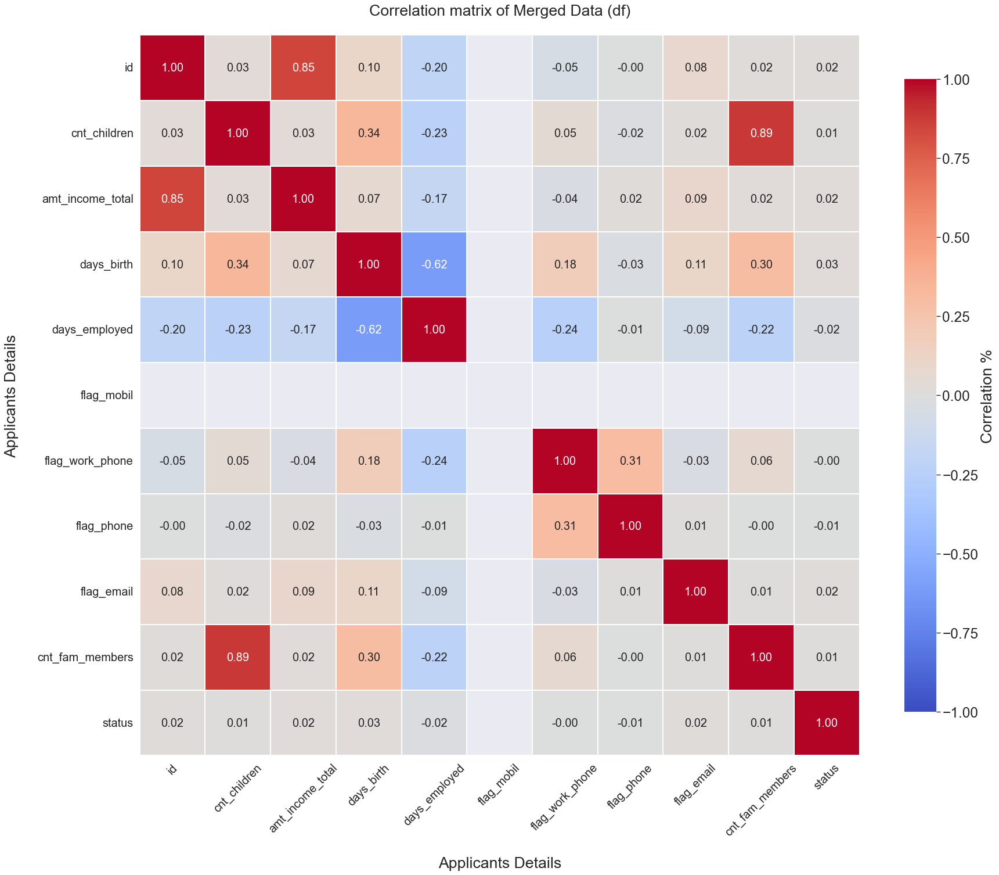

In [80]:
# Correlation of merged dataset df

plt.figure(figsize = (25, 22), dpi = 80, facecolor = 'white', edgecolor = 'k')

sns.set(font_scale = 2)

hm = sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1, cmap = 'coolwarm', fmt = '.2f', 
                 cbar_kws = {"shrink": .82, 'label': 'Correlation %'},
                 annot_kws = {"size": 18}, linewidths = 0.1, linecolor = 'white', square = True)

plt.title('Correlation matrix of Merged Data (df)\n')

hm.set(xlabel = '\nApplicants Details', ylabel = 'Applicants Details\n')

hm.set_xticklabels(hm.get_xmajorticklabels(), fontsize = 18, rotation = 45)

hm.set_yticklabels(hm.get_ymajorticklabels(), fontsize = 18)

plt.savefig('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Credit Card Approval\\Temp\\ver 5\\Plotting_Correlation_HeatMap1.jpg')

plt.show()

Insights:-

* As per the merged datasets of Application records and Credit records, we find:-
    * Children count and Family count variables are highly correlated at 89%.
    * Days_birth and Days_employed variabels are moderately inversely correlated at -62%. 
    * Id variable will be dropped as it has no significance.

### 2. Exploratory data analysis - EDA

#### 2.1 Binary Features

There are 7 binary features in a dataset 'df':-
   * code_gender
   * flag_own_car
   * flag_own_realty
   * flag_mobil
   * flag_work_phone Phone
   * flag_phone
   * flag_email

Note:-
* Since every applicant has a mobile phone, therefore, we will drop the entire column of 'flag_mobil'.

In [81]:
binary_df = df.copy()
binary_df.head()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_mobil,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
1,1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.00,1
2,2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,1,0,0,Security staff,2.00,0
3,3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0
4,4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.00,0


In [82]:
binary_df.shape

(36457, 19)

#### Convert the data types of Binary features to categorical datatypes

In [83]:
# Convert the datatypes to category data-type

binary_df['code_gender'] = binary_df['code_gender'].astype('category')
binary_df['flag_own_car'] = binary_df['flag_own_car'].astype('category')
binary_df['flag_own_realty'] = binary_df['flag_own_realty'].astype('category')
binary_df['flag_mobil'] = binary_df['flag_mobil'].astype('category')
binary_df['flag_work_phone'] = binary_df['flag_work_phone'].astype('category')
binary_df['flag_phone'] = binary_df['flag_phone'].astype('category')
binary_df['flag_email'] = binary_df['flag_email'].astype('category')

In [84]:
binary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   id                   36457 non-null  int64   
 1   code_gender          36457 non-null  category
 2   flag_own_car         36457 non-null  category
 3   flag_own_realty      36457 non-null  category
 4   cnt_children         36457 non-null  int64   
 5   amt_income_total     36457 non-null  float64 
 6   name_income_type     36457 non-null  object  
 7   name_education_type  36457 non-null  object  
 8   name_family_status   36457 non-null  object  
 9   name_housing_type    36457 non-null  object  
 10  days_birth           36457 non-null  int64   
 11  days_employed        36457 non-null  int64   
 12  flag_mobil           36457 non-null  category
 13  flag_work_phone      36457 non-null  category
 14  flag_phone           36457 non-null  category
 15  flag_email         

#### Mobile Analysis

In [85]:
# Reason for dropping 'flag_mobil' column

pd.crosstab(df['flag_mobil'], df['status'], margins = True)

status,0,1,All
flag_mobil,,,
1,32166,4291,36457
All,32166,4291,36457


Insights:-
    
    * There is only one category of '1's, which means that every applicant has a mobile phone.
    * Therefore, flag_mobil variable will be dropped as it is not significant for the model building.

In [86]:
# Drop the 'flag_mobil' variable

binary_df = binary_df.drop(['flag_mobil'], axis = 1)
binary_df.head()

,id,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [87]:
# Drop the Id variable as it is not significant

binary_df = binary_df.drop(['id'], axis = 1)
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [88]:
binary_df.shape

(36457, 17)

#### Gender Analysis

In [89]:
binary_df.code_gender.value_counts()

F    24430
M    12027
Name: code_gender, dtype: int64

In [90]:
# Use crosstabs

pd.crosstab(binary_df['code_gender'], binary_df['status'], margins = True)

status,0,1,All
code_gender,,,
F,21672,2758,24430
M,10494,1533,12027
All,32166,4291,36457


In [91]:
# Genderwise rejection break-up

gender_rej_perc = (binary_df.groupby('code_gender')['status']
           .value_counts(normalize = True)
           .reset_index(name = 'perc'))
gender_rej_perc

,code_gender,status,perc
0,F,0,0.89
1,F,1,0.11
2,M,0,0.87
3,M,1,0.13


In [92]:
# Gender distribution on the basis of Good applicants only

# Count

#status0_gen_c = status0.code_gender.value_counts()
#status0_gen_c

status0_gen_c = binary_df.loc[binary_df["status"] == 0] #.code_gender.value_counts() 
status0_gen_c.code_gender.value_counts()

F    21672
M    10494
Name: code_gender, dtype: int64

<AxesSubplot:xlabel='code_gender', ylabel='count'>

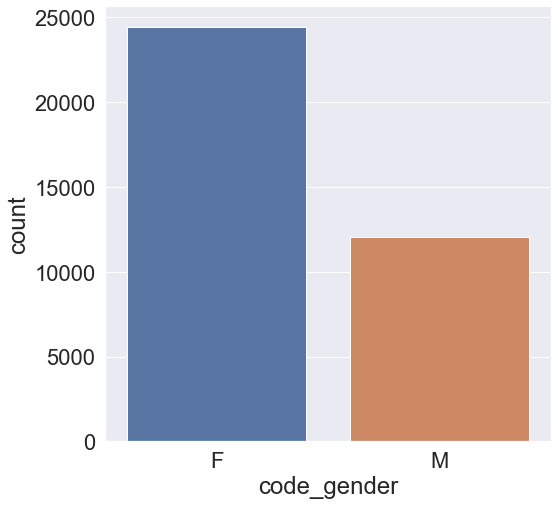

In [93]:
# Total Male and Female gender distribution

plt.subplots(figsize = (8, 8))
sns.countplot(binary_df['code_gender'])

In [94]:
# Percentage

status0_gen_p = binary_df.loc[binary_df["status"] == 0]
status0_gen_p.code_gender.value_counts(normalize = True)

F   0.67
M   0.33
Name: code_gender, dtype: float64

In [95]:
# Gender distribution on the basis of Bad applicants only

# Count

status1_gen_c = binary_df.loc[binary_df["status"] == 1] #.code_gender.value_counts() 
status1_gen_c.code_gender.value_counts()

F    2758
M    1533
Name: code_gender, dtype: int64

In [96]:
# Percentage

status1_gen_p = binary_df.loc[binary_df["status"] == 1]
status1_gen_p.code_gender.value_counts(normalize = True)

F   0.64
M   0.36
Name: code_gender, dtype: float64

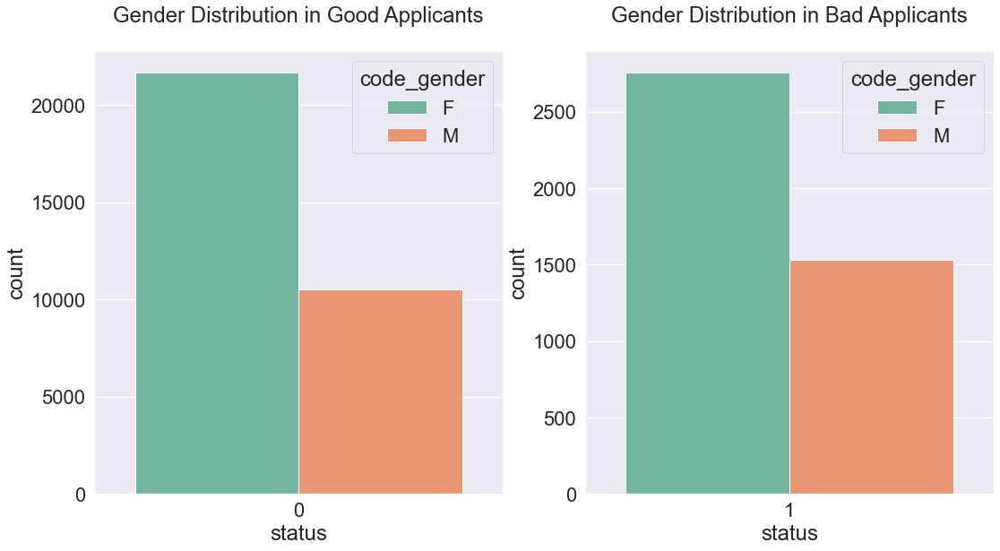

In [97]:
plt.figure(figsize = (18, 20))

plt.subplot(221)
sns.countplot(x = 'status', hue = 'code_gender', data = status0, palette = 'Set2')
plt.title("Gender Distribution in Good Applicants\n")

plt.subplot(222)
sns.countplot(x = 'status', hue = 'code_gender', data = status1, palette = 'Set2')
plt.title("Gender Distribution in Bad Applicants\n")

plt.show()

Insights:-

* 67.37% Females are Good applicants and 32.63% Males are Good applicants.
* 64.27% Female are Bad applicants and 35.73% Males are Bad applicants.

In [98]:
# Check the status count of rejection and acceptance on the basis of gender

gender_df = binary_df.groupby(["code_gender", 'status'])["status"].count()
gender_df

code_gender  status
F            0         21672
             1          2758
M            0         10494
             1          1533
Name: status, dtype: int64

In [99]:
# Total rejection count of Males

gender_df_m = binary_df.loc[binary_df.status == 1].loc[binary_df.code_gender == 'M']
gender_df_m.shape[0]

1533

In [100]:
# Total rejection count of Females

gender_df_f = binary_df.loc[binary_df.status == 1].loc[binary_df.code_gender == 'F']
gender_df_f.shape[0]

2758

In [101]:
# Total rejections

gender_tot = gender_df_f.shape[0] + gender_df_m.shape[0]
gender_tot

4291

In [102]:
# Total eligibles

gender_df_m_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.code_gender == 'M']
print("Total Eligible Males: " + str(gender_df_m_eleg.shape[0]))

gender_df_f_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.code_gender == 'F']
print("Total Eligible Females: " + str(gender_df_f_eleg.shape[0]))

gender_eleg = gender_df_f_eleg.shape[0] + gender_df_m_eleg.shape[0]
print("Total Eligible applicants : " + str(gender_eleg))

Total Eligible Males: 10494
Total Eligible Females: 21672
Total Eligible applicants : 32166


In [103]:
# Percencatage of rejection of Males out of total rejections

print('There are ' + str(gender_tot) + ' rejected applicants.')
print('Out of this:-')
print('Males are', gender_df_m.shape[0])
print('Females are', gender_df_f.shape[0], '\n')

print('Percentage of rejection of Males out of total rejections is', str(round(gender_df_m.shape[0] / gender_tot * 100, 2)) + '%.')

print('Percentage of rejection of Females out of total rejections is', str(round(gender_df_f.shape[0] / gender_tot * 100, 2)) + '%.', '\n', '\n')


print('There are ' + str(gender_eleg) + ' eligible applicants.')
print('Out of this:-')
print('Males are', gender_df_m_eleg.shape[0])
print('Females are', gender_df_f_eleg.shape[0], '\n')

print('Percentage of eligible of Males out of total eligible applicants is', str(round(gender_df_m_eleg.shape[0] / gender_eleg * 100, 2)) + '%.')

print('Percentage of eligible of Females out of total eligible applicants is', str(round(gender_df_f_eleg.shape[0] / gender_eleg * 100, 2)) + '%.')

There are 4291 rejected applicants.
Out of this:-
Males are 1533
Females are 2758 

Percentage of rejection of Males out of total rejections is 35.73%.
Percentage of rejection of Females out of total rejections is 64.27%. 
 

There are 32166 eligible applicants.
Out of this:-
Males are 10494
Females are 21672 

Percentage of eligible of Males out of total eligible applicants is 32.62%.
Percentage of eligible of Females out of total eligible applicants is 67.38%.


In [104]:
# Total reject percentage out of 36457 records

tot_gen_rejects_perc = binary_df["status"].sum() / round(len(binary_df["status"])) * 100
print(str(round(tot_gen_rejects_perc, 2)) + '%')

11.77%


In [105]:
# Total reject percentage of Males out of 36457 records

tot_gen_rej_counts_m = round((gender_df_m.shape[0] / (len(binary_df))) * 100, 2)
print(str(tot_gen_rej_counts_m) + '%')

4.2%


In [106]:
# Total reject percentage of Females out of 36457 records

tot_gen_rej_counts_f = round((gender_df_f.shape[0] / (len(binary_df))) * 100, 2)
print(str(tot_gen_rej_counts_f) + '%')

7.57%


In [107]:
# Create a new dataframe of just gender and then add status to it
# Also replace 'M's and 'F's in gender with '1's and '0's

gender_tot_df = ['code_gender']
gender_perc = binary_df[gender_tot_df + ['status']] .replace('M', 1).replace('F', 0)

In [108]:
gender_perc.head()

,code_gender,status
0,0,1
1,0,1
2,0,0
3,0,0
4,0,0


In [109]:
gender_perc.value_counts()

code_gender  status
0            0         21672
1            0         10494
0            1          2758
1            1          1533
dtype: int64

In [110]:
dict_list = []
for code_gender   in gender_tot_df:
    for one_type in [0, 1]:
        dict_list.append({'feature': code_gender,
                          'type': one_type,
                          'reject_rate_percentage': round(len(gender_perc[gender_perc[code_gender] == one_type][gender_perc.status == 1])
                                                       / len(gender_perc[gender_perc[code_gender] == one_type]) * 100, 2),
                          'count': len(gender_perc[gender_perc[code_gender] == one_type]),
                          'reject_count': len(gender_perc[gender_perc[code_gender] == one_type][gender_perc.status == 1])
                         })

In [111]:
gender_binary = pd.DataFrame.from_dict(dict_list)
gender_binary

,feature,type,reject_rate_percentage,count,reject_count
0,code_gender,0,11.29,24430,2758
1,code_gender,1,12.75,12027,1533


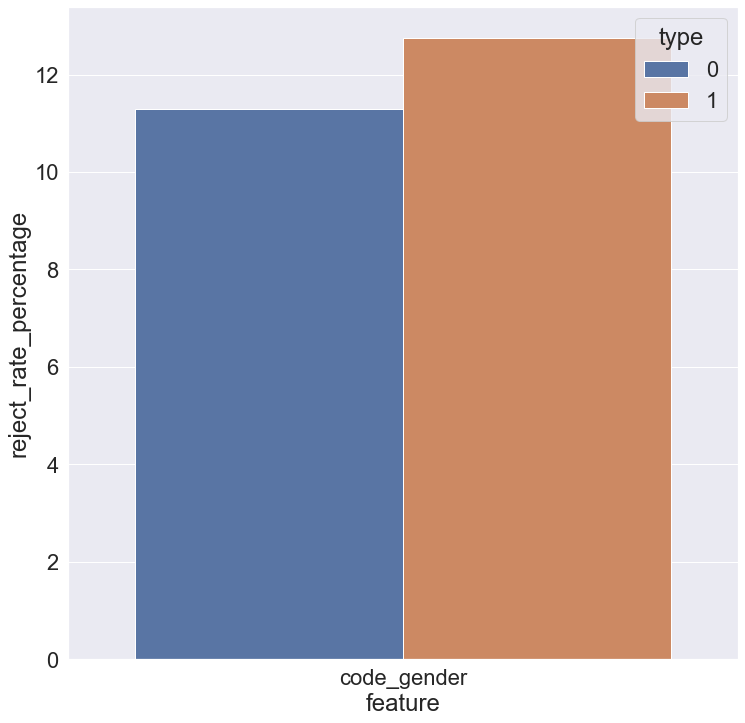

In [112]:
plt.subplots(figsize = (12, 12))
sns.barplot(x = "feature", y = "reject_rate_percentage", hue = "type", data = gender_binary)
plt.show()

#### Observations

* Reject rate as per same gender:-
    * Total Male applicants are 12027 and out if them 1533 applicants are rejected.
    * It means that Males rejection percentage out of the total Male applicants is 12.75%.

    * Total Female applicants are 24430 and out if them 2758 applicants are rejected.
    * It means that Females rejection percentage out of the total Female applicants is 11.29%.

    * Therefore, Males are more vulnerable than Feales w.r.t rejection.

* Rejection rate as per rejected applicants:-
    * Total rejection of 'gender' is of 4291 applicants out of the total records of 36457 applicants.
    * And percentage-wise it is 11.77%.
    
    * Females rejection percentage out of the total rejected applicants is 64.27%.
    * Whereas Males rejection percentage out of the total rejected applicants is 35.73%.
    
    * Here, the Females rejection rate is HIGHER than that of the Males.
    
* According to total records of 36457 applicants:-
    * Females rejection percentage is 7.57%.
    * Males rejection percentage is 4.2%
    
    * Again, we can see that Females rejection rate is higher than that of the Males.
    
* We can clearly see that the REJECTION RATE OF FEMALES is HIGHER than the MALES on 2 counts out of the 3.

In [113]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [114]:
# Convert the categories of 'code_gender' variable back from 'M's and 'F's to '1's and '0's
# Where Male = M = 1 and
# Female = F = 0

binary_df['code_gender'] = binary_df['code_gender'].replace('M', 1).replace('F', 0)
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


#### flag_own_car Analysis

In [115]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [116]:
binary_df.shape

(36457, 17)

In [117]:
binary_df.flag_own_car.value_counts()

N    22614
Y    13843
Name: flag_own_car, dtype: int64

<AxesSubplot:xlabel='flag_own_car', ylabel='count'>

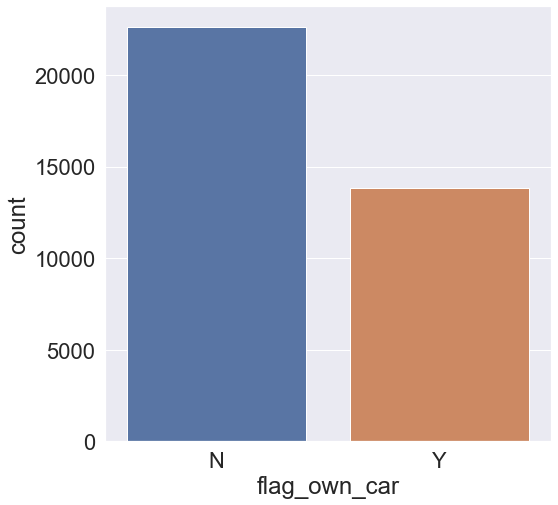

In [118]:
# Total Yes and No own_car distribution

plt.subplots(figsize = (8, 8))
sns.countplot(binary_df['flag_own_car'])

In [119]:
# Use crosstabs

pd.crosstab(binary_df['flag_own_car'], binary_df['status'], margins = True)

status,0,1,All
flag_own_car,,,
N,19892,2722,22614
Y,12274,1569,13843
All,32166,4291,36457


In [120]:
# Car ownership rejection break-up

car_rej_perc = (binary_df.groupby('flag_own_car')['status'].value_counts(normalize = True).reset_index(name = 'perc'))
car_rej_perc

,flag_own_car,status,perc
0,N,0,0.88
1,N,1,0.12
2,Y,0,0.89
3,Y,1,0.11


In [121]:
# Car ownership break-up of total applicants

car_rej_tot_perc = binary_df.flag_own_car.value_counts(normalize = True).reset_index(name = 'perc')
car_rej_tot_perc

,index,perc
0,N,0.62
1,Y,0.38


Insights:-

* 62.03% of the applicants do not have a car
* 37.97% of the applicants have a car

In [122]:
# Car ownership distribution on the basis of Good applicants only

# Count

#status0_car_c = status0.code_gender.value_counts()
#status0_car_c

status0_car_c = binary_df.loc[binary_df["status"] == 0] #.code_gender.value_counts() 
status0_car_c.flag_own_car.value_counts()

N    19892
Y    12274
Name: flag_own_car, dtype: int64

In [123]:
# Percentage

status0_car_p = binary_df.loc[binary_df["status"] == 0]
status0_car_p.flag_own_car.value_counts(normalize = True)

N   0.62
Y   0.38
Name: flag_own_car, dtype: float64

In [124]:
# Car ownership distribution on the basis of Bad applicants only

# Count

status1_car_c = binary_df.loc[binary_df["status"] == 1] #.code_gender.value_counts() 
status1_car_c.flag_own_car.value_counts()

N    2722
Y    1569
Name: flag_own_car, dtype: int64

In [125]:
# Percentage

status1_car_p = binary_df.loc[binary_df["status"] == 1]
status1_car_p.flag_own_car.value_counts(normalize = True)

N   0.63
Y   0.37
Name: flag_own_car, dtype: float64

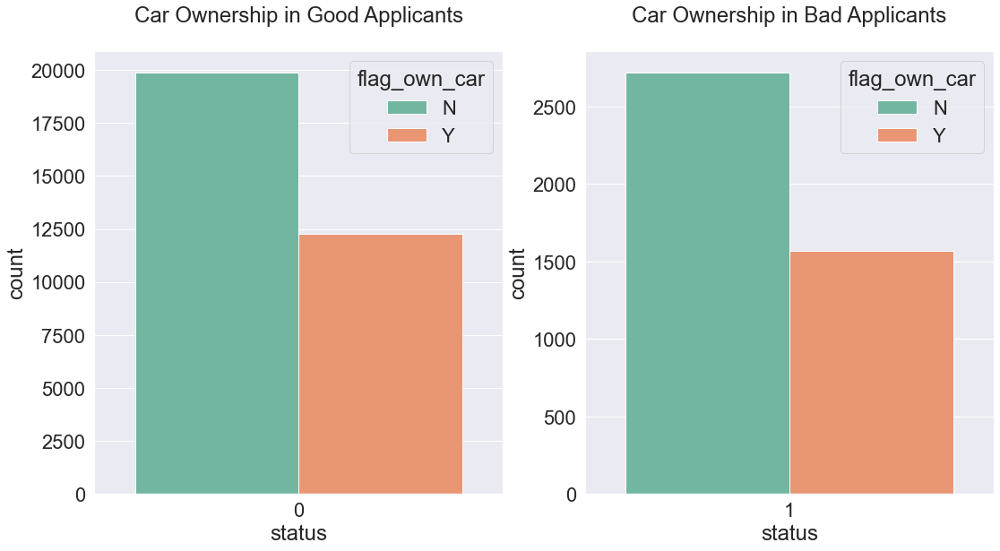

In [126]:
plt.figure(figsize = (18, 20))

plt.subplot(221)
sns.countplot(x = 'status', hue = 'flag_own_car', data = status0, palette = 'Set2')
plt.title("Car Ownership in Good Applicants\n")

plt.subplot(222)
sns.countplot(x = 'status', hue = 'flag_own_car', data = status1, palette = 'Set2')
plt.title("Car Ownership in Bad Applicants\n")

plt.show()

Insights:-

* 61.84% Without Car are Good applicants and 38.16% With Car are Good applicants.
* 63.44% Without Car are Bad applicants and 36.56% With Car are Bad applicants.

In [127]:
# Find the applicants count who don't own a car w.r.t. status

own_car_st_count = binary_df.groupby(["flag_own_car"])["status"].value_counts(normalize = False).reset_index(name = 'count')
own_car_st_count

,flag_own_car,status,count
0,N,0,19892
1,N,1,2722
2,Y,0,12274
3,Y,1,1569


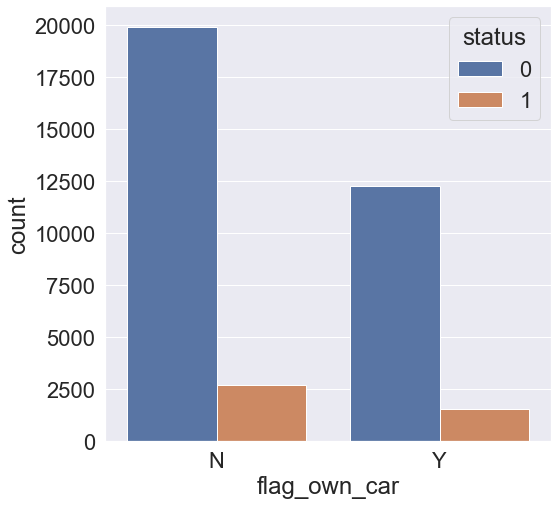

In [128]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_own_car", y = "count", hue = "status", data = own_car_st_count)
plt.show()

In [129]:
# Find the applicants count who don't own a car w.r.t. status

own_car_st_perc = binary_df.groupby(["flag_own_car"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
own_car_st_perc

,flag_own_car,status,perc
0,N,0,0.88
1,N,1,0.12
2,Y,0,0.89
3,Y,1,0.11


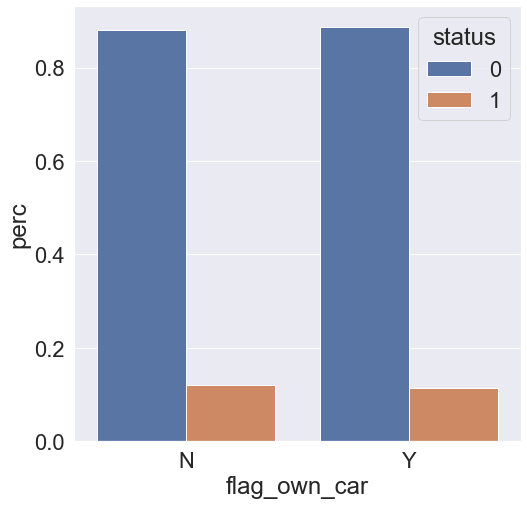

In [130]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_own_car", y = "perc", hue = "status", data = own_car_st_perc)
plt.show()

Analysis:-

    * 12.03% of the applicants who don't own the car are rejected.
    * 11.33% of the applicants who own the car are rejected.

In [131]:
# Find the applicants count who don't own a car w.r.t. gender

own_car_count = binary_df.groupby(["flag_own_car"])["code_gender"].value_counts(normalize = False).reset_index(name = 'count')
own_car_count

,flag_own_car,level_1,count
0,N,0,18160
1,N,1,4454
2,Y,1,7573
3,Y,0,6270


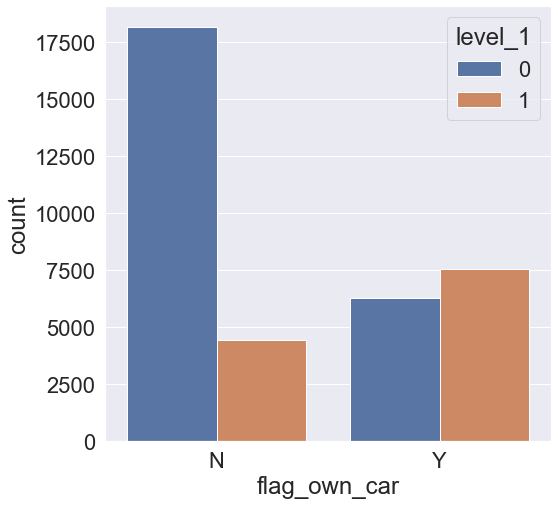

In [132]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_own_car", y = "count", hue = "level_1", data = own_car_count)
plt.show()

In [133]:
# Find the applicants percentage who don't own a car w.r.t. gender

own_car_perc = binary_df.groupby(["flag_own_car"])["code_gender"].value_counts(normalize = True).reset_index(name = 'perc')
own_car_perc

,flag_own_car,level_1,perc
0,N,0,0.80
1,N,1,0.20
2,Y,1,0.55
3,Y,0,0.45


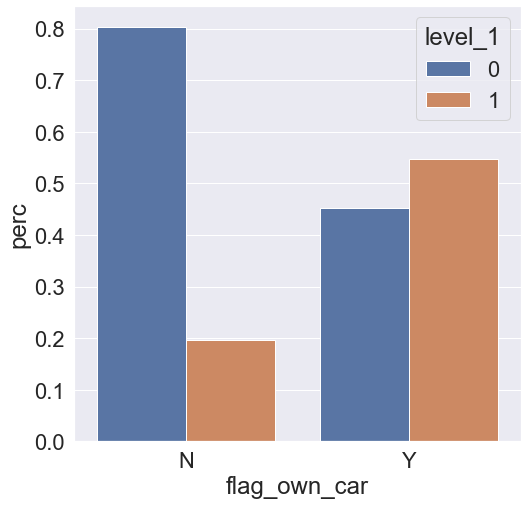

In [134]:
plt.subplots(figsize = (8,8))
sns.barplot(x = "flag_own_car", y = "perc", hue = "level_1", data = own_car_perc)
plt.show()

Analysis:-
    
    * Out of 22614 applicants who don't own a car - 80.30% are Females and 19.70% are Males
    * Similarly, out of 13843 applicants who own a car = 45.29% are Females and 54.70% are Males

In [135]:
# Find the applicants count who don't own a car w.r.t. status

own_car_gen_count = binary_df.groupby(["flag_own_car", 'code_gender'])["status"].value_counts(normalize = False).reset_index(name = 'count')
own_car_gen_count

,flag_own_car,code_gender,status,count
0,N,0,0,16059
1,N,0,1,2101
2,N,1,0,3833
3,N,1,1,621
4,Y,0,0,5613
5,Y,0,1,657
6,Y,1,0,6661
7,Y,1,1,912


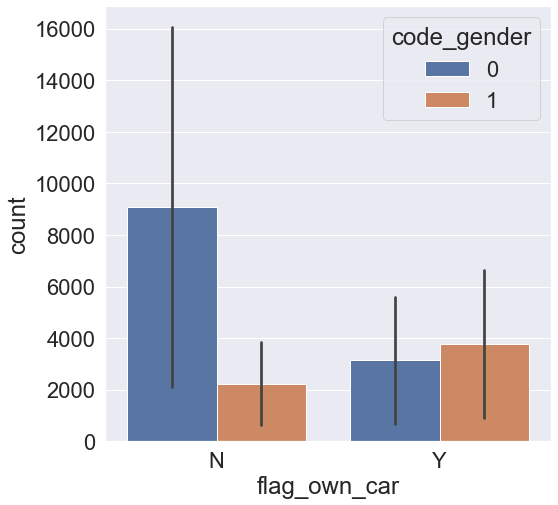

In [136]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_own_car", y = "count", hue = "code_gender", data = own_car_gen_count)
plt.show()

In [137]:
# Find the applicants percentage who don't own a car w.r.t. gender

own_car_gen_perc = binary_df.groupby(["flag_own_car", 'code_gender'])["status"].value_counts(normalize = True).reset_index(name = 'perc')
own_car_gen_perc

,flag_own_car,code_gender,status,perc
0,N,0,0,0.88
1,N,0,1,0.12
2,N,1,0,0.86
3,N,1,1,0.14
4,Y,0,0,0.90
5,Y,0,1,0.10
6,Y,1,0,0.88
7,Y,1,1,0.12


Analysis:-

    Applicants who don't own a car:
    * 11.56% of Females who don't own a car are rejected.
    * 13.94% of Males who don't own a car are rejected.
    
    Applicants who own a car:
    * 10.47% of Females who own a car are rejected.
    * 12.04% of applicants who own a car are rejected.

In [138]:
# Check the status count of rejection and acceptance on the basis of own_car

own_car_df = binary_df.groupby(["flag_own_car", 'status'])["status"].count()
own_car_df

flag_own_car  status
N             0         19892
              1          2722
Y             0         12274
              1          1569
Name: status, dtype: int64

In [139]:
# Total rejection count of applicants who don't own a car (N)

own_car_df_n = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_own_car == 'N']
own_car_df_n.shape[0]

2722

In [140]:
# Total rejection count of applicants who own a car (Y)

own_car_df_y = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_own_car == 'Y']
own_car_df_y.shape[0]

1569

In [141]:
# Total rejections

own_car_tot = own_car_df_n.shape[0] + own_car_df_y.shape[0]
own_car_tot

4291

In [142]:
# Total eligibles

own_car_df_n_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_own_car == 'N']
print("Total Eligible with No Car: " + str(own_car_df_n_eleg.shape[0]))

own_car_df_y_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_own_car == 'Y']
print("Total Eligible with a Car: " + str(own_car_df_y_eleg.shape[0]))

own_car_eleg = own_car_df_n_eleg.shape[0] + own_car_df_y_eleg.shape[0]
print("Total Eligible applicants : " + str(own_car_eleg))

Total Eligible with No Car: 19892
Total Eligible with a Car: 12274
Total Eligible applicants : 32166


In [143]:
# Percencatage of rejection of applicants with or without a car out of total rejections

print('There are ' + str(own_car_tot) + ' rejected applicants.')
print('Out of this:-')
print('Applicants without a car are', own_car_df_n.shape[0])
print('Applicants with a car are', own_car_df_y.shape[0], '\n')

print('Percentage of rejection of applicants without a car out of total rejections is', 
      str(round(own_car_df_n.shape[0] / own_car_tot * 100, 2)) + '%.')

print('Percentage of rejection of applicants with a car out of total rejections is', 
      str(round(own_car_df_y.shape[0] / own_car_tot * 100, 2)) + '%.', '\n', '\n')


print('There are ' + str(own_car_eleg) + ' eligible applicants.')
print('Out of this:-')
print('Applicants without a car are', own_car_df_n_eleg.shape[0])
print('Applicants with a car are', own_car_df_y_eleg.shape[0], '\n')

print('Percentage of applicants without a car out of total eligible applicants is', str(round(own_car_df_n_eleg.shape[0] / own_car_eleg * 100, 2)) + '%.')

print('Percentage of applicants with a car out of total eligible applicants is', str(round(own_car_df_y_eleg.shape[0] / own_car_eleg * 100, 2)) + '%.')


There are 4291 rejected applicants.
Out of this:-
Applicants without a car are 2722
Applicants with a car are 1569 

Percentage of rejection of applicants without a car out of total rejections is 63.44%.
Percentage of rejection of applicants with a car out of total rejections is 36.56%. 
 

There are 32166 eligible applicants.
Out of this:-
Applicants without a car are 19892
Applicants with a car are 12274 

Percentage of applicants without a car out of total eligible applicants is 61.84%.
Percentage of applicants with a car out of total eligible applicants is 38.16%.


In [144]:
pd.crosstab(binary_df['flag_own_car'], binary_df['status'], margins = True)

status,0,1,All
flag_own_car,,,
N,19892,2722,22614
Y,12274,1569,13843
All,32166,4291,36457


In [145]:
# Create a new dataframe of just own_car and then add status to it

own_car_tot_df = ['flag_own_car']
own_car_perc = binary_df[own_car_tot_df + ['status']].replace('Y', 1).replace('N', 0)

In [146]:
own_car_perc.head()

,flag_own_car,status
0,0,1
1,0,1
2,0,0
3,1,0
4,1,0


In [147]:
own_car_perc.value_counts()

flag_own_car  status
0             0         19892
1             0         12274
0             1          2722
1             1          1569
dtype: int64

In [148]:
dict_list = []
for flag_own_car in own_car_tot_df:
    for one_type in [0, 1]:
        dict_list.append({'feature': flag_own_car,
                          'type': one_type,
                          'reject_rate_percentage': round(len(own_car_perc[own_car_perc[flag_own_car] == one_type]
                                                        [own_car_perc.status == 1])
                                                       / len(own_car_perc[own_car_perc[flag_own_car] == one_type]) * 100, 2),
                          'count': len(own_car_perc[own_car_perc[flag_own_car] == one_type]),
                          'reject_count': len(own_car_perc[own_car_perc[flag_own_car] == one_type][own_car_perc.status == 1])
                         })

In [149]:
own_car_binary = pd.DataFrame.from_dict(dict_list)
own_car_binary

,feature,type,reject_rate_percentage,count,reject_count
0,flag_own_car,0,12.04,22614,2722
1,flag_own_car,1,11.33,13843,1569


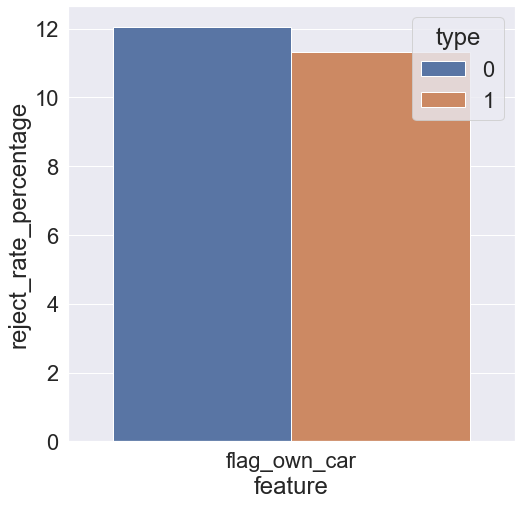

In [150]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "feature", y = "reject_rate_percentage", hue = "type", data = own_car_binary)
plt.show()

#### Observations:-

* Percentage as per not owning a car:-
    * Total applicants are 36457 and out of them 22614 applicants don't own a car.
    * It means that 62.03% of the applicants don't own a car.

    * Total applicants are 36457 and out of them 13843 applicants own a car.
    * It means that 37.97% of the applicants own a car.
    
    * Percentage of applicants without a car is HIGHER than those who own a car.
    
* Rejection rate as per car status:-   
    * 22614 applicants who don't own the car - 12.03% of the applicants are rejected.
    * 13843 applicants who own the car - 11.33% of the applicants are rejected.
    
    * Rejection rate of of applicants without a car is slightly HIGHER than those with a car.
    
* Percentage of car ownership status as per gender:-
    * Total applicants who don't own the car, out of it 80.30% are Females.
    * Total applicants who don't own the car, out of it 19.70% are Males.
    * Total applicants who own the car, out of it 45.29% are Females.
    * Total applicants who own the car, out of it 54.71% are the Males.
    
    * Males have the highest ownership of cars in comparison to Females.
    * But with regard to not owning a car there is a huge gap between the Males and Females with females at 80.30%.
    
* Rejection rate as per the car status on gender basis:-
    * Don't own the car:
        * 11.56% of the Females are rejected who don't own the car.
        * 13.94% of the Males are rejected who don't own the car.
    * Own the car:-
        * 10.47% of the Females are rejected who own the car.
        * 12.04% of the Males are rejected who own the car.
        
    * Here Males have HIGHER rejection rate as compared to Females who don't own the car.
    * And on owning a car, again Males have the HIGER rejection rate.
    
* Rejection rate as per rejected applicants:-
    * Total rejection of 'own_car' is of 4291 applicants out of the total records of 36457 applicants.
    * And percentage-wise it is 11.77%.
    
    * Applicants rejection percentage out of the total rejected applicants owning no car is 63.44%.
    * Whereas applicants rejection percentage out of the total rejected applicants owning a car is 36.56%.
    
    * Here, the rejection rate of applicants without a car is HIGHER than that of the applicants owning a car.

* We can clearly see that the REJECTION RATE OF APPLICANTS is HIGHER if they don't own a car and this impact the Males more than   the Females.

In [151]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [152]:
# Convert the categories of 'flag_own_car' variable back from 'Y's and 'N's to '1's and '0's
# Where Y = 1 and
# N = 0

binary_df['flag_own_car'] = binary_df['flag_own_car'].replace('Y', 1).replace('N', 0)
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


#### flag_own_realty Analysis

In [153]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [154]:
binary_df.flag_own_realty.value_counts()

Y    24506
N    11951
Name: flag_own_realty, dtype: int64

Analysis:-
    
* Out of the 36457 applicants:-
    * 24506 applicants own a property
    * 11951 applicants don't own a property

<AxesSubplot:xlabel='flag_own_realty', ylabel='count'>

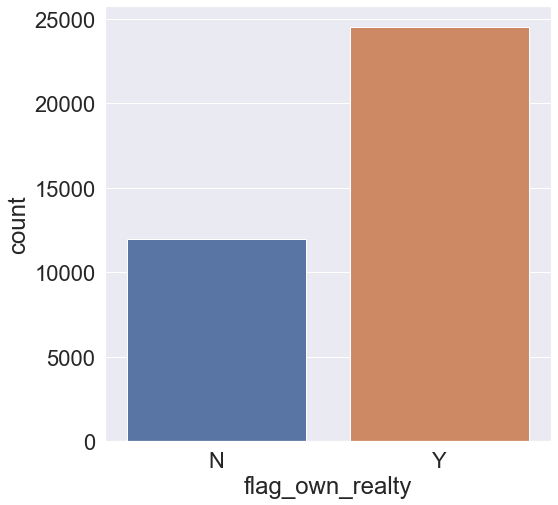

In [155]:
# Total Yes and No own_realty distribution

plt.subplots(figsize = (8, 8))
sns.countplot(binary_df['flag_own_realty'])

In [156]:
# Use crosstabs

pd.crosstab(binary_df['flag_own_realty'], binary_df['status'], margins = True)

status,0,1,All
flag_own_realty,,,
N,10390,1561,11951
Y,21776,2730,24506
All,32166,4291,36457


In [157]:
# Find the applicants count who don't own a property w.r.t. status

own_prop_st_count = binary_df.groupby(["flag_own_realty"])["status"].value_counts(normalize = False).reset_index(name = 'count')
own_prop_st_count

,flag_own_realty,status,count
0,N,0,10390
1,N,1,1561
2,Y,0,21776
3,Y,1,2730


Analysis:-

* 1561 pplicants without property are rejected.
* 2730 applicants with property are rejected.

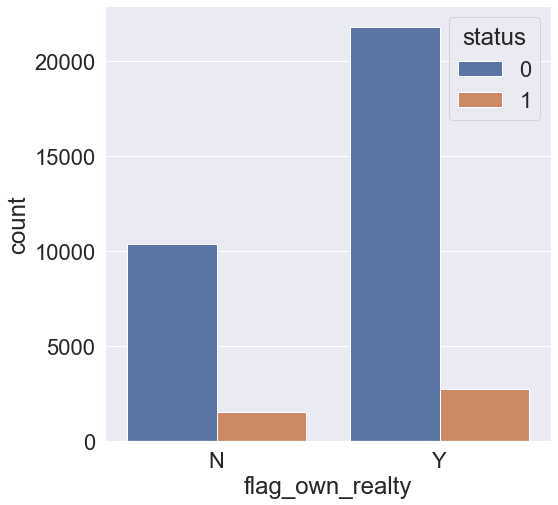

In [158]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_own_realty", y = "count", hue = "status", data = own_prop_st_count)
plt.show()

In [159]:
# Find the applicants percentage who don't own a car w.r.t. status

own_prop_st_perc = binary_df.groupby(["flag_own_realty"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
own_prop_st_perc

,flag_own_realty,status,perc
0,N,0,0.87
1,N,1,0.13
2,Y,0,0.89
3,Y,1,0.11


Analysis:-


* 13.06% of the applicants without property are rejected.
* 11.14% of the applicants with property are rejected.

* The difference between the 2 is merely 1.92%.

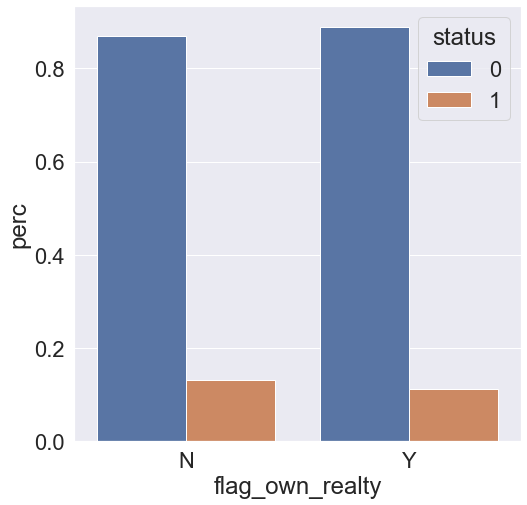

In [160]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_own_realty", y = "perc", hue = "status", data = own_prop_st_perc)
plt.show()

In [161]:
# Find the applicants count who don't own a car w.r.t. gender

own_prop_gen_count = binary_df.groupby(["flag_own_realty"])["code_gender"].value_counts(normalize = False).reset_index(name = 'count')
own_prop_gen_count

,flag_own_realty,level_1,count
0,N,0,7600
1,N,1,4351
2,Y,0,16830
3,Y,1,7676


In [162]:
# Find the applicants percentage who don't own a car w.r.t. gender

own_prop_gen_perc = binary_df.groupby(["flag_own_realty"])["code_gender"].value_counts(normalize = True).reset_index(name = 'perc')
own_prop_gen_perc

,flag_own_realty,level_1,perc
0,N,0,0.64
1,N,1,0.36
2,Y,0,0.69
3,Y,1,0.31


In [163]:
# Find the applicants count who don't own a property w.r.t. gender and rejected as per the status

own_prop_count = binary_df.groupby(["flag_own_realty", 'code_gender'])["status"].value_counts(normalize = False).reset_index(name = 'count')
own_prop_count

,flag_own_realty,code_gender,status,count
0,N,0,0,6650
1,N,0,1,950
2,N,1,0,3740
3,N,1,1,611
4,Y,0,0,15022
5,Y,0,1,1808
6,Y,1,0,6754
7,Y,1,1,922


Analysis:-

* 950 Female applicants without property are rejected.
* 611 Male applicants without property are rejected.

* 1808 Female applicants with property are rejected.
* 922 Male applicants with property are rejected.

In [164]:
# Find the applicants percentage who don't own a property w.r.t. gender and rejected as per the status

own_prop_perc = binary_df.groupby(["flag_own_realty", 'code_gender'])["status"].value_counts(normalize = True).reset_index(name = 'perc')
own_prop_perc

,flag_own_realty,code_gender,status,perc
0,N,0,0,0.88
1,N,0,1,0.12
2,N,1,0,0.86
3,N,1,1,0.14
4,Y,0,0,0.89
5,Y,0,1,0.11
6,Y,1,0,0.88
7,Y,1,1,0.12


Analysis:-

* 12.50% of Female applicants without property are rejected.
* 14.04% of Male applicants without property are rejected.

* 10.74% of Female applicants with property are rejected.
* 12.01% of Male applicants with property are rejected.

* There is a HIGHER rejection rate in case of male applicants as compared to female applicants. But having a property reduces the rejection rate by 2% approx in both the male and female applicants.

In [165]:
# Check the status count of rejection and acceptance on the basis of own_property

own_prop_df = binary_df.groupby(["flag_own_realty", 'status'])["status"].count()
own_prop_df

flag_own_realty  status
N                0         10390
                 1          1561
Y                0         21776
                 1          2730
Name: status, dtype: int64

In [166]:
# Total rejection count of applicants who don't own a property (N)

own_prop_df_n = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_own_realty == 'N']
own_prop_df_n.shape[0]

1561

In [167]:
# Total rejection count of applicants who own a property (Y)

own_prop_df_y = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_own_realty == 'Y']
own_prop_df_y.shape[0]

2730

In [168]:
# Total rejections

own_prop_tot = own_prop_df_n.shape[0] + own_prop_df_y.shape[0]
own_prop_tot

4291

In [169]:
# Total eligibles

own_prop_df_n_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_own_realty == 'N']
print("Total Eligible without a property: " + str(own_prop_df_n_eleg.shape[0]))

own_prop_df_y_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_own_realty == 'Y']
print("Total Eligible with a property: " + str(own_prop_df_y_eleg.shape[0]))

own_prop_eleg = own_prop_df_n_eleg.shape[0] + own_prop_df_y_eleg.shape[0]
print("Total Eligible applicants : " + str(own_prop_eleg))

Total Eligible without a property: 10390
Total Eligible with a property: 21776
Total Eligible applicants : 32166


In [170]:
# Percencatage of rejection of applicants with or without a property out of total rejections

print('There are ' + str(own_prop_tot) + ' rejected applicants.')
print('Out of this:-')
print('Applicants without a property are', own_prop_df_n.shape[0])
print('Applicants with a property are', own_prop_df_y.shape[0], '\n')

print('Percentage of rejection of applicants without a property out of total rejections is', 
      str(round(own_prop_df_n.shape[0]/own_prop_tot * 100, 2)) + '%.')

print('Percentage of rejection of applicants with a property out of total rejections is', 
      str(round(own_prop_df_y.shape[0]/own_prop_tot * 100, 2)) + '%.', '\n', '\n')


print('There are ' + str(own_prop_eleg) + ' eligible applicants.')
print('Out of this:-')
print('Applicants without a property are', own_prop_df_n_eleg.shape[0])
print('Applicants with a property are', own_prop_df_y_eleg.shape[0], '\n')

print('Percentage of eligibility of applicants without a property out of total eligibles is', str(round(own_prop_df_n_eleg.shape[0] / own_prop_eleg * 100, 2)) + '%.')

print('Percentage of eligibility of applicants with a property out of total eligibles is', str(round(own_prop_df_y_eleg.shape[0] / own_prop_eleg * 100, 2)) + '%.')


There are 4291 rejected applicants.
Out of this:-
Applicants without a property are 1561
Applicants with a property are 2730 

Percentage of rejection of applicants without a property out of total rejections is 36.38%.
Percentage of rejection of applicants with a property out of total rejections is 63.62%. 
 

There are 32166 eligible applicants.
Out of this:-
Applicants without a property are 10390
Applicants with a property are 21776 

Percentage of eligibility of applicants without a property out of total eligibles is 32.3%.
Percentage of eligibility of applicants with a property out of total eligibles is 67.7%.


Analysis:-
    
    * A strange thing to note from the above observation is that applicants who own a property consists of 63.62% of the rejections out of the total rejections count.

In [171]:
pd.crosstab(binary_df['flag_own_realty'], binary_df['status'], margins = True)

status,0,1,All
flag_own_realty,,,
N,10390,1561,11951
Y,21776,2730,24506
All,32166,4291,36457


In [172]:
# Create a new dataframe of just own_property and then add status to it
# Also replace 'Y's and 'N's with '1's and '0's in the own_property column

own_prop_tot_df = ['flag_own_realty']
own_prop_perc = binary_df[own_prop_tot_df + ['status']].replace('Y', 1).replace('N', 0)

In [173]:
own_prop_perc.head()

,flag_own_realty,status
0,0,1
1,0,1
2,1,0
3,1,0
4,1,0


In [174]:
own_prop_perc.value_counts()

flag_own_realty  status
1                0         21776
0                0         10390
1                1          2730
0                1          1561
dtype: int64

In [175]:
dict_list = []
for flag_own_realty in own_prop_tot_df:
    for one_type in [0, 1]:
        dict_list.append({'feature': flag_own_realty,
                          'type': one_type,
                          'reject_rate_percentage': round(len(own_prop_perc[own_prop_perc[flag_own_realty] == one_type]
                                                        [own_prop_perc.status == 1])
                                                       / len(own_prop_perc[own_prop_perc[flag_own_realty] == one_type]) * 100, 2),
                          'count': len(own_prop_perc[own_prop_perc[flag_own_realty] == one_type]),
                          'reject_count': len(own_prop_perc[own_prop_perc[flag_own_realty] == one_type][own_prop_perc.status == 1])
                         })

In [176]:
own_prop_binary = pd.DataFrame.from_dict(dict_list)
own_prop_binary

,feature,type,reject_rate_percentage,count,reject_count
0,flag_own_realty,0,13.06,11951,1561
1,flag_own_realty,1,11.14,24506,2730


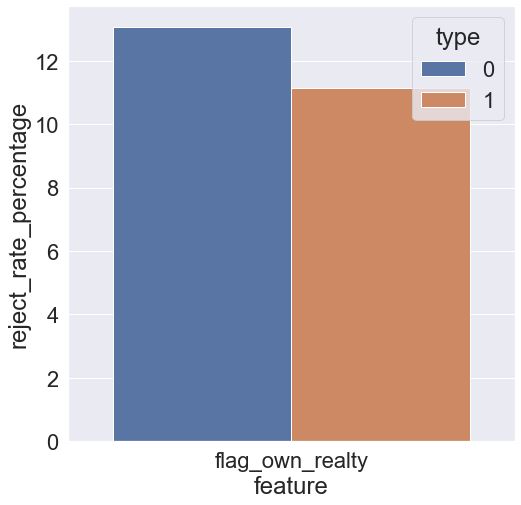

In [177]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "feature", y = "reject_rate_percentage", hue = "type", data = own_prop_binary)
plt.show()

#### Observations:-

* Percentage as per not owning a property:-
    * Total applicants are 36457 and out of them 11951 applicants don't own a property.
    * It means that 32.78% of the applicants don't own a property.

    * Total applicants are 36457 and out of them 24506 applicants own a property.
    * It means that 67.22% of the applicants own a property.
    
    * Percentage of applicants with a property is HIGHER than those who don't own a property.
    
* Rejection rate as per property status:-   
    * 11951 applicants who don't own the property - 13.06% of the applicants are rejected.
    * 24506 applicants who own the property - 11.14% of the applicants are rejected.
    
    * Rejection rate of the applicants without a property is HIGHER than those with a property.
    
* Percentage of property ownership status as per gender:-
    * Total applicants who don't own the property, out of it 63.59% are Females.
    * Total applicants who don't own the property, out of it 36.41% are Males.
    * Total applicants who own the property, out of it 68.68% are Females.
    * Total applicants who own the property, out of it 31.32% are the Males.
    
    * Females have the highest ownership of property in comparison to Males.
    * But with regard to not owning a property Females again has the HIGHEST percentage.
    
* Rejection rate as per the property status on gender basis:-
    * Don't own the property:
        * 12.50% of the Females are rejected who don't own the property.
        * 14.04% of the Males are rejected who don't own the property.
    * Own the property:-
        * 10.74% of the Females are rejected who own the property.
        * 12.01% of the Males are rejected who own the property.
        
    * Here Males have HIGHER rejection rate as compared to Females who don't own the property.
    * And on owning a property, again Males have the HIGER rejection rate.
    
* Rejection rate as per rejected applicants:-
    * Total rejection of 'own_property' is of 4291 applicants out of the total records of 36457 applicants.
    * And percentage-wise it is 11.77%.
    
    * Applicants rejection percentage out of the total rejected applicants owning no property is 36.38%.
    * Whereas applicants rejection percentage out of the total rejected applicants owning a property is 63.62%.
    
    * Here, the rejection rate of applicants with a property is HIGHER than that of the applicants not owning a property.

* We can clearly see that the REJECTION RATE OF APPLICANTS is HIGHER if they own a property and this impact the Males more than the Females.

In [178]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [179]:
# Convert the categories of 'flag_own_realty' variable back from 'Y's and 'N's to '1's and '0's
# Where Y = 1 and
# N = 0

binary_df['flag_own_realty'] = binary_df['flag_own_realty'].replace('Y', 1).replace('N', 0)
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


#### Work Phone Analysis

In [180]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [181]:
binary_df.flag_work_phone.value_counts()

0    28235
1     8222
Name: flag_work_phone, dtype: int64

In [182]:
binary_df.flag_work_phone.value_counts(normalize = True)

0   0.77
1   0.23
Name: flag_work_phone, dtype: float64

Analysis:-
    
* Out of the 36457 applicants:-
    * 28235 applicants don't own a work phone which consists of 77.44%
    * 8222 applicants own a work phone which consists of 22.56%

<AxesSubplot:xlabel='flag_work_phone', ylabel='count'>

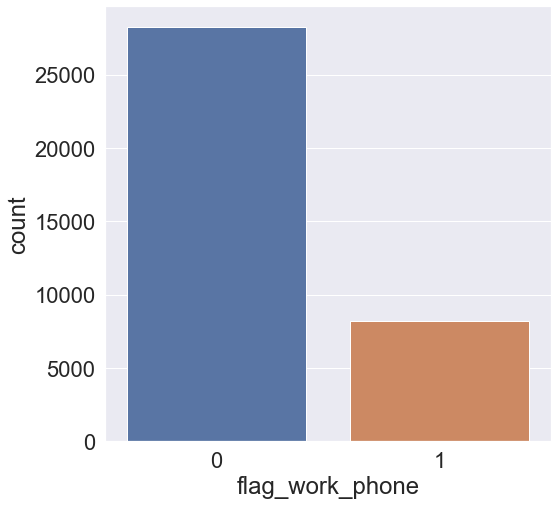

In [183]:
# Total Yes and No own_car distribution

plt.subplots(figsize = (8, 8))
sns.countplot(binary_df['flag_work_phone'])

In [184]:
# Use crosstabs

pd.crosstab(binary_df['flag_work_phone'], binary_df['status'], margins = True)

status,0,1,All
flag_work_phone,,,
0,24911,3324,28235
1,7255,967,8222
All,32166,4291,36457


In [185]:
# Find the applicants count who don't own a work phone w.r.t. status

wp_st_count = binary_df.groupby(["flag_work_phone"])["status"].value_counts(normalize = False).reset_index(name = 'count')
wp_st_count

,flag_work_phone,status,count
0,0,0,24911
1,0,1,3324
2,1,0,7255
3,1,1,967


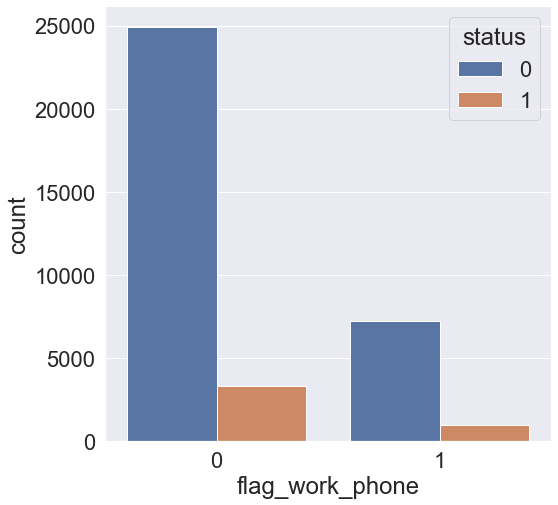

In [186]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_work_phone", y = "count", hue = "status", data = wp_st_count)
plt.show()

In [187]:
# Find the applicants percentage who don't own a work phone w.r.t. status

wp_st_perc = binary_df.groupby(["flag_work_phone"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
wp_st_perc

,flag_work_phone,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.88
3,1,1,0.12


Analysis:-
    
    * 11.77% of applicants are rejected for not having a work phone.
    * 11.76% of applicants are rejected for having a work phone.
    
* As per the above observation work phone doesn't seem to have any impact on the rejection of the applicants.

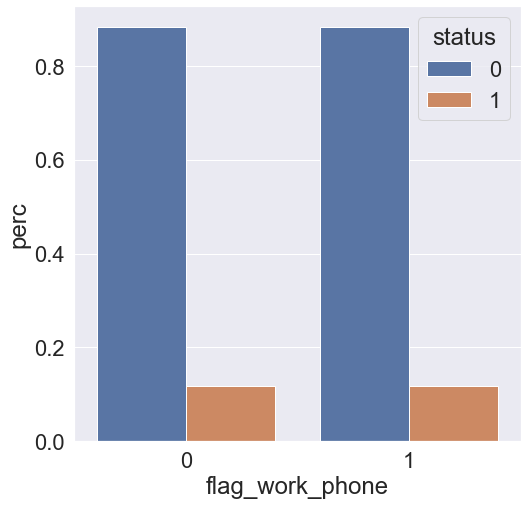

In [188]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_work_phone", y = "perc", hue = "status", data = wp_st_perc)
plt.show()

In [189]:
# Find the applicants count who don't own a work phone w.r.t. gender

wp_count = binary_df.groupby(["flag_work_phone"])["code_gender"].value_counts(normalize = False).reset_index(name = 'count')
wp_count

,flag_work_phone,level_1,count
0,0,0,19386
1,0,1,8849
2,1,0,5044
3,1,1,3178


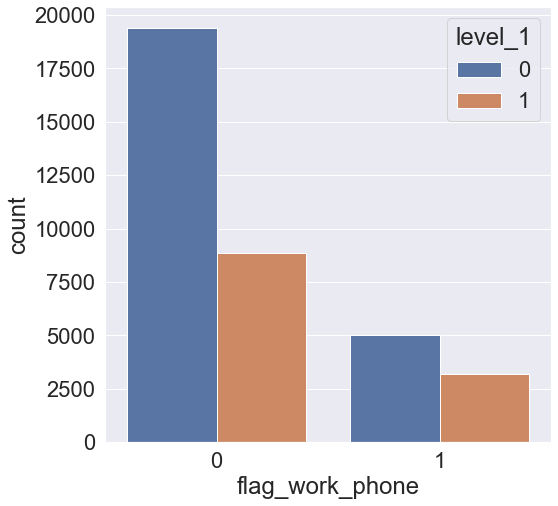

In [190]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_work_phone", y = "count", hue = "level_1", data = wp_count)
plt.show()

In [191]:
# Find the applicants percentage who don't own a work phone w.r.t. gender

wp_perc = binary_df.groupby(["flag_work_phone"])["code_gender"].value_counts(normalize = True).reset_index(name = 'perc')
wp_perc

,flag_work_phone,level_1,perc
0,0,0,0.69
1,0,1,0.31
2,1,0,0.61
3,1,1,0.39


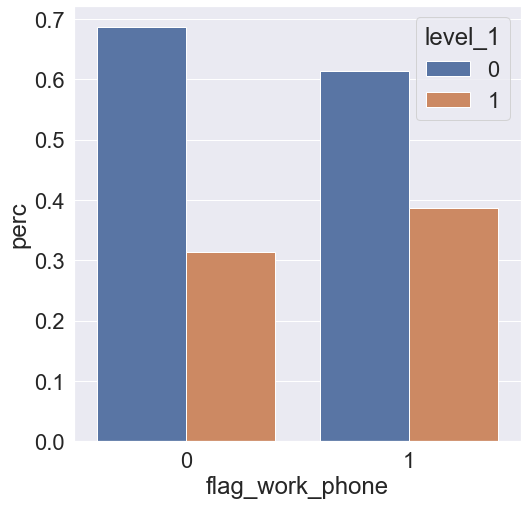

In [192]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_work_phone", y = "perc", hue = "level_1", data = wp_perc)
plt.show()

Analysis:-
    
    * Out of 28235 applicants who don't own a work phone - 68.66% are Females and 31.34% are Males
    * Similarly, out of 8222 applicants who own a work phone = 61.35% are Females and 38.65% are Males

In [193]:
# Find the applicants count who don't own a work phone w.r.t. status and gender

wp_gen_count = binary_df.groupby(["flag_work_phone", 'code_gender'])["status"].value_counts(normalize = False).reset_index(name = 'count')
wp_gen_count

,flag_work_phone,code_gender,status,count
0,0,0,0,17201
1,0,0,1,2185
2,0,1,0,7710
3,0,1,1,1139
4,1,0,0,4471
5,1,0,1,573
6,1,1,0,2784
7,1,1,1,394


In [194]:
# Find the applicants percentage who don't own a work phone w.r.t. status and gender

wp_gen_perc = binary_df.groupby(["flag_work_phone", 'code_gender'])["status"].value_counts(normalize = True).reset_index(name = 'perc')
wp_gen_perc

,flag_work_phone,code_gender,status,perc
0,0,0,0,0.89
1,0,0,1,0.11
2,0,1,0,0.87
3,0,1,1,0.13
4,1,0,0,0.89
5,1,0,1,0.11
6,1,1,0,0.88
7,1,1,1,0.12


Analysis:-

    Applicants who don't own a work phone:
        * 11.27% of Females who don't own a work phone are rejected.
        * 12.87% of Males who don't own a work phone are rejected.

    Applicants who own a work phone:
        * 11.36% of Females who own a work phone are rejected.
        * 12.40% of applicants who own a work phone are rejected.

In [195]:
# Check the status count of rejection and acceptance on the basis of work_phone

wp_df = binary_df.groupby(["flag_work_phone", 'status'])["status"].count()
wp_df

flag_work_phone  status
0                0         24911
                 1          3324
1                0          7255
                 1           967
Name: status, dtype: int64

In [196]:
# Total rejection count of applicants who don't own a work_phone (N)

wp_df_n = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_work_phone == 0]
wp_df_n.shape[0]

3324

In [197]:
# Total rejection count of applicants who own a work_phone (Y)

wp_df_y = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_work_phone == 1]
wp_df_y.shape[0]

967

In [198]:
# Total rejections

wp_tot = wp_df_n.shape[0] + wp_df_y.shape[0]
wp_tot

4291

In [199]:
# Total eligibles

wp_df_n_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_work_phone == 0]
print("Total Eligible applicants without a work phone: " + str(wp_df_n_eleg.shape[0]))

wp_df_y_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_work_phone == 1]
print("Total Eligible applicants with a work phone: " + str(wp_df_y_eleg.shape[0]))

wp_eleg = wp_df_n_eleg.shape[0] + wp_df_y_eleg.shape[0]
print("Total Eligible applicants : " + str(wp_eleg))

Total Eligible applicants without a work phone: 24911
Total Eligible applicants with a work phone: 7255
Total Eligible applicants : 32166


In [200]:
# Percencatage of rejection of applicants with or without a work phone out of total rejections

print('There are ' + str(wp_tot) + ' rejected applicants.')
print('Out of this:-')
print('Applicants without a work phone are', wp_df_n.shape[0])
print('Applicants with a work phone are', wp_df_y.shape[0], '\n')

print('Percentage of rejection of applicants without a work phone out of total rejections is', 
      str(round(wp_df_n.shape[0]/wp_tot * 100, 2)) + '%.')

print('Percentage of rejection of applicants with a work phone out of total rejections is', 
      str(round(wp_df_y.shape[0]/wp_tot * 100, 2)) + '%.', '\n', '\n')


print('There are ' + str(wp_eleg) + ' eligible applicants.')
print('Out of this:-')
print('Applicants without a work phone are', wp_df_n_eleg.shape[0])
print('Applicants with a work phone are', wp_df_y_eleg.shape[0], '\n')

print('Percentage of eligibility of applicants without a work phone out of total eligibles is', str(round(wp_df_n_eleg.shape[0] / wp_eleg * 100, 2)) + '%.')

print('Percentage of eligibility of applicants with a work phone out of total eligibles is', str(round(wp_df_y_eleg.shape[0] / wp_eleg * 100, 2)) + '%.')

There are 4291 rejected applicants.
Out of this:-
Applicants without a work phone are 3324
Applicants with a work phone are 967 

Percentage of rejection of applicants without a work phone out of total rejections is 77.46%.
Percentage of rejection of applicants with a work phone out of total rejections is 22.54%. 
 

There are 32166 eligible applicants.
Out of this:-
Applicants without a work phone are 24911
Applicants with a work phone are 7255 

Percentage of eligibility of applicants without a work phone out of total eligibles is 77.45%.
Percentage of eligibility of applicants with a work phone out of total eligibles is 22.55%.


In [201]:
pd.crosstab(binary_df['flag_work_phone'], binary_df['status'], margins = True)

status,0,1,All
flag_work_phone,,,
0,24911,3324,28235
1,7255,967,8222
All,32166,4291,36457


In [202]:
# Create a new dataframe of just work_phone and then add status to it

wp_tot_df = ['flag_work_phone']
wp_df_perc = binary_df[wp_tot_df + ['status']]

In [203]:
wp_df_perc.head()

,flag_work_phone,status
0,1,1
1,1,1
2,1,0
3,0,0
4,0,0


In [204]:
wp_df_perc.value_counts()

flag_work_phone  status
0                0         24911
1                0          7255
0                1          3324
1                1           967
dtype: int64

In [205]:
dict_list = []
for flag_work_phone in wp_tot_df:
    for one_type in [0, 1]:
        dict_list.append({'feature': flag_work_phone,
                          'type': one_type,
                          'reject_rate_percentage': round(len(wp_df_perc[wp_df_perc[flag_work_phone] == one_type]
                                                        [wp_df_perc.status == 1])
                                                       / len(wp_df_perc[wp_df_perc[flag_work_phone] == one_type]) * 100, 2),
                          'count': len(wp_df_perc[wp_df_perc[flag_work_phone] == one_type]),
                          'reject_count': len(wp_df_perc[wp_df_perc[flag_work_phone] == one_type][wp_df_perc.status == 1])
                         })

In [206]:
wp_binary = pd.DataFrame.from_dict(dict_list)
wp_binary

,feature,type,reject_rate_percentage,count,reject_count
0,flag_work_phone,0,11.77,28235,3324
1,flag_work_phone,1,11.76,8222,967


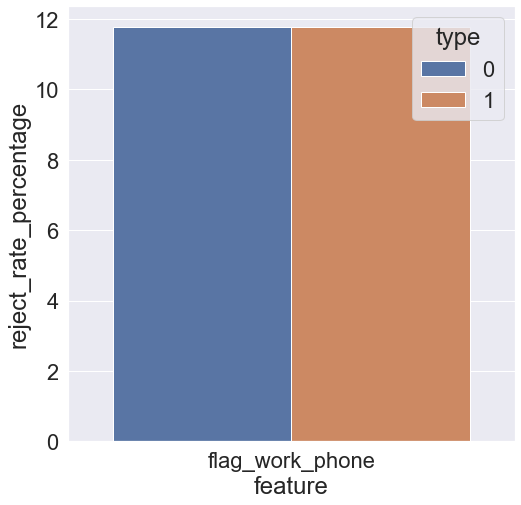

In [207]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "feature", y = "reject_rate_percentage", hue = "type", data = wp_binary)
plt.show()

#### Observations:-

* Percentage as per not owning a work phone:-
    * Total applicants are 36457 and out of them 28235 applicants don't own a work phone.
    * It means that 77.44% of the applicants don't own a work phone.

    * Total applicants are 36457 and out of them 8222 applicants own a work phone.
    * It means that 22.56% of the applicants own a work phone.
    
    * Percentage of applicants without a work phone is HIGHER than those who own a work phone.
    
* Rejection rate as per work phone status:-   
    * 28235 applicants who don't own the work phone - 11.77% of the applicants are rejected.
    * 8222 applicants who own the work phone - 11.76% of the applicants are rejected.
    
    * Rejection rate of the applicants with or without a work phone is exactly the same.
    
* Percentage of work phone ownership status as per gender:-
    * Total applicants who don't own the work phone, out of it 68.66% are Females.
    * Total applicants who don't own the work phone, out of it 31.34% are Males.
    * Total applicants who own the work phone, out of it 61.35% are Females.
    * Total applicants who own the work phone, out of it 38.65% are the Males.
    
    * Females have the highest ownership of work phone in comparison to Males.
    * But with regard to not owning a work phone Females again has the HIGHEST percentage.
    
* Rejection rate as per the work phone status on gender basis:-
    * Don't own the work phone:
        * 11.27% of the Females are rejected who don't own the work phone.
        * 12.87% of the Males are rejected who don't own the work phone.
    * Own the work phone:-
        * 11.36% of the Females are rejected who own the work phone.
        * 12.40% of the Males are rejected who own the work phone.
        
    * Here Males have HIGHER rejection rate as compared to Females who don't own the work phone.
    * And on owning a work phone, again Males have the HIGER rejection rate.
    * But there is hardly any variation in the rejection rates of both males and females on whether they own the work phone or don't own the work phone.
    
* Rejection rate as per rejected applicants:-
    * Total rejection of 'work_phone' is of 4291 applicants out of the total records of 36457 applicants.
    * And percentage-wise it is 11.77%.
    
    * Applicants rejection percentage out of the total rejected applicants owning no work phone is 77.46%.
    * Whereas applicants rejection percentage out of the total rejected applicants owning a work phone is 22.54%.
    
    * Here, the rejection rate of applicants without a work phone is much HIGHER than that of the applicants owning a work phone.

* Overall, we can clearly see that the REJECTION RATE OF APPLICANTS is not impacted with or without the work phone.

In [208]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


#### Phone Analysis

In [209]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [210]:
binary_df.flag_phone.value_counts()

0    25709
1    10748
Name: flag_phone, dtype: int64

In [211]:
binary_df.flag_phone.value_counts(normalize = True)

0   0.71
1   0.29
Name: flag_phone, dtype: float64

Analysis:-

* Out of the 36457 applicants:-
* 25709 applicants don't own a phone which consists of 70.52%
* 10748 applicants own a phone which consists of 29.48%

In [212]:
# Use crosstabs

pd.crosstab(binary_df['flag_phone'], binary_df['status'], margins = True)

status,0,1,All
flag_phone,,,
0,22649,3060,25709
1,9517,1231,10748
All,32166,4291,36457


<AxesSubplot:xlabel='flag_phone', ylabel='count'>

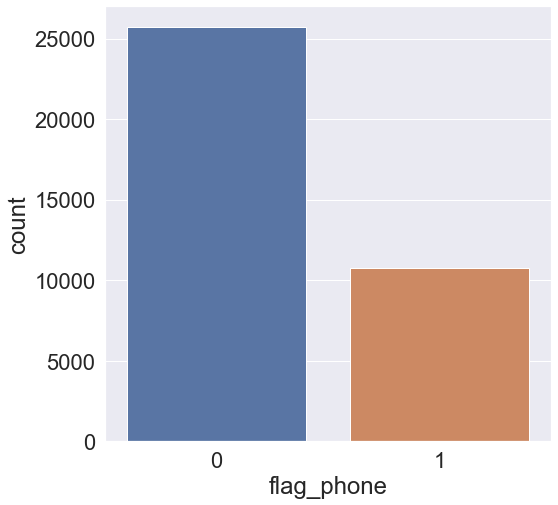

In [213]:
# Total Male and Female gender distribution

plt.subplots(figsize = (8, 8))
sns.countplot(binary_df['flag_phone'])

In [214]:
# Find the applicants count who don't own a phone w.r.t. status

ph_st_count = binary_df.groupby(["flag_phone"])["status"].value_counts(normalize = False).reset_index(name = 'count')
ph_st_count

,flag_phone,status,count
0,0,0,22649
1,0,1,3060
2,1,0,9517
3,1,1,1231


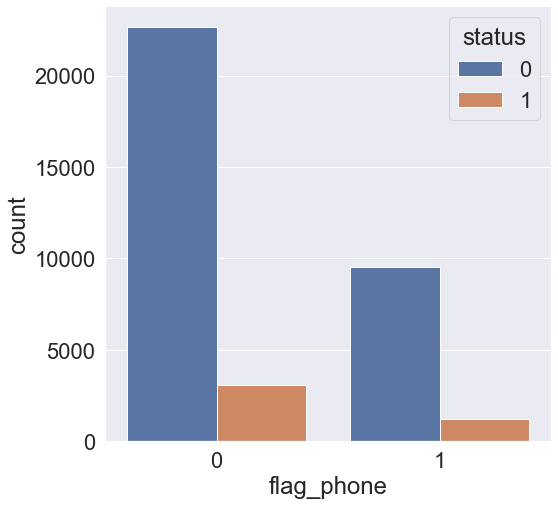

In [215]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_phone", y = "count", hue = "status", data = ph_st_count)
plt.show()

In [216]:
# Find the applicants percentage who don't own a phone w.r.t. status

ph_st_perc = binary_df.groupby(["flag_phone"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
ph_st_perc

,flag_phone,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.89
3,1,1,0.11


Analysis:-

* 11.90% of the applicants who don't own the phone are rejected.
* 11.45% of the applicants who own the phone are rejected.

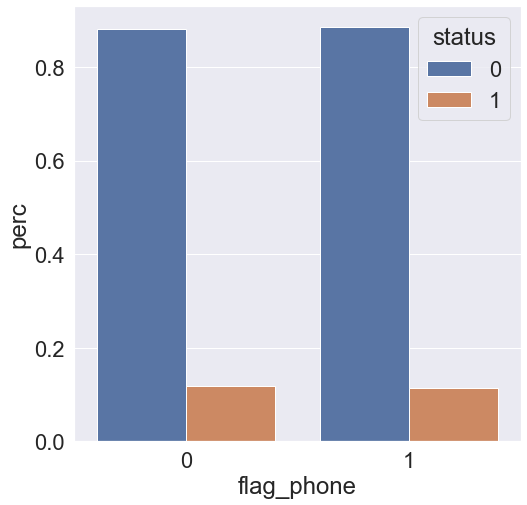

In [217]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_phone", y = "perc", hue = "status", data = ph_st_perc)
plt.show()

In [218]:
# Find the applicants count who don't own a phone w.r.t. gender

ph_count = binary_df.groupby(["flag_phone"])["code_gender"].value_counts(normalize = False).reset_index(name = 'count')
ph_count

,flag_phone,level_1,count
0,0,0,17018
1,0,1,8691
2,1,0,7412
3,1,1,3336


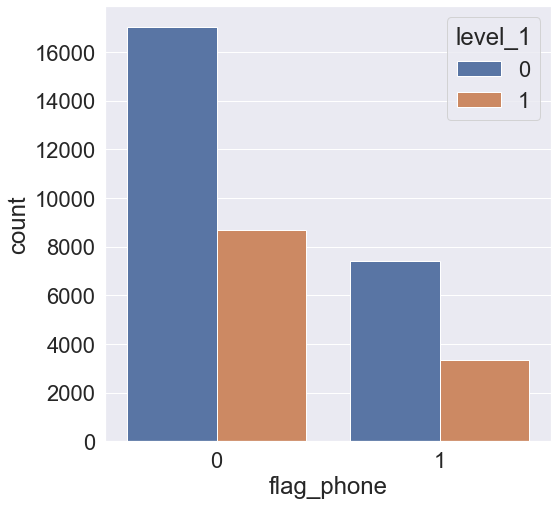

In [219]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_phone", y = "count", hue = "level_1", data = ph_count)
plt.show()

In [220]:
# Find the applicants percentage who don't own a phone w.r.t. gender

ph_perc = binary_df.groupby(["flag_phone"])["code_gender"].value_counts(normalize = True).reset_index(name = 'perc')
ph_perc

,flag_phone,level_1,perc
0,0,0,0.66
1,0,1,0.34
2,1,0,0.69
3,1,1,0.31


Analysis:-

* Out of 22709 applicants who don't own a phone - 66.19% are Females and 33.80% are Males
* Similarly, out of 10748 applicants who own a phone - 68.96% are Females and 31.03% are Males

In [221]:
# Find the applicants count who don't own a phone w.r.t. status and gender

ph_gen_count = binary_df.groupby(["flag_phone", 'code_gender'])["status"].value_counts(normalize = False).reset_index(name = 'count')
ph_gen_count

,flag_phone,code_gender,status,count
0,0,0,0,15048
1,0,0,1,1970
2,0,1,0,7601
3,0,1,1,1090
4,1,0,0,6624
5,1,0,1,788
6,1,1,0,2893
7,1,1,1,443


In [222]:
# Find the applicants percentage who don't own a phone w.r.t. status and gender

ph_gen_perc = binary_df.groupby(["flag_phone", 'code_gender'])["status"].value_counts(normalize = True).reset_index(name = 'perc')
ph_gen_perc

,flag_phone,code_gender,status,perc
0,0,0,0,0.88
1,0,0,1,0.12
2,0,1,0,0.87
3,0,1,1,0.13
4,1,0,0,0.89
5,1,0,1,0.11
6,1,1,0,0.87
7,1,1,1,0.13


Analysis:-

    Applicants who don't own a phone:
        * 11.57% of Females who don't own a phone are rejected.
        * 12.54% of Males who don't own a phone are rejected.

    Applicants who own a phone:
        * 10.63% of Females who own a phone are rejected.
        * 13.27% of applicants who own a phone are rejected.

In [223]:
# Check the phone count of rejection and acceptance on the basis of status

ph_df = binary_df.groupby(["flag_phone", 'status'])["status"].count()
ph_df

flag_phone  status
0           0         22649
            1          3060
1           0          9517
            1          1231
Name: status, dtype: int64

In [224]:
# Check the phone percentage of rejection and acceptance on the basis of status

ph_df = binary_df.groupby(["flag_phone"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
ph_df

,flag_phone,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.89
3,1,1,0.11


In [225]:
# Total rejection count of applicants who don't own a phone (N)

ph_df_n = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_phone == 0]
ph_df_n.shape[0]

3060

In [226]:
# Total rejection count of applicants who own a phone (Y)

ph_df_y = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_phone == 1]
ph_df_y.shape[0]

1231

In [227]:
# Total rejections

ph_tot = ph_df_n.shape[0] + ph_df_y.shape[0]
ph_tot

4291

In [228]:
# Total eligibles

ph_df_n_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_phone == 0]
print("Total Eligible without a phone: " + str(ph_df_n_eleg.shape[0]))

ph_df_y_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_phone == 1]
print("Total Eligible with a phone: " + str(ph_df_y_eleg.shape[0]))

ph_eleg = ph_df_n_eleg.shape[0] + ph_df_y_eleg.shape[0]
print("Total Eligible applicants : " + str(ph_eleg))

Total Eligible without a phone: 22649
Total Eligible with a phone: 9517
Total Eligible applicants : 32166


In [229]:
# Percencatage of rejection of applicants with or without a phone out of total rejections

print('There are ' + str(ph_tot) + ' rejected applicants.')
print('Out of this:-')
print('Applicants without a phone are', ph_df_n.shape[0])
print('Applicants with a phone are', ph_df_y.shape[0], '\n')

print('Percentage of rejection of applicants without a phone out of total rejections is', 
      str(round(ph_df_n.shape[0]/ph_tot * 100, 2)) + '%.')

print('Percentage of rejection of applicants with a phone out of total rejections is', 
      str(round(ph_df_y.shape[0]/ph_tot * 100, 2)) + '%.' '\n', '\n')



print('There are ' + str(ph_eleg) + ' eligible applicants.')
print('Out of this:-')
print('Applicants without a phone are', ph_df_n_eleg.shape[0])
print('Applicants with a phone are', ph_df_y_eleg.shape[0], '\n')

print('Percentage of eligibility of applicants without a phone out of total eligibles is', str(round(ph_df_n_eleg.shape[0] / ph_eleg * 100, 2)) + '%.')

print('Percentage of eligibility of applicants with a phone out of total eligibles is', str(round(ph_df_y_eleg.shape[0] / ph_eleg * 100, 2)) + '%.')

There are 4291 rejected applicants.
Out of this:-
Applicants without a phone are 3060
Applicants with a phone are 1231 

Percentage of rejection of applicants without a phone out of total rejections is 71.31%.
Percentage of rejection of applicants with a phone out of total rejections is 28.69%.
 

There are 32166 eligible applicants.
Out of this:-
Applicants without a phone are 22649
Applicants with a phone are 9517 

Percentage of eligibility of applicants without a phone out of total eligibles is 70.41%.
Percentage of eligibility of applicants with a phone out of total eligibles is 29.59%.


In [230]:
pd.crosstab(binary_df['flag_phone'], binary_df['status'], margins = True)

status,0,1,All
flag_phone,,,
0,22649,3060,25709
1,9517,1231,10748
All,32166,4291,36457


In [231]:
# Create a new dataframe of just phone and then add status to it

ph_tot_df = ['flag_phone']
ph_df_perc = binary_df[ph_tot_df + ['status']]

In [232]:
ph_df_perc.head()

,flag_phone,status
0,0,1
1,0,1
2,0,0
3,0,0
4,0,0


In [233]:
ph_df_perc.value_counts()

flag_phone  status
0           0         22649
1           0          9517
0           1          3060
1           1          1231
dtype: int64

In [234]:
dict_list = []
for flag_phone in ph_tot_df:
    for one_type in [0, 1]:
        dict_list.append({'feature': flag_phone,
                          'type': one_type,
                          'reject_rate_percentage': round(len(ph_df_perc[ph_df_perc[flag_phone] == one_type]
                                                        [ph_df_perc.status == 1])
                                                       / len(ph_df_perc[ph_df_perc[flag_phone] == one_type]) * 100, 2),
                          'count': len(ph_df_perc[ph_df_perc[flag_phone] == one_type]),
                          'reject_count': len(ph_df_perc[ph_df_perc[flag_phone] == one_type][ph_df_perc.status == 1])
                         })

In [235]:
ph_binary = pd.DataFrame.from_dict(dict_list)
ph_binary

,feature,type,reject_rate_percentage,count,reject_count
0,flag_phone,0,11.90,25709,3060
1,flag_phone,1,11.45,10748,1231


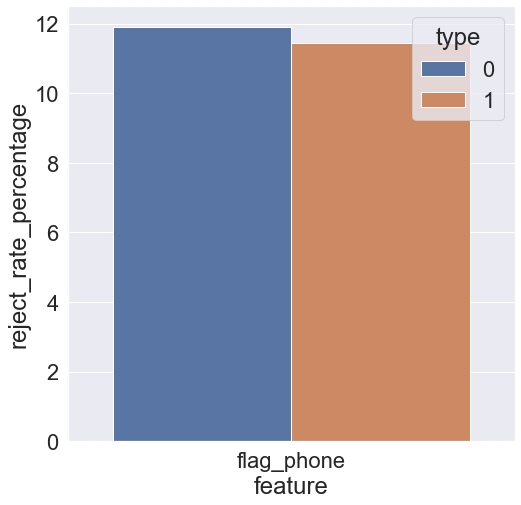

In [236]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "feature", y = "reject_rate_percentage", hue = "type", data = ph_binary)
plt.show()

#### Observations:-

* Percentage as per not owning a phone:-
    * Total applicants are 36457 and out of them 25709 applicants don't own a phone.
    * It means that 70.52% of the applicants don't own a phone.

    * Total applicants are 36457 and out of them 10748 applicants own a phone.
    * It means that 29.48% of the applicants own a phone.
    
    * Percentage of applicants without a phone is HIGHER than those who own a phone.
    
* Rejection rate as per phone status:-   
    * 25709 applicants who don't own the phone - 11.90% of the applicants are rejected.
    * 10748 applicants who own the phone - 11.45% of the applicants are rejected.
    
    * Rejection rate of the applicants with or without a phone is quite close.
    
* Percentage of phone ownership status as per gender:-
    * Total applicants who don't own the phone, out of it 66.19% are Females.
    * Total applicants who don't own the phone, out of it 33.81% are Males.
    * Total applicants who own the phone, out of it 68.96% are Females.
    * Total applicants who own the phone, out of it 31.04% are the Males.
    
    * Females have the highest ownership of phone in comparison to Males.
    * But with regard to not owning a phone Females again has the HIGHEST percentage.
    
* Rejection rate as per the phone status on gender basis:-
    * Don't own the phone:
        * 11.57% of the Females are rejected who don't own the phone.
        * 12.54% of the Males are rejected who don't own the phone.
    * Own the work phone:-
        * 10.63% of the Females are rejected who own the phone.
        * 13.27% of the Males are rejected who own the phone.
        
    * Here Males have HIGHER rejection rate as compared to Females who don't own the phone.
    * And on owning a phone, again Males have the HIGER rejection rate.
    * But there is hardly any variation in the rejection rates of both males and females on whether they own the phone or don't own the phone.
    
* Rejection rate as per rejected applicants:-
    * Total rejection of 'phone' is of 4291 applicants out of the total records of 36457 applicants.
    * And percentage-wise it is 11.77%.
    
    * Applicants rejection percentage out of the total rejected applicants owning no phone is 71.31%.
    * Whereas applicants rejection percentage out of the total rejected applicants owning a phone is 28.69%.
    
    * Here, the rejection rate of applicants without a phone is much HIGHER than that of the applicants owning a phone.

* Overall, we can clearly see that the REJECTION RATE OF APPLICANTS is not much impacted with or without the phone.

In [237]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


#### Email Analysis

In [238]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [239]:
binary_df.flag_email.value_counts()

0    33186
1     3271
Name: flag_email, dtype: int64

In [240]:
binary_df.flag_email.value_counts(normalize = True)

0   0.91
1   0.09
Name: flag_email, dtype: float64

Analysis:-

* Out of the 36457 applicants:-
* 33186 applicants don't have an email which consists of 91.03%
* 3271 applicants have an email which consists of 8.97%

In [241]:
# Use crosstabs

pd.crosstab(binary_df['flag_email'], binary_df['status'], margins = True)

status,0,1,All
flag_email,,,
0,29346,3840,33186
1,2820,451,3271
All,32166,4291,36457


<AxesSubplot:xlabel='flag_email', ylabel='count'>

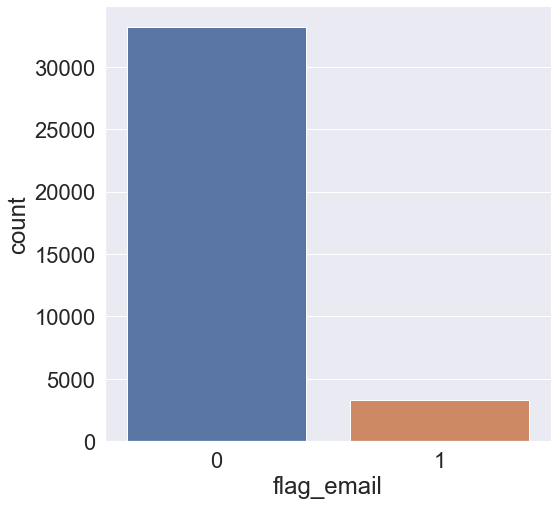

In [242]:
# Total Male and Female gender distribution

plt.subplots(figsize = (8, 8))
sns.countplot(binary_df['flag_email'])

In [243]:
# Find the applicants count who don't own an email w.r.t. status

e_st_count = binary_df.groupby(["flag_email"])["status"].value_counts(normalize = False).reset_index(name = 'count')
e_st_count

,flag_email,status,count
0,0,0,29346
1,0,1,3840
2,1,0,2820
3,1,1,451


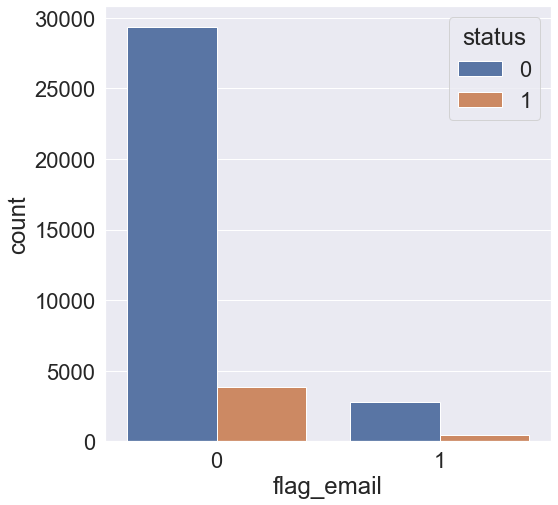

In [244]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_email", y = "count", hue = "status", data = e_st_count)
plt.show()

In [245]:
# Find the applicants percentage who don't own an email w.r.t. status

e_st_perc = binary_df.groupby(["flag_email"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
e_st_perc

,flag_email,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.86
3,1,1,0.14


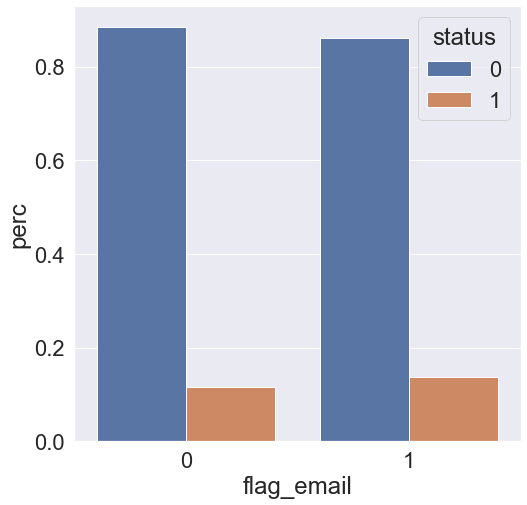

In [246]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_email", y = "perc", hue = "status", data = e_st_perc)
plt.show()

Analysis:-

    * 11.57% of the applicants who don't own an email are rejected.
    * 13.78% of the applicants who own an email are rejected.

In [247]:
# Find the applicants count who don't own an email w.r.t. gender

e_gen_count = binary_df.groupby(["flag_email"])["code_gender"].value_counts(normalize = False).reset_index(name = 'count')
e_gen_count

,flag_email,level_1,count
0,0,0,22222
1,0,1,10964
2,1,0,2208
3,1,1,1063


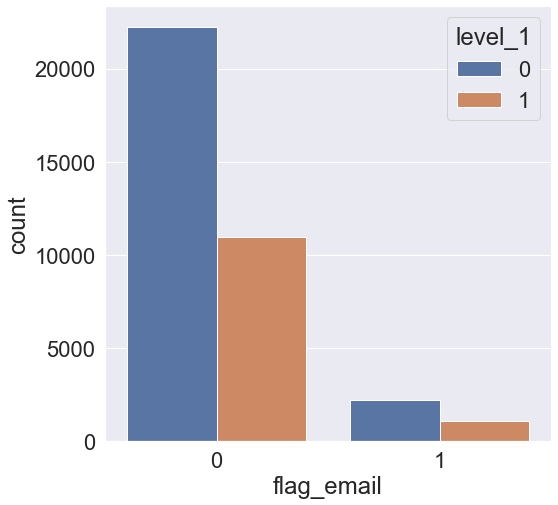

In [248]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "flag_email", y = "count", hue = "level_1", data = e_gen_count)
plt.show()

In [249]:
# Find the applicants percentage who don't own an email w.r.t. gender

e_gen_perc = binary_df.groupby(["flag_email"])["code_gender"].value_counts(normalize = True).reset_index(name = 'perc')
e_gen_perc

,flag_email,level_1,perc
0,0,0,0.67
1,0,1,0.33
2,1,0,0.68
3,1,1,0.32


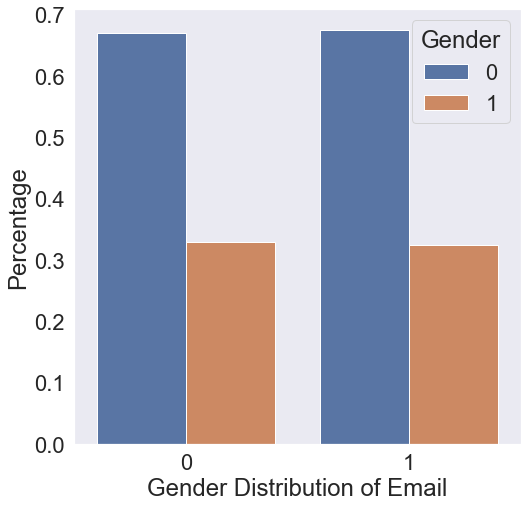

In [250]:
plt.subplots(figsize = (8, 8))


sns.barplot(x = "flag_email", y = "perc", hue = "level_1", data = e_gen_perc)
plt.xlabel("Gender Distribution of Email")
plt.ylabel("Percentage")
plt.grid(False)
plt.legend(title = "Gender", loc = 1)
plt.show()

Analysis:-

    * Out of 33186 applicants who don't own an email - 66.96% are Females and 33.04% are Males
    * Similarly, out of 3271 applicants who own a phone - 67.50% are Females and 32.50% are Males

In [251]:
# Find the applicants count who don't own an email w.r.t. status and gender

e_gen_st_count = binary_df.groupby(["flag_email", 'code_gender'])["status"].value_counts(normalize = False).reset_index(name = 'count')
e_gen_st_count

,flag_email,code_gender,status,count
0,0,0,0,19751
1,0,0,1,2471
2,0,1,0,9595
3,0,1,1,1369
4,1,0,0,1921
5,1,0,1,287
6,1,1,0,899
7,1,1,1,164


In [252]:
# Find the applicants count who don't own an email w.r.t. status and gender

e_gen_st_perc = binary_df.groupby(["flag_email", 'code_gender'])["status"].value_counts(normalize = True).reset_index(name = 'perc')
e_gen_st_perc

,flag_email,code_gender,status,perc
0,0,0,0,0.89
1,0,0,1,0.11
2,0,1,0,0.88
3,0,1,1,0.12
4,1,0,0,0.87
5,1,0,1,0.13
6,1,1,0,0.85
7,1,1,1,0.15


Analysis:-

    Applicants who don't own an email:
         * 11.11% of Females who don't own an email are rejected.
         * 12.48% of Males who don't own an email are rejected.

    Applicants who own an email:
        * 12.99% of Females who own an email are rejected.
        * 15.42% of applicants who own an email are rejected.

In [253]:
# Check an email count of rejection and acceptance on the basis of status

e_df = binary_df.groupby(["flag_email", 'status'])["status"].count()
e_df

flag_email  status
0           0         29346
            1          3840
1           0          2820
            1           451
Name: status, dtype: int64

In [254]:
# Check an email percentage of rejection and acceptance on the basis of status

e_df = binary_df.groupby(["flag_email"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
e_df

,flag_email,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.86
3,1,1,0.14


In [255]:
# Total rejection count of applicants who don't own an email (N)

e_df_n = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_email == 0]
e_df_n.shape[0]

3840

In [256]:
# Total rejection count of applicants who own an email (Y)

e_df_y = binary_df.loc[binary_df.status == 1].loc[binary_df.flag_email == 1]
e_df_y.shape[0]

451

In [257]:
# Total rejections

e_tot = e_df_n.shape[0] + e_df_y.shape[0]
e_tot

4291

In [258]:
# Total eligibles

e_df_n_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_email == 0]
print("Total Eligible without an email: " + str(e_df_n_eleg.shape[0]))

e_df_y_eleg = binary_df.loc[binary_df.status == 0].loc[binary_df.flag_email == 1]
print("Total Eligible with an email: " + str(e_df_y_eleg.shape[0]))

e_eleg = e_df_n_eleg.shape[0] + e_df_y_eleg.shape[0]
print("Total Eligible applicants : " + str(e_eleg))

Total Eligible without an email: 29346
Total Eligible with an email: 2820
Total Eligible applicants : 32166


In [259]:
# Percencatage of rejection of applicants with or without an email out of total rejections

print('There are ' + str(e_tot) + ' rejected applicants.')
print('Out of this:-')
print('Applicants without an email are', e_df_n.shape[0])
print('Applicants with an email are', e_df_y.shape[0], '\n')

print('Percentage of rejection of applicants without an email out of total rejections is', 
      str(round(e_df_n.shape[0]/e_tot * 100, 2)) + '%.')

print('Percentage of rejection of applicants with an email out of total rejections is', 
      str(round(e_df_y.shape[0]/e_tot * 100, 2)) + '%.', '\n', '\n')



print('There are ' + str(e_eleg) + ' eligible applicants.')
print('Out of this:-')
print('Applicants without an email are', e_df_n_eleg.shape[0])
print('Applicants with an email are', e_df_y_eleg.shape[0], '\n')

print('Percentage of eligibility of applicants without an email out of total eligible is', str(round(e_df_n_eleg.shape[0] / e_eleg * 100, 2)) + '%.')

print('Percentage of eligibility of applicants with an email out of total eligible is', str(round(e_df_y_eleg.shape[0] / e_eleg * 100, 2)) + '%.')

There are 4291 rejected applicants.
Out of this:-
Applicants without an email are 3840
Applicants with an email are 451 

Percentage of rejection of applicants without an email out of total rejections is 89.49%.
Percentage of rejection of applicants with an email out of total rejections is 10.51%. 
 

There are 32166 eligible applicants.
Out of this:-
Applicants without an email are 29346
Applicants with an email are 2820 

Percentage of eligibility of applicants without an email out of total eligible is 91.23%.
Percentage of eligibility of applicants with an email out of total eligible is 8.77%.


In [260]:
pd.crosstab(binary_df['flag_email'], binary_df['status'], margins = True)

status,0,1,All
flag_email,,,
0,29346,3840,33186
1,2820,451,3271
All,32166,4291,36457


In [261]:
# Create a new dataframe of just an email and then add status to it

e_tot_df = ['flag_email']
e_df_perc = binary_df[e_tot_df + ['status']]

In [262]:
e_df_perc.head()

,flag_email,status
0,0,1
1,0,1
2,0,0
3,0,0
4,0,0


In [263]:
e_df_perc.value_counts()

flag_email  status
0           0         29346
            1          3840
1           0          2820
            1           451
dtype: int64

In [264]:
dict_list = []
for flag_email in e_tot_df:
    for one_type in [0, 1]:
        dict_list.append({'feature': flag_email,
                          'type': one_type,
                          'reject_rate_percentage': round(len(e_df_perc[e_df_perc[flag_email] == one_type]
                                                        [e_df_perc.status == 1])
                                                       / len(e_df_perc[e_df_perc[flag_email] == one_type]) * 100, 2),
                          'count': len(e_df_perc[e_df_perc[flag_email] == one_type]),
                          'reject_count': len(e_df_perc[e_df_perc[flag_email] == one_type][e_df_perc.status == 1])
                         })

In [265]:
e_binary = pd.DataFrame.from_dict(dict_list)
e_binary

,feature,type,reject_rate_percentage,count,reject_count
0,flag_email,0,11.57,33186,3840
1,flag_email,1,13.79,3271,451


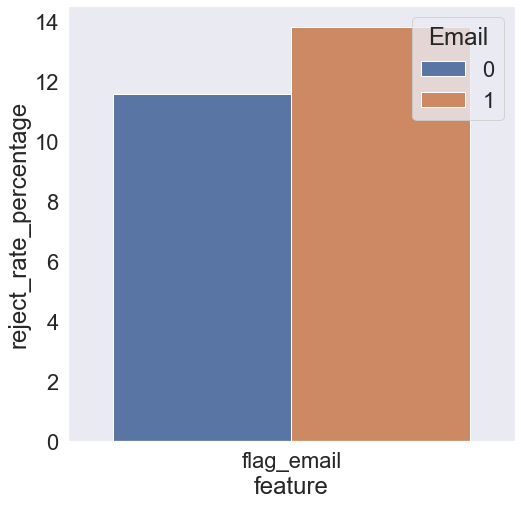

In [266]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "feature", y = "reject_rate_percentage", hue = "type", data = e_binary)
plt.grid(False)
plt.legend(title = "Email", loc = 1)
plt.show()

#### Observations:-

* Percentage as per not owning an email:-
    * Total applicants are 36457 and out of them 33186 applicants don't own an email.
    * It means that 91.03% of the applicants don't own an email.

    * Total applicants are 36457 and out of them 3271 applicants own an email.
    * It means that 8.97% of the applicants own an email.
    
    * Percentage of applicants without an email is HIGHER than those who own an email.
    
* Rejection rate as per email status:-   
    * 33186 applicants who don't own an email - 11.57% of the applicants are rejected.
    * 3271 applicants who own an email - 13.78% of the applicants are rejected.
    
    * Rejection rate of the applicants with an email is bit HIGHER than the ones without an email.
    
* Percentage of email ownership status as per gender:-
    * Total applicants who don't own an email, out of it 66.96% are Females.
    * Total applicants who don't own an email, out of it 33.04% are Males.
    * Total applicants who own an email, out of it 67.50% are Females.
    * Total applicants who own an email, out of it 32.50% are the Males.
    
    * Females have the highest ownership of emails in comparison to Males.
    * But with regard to not owning an email Females again has the HIGHEST percentage.
    
* Rejection rate as per an email status on gender basis:-
    * Don't own an email:
        * 11.11% of the Females are rejected who don't own an email.
        * 12.48% of the Males are rejected who don't own an email.
    * Own an email:-
        * 12.99% of the Females are rejected who own an email.
        * 15.42% of the Males are rejected who own an email.
        
    * Here Males have HIGHER rejection rate as compared to Females who don't own an email.
    * And on owning an email, again Males have the HIGER rejection rate.
    * But there is very little variation in the rejection rates of both males and females on whether they own an email or don't own an email.
    
* Rejection rate as per rejected applicants:-
    * Total rejection of 'email' is of 4291 applicants out of the total records of 36457 applicants.
    * And percentage-wise it is 11.77%.
    
    * Applicants rejection percentage out of the total rejected applicants owning no email is 89.49%.
    * Whereas applicants rejection percentage out of the total rejected applicants owning an email is 10.51%.
    
    * Here, the rejection rate of applicants without an email is much HIGHER than that of the applicants owning an email.

* Overall, we can clearly see that the REJECTION RATE OF APPLICANTS is not much impacted with or without an email.

In [267]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


#### Combined plot and summary of Binary Features

In [268]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [269]:
binary_features = ['code_gender', 'flag_own_car', 'flag_own_realty', 'flag_work_phone', 'flag_phone', 'flag_email']
binary_df_plot = binary_df[binary_features + ['status']]
dict_list = []
for feature in binary_features:
    for one_type in [0, 1]:
        dict_list.append({'feature': feature,
                          'type': one_type,
                          'reject_rate_percentage': round(len(binary_df_plot[binary_df_plot[feature] == one_type][binary_df_plot.status == 1]) / 
                          len(binary_df_plot[binary_df_plot[feature] == one_type]) * 100, 2),
                          'count': len(binary_df_plot[binary_df_plot[feature] == one_type]),
                          'reject_count': len(binary_df_plot[binary_df_plot[feature] == one_type][binary_df_plot.status == 1])
                         })

In [270]:
binary_df_plot.head()

,code_gender,flag_own_car,flag_own_realty,flag_work_phone,flag_phone,flag_email,status
0,0,0,0,1,0,0,1
1,0,0,0,1,0,0,1
2,0,0,1,1,0,0,0
3,0,1,1,0,0,0,0
4,0,1,1,0,0,0,0


In [271]:
group_binary = pd.DataFrame.from_dict(dict_list)
group_binary

,feature,type,reject_rate_percentage,count,reject_count
0,code_gender,0,11.29,24430,2758
1,code_gender,1,12.75,12027,1533
2,flag_own_car,0,12.04,22614,2722
3,flag_own_car,1,11.33,13843,1569
4,flag_own_realty,0,13.06,11951,1561
5,flag_own_realty,1,11.14,24506,2730
6,flag_work_phone,0,11.77,28235,3324
7,flag_work_phone,1,11.76,8222,967
8,flag_phone,0,11.90,25709,3060
9,flag_phone,1,11.45,10748,1231


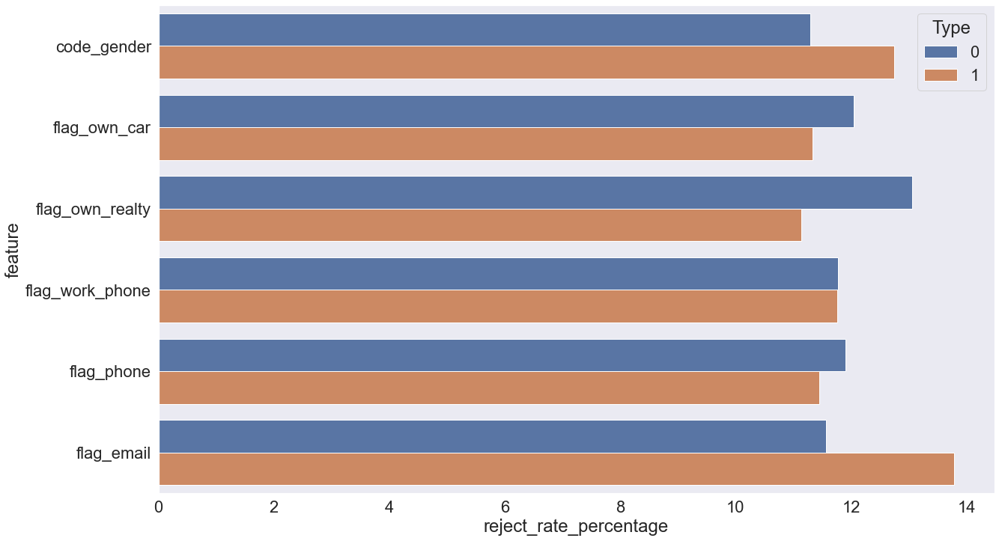

In [272]:
plt.subplots(figsize = (20, 12))
sns.barplot(y = "feature", x = "reject_rate_percentage", hue = "type", data = group_binary, orient = 'h')
plt.grid(False)
plt.legend(title = "Type", loc = 1)
plt.show()

#### CONVERT THE BINARIES TO Ys AND Ns OR Ms AND Fs

In [273]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
1,0,0,0,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,0,0,Managers,2.00,1
2,0,0,1,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,0,0,Security staff,2.00,0
3,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0
4,0,1,1,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,0,0,0,NaN,2.00,0


In [274]:
# Convert the binaries of variables back from '1's and '0's to 'Y's and 'N's or to 'M's and 'F's
# Where Y = 1 or M = 1 and
# N = 0 or F = 1

binary_df['code_gender'] = binary_df['code_gender'].replace(1, 'M').replace(0, 'F')
binary_df['flag_own_car'] = binary_df['flag_own_car'].replace(1, 'Y').replace(0, 'N')
binary_df['flag_own_realty'] = binary_df['flag_own_realty'].replace(1, 'Y').replace(0, 'N')
binary_df['flag_work_phone'] = binary_df['flag_work_phone'].replace(1, 'Y').replace(0, 'N')
binary_df['flag_phone'] = binary_df['flag_phone'].replace(1, 'Y').replace(0, 'N')
binary_df['flag_email'] = binary_df['flag_email'].replace(1, 'Y').replace(0, 'N')
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0


#### 2.2 Continuous Features
There are 5 binary features in a dataset 'new_df':-

* cnt_children
* amt_income_total
* days_birth
* days_employed
* cnt_fam_members

In [275]:
binary_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0


In [276]:
continuous_df = binary_df.copy()
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0


In [277]:
continuous_df.shape

(36457, 17)

In [278]:
numerical_col = continuous_df.select_dtypes(include='number').columns
len(numerical_col)

6

In [279]:
continuous_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   code_gender          36457 non-null  category
 1   flag_own_car         36457 non-null  category
 2   flag_own_realty      36457 non-null  category
 3   cnt_children         36457 non-null  int64   
 4   amt_income_total     36457 non-null  float64 
 5   name_income_type     36457 non-null  object  
 6   name_education_type  36457 non-null  object  
 7   name_family_status   36457 non-null  object  
 8   name_housing_type    36457 non-null  object  
 9   days_birth           36457 non-null  int64   
 10  days_employed        36457 non-null  int64   
 11  flag_work_phone      36457 non-null  category
 12  flag_phone           36457 non-null  category
 13  flag_email           36457 non-null  category
 14  occupation_type      25134 non-null  object  
 15  cnt_fam_members    

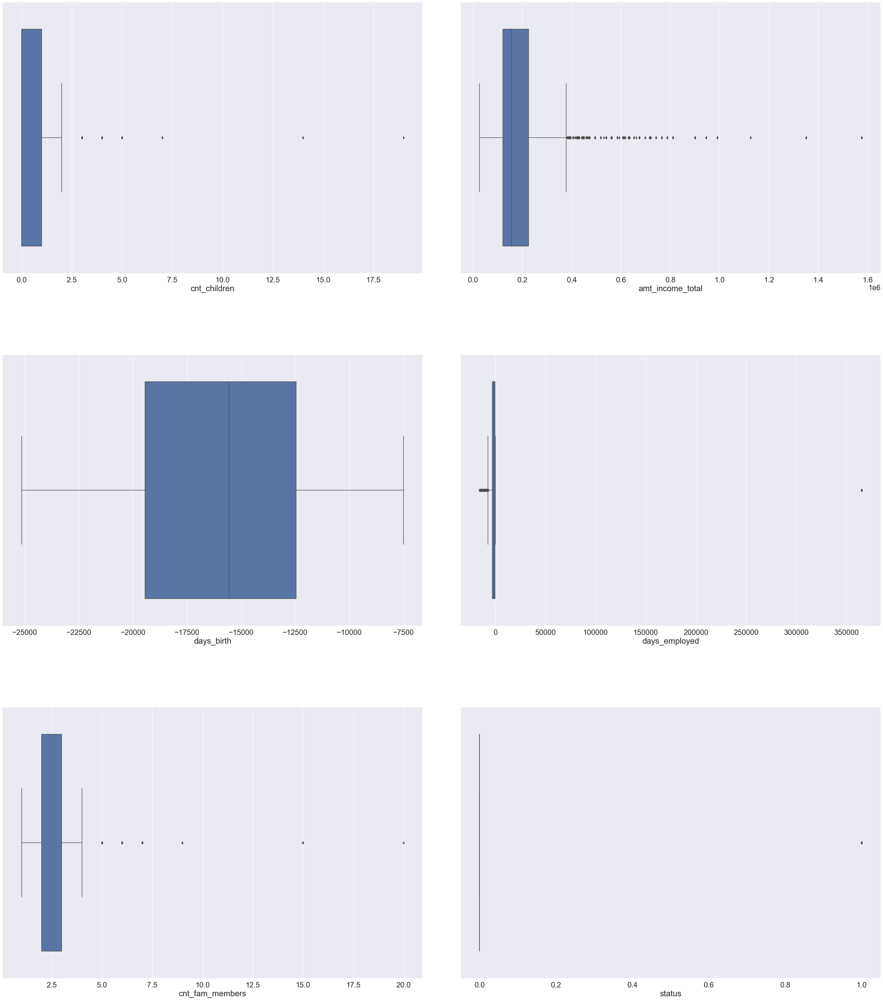

In [280]:
fig , axes = plt.subplots(nrows = 3, ncols = 2, constrained_layout = True)

fig.subplots_adjust(left = 0, bottom = 0, right = 3, top = 5, wspace = 0.09, hspace = 0.3)


for ax, column in zip(axes.flatten(), numerical_col):
    sns.boxplot(continuous_df[column], ax = ax)
plt.grid(False)
plt.show()

Insights:-
    
* There are outliers to be treated.

#### cnt_children Analysis

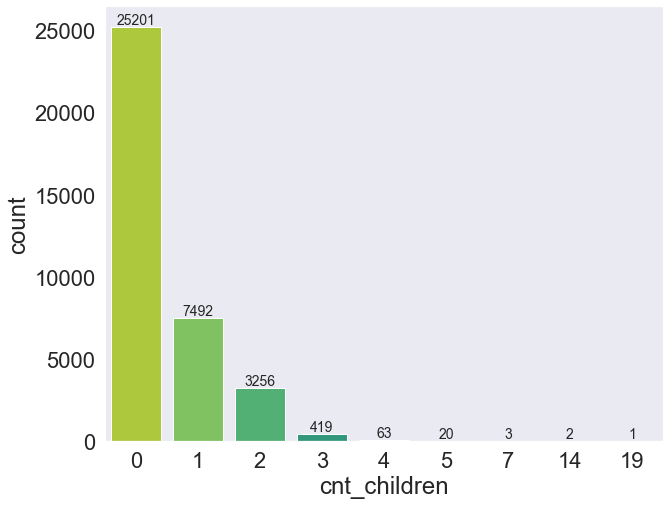

In [281]:
plt.figure(figsize=(10, 8)) 
sns.countplot(x = "cnt_children", data = continuous_df, palette = "viridis_r")
children_count = continuous_df.cnt_children.value_counts()
children_count
for a, b in zip(range(len(children_count)), children_count):
    plt.text(a, b, '%.0f' % b, ha = 'center', va = 'bottom', fontsize = 14)
plt.grid(False)
plt.show()

Palette color codes:-

‘Accent’, ‘Accent_r’, ‘Blues’, ‘Blues_r’, ‘BrBG’, ‘BrBG_r’, ‘BuGn’, ‘BuGn_r’, ‘BuPu’, ‘BuPu_r’, ‘CMRmap’, ‘CMRmap_r’, ‘Dark2’, ‘Dark2_r’, ‘GnBu’, ‘GnBu_r’,  ‘Greens’, ‘Greens_r’, ‘Greys’, ‘Greys_r’, ‘OrRd’, ‘OrRd_r’, ‘Oranges’, ‘Oranges_r’,  ‘PRGn’, ‘PRGn_r’, ‘Paired’, ‘Paired_r’, ‘Pastel1’, ‘Pastel1_r’, ‘Pastel2’,  ‘Pastel2_r’, ‘PiYG’, ‘PiYG_r’, ‘PuBu’, ‘PuBuGn’, ‘PuBuGn_r’, ‘PuBu_r’, ‘PuOr’, ‘PuOr_r’, ‘PuRd’, ‘PuRd_r’, ‘Purples’, ‘Purples_r’, ‘RdBu’, ‘RdBu_r’, ‘RdGy’, ‘RdGy_r’, ‘RdPu’, ‘RdPu_r’, ‘RdYlBu’, ‘RdYlBu_r’, ‘RdYlGn’, ‘RdYlGn_r’, ‘Reds’, ‘Reds_r’, ‘Set1’, ‘Set1_r’, ‘Set2’, ‘Set2_r’, ‘Set3’, ‘Set3_r’, ‘Spectral’, ‘Spectral_r’, ‘Wistia’, ‘Wistia_r’, ‘YlGn’, ‘YlGnBu’, ‘YlGnBu_r’, ‘YlGn_r’, ‘YlOrBr’, ‘YlOrBr_r’, ‘YlOrRd’, ‘YlOrRd_r’, ‘afmhot’, ‘afmhot_r’, ‘autumn’, ‘autumn_r’, ‘binary’, ‘binary_r’,  ‘bone’, ‘bone_r’, ‘brg’, ‘brg_r’, ‘bwr’, ‘bwr_r’, ‘cividis’, ‘cividis_r’, ‘cool’, ‘cool_r’,  ‘coolwarm’, ‘coolwarm_r’, ‘copper’, ‘copper_r’, ‘cubehelix’, ‘cubehelix_r’, ‘flag’, ‘flag_r’,  ‘gist_earth’, ‘gist_earth_r’, ‘gist_gray’, ‘gist_gray_r’, ‘gist_heat’, ‘gist_heat_r’, ‘gist_ncar’,  ‘gist_ncar_r’, ‘gist_rainbow’, ‘gist_rainbow_r’, ‘gist_stern’, ‘gist_stern_r’, ‘gist_yarg’,  ‘gist_yarg_r’, ‘gnuplot’, ‘gnuplot2’, ‘gnuplot2_r’, ‘gnuplot_r’, ‘gray’, ‘gray_r’, ‘hot’, ‘hot_r’,  ‘hsv’, ‘hsv_r’, ‘icefire’, ‘icefire_r’, ‘inferno’, ‘inferno_r’, ‘jet’, ‘jet_r’, ‘magma’, ‘magma_r’,  ‘mako’, ‘mako_r’, ‘nipy_spectral’, ‘nipy_spectral_r’, ‘ocean’, ‘ocean_r’, ‘pink’, ‘pink_r’,  ‘plasma’, ‘plasma_r’, ‘prism’, ‘prism_r’, ‘rainbow’, ‘rainbow_r’, ‘rocket’, ‘rocket_r’,  ‘seismic’, ‘seismic_r’, ‘spring’, ‘spring_r’, ‘summer’, ‘summer_r’, ‘tab10’, ‘tab10_r’,’tab20′, ‘tab20_r’, ‘tab20b’, ‘tab20b_r’, ‘tab20c’, ‘tab20c_r’, ‘terrain’, ‘terrain_r’, ‘turbo’,  ‘turbo_r’, ‘twilight’, ‘twilight_r’, ‘twilight_shifted’, ‘twilight_shifted_r’, ‘viridis’,  ‘viridis_r’, ‘vlag’, ‘vlag_r’, ‘winter’, ‘winter_r’

In [282]:
continuous_df.cnt_children.value_counts()

0     25201
1      7492
2      3256
3       419
4        63
5        20
14        3
7         2
19        1
Name: cnt_children, dtype: int64

In [283]:
continuous_df.cnt_children.value_counts(normalize = True)

0    0.69
1    0.21
2    0.09
3    0.01
4    0.00
5    0.00
14   0.00
7    0.00
19   0.00
Name: cnt_children, dtype: float64

In [284]:
# Find the applicants children count w.r.t. status

child_st_count = continuous_df.groupby(["cnt_children"])["status"].value_counts(normalize = False).reset_index(name = 'count')
child_st_count

,cnt_children,status,count
0,0,0,22259
1,0,1,2942
2,1,0,6642
3,1,1,850
4,2,0,2821
5,2,1,435
6,3,0,364
7,3,1,55
8,4,0,58
9,4,1,5


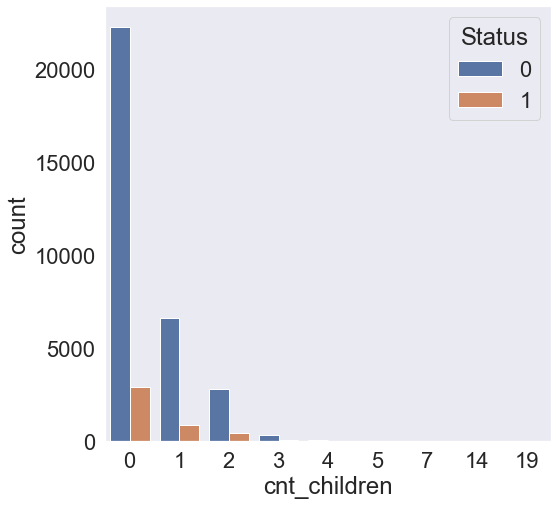

In [285]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = "cnt_children", y = "count", hue = "status", data = child_st_count)
plt.grid(False)
plt.legend(loc = 1, title = 'Status')
plt.show()

In [286]:
# Find the applicants children percentage w.r.t. status

child_st_perc = continuous_df.groupby(["cnt_children"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
child_st_perc

,cnt_children,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.89
3,1,1,0.11
4,2,0,0.87
5,2,1,0.13
6,3,0,0.87
7,3,1,0.13
8,4,0,0.92
9,4,1,0.08


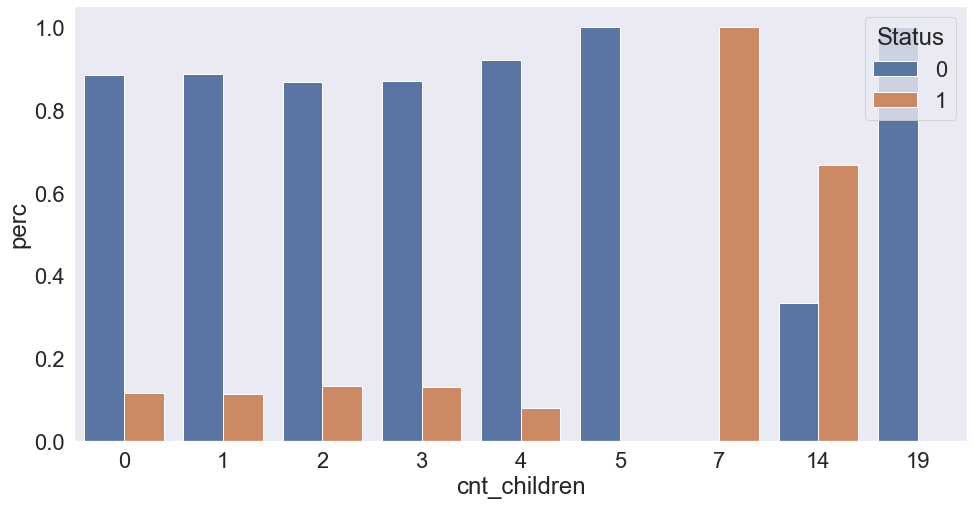

In [287]:
plt.subplots(figsize = (16, 8))
sns.barplot(x = "cnt_children", y = "perc", hue = "status", data = child_st_perc)
plt.grid(False)
plt.legend(loc = 1, title = 'Status')
plt.show()

In [288]:
# Check the children count

child_df = continuous_df["cnt_children"].value_counts()
child_df

0     25201
1      7492
2      3256
3       419
4        63
5        20
14        3
7         2
19        1
Name: cnt_children, dtype: int64

In [289]:
# Check the children percentage

child_df_perc = continuous_df["cnt_children"].value_counts(normalize = True).reset_index(name = 'perc')
child_df_perc

,index,perc
0,0,0.69
1,1,0.21
2,2,0.09
3,3,0.01
4,4,0.00
5,5,0.00
6,14,0.00
7,7,0.00
8,19,0.00


Analysis:-
    
    * Very few applicants have more than 2 child.

In [290]:
# Check the children count of rejection and acceptance on the basis of status

child__st_df_count = continuous_df.groupby(["cnt_children"])["status"].value_counts()
child__st_df_count

cnt_children  status
0             0         22259
              1          2942
1             0          6642
              1           850
2             0          2821
              1           435
3             0           364
              1            55
4             0            58
              1             5
5             0            20
7             1             2
14            1             2
              0             1
19            0             1
Name: status, dtype: int64

In [291]:
# Check the children count of rejection on the basis of status

#child__st_df_count_r = new_df.groupby(["total_children"])["status"]
child__st_df_count_r = continuous_df.loc[continuous_df.status == 1]
child__st_df_count_r = child__st_df_count_r.cnt_children.value_counts(normalize = False).reset_index(name = 'count')
child__st_df_count_r

,index,count
0,0,2942
1,1,850
2,2,435
3,3,55
4,4,5
5,7,2
6,14,2


In [292]:
# Rename the index to total_children

child__st_df_count_r = child__st_df_count_r.rename(columns = {'index' : 'cnt_children'})
child__st_df_count_r

,cnt_children,count
0,0,2942
1,1,850
2,2,435
3,3,55
4,4,5
5,7,2
6,14,2


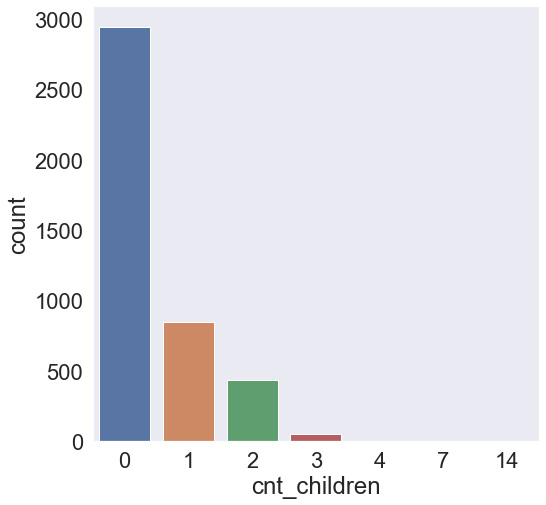

In [293]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = 'cnt_children', y = 'count', data = child__st_df_count_r)
plt.grid(False)

plt.show()

In [294]:
# Check the children percentage of rejection and acceptance on the basis of status

child__st_df_perc = continuous_df.groupby(["cnt_children"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
child__st_df_perc

,cnt_children,status,perc
0,0,0,0.88
1,0,1,0.12
2,1,0,0.89
3,1,1,0.11
4,2,0,0.87
5,2,1,0.13
6,3,0,0.87
7,3,1,0.13
8,4,0,0.92
9,4,1,0.08


In [295]:
# Fetch only the rejected records of children percentage

child__st_df_perc_r = child__st_df_perc.loc[child__st_df_perc.status == 1]
child__st_df_perc_r

,cnt_children,status,perc
1,0,1,0.12
3,1,1,0.11
5,2,1,0.13
7,3,1,0.13
9,4,1,0.08
11,7,1,1.00
12,14,1,0.67


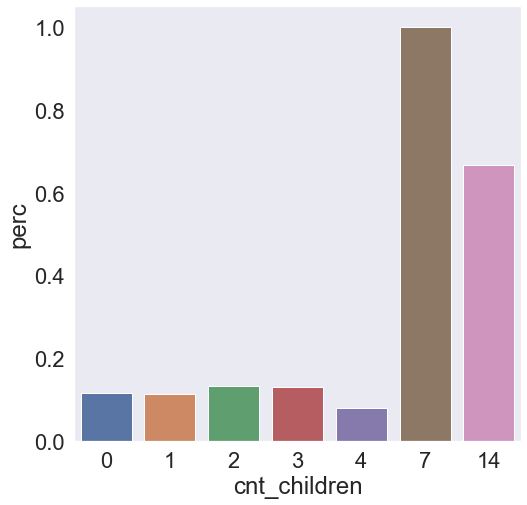

In [296]:
plt.subplots(figsize = (8, 8))
sns.barplot(x = 'cnt_children', y = 'perc', data = child__st_df_perc_r)
plt.grid(False)

plt.show()

Analysis:-
    
    * The rejection rate of applicants with 0, 1, 2 or 3 children are not quite different.

In [297]:
# Dividing applicants into 5 parts on the basis of rejection count

child_count_5 = [children_count[0], children_count[1], children_count[2], children_count[3], children_count[4:].sum()]

In [298]:
child_count_5

[25201, 7492, 3256, 419, 89]

In [299]:
child_count_5_r = [len(continuous_df[continuous_df.cnt_children == 0][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_children == 1][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_children == 2][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_children == 3][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_children >= 4][continuous_df.status == 1])]

In [300]:
child_count_5_r

[2942, 850, 435, 55, 9]

In [301]:
child_count_df_5 = pd.DataFrame.from_dict({
    'children_count' : child_count_5,
    'reject_count' : child_count_5_r
})

In [302]:
child_count_df_5['approved_count'] = child_count_df_5.children_count - child_count_df_5.reject_count

In [303]:
child_count_df_5['reject_rate'] = child_count_df_5.reject_count / child_count_df_5.children_count

In [304]:
child_count_df_5

,children_count,reject_count,approved_count,reject_rate
0,25201,2942,22259,0.12
1,7492,850,6642,0.11
2,3256,435,2821,0.13
3,419,55,364,0.13
4,89,9,80,0.10


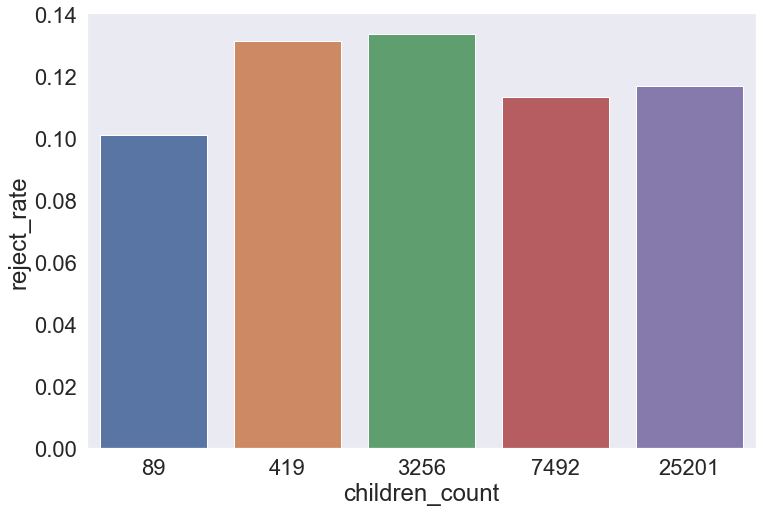

In [305]:
plt.subplots(figsize = (12, 8))
sns.barplot(x = 'children_count', y = 'reject_rate', data = child_count_df_5)
plt.grid(False)
plt.show()

In [306]:
# Create new columns in new_df for children count and copy its contents

continuous_df['children_cnt_bucket'] = continuous_df['cnt_children']
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,0
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,0
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,0
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,0
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,0


In [307]:
continuous_df.shape

(36457, 18)

In [308]:
continuous_df.children_cnt_bucket.value_counts()

0     25201
1      7492
2      3256
3       419
4        63
5        20
14        3
7         2
19        1
Name: children_cnt_bucket, dtype: int64

In [309]:
# Create buckets

In [310]:
continuous_df['children_cnt_bucket'] = continuous_df['cnt_children']
continuous_df['children_cnt_bucket'].value_counts()

0     25201
1      7492
2      3256
3       419
4        63
5        20
14        3
7         2
19        1
Name: children_cnt_bucket, dtype: int64

In [311]:
continuous_df.loc[(continuous_df.children_cnt_bucket > 5),  'children_cnt_bucket'] = 'More than Five'
continuous_df['children_cnt_bucket'].value_counts()

0                 25201
1                  7492
2                  3256
3                   419
4                    63
5                    20
More than Five        6
Name: children_cnt_bucket, dtype: int64

In [312]:
continuous_df['children_cnt_bucket'] = continuous_df['children_cnt_bucket'].replace(0, 'None').replace(
    1, 'One').replace(2, 'Two').replace(3, 'Three').replace(4, 'Four').replace(5, 'Five')

continuous_df['children_cnt_bucket'].value_counts()

None              25201
One                7492
Two                3256
Three               419
Four                 63
Five                 20
More than Five        6
Name: children_cnt_bucket, dtype: int64

In [313]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None


#### cnt_fam_members Analysis

In [314]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None


In [315]:
continuous_df.shape

(36457, 18)

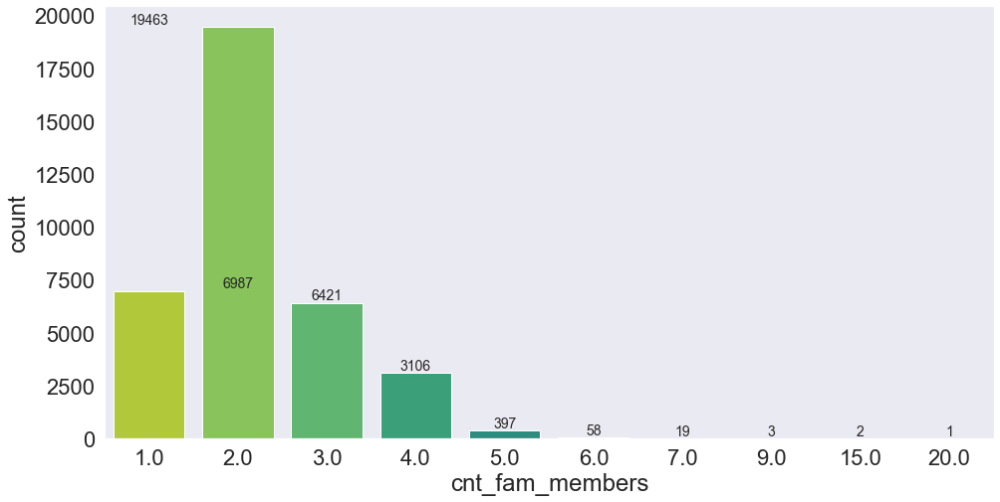

In [316]:
plt.figure(figsize=(16, 8)) 
sns.countplot(x = "cnt_fam_members", data = continuous_df, palette = "viridis_r")
family_count = continuous_df.cnt_fam_members.value_counts()
family_count
for a, b in zip(range(len(family_count)), family_count):
    plt.text(a, b, '%.0f' % b, ha = 'center', va = 'bottom', fontsize = 14)
plt.grid(False)
plt.show()

In [317]:
continuous_df.cnt_fam_members.value_counts()

2.00     19463
1.00      6987
3.00      6421
4.00      3106
5.00       397
6.00        58
7.00        19
15.00        3
9.00         2
20.00        1
Name: cnt_fam_members, dtype: int64

In [318]:
continuous_df.cnt_fam_members.value_counts(normalize = True)

2.00    0.53
1.00    0.19
3.00    0.18
4.00    0.09
5.00    0.01
6.00    0.00
7.00    0.00
15.00   0.00
9.00    0.00
20.00   0.00
Name: cnt_fam_members, dtype: float64

In [319]:
# Find the applicants family count w.r.t. status

fam_st_count = continuous_df.groupby(["cnt_fam_members"])["status"].value_counts(normalize = False).reset_index(name = 'count')
fam_st_count

,cnt_fam_members,status,count
0,1.00,0,6162
1,1.00,1,825
2,2.00,0,17200
3,2.00,1,2263
4,3.00,0,5698
5,3.00,1,723
6,4.00,0,2683
7,4.00,1,423
8,5.00,0,349
9,5.00,1,48


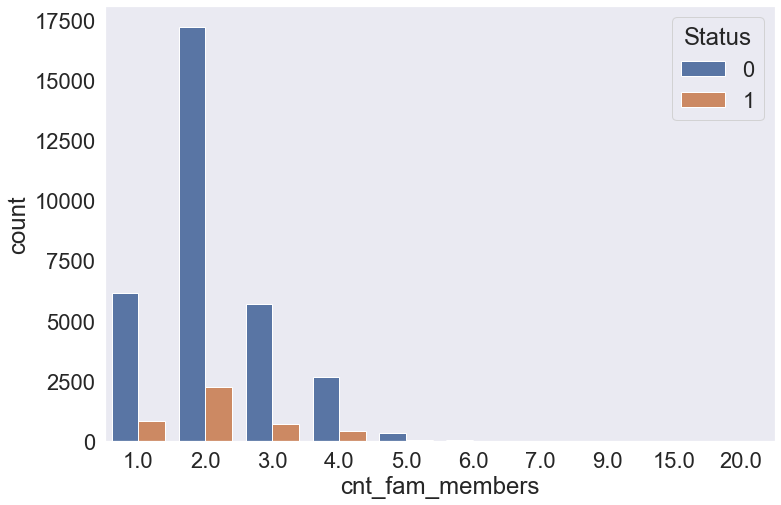

In [320]:
plt.subplots(figsize = (12, 8))
sns.barplot(x = "cnt_fam_members", y = "count", hue = "status", data = fam_st_count)
plt.grid(False)
plt.legend(loc = 1, title = "Status")
plt.show()

In [321]:
# Find the applicants family percentage w.r.t. status

fam_st_perc = continuous_df.groupby(["cnt_fam_members"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
fam_st_perc

,cnt_fam_members,status,perc
0,1.00,0,0.88
1,1.00,1,0.12
2,2.00,0,0.88
3,2.00,1,0.12
4,3.00,0,0.89
5,3.00,1,0.11
6,4.00,0,0.86
7,4.00,1,0.14
8,5.00,0,0.88
9,5.00,1,0.12


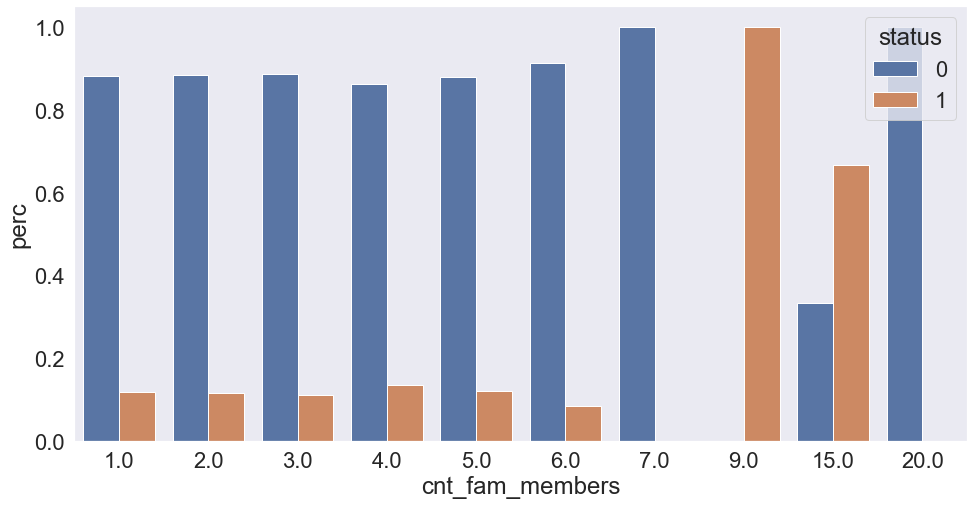

In [322]:
plt.subplots(figsize = (16, 8))
sns.barplot(x = "cnt_fam_members", y = "perc", hue = "status", data = fam_st_perc)
plt.grid(False)
plt.show()

In [323]:
# Check the family count

fam_df = continuous_df["cnt_fam_members"].value_counts()
fam_df

2.00     19463
1.00      6987
3.00      6421
4.00      3106
5.00       397
6.00        58
7.00        19
15.00        3
9.00         2
20.00        1
Name: cnt_fam_members, dtype: int64

In [324]:
# Check the family percentage

fam_df_perc = continuous_df["cnt_fam_members"].value_counts(normalize = True).reset_index(name = 'perc')
fam_df_perc

,index,perc
0,2.00,0.53
1,1.00,0.19
2,3.00,0.18
3,4.00,0.09
4,5.00,0.01
5,6.00,0.00
6,7.00,0.00
7,15.00,0.00
8,9.00,0.00
9,20.00,0.00


Analysis:-
    
    * Very few applicants have more than 4 family members

In [325]:
# Check the family count of rejection and acceptance on the basis of status

fam_st_df_count = continuous_df.groupby(["cnt_fam_members"])["status"].value_counts()
fam_st_df_count

cnt_fam_members  status
1.00             0          6162
                 1           825
2.00             0         17200
                 1          2263
3.00             0          5698
                 1           723
4.00             0          2683
                 1           423
5.00             0           349
                 1            48
6.00             0            53
                 1             5
7.00             0            19
9.00             1             2
15.00            1             2
                 0             1
20.00            0             1
Name: status, dtype: int64

In [326]:
# Check the family count of rejection on the basis of status

#fam_st_df_count_r = new_df.groupby(["total_children"])["status"]
fam_st_df_count_r = continuous_df.loc[continuous_df.status == 1]
fam_st_df_count_r = fam_st_df_count_r.cnt_fam_members.value_counts(normalize = False).reset_index(name = 'count')
fam_st_df_count_r

,index,count
0,2.00,2263
1,1.00,825
2,3.00,723
3,4.00,423
4,5.00,48
5,6.00,5
6,9.00,2
7,15.00,2


In [327]:
# Rename the index to total_family_members

fam_st_df_count_r = fam_st_df_count_r.rename(columns = {'index' : 'cnt_fam_members'})
fam_st_df_count_r

,cnt_fam_members,count
0,2.00,2263
1,1.00,825
2,3.00,723
3,4.00,423
4,5.00,48
5,6.00,5
6,9.00,2
7,15.00,2


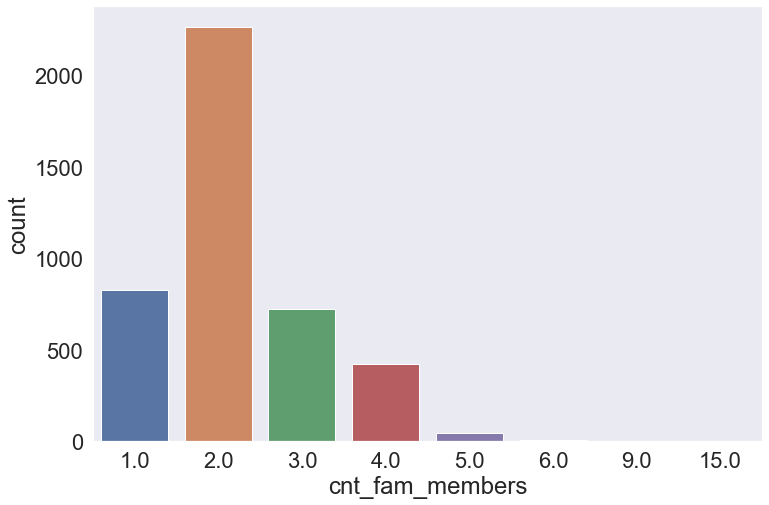

In [328]:
plt.subplots(figsize = (12, 8))
sns.barplot(x = 'cnt_fam_members', y = 'count', data = fam_st_df_count_r)
plt.grid(False)
plt.show()

In [329]:
# Check the family percentage of rejection and acceptance on the basis of status

fam_st_df_perc = continuous_df.groupby(["cnt_fam_members"])["status"].value_counts(normalize = True).reset_index(name = 'perc')
fam_st_df_perc

,cnt_fam_members,status,perc
0,1.00,0,0.88
1,1.00,1,0.12
2,2.00,0,0.88
3,2.00,1,0.12
4,3.00,0,0.89
5,3.00,1,0.11
6,4.00,0,0.86
7,4.00,1,0.14
8,5.00,0,0.88
9,5.00,1,0.12


In [330]:
# Fetch only the rejected records of children percentage

fam_st_df_perc_r = fam_st_df_perc.loc[fam_st_df_perc.status == 1]
fam_st_df_perc_r

,cnt_fam_members,status,perc
1,1.00,1,0.12
3,2.00,1,0.12
5,3.00,1,0.11
7,4.00,1,0.14
9,5.00,1,0.12
11,6.00,1,0.09
13,9.00,1,1.00
14,15.00,1,0.67


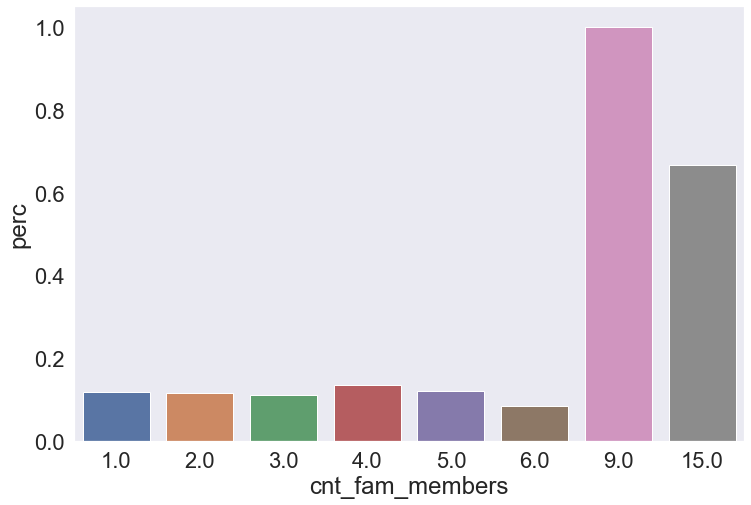

In [331]:
plt.subplots(figsize = (12, 8))
sns.barplot(x = 'cnt_fam_members', y = 'perc', data = fam_st_df_perc_r)
plt.grid(False)
plt.show()

Analysis:-

    * The rejection rate of applicants with 1, 2 or 3 family members are not quite different.

In [332]:
# Dividing applicants into 4 parts on the basis of rejection count

fam_count_5 = [family_count[1], family_count[2], family_count[3], family_count[4], family_count[5:].sum()]

In [333]:
fam_count_5

[6987, 19463, 6421, 3106, 480]

In [334]:
fam_count_5_r = [len(continuous_df[continuous_df.cnt_fam_members == 1.0][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_fam_members == 2.0][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_fam_members == 3.0][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_fam_members == 4.0][continuous_df.status == 1]),
                  len(continuous_df[continuous_df.cnt_fam_members >= 5.0][continuous_df.status == 1])]

In [335]:
fam_count_5_r

[825, 2263, 723, 423, 57]

In [336]:
fam_count_df_5 = pd.DataFrame.from_dict({
    'family_mem_count' : fam_count_5,
    'reject_count' : fam_count_5_r
})

In [337]:
fam_count_df_5['approved_count'] = fam_count_df_5.family_mem_count - fam_count_df_5.reject_count

In [338]:
fam_count_df_5['reject_rate'] = fam_count_df_5.reject_count / fam_count_df_5.family_mem_count

In [339]:
fam_count_df_5

,family_mem_count,reject_count,approved_count,reject_rate
0,6987,825,6162,0.12
1,19463,2263,17200,0.12
2,6421,723,5698,0.11
3,3106,423,2683,0.14
4,480,57,423,0.12


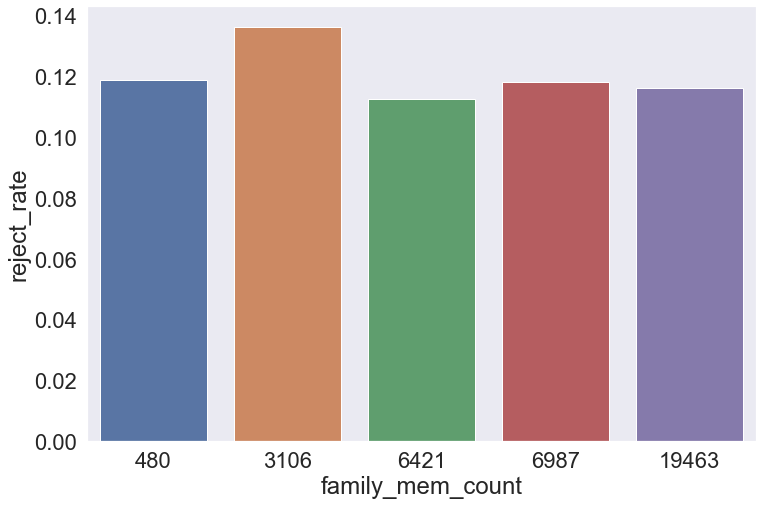

In [340]:
plt.subplots(figsize = (12, 8))
sns.barplot(x = 'family_mem_count', y = 'reject_rate', data = fam_count_df_5)
plt.grid(False)
plt.show()

#### Verify the relationship between the Children count and the Family Members count

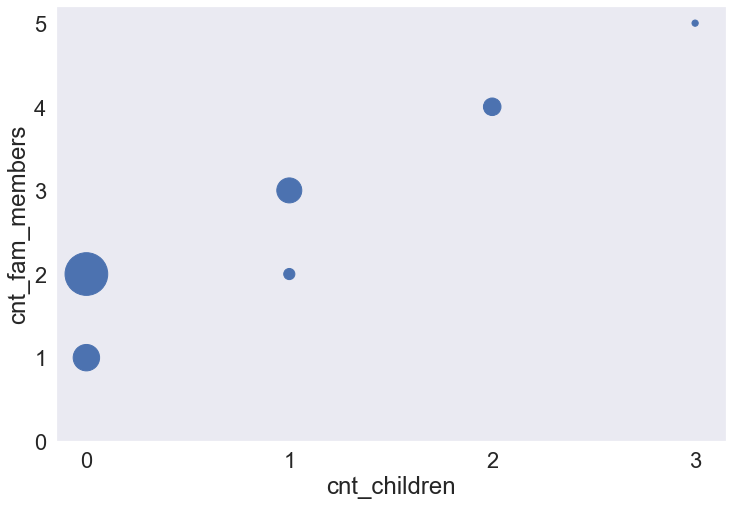

In [341]:
fig = plt.figure()
ax = fig.add_subplot(111)
gp = continuous_df.groupby(by = ['cnt_children', 'cnt_fam_members'])
gp_df = gp.size().reset_index(name = 'times').sort_values('times', ascending = False)[:6]
gp_df['times_10'] = gp_df['times'].apply(lambda x: x/10)
ax.scatter(gp_df['cnt_children'], gp_df['cnt_fam_members'], s = gp_df['times_10'])
plt.xticks(range(4))
plt.yticks(range(6))
plt.xlabel('cnt_children')
plt.ylabel('cnt_fam_members')
plt.grid(False)
plt.show()

In [342]:
gp = continuous_df.groupby(by = ['cnt_children', 'cnt_fam_members'])
gp_df = gp.size().reset_index(name='times').sort_values('times', ascending = False)[:6]

gp_df

,cnt_children,cnt_fam_members,times
1,0,2.00,18222
0,0,1.00,6979
4,1,3.00,6245
7,2,4.00,3078
3,1,2.00,1241
9,3,5.00,391


In [343]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None


In [344]:
continuous_df.shape

(36457, 18)

In [345]:
# Create buckets

In [346]:
continuous_df.cnt_fam_members.value_counts()

2.00     19463
1.00      6987
3.00      6421
4.00      3106
5.00       397
6.00        58
7.00        19
15.00        3
9.00         2
20.00        1
Name: cnt_fam_members, dtype: int64

In [347]:
continuous_df['cnt_fam_members_bucket'] = continuous_df['cnt_fam_members']
continuous_df['cnt_fam_members_bucket'].value_counts()

2.00     19463
1.00      6987
3.00      6421
4.00      3106
5.00       397
6.00        58
7.00        19
15.00        3
9.00         2
20.00        1
Name: cnt_fam_members_bucket, dtype: int64

In [348]:
continuous_df.loc[(continuous_df.cnt_fam_members_bucket > 7),  'cnt_fam_members_bucket'] = 'More than Seven'
continuous_df['cnt_fam_members_bucket'].value_counts()

2.0                19463
1.0                 6987
3.0                 6421
4.0                 3106
5.0                  397
6.0                   58
7.0                   19
More than Seven        6
Name: cnt_fam_members_bucket, dtype: int64

In [349]:
continuous_df['cnt_fam_members_bucket'] = continuous_df['cnt_fam_members_bucket'].replace(1, 'One').replace(2, 'Two').replace(
    3, 'Three').replace(4, 'Four').replace(5, 'Five').replace(6, 'Six').replace(7, 'Seven')

continuous_df['cnt_fam_members_bucket'].value_counts()

Two                19463
One                 6987
Three               6421
Four                3106
Five                 397
Six                   58
Seven                 19
More than Seven        6
Name: cnt_fam_members_bucket, dtype: int64

In [350]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None,Two
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two


In [351]:
continuous_df.shape

(36457, 19)

#### Income Amount Analysis

In [352]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None,Two
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two


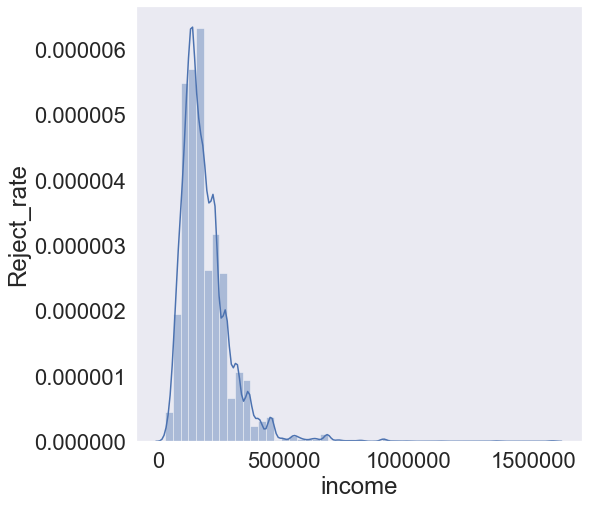

In [353]:
# Distribution Plot

plt.subplots(figsize = (8, 8))
income_plot = pd.Series(continuous_df.amt_income_total, name = "income")
plt.ylabel('Reject_rate')
sns.distplot(income_plot)
plt.ticklabel_format(style='plain')
plt.grid(False)
plt.show()

In [354]:
# Remove the scientific notations

# pd.options.display.float_format = '{:.1f}'.format

# Revert back to scientific notation

# pd.reset_option('display.float_format')

In [355]:
continuous_df.amt_income_total.describe()

count     36457.00
mean     186685.74
std      101789.23
min       27000.00
25%      121500.00
50%      157500.00
75%      225000.00
max     1575000.00
Name: amt_income_total, dtype: float64

In [356]:
# Check the quantiles

np.quantile(continuous_df.amt_income_total, 0.99)

560250.0

In [357]:
continuous_df.amt_income_total.quantile([.01, .25, .5, .75, 0.99])

0.01    54000.00
0.25   121500.00
0.50   157500.00
0.75   225000.00
0.99   560250.00
Name: amt_income_total, dtype: float64

We can notice that most applicants' income is lower than 560250. So we select these applicants to get box plot.

In [358]:
continuous_df.amt_income_total.value_counts()

135000.00    4309
180000.00    3097
157500.00    3089
112500.00    2956
225000.00    2926
             ... 
531000.00       1
73575.00        1
38700.00        1
74061.00        1
160200.00       1
Name: amt_income_total, Length: 265, dtype: int64

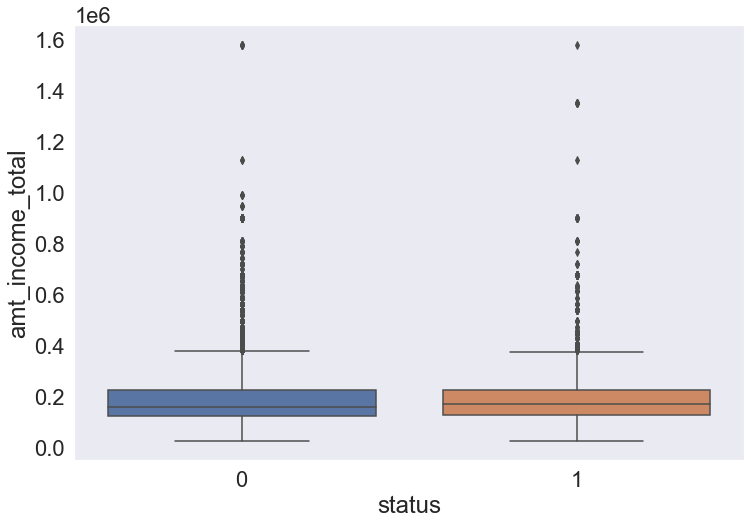

In [359]:
# Box Plot

sns.boxplot(x = "status", y = "amt_income_total", data = continuous_df)
plt.grid(False)
plt.show()

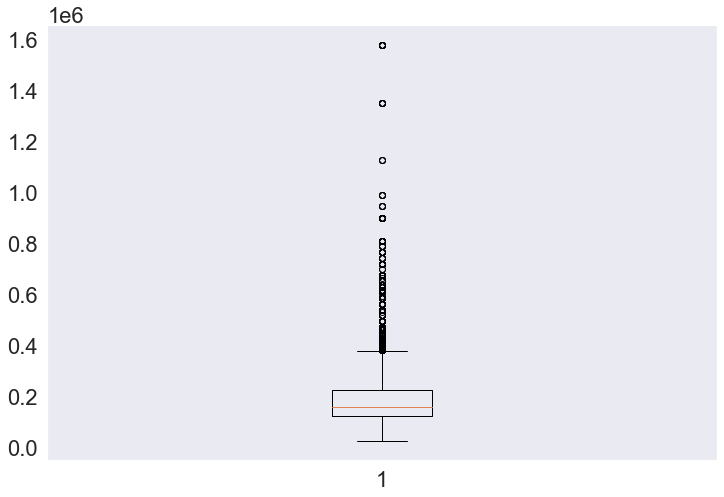

In [360]:
plt.boxplot(continuous_df['amt_income_total'])
plt.grid(False)

#### Outlier Detection of Income Column

In [361]:
# IQR

Q1 = np.percentile(continuous_df.amt_income_total, 25)
Q1

121500.0

In [362]:
Q3 = np.percentile(continuous_df.amt_income_total, 75)
Q3

225000.0

In [363]:
Q1,Q3 = np.percentile(continuous_df.amt_income_total, [25,75])
Q1,Q3

(121500.0, 225000.0)

In [364]:
IQR = Q3 - Q1
ul = Q3 + 1.5 * IQR
ll = Q1 - 1.5 * IQR
IQR, ul, ll

(103500.0, 380250.0, -33750.0)

In [365]:
outliers = continuous_df.amt_income_total[(continuous_df.amt_income_total > ul) | (continuous_df.amt_income_total < ll)]
print(outliers.head())

34928   382500.00
34929   382500.00
34930   382500.00
34931   382500.00
34932   382500.00
Name: amt_income_total, dtype: float64


In [366]:
outliers = pd.DataFrame(outliers)

In [367]:
outliers.head()

,amt_income_total
34928,382500.00
34929,382500.00
34930,382500.00
34931,382500.00
34932,382500.00


In [368]:
outliers.columns = outliers.columns.str.replace('amt_income_total', 'income_outliers')

In [369]:
outliers.head()

,income_outliers
34928,382500.00
34929,382500.00
34930,382500.00
34931,382500.00
34932,382500.00


In [370]:
outliers.income_outliers.value_counts()

450000.00     379
405000.00     282
382500.00     123
675000.00     115
540000.00      87
391500.00      56
427500.00      53
495000.00      43
900000.00      39
387000.00      39
562500.00      35
630000.00      31
585000.00      21
720000.00      19
445500.00      17
472500.00      16
810000.00      15
612000.00      13
560250.00      12
765000.00       9
459000.00       9
1575000.00      8
517500.00       8
423000.00       8
616500.00       8
441000.00       7
652500.00       7
463500.00       7
607500.00       6
1350000.00      6
396000.00       6
787500.00       5
742500.00       5
494100.00       4
945000.00       4
990000.00       4
634500.00       4
414000.00       3
418500.00       3
1125000.00      3
697500.00       2
716323.50       2
468000.00       2
531000.00       1
594000.00       1
432000.00       1
661500.00       1
Name: income_outliers, dtype: int64

In [371]:
outliers.income_outliers.shape

(1529,)

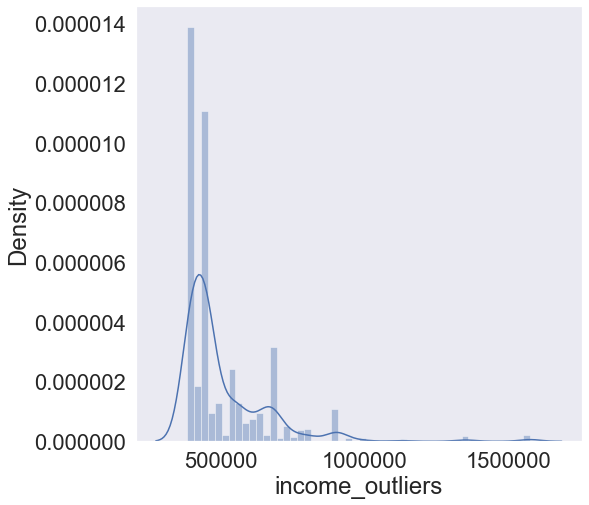

In [372]:
plt.subplots(figsize = (8, 8))
sns.distplot(outliers['income_outliers'])
plt.ticklabel_format(style = 'plain')
plt.grid(False)

#### Compare the Income column with Outliers to Income column without Outliers

In [373]:
non_outliers = continuous_df[continuous_df['amt_income_total'] < ul]
non_outliers.shape

(34928, 19)

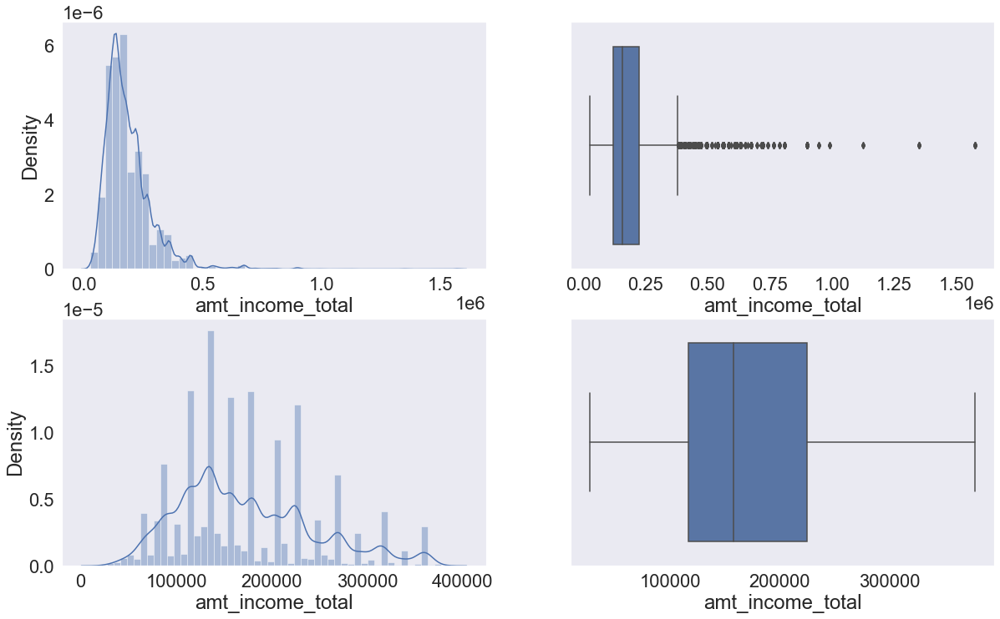

In [374]:
plt.figure(figsize=(20,12))

plt.subplot(2,2,1)
sns.distplot(continuous_df['amt_income_total'])
plt.grid(False)
plt.subplot(2,2,2)
sns.boxplot(continuous_df['amt_income_total'])
plt.grid(False)
plt.subplot(2,2,3)
sns.distplot(non_outliers['amt_income_total'])
plt.grid(False)
plt.subplot(2,2,4)
sns.boxplot(non_outliers['amt_income_total'])
plt.grid(False)
plt.show()


#### Bucketing the Income Column

In [375]:
continuous_df['income_bucket'] = pd.qcut(continuous_df.amt_income_total, 
                                         q = [0, 0.2, 0.5, 0.8, 0.95, 1], 
                                         labels = ['Very_low', 'Low', "Medium", 'High', 'Very_high'])

In [376]:
continuous_df['income_bucket'].head()

0    Very_low
1    Very_low
2    Very_low
3    Very_low
4    Very_low
Name: income_bucket, dtype: category
Categories (5, object): ['Very_low' < 'Low' < 'Medium' < 'High' < 'Very_high']

In [377]:
continuous_df['income_bucket'].value_counts()

Medium       11289
Low           9961
Very_low      8602
High          5026
Very_high     1579
Name: income_bucket, dtype: int64

In [378]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two,Very_low
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two,Very_low
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None,Two,Very_low
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two,Very_low
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two,Very_low


In [379]:
continuous_df.shape

(36457, 20)

#### days_birth Analysis

In [380]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two,Very_low
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,Y,N,N,Managers,2.00,1,None,Two,Very_low
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,Y,N,N,Security staff,2.00,0,None,Two,Very_low
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two,Very_low
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,N,N,N,NaN,2.00,0,None,Two,Very_low


In [381]:
continuous_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [382]:
# We firstly transform the days from birth into years, and get the histogram and Box diagram.

In [383]:
continuous_df['days_birth'] = abs(continuous_df['days_birth'])

In [384]:
continuous_df['days_birth'].head()

0    14869
1    14869
2    19128
3    20086
4    20086
Name: days_birth, dtype: int64

In [385]:
print(continuous_df['days_birth'].unique())

[14869 19128 20086 ... 19235 12999 10142]


In [386]:
print(continuous_df['days_birth'].nunique())

7183


In [387]:
continuous_df['age'] = (continuous_df['days_birth'] / 365.25).astype(int)

In [388]:
continuous_df['age'].unique()

array([40, 52, 54, 65, 57, 48, 61, 60, 56, 53, 62, 33, 36, 39, 50, 35, 64,
       34, 49, 30, 58, 38, 27, 43, 59, 47, 37, 24, 55, 66, 42, 29, 31, 28,
       63, 46, 51, 23, 67, 32, 26, 68, 44, 45, 41, 25, 22, 21, 20])

In [389]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,Y,N,N,Managers,2.00,1,None,Two,Very_low,40
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,Y,N,N,Managers,2.00,1,None,Two,Very_low,40
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,Y,N,N,Security staff,2.00,0,None,Two,Very_low,52
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,N,N,NaN,2.00,0,None,Two,Very_low,54
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,N,N,NaN,2.00,0,None,Two,Very_low,54


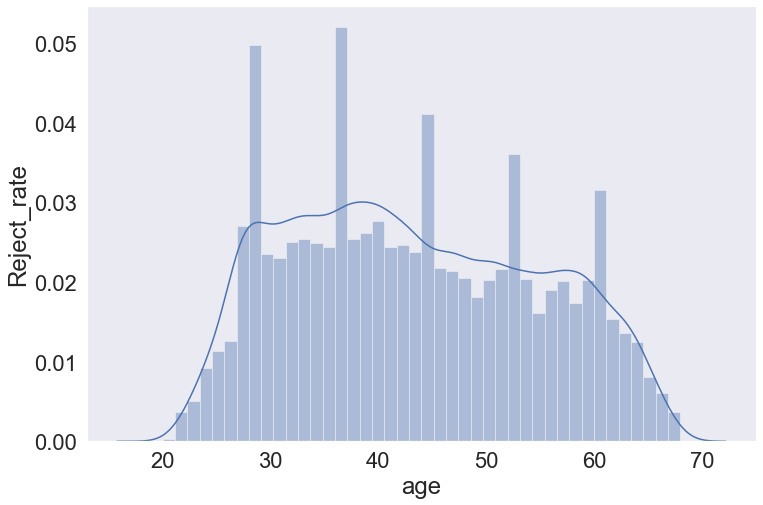

In [390]:
plt.ylabel('Reject_rate')
age_plot = pd.Series(continuous_df.age, name = "age")
sns.distplot(age_plot)
plt.grid(False)
plt.show()

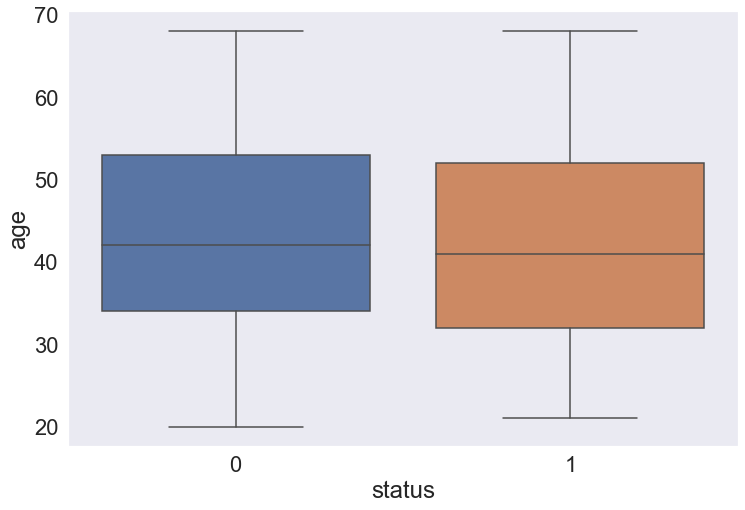

In [391]:
sns.boxplot(x = "status", y = "age", data = continuous_df)
plt.grid(False)
plt.show()

In [392]:
continuous_df.age.value_counts()

37    1200
40    1154
27    1125
28    1124
39    1092
33    1060
38    1058
32    1045
34    1036
42    1028
35    1020
41    1016
43     992
30     982
36     969
31     962
29     951
44     940
46     910
51     900
47     890
48     857
54     848
59     844
50     844
57     837
56     792
53     781
60     780
45     774
49     758
58     722
52     722
55     674
62     640
63     567
61     536
26     527
64     520
25     475
24     386
65     339
66     252
23     209
22     152
67     130
68      26
21      10
20       1
Name: age, dtype: int64

In [393]:
continuous_df.age.describe()

count   36457.00
mean       43.23
std        11.50
min        20.00
25%        34.00
50%        42.00
75%        53.00
max        68.00
Name: age, dtype: float64

In [394]:
# Binning / Bucketing

continuous_df['age_bucket'] = pd.cut(continuous_df['age'], 
                                     bins = [18, 25, 35, 60, 100], labels=['Very_Young', 'Young', 'Middle_Age', 'Senior_Citizen'])

In [395]:
continuous_df[['age','age_bucket']].head()

,age,age_bucket
0,40,Middle_Age
1,40,Middle_Age
2,52,Middle_Age
3,54,Middle_Age
4,54,Middle_Age


In [396]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age


In [397]:
continuous_df.shape

(36457, 22)

In [398]:
continuous_df.age_bucket.value_counts()

Middle_Age        22382
Young              9832
Senior_Citizen     3010
Very_Young         1233
Name: age_bucket, dtype: int64

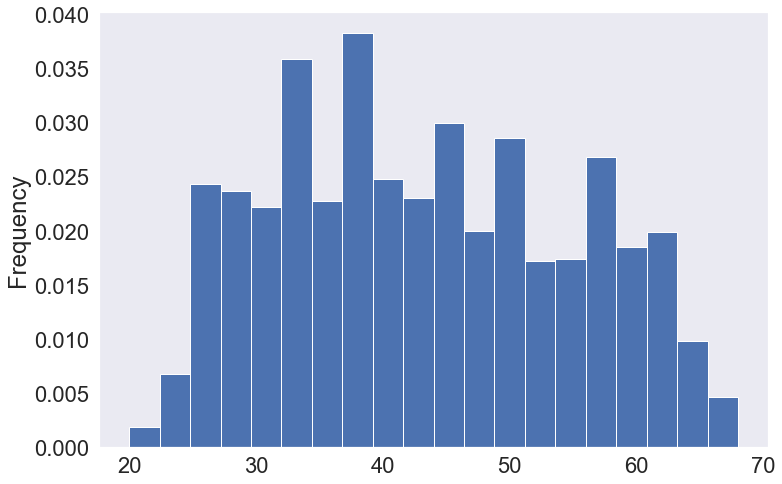

In [399]:
continuous_df['age'].plot(kind = 'hist', bins = 20, density = True)
plt.grid(False)

In [400]:
# Separate the Good applicants and the Bad applicants

# Good applicants

new_status0 = continuous_df.loc[continuous_df["status"] == 0] 
new_status0.shape[0]

32166

In [401]:
# Bad applicants

new_status1 = continuous_df.loc[continuous_df["status"] == 1] 
new_status1.shape[0]

4291

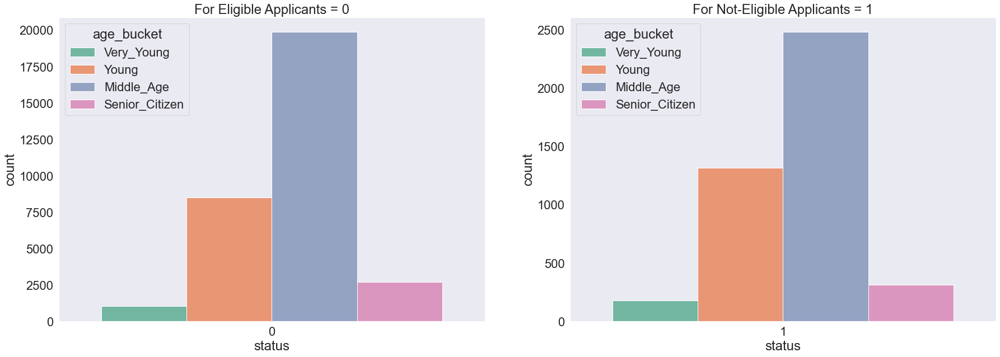

In [402]:
plt.figure(figsize = (30, 10)) 

plt.subplot(121)
plt.title("For Eligible Applicants = 0")
sns.countplot(x = 'status', hue = 'age_bucket', data = new_status0, palette = 'Set2')
plt.grid(False)

plt.subplot(122)
plt.title("For Not-Eligible Applicants = 1")
sns.countplot(x = 'status', hue = 'age_bucket', data = new_status1 , palette = 'Set2')
plt.grid(False)
plt.show()

Insights:-

* Middle Age(35-60) the group seems to applied higher than any other age group for loans in the case of Defaulters as well as Non-defaulters.
* Also, Middle Age group facing paying difficulties the most.
* While Senior Citizens(60-100) and Very young(19-25) age group facing paying difficulties less as compared to other age groups.

In [403]:
continuous_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

#### days_employed Analysis

There are error values in this column. We will drop them first and get the employed year of each applicants

In [404]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_phone,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age


In [405]:
continuous_df.days_employed

0         -5067
1         -5067
2         -1323
3        365243
4        365243
          ...  
36452     -2479
36453     -2479
36454     -2479
36455     -2479
36456     -2479
Name: days_employed, Length: 36457, dtype: int64

In [406]:
# We firstly transform the days from employed into years, and get the histogram and Box diagram.

In [407]:
print(continuous_df['days_employed'].unique())

[ -5067  -1323 365243 ...  -4456  -6518  -2479]


In [408]:
print(continuous_df['days_employed'].nunique())

3640


In [409]:
continuous_df['employed_years'] = continuous_df[continuous_df.days_employed < 0].days_employed.apply(lambda x: int(-x / 365.25))

In [410]:
print(continuous_df['employed_years'].unique())

[13.  3. nan 21. 15.  0.  1.  4. 25.  5. 10. 14.  8.  2. 23.  7. 22. 11.
  9. 17. 34.  6. 37. 12. 16. 20. 31. 19. 29. 26. 27. 18. 24. 30. 32. 28.
 41. 35. 39. 33. 42. 36. 40. 38. 43.]


In [411]:
print(continuous_df['employed_years'].nunique())

44


In [412]:
continuous_df['employed_years'].value_counts().head(10)

1.00    3233
4.00    2879
3.00    2815
2.00    2779
0.00    2542
6.00    2127
5.00    2060
8.00    1831
7.00    1642
9.00    1281
Name: employed_years, dtype: int64

In [413]:
continuous_df['employed_years'].isnull().sum()

6135

In [414]:
(continuous_df.isnull().sum() / len(continuous_df) * 100).sort_values(ascending = False)

occupation_type          31.06
employed_years           16.83
flag_phone                0.00
age_bucket                0.00
age                       0.00
income_bucket             0.00
cnt_fam_members_bucket    0.00
children_cnt_bucket       0.00
status                    0.00
cnt_fam_members           0.00
flag_email                0.00
code_gender               0.00
flag_own_car              0.00
days_employed             0.00
days_birth                0.00
name_housing_type         0.00
name_family_status        0.00
name_education_type       0.00
name_income_type          0.00
amt_income_total          0.00
cnt_children              0.00
flag_own_realty           0.00
flag_work_phone           0.00
dtype: float64

Note:-
    
* Since the null values in the employed_years variable is less than 35%, therefore, we will impute it.

In [415]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,NaN
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,NaN


In [416]:
# Replacing NaN values with Zero (0), as pensioners are retired and they are not employed.

continuous_df['employed_years'] = continuous_df['employed_years'].replace(np.nan, 0)

In [417]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [418]:
continuous_df.employed_years.value_counts()

0.00     8677
1.00     3233
4.00     2879
3.00     2815
2.00     2779
6.00     2127
5.00     2060
8.00     1831
7.00     1642
9.00     1281
10.00    1095
12.00     753
11.00     712
14.00     606
15.00     583
13.00     579
18.00     306
20.00     299
16.00     266
19.00     256
17.00     236
21.00     189
22.00     180
23.00     178
25.00     148
27.00     109
24.00     103
26.00      88
29.00      86
32.00      53
28.00      52
31.00      47
35.00      35
33.00      33
30.00      33
34.00      22
41.00      20
39.00      16
40.00      16
36.00      14
38.00      12
42.00       4
37.00       3
43.00       1
Name: employed_years, dtype: int64

In [419]:
continuous_df.isnull().sum()

code_gender                   0
flag_own_car                  0
flag_own_realty               0
cnt_children                  0
amt_income_total              0
name_income_type              0
name_education_type           0
name_family_status            0
name_housing_type             0
days_birth                    0
days_employed                 0
flag_work_phone               0
flag_phone                    0
flag_email                    0
occupation_type           11323
cnt_fam_members               0
status                        0
children_cnt_bucket           0
cnt_fam_members_bucket        0
income_bucket                 0
age                           0
age_bucket                    0
employed_years                0
dtype: int64

Note:-
    
* The null values of employed_years is imputed with Zero (0)

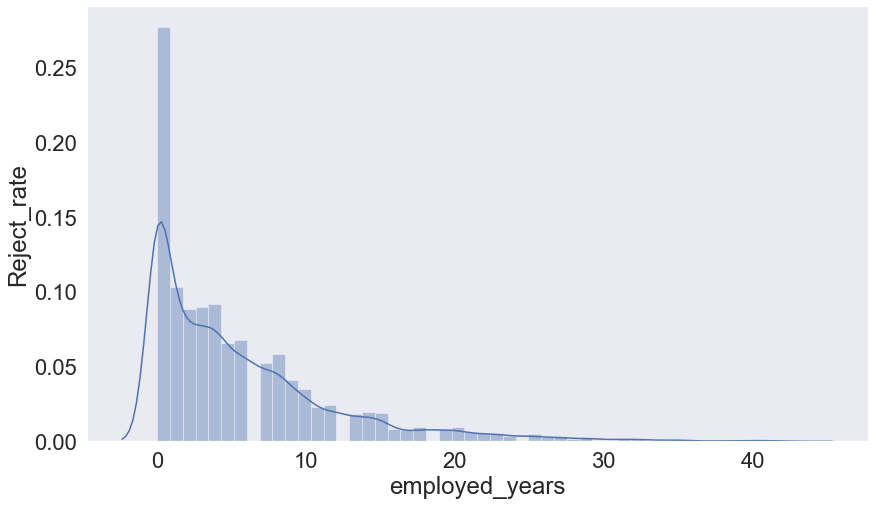

In [420]:
plt.subplots(figsize = (14, 8))
plt.ylabel('Reject_rate')
employed_year_plot = pd.Series(continuous_df.employed_years, name = "employed_years")
sns.distplot(employed_year_plot)
plt.grid(False)
plt.show()

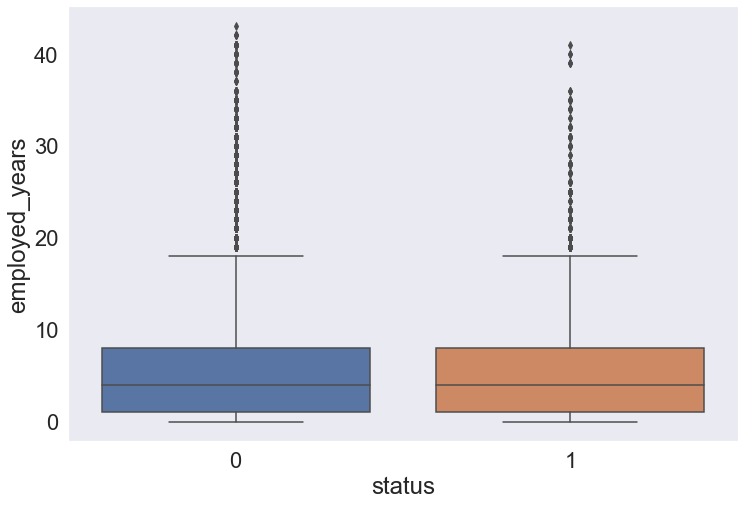

In [421]:
sns.boxplot(x = "status", y = "employed_years", data = continuous_df)
plt.grid(False)
plt.show()

In [422]:
continuous_df.employed_years.describe()

count   36457.00
mean        5.61
std         6.41
min         0.00
25%         1.00
50%         4.00
75%         8.00
max        43.00
Name: employed_years, dtype: float64

#### We are going to develop the relation between Status with age and income or employed years and income.

In [423]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [424]:
continuous_df.shape

(36457, 23)

In [425]:
continuous_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [426]:
comparison_df = continuous_df.copy()
comparison_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [427]:
comparison_df['age_5'] = comparison_df.age.apply(lambda x: int(x / 5) * 5)

In [428]:
comparison_df['age_5'].head(10)

0    40
1    40
2    50
3    50
4    50
5    50
6    50
7    50
8    50
9    50
Name: age_5, dtype: int64

In [429]:
# comparison_df['employed_year_5'] = comparison_df[comparison_df.work_experience < 0].work_experience.apply(lambda x: int(-x / 365.25 / 5) * 5)

comparison_df['employed_year_5'] = comparison_df.employed_years.apply(lambda x: int(x / 5) * 5)

In [430]:
comparison_df['employed_year_5'].head(10)

0    10
1    10
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
Name: employed_year_5, dtype: int64

<Figure size 864x576 with 0 Axes>

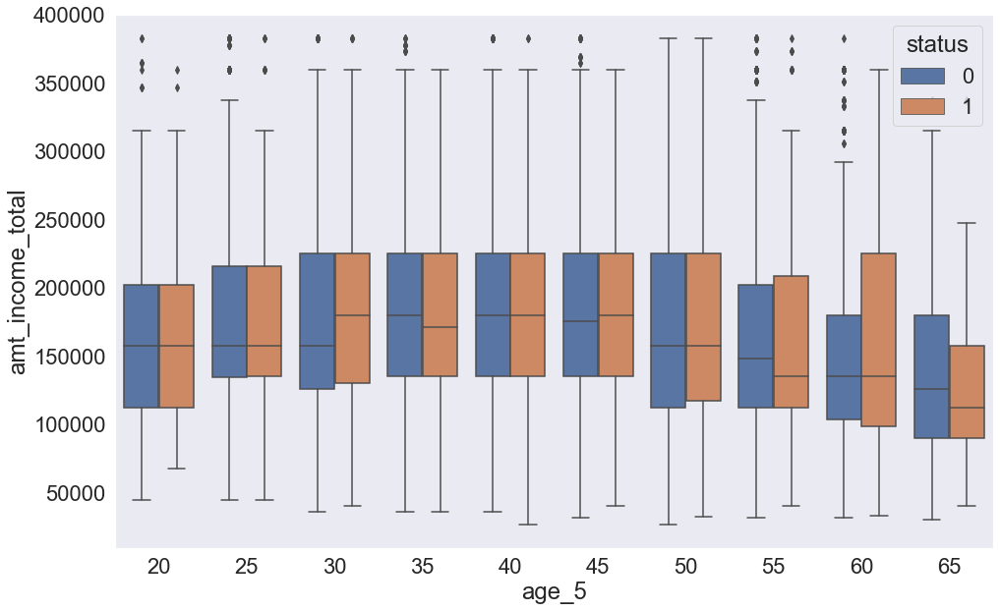

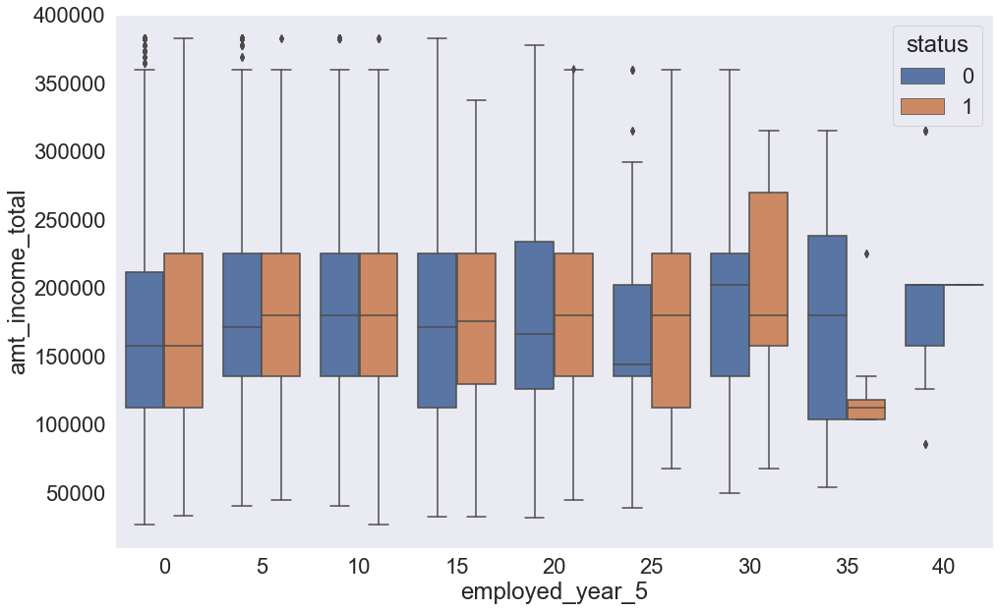

In [431]:
plot_fig = plt.figure()
plt.subplots(figsize = (16, 10))
aei_plot = sns.boxplot(x = "age_5", y = "amt_income_total", hue = 'status', data = comparison_df[comparison_df.amt_income_total <= 382500])
plt.grid(False)
plt.show()
plt.subplots(figsize = (16, 10))
aei_plot = sns.boxplot(x = "employed_year_5", y = "amt_income_total", hue = 'status', data = comparison_df[comparison_df.amt_income_total <= 382500])
plt.grid(False)
plt.show()

Analysis:-

    * As figures above, we can know that in terms of age and income rejected applicants are not quite different from 
      approved applicants through the combination of five-number summary in boxplot. 

    * However, in terms of age and employed year, applicants with more than 30 years of service are more likely not to be 
      rejected.

#### 2.3 Categorical Features

There are 5 categorical features in a dataset 'continuous_df':-

    * name_income_type              
    * name_education_type                
    * name_family_status           
    * name_housing_type               
    * occupation_type               


In [432]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [433]:
categorical_df = continuous_df.copy()

In [434]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [435]:
categorical_df.shape

(36457, 23)

#### name_income_type Analysis

In [436]:
categorical_df.isnull().sum()

code_gender                   0
flag_own_car                  0
flag_own_realty               0
cnt_children                  0
amt_income_total              0
name_income_type              0
name_education_type           0
name_family_status            0
name_housing_type             0
days_birth                    0
days_employed                 0
flag_work_phone               0
flag_phone                    0
flag_email                    0
occupation_type           11323
cnt_fam_members               0
status                        0
children_cnt_bucket           0
cnt_fam_members_bucket        0
income_bucket                 0
age                           0
age_bucket                    0
employed_years                0
dtype: int64

In [437]:
categorical_df.name_income_type.nunique()

5

In [438]:
categorical_df.name_income_type.unique()

array(['Working', 'Pensioner', 'Commercial associate', 'State servant',
       'Student'], dtype=object)

In [439]:
categorical_df.name_income_type.value_counts()

Working                 18819
Commercial associate     8490
Pensioner                6152
State servant            2985
Student                    11
Name: name_income_type, dtype: int64

In [440]:
categorical_df.name_income_type.value_counts(normalize = True)

Working                0.52
Commercial associate   0.23
Pensioner              0.17
State servant          0.08
Student                0.00
Name: name_income_type, dtype: float64

In [441]:
pd.crosstab(categorical_df['name_income_type'], categorical_df['status'], margins = True)

status,0,1,All
name_income_type,,,
Commercial associate,7410,1080,8490
Pensioner,5508,644,6152
State servant,2600,385,2985
Student,10,1,11
Working,16638,2181,18819
All,32166,4291,36457


In [442]:
inctyp_total = categorical_df.groupby(by = ['name_income_type']).size().reset_index(name = 'times')
inctyp_total

,name_income_type,times
0,Commercial associate,8490
1,Pensioner,6152
2,State servant,2985
3,Student,11
4,Working,18819


In [443]:
inctyp_reject = categorical_df[categorical_df.status == 1].groupby(by = ['name_income_type']).size().reset_index(name = 'reject_times')
inctyp_reject

,name_income_type,reject_times
0,Commercial associate,1080
1,Pensioner,644
2,State servant,385
3,Student,1
4,Working,2181


In [444]:
inctyp_reject_rate = pd.merge(inctyp_total, inctyp_reject, how = 'outer', on = ['name_income_type']).fillna(0)
inctyp_reject_rate

,name_income_type,times,reject_times
0,Commercial associate,8490,1080
1,Pensioner,6152,644
2,State servant,2985,385
3,Student,11,1
4,Working,18819,2181


In [445]:
inctyp_reject_rate['reject_rate'] = inctyp_reject_rate.reject_times / inctyp_reject_rate.times
inctyp_reject_rate

,name_income_type,times,reject_times,reject_rate
0,Commercial associate,8490,1080,0.13
1,Pensioner,6152,644,0.10
2,State servant,2985,385,0.13
3,Student,11,1,0.09
4,Working,18819,2181,0.12


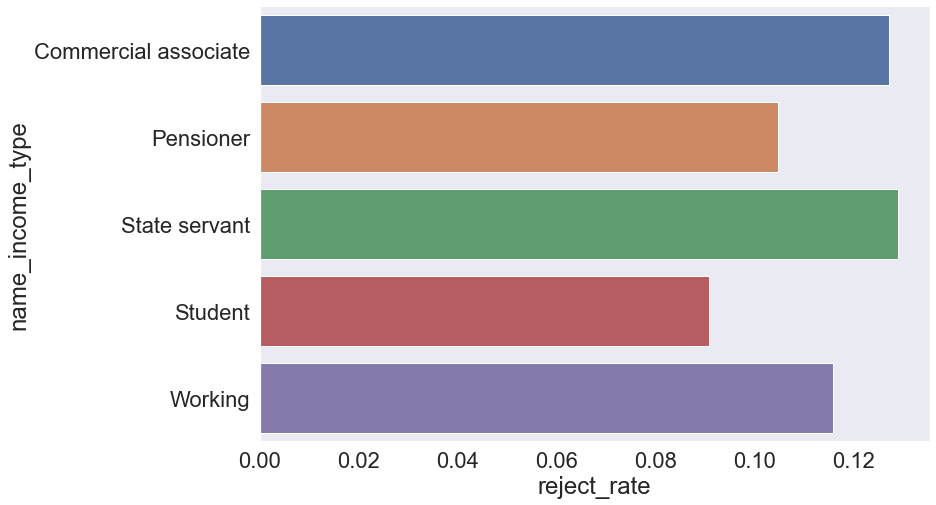

In [446]:
plt.subplots(figsize = (12, 8))
sns.barplot(y = "name_income_type", x = "reject_rate", data = inctyp_reject_rate, orient = 'h')
plt.grid(False)
plt.show()

#### Education Analysis

In [447]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [448]:
categorical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [449]:
categorical_df.isnull().sum()

code_gender                   0
flag_own_car                  0
flag_own_realty               0
cnt_children                  0
amt_income_total              0
name_income_type              0
name_education_type           0
name_family_status            0
name_housing_type             0
days_birth                    0
days_employed                 0
flag_work_phone               0
flag_phone                    0
flag_email                    0
occupation_type           11323
cnt_fam_members               0
status                        0
children_cnt_bucket           0
cnt_fam_members_bucket        0
income_bucket                 0
age                           0
age_bucket                    0
employed_years                0
dtype: int64

In [450]:
categorical_df.name_education_type.nunique()

5

In [451]:
categorical_df.name_education_type.unique()

array(['Higher education', 'Secondary / secondary special',
       'Lower secondary', 'Incomplete higher', 'Academic degree'],
      dtype=object)

In [452]:
categorical_df.name_education_type.value_counts()

Secondary / secondary special    24777
Higher education                  9864
Incomplete higher                 1410
Lower secondary                    374
Academic degree                     32
Name: name_education_type, dtype: int64

In [453]:
categorical_df.name_education_type.value_counts(normalize = True)

Secondary / secondary special   0.68
Higher education                0.27
Incomplete higher               0.04
Lower secondary                 0.01
Academic degree                 0.00
Name: name_education_type, dtype: float64

In [454]:
pd.crosstab(categorical_df['name_education_type'], categorical_df['status'], margins = True)

status,0,1,All
name_education_type,,,
Academic degree,25,7,32
Higher education,8716,1148,9864
Incomplete higher,1203,207,1410
Lower secondary,335,39,374
Secondary / secondary special,21887,2890,24777
All,32166,4291,36457


In [455]:
edu_total = categorical_df.groupby(by = ['name_education_type']).size().reset_index(name = 'times')
edu_total

,name_education_type,times
0,Academic degree,32
1,Higher education,9864
2,Incomplete higher,1410
3,Lower secondary,374
4,Secondary / secondary special,24777


In [456]:
edu_reject = categorical_df[categorical_df.status == 1].groupby(by = ['name_education_type']).size().reset_index(name = 'reject_times')
edu_reject

,name_education_type,reject_times
0,Academic degree,7
1,Higher education,1148
2,Incomplete higher,207
3,Lower secondary,39
4,Secondary / secondary special,2890


In [457]:
edu_reject_rate = pd.merge(edu_total, edu_reject, how = 'outer', on = ['name_education_type']).fillna(0)
edu_reject_rate

,name_education_type,times,reject_times
0,Academic degree,32,7
1,Higher education,9864,1148
2,Incomplete higher,1410,207
3,Lower secondary,374,39
4,Secondary / secondary special,24777,2890


In [458]:
edu_reject_rate['reject_rate'] = edu_reject_rate.reject_times / edu_reject_rate.times
edu_reject_rate

,name_education_type,times,reject_times,reject_rate
0,Academic degree,32,7,0.22
1,Higher education,9864,1148,0.12
2,Incomplete higher,1410,207,0.15
3,Lower secondary,374,39,0.10
4,Secondary / secondary special,24777,2890,0.12


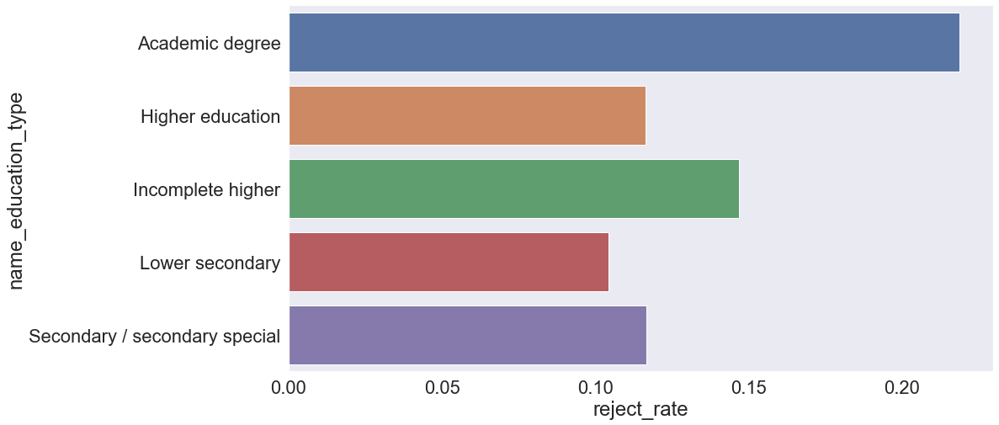

In [459]:
plt.subplots(figsize = (15, 8))
sns.barplot(y = "name_education_type", x = "reject_rate", data = edu_reject_rate, orient = 'h')
plt.grid(False)
plt.show()

#### Marital Status Analysis

In [460]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [461]:
categorical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [462]:
categorical_df.isnull().sum()

code_gender                   0
flag_own_car                  0
flag_own_realty               0
cnt_children                  0
amt_income_total              0
name_income_type              0
name_education_type           0
name_family_status            0
name_housing_type             0
days_birth                    0
days_employed                 0
flag_work_phone               0
flag_phone                    0
flag_email                    0
occupation_type           11323
cnt_fam_members               0
status                        0
children_cnt_bucket           0
cnt_fam_members_bucket        0
income_bucket                 0
age                           0
age_bucket                    0
employed_years                0
dtype: int64

In [463]:
categorical_df.name_family_status.nunique()

5

In [464]:
categorical_df.name_family_status.unique()

array(['Civil marriage', 'Married', 'Separated', 'Single / not married',
       'Widow'], dtype=object)

In [465]:
categorical_df.name_family_status.value_counts()

Married                 25048
Single / not married     4829
Civil marriage           2945
Separated                2103
Widow                    1532
Name: name_family_status, dtype: int64

In [466]:
categorical_df.name_family_status.value_counts(normalize = True)

Married                0.69
Single / not married   0.13
Civil marriage         0.08
Separated              0.06
Widow                  0.04
Name: name_family_status, dtype: float64

In [467]:
pd.crosstab(categorical_df['name_family_status'], categorical_df['status'], margins = True)

status,0,1,All
name_family_status,,,
Civil marriage,2578,367,2945
Married,22134,2914,25048
Separated,1878,225,2103
Single / not married,4206,623,4829
Widow,1370,162,1532
All,32166,4291,36457


In [468]:
ms_total = categorical_df.groupby(by = ['name_family_status']).size().reset_index(name = 'times')
ms_total

,name_family_status,times
0,Civil marriage,2945
1,Married,25048
2,Separated,2103
3,Single / not married,4829
4,Widow,1532


In [469]:
ms_reject = categorical_df[categorical_df.status == 1].groupby(by = ['name_family_status']).size().reset_index(name = 'reject_times')
ms_reject

,name_family_status,reject_times
0,Civil marriage,367
1,Married,2914
2,Separated,225
3,Single / not married,623
4,Widow,162


In [470]:
ms_reject_rate = pd.merge(ms_total, ms_reject, how = 'outer', on = ['name_family_status']).fillna(0)
ms_reject_rate

,name_family_status,times,reject_times
0,Civil marriage,2945,367
1,Married,25048,2914
2,Separated,2103,225
3,Single / not married,4829,623
4,Widow,1532,162


In [471]:
ms_reject_rate['reject_rate'] = ms_reject_rate.reject_times / ms_reject_rate.times
ms_reject_rate

,name_family_status,times,reject_times,reject_rate
0,Civil marriage,2945,367,0.12
1,Married,25048,2914,0.12
2,Separated,2103,225,0.11
3,Single / not married,4829,623,0.13
4,Widow,1532,162,0.11


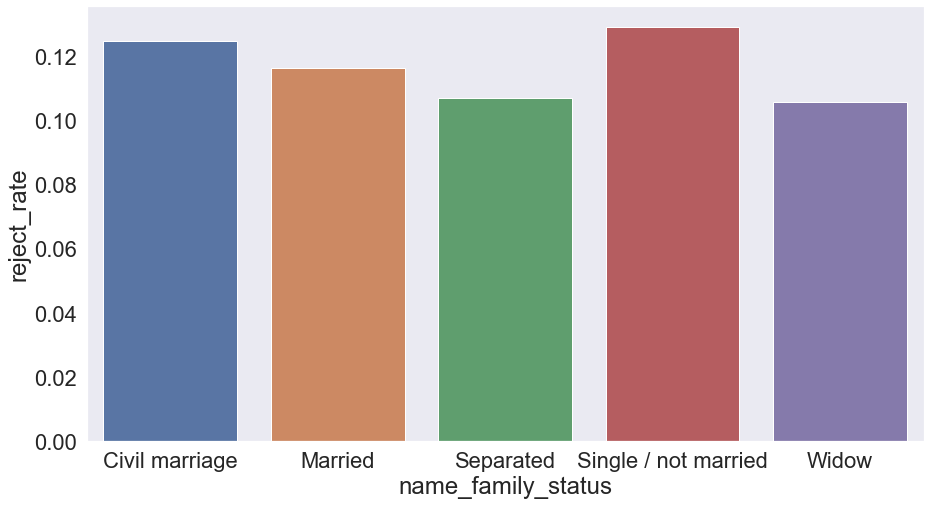

In [472]:
plt.subplots(figsize = (15, 8))
sns.barplot(x = "name_family_status", y = "reject_rate", data = ms_reject_rate)
plt.grid(False)
plt.show()

#### House Type Analysis

In [473]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [474]:
categorical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [475]:
categorical_df.isnull().sum()

code_gender                   0
flag_own_car                  0
flag_own_realty               0
cnt_children                  0
amt_income_total              0
name_income_type              0
name_education_type           0
name_family_status            0
name_housing_type             0
days_birth                    0
days_employed                 0
flag_work_phone               0
flag_phone                    0
flag_email                    0
occupation_type           11323
cnt_fam_members               0
status                        0
children_cnt_bucket           0
cnt_fam_members_bucket        0
income_bucket                 0
age                           0
age_bucket                    0
employed_years                0
dtype: int64

In [476]:
categorical_df.name_housing_type.nunique()

6

In [477]:
categorical_df.name_housing_type.unique()

array(['House / apartment', 'Office apartment', 'Rented apartment',
       'Municipal apartment', 'With parents', 'Co-op apartment'],
      dtype=object)

In [478]:
categorical_df.name_housing_type.value_counts()

House / apartment      32548
With parents            1776
Municipal apartment     1128
Rented apartment         575
Office apartment         262
Co-op apartment          168
Name: name_housing_type, dtype: int64

In [479]:
categorical_df.name_housing_type.value_counts(normalize = True)

House / apartment     0.89
With parents          0.05
Municipal apartment   0.03
Rented apartment      0.02
Office apartment      0.01
Co-op apartment       0.00
Name: name_housing_type, dtype: float64

In [480]:
pd.crosstab(categorical_df['name_housing_type'], categorical_df['status'], margins = True)

status,0,1,All
name_housing_type,,,
Co-op apartment,154,14,168
House / apartment,28766,3782,32548
Municipal apartment,978,150,1128
Office apartment,224,38,262
Rented apartment,495,80,575
With parents,1549,227,1776
All,32166,4291,36457


In [481]:
h_total = categorical_df.groupby(by = ['name_housing_type']).size().reset_index(name = 'times')
h_total

,name_housing_type,times
0,Co-op apartment,168
1,House / apartment,32548
2,Municipal apartment,1128
3,Office apartment,262
4,Rented apartment,575
5,With parents,1776


In [482]:
h_reject = categorical_df[categorical_df.status == 1].groupby(by = ['name_housing_type']).size().reset_index(name = 'reject_times')
h_reject

,name_housing_type,reject_times
0,Co-op apartment,14
1,House / apartment,3782
2,Municipal apartment,150
3,Office apartment,38
4,Rented apartment,80
5,With parents,227


In [483]:
h_reject_rate = pd.merge(h_total, h_reject, how = 'outer', on = ['name_housing_type']).fillna(0)
h_reject_rate

,name_housing_type,times,reject_times
0,Co-op apartment,168,14
1,House / apartment,32548,3782
2,Municipal apartment,1128,150
3,Office apartment,262,38
4,Rented apartment,575,80
5,With parents,1776,227


In [484]:
h_reject_rate['reject_rate'] = h_reject_rate.reject_times / h_reject_rate.times
h_reject_rate

,name_housing_type,times,reject_times,reject_rate
0,Co-op apartment,168,14,0.08
1,House / apartment,32548,3782,0.12
2,Municipal apartment,1128,150,0.13
3,Office apartment,262,38,0.15
4,Rented apartment,575,80,0.14
5,With parents,1776,227,0.13


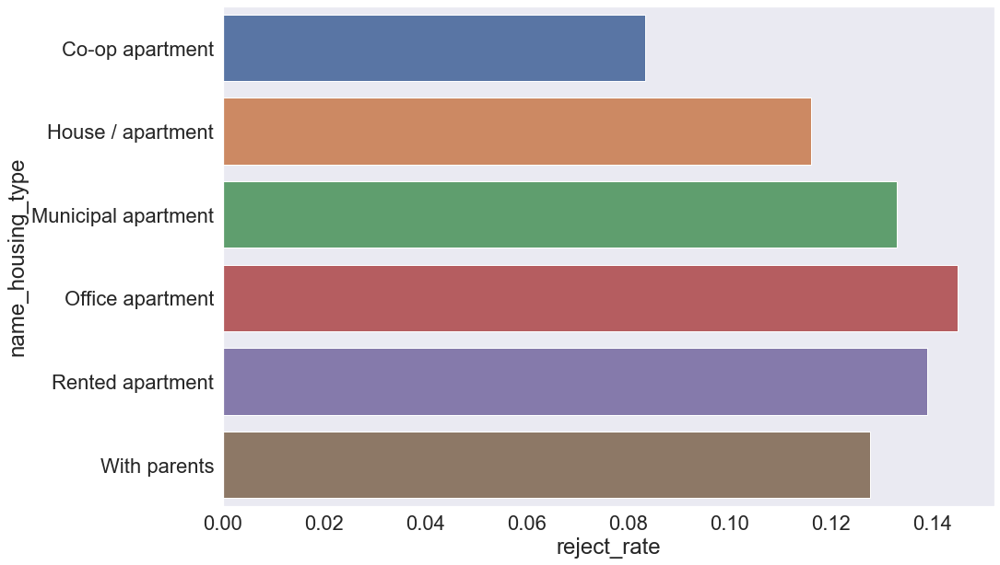

In [485]:
plt.subplots(figsize = (15, 10))
sns.barplot(y = "name_housing_type", x = "reject_rate", data = h_reject_rate, orient = 'h')
plt.grid(False)
plt.show()

#### Occupation Analysis

In [486]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [487]:
categorical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [488]:
categorical_df.isnull().sum()

code_gender                   0
flag_own_car                  0
flag_own_realty               0
cnt_children                  0
amt_income_total              0
name_income_type              0
name_education_type           0
name_family_status            0
name_housing_type             0
days_birth                    0
days_employed                 0
flag_work_phone               0
flag_phone                    0
flag_email                    0
occupation_type           11323
cnt_fam_members               0
status                        0
children_cnt_bucket           0
cnt_fam_members_bucket        0
income_bucket                 0
age                           0
age_bucket                    0
employed_years                0
dtype: int64

In [489]:
categorical_df.occupation_type.nunique()

18

In [490]:
categorical_df.occupation_type.unique()

array(['Managers', 'Security staff', nan, 'Cleaning staff', 'Core staff',
       'Laborers', 'Cooking staff', 'Medicine staff', 'Accountants',
       'Sales staff', 'Low-skill Laborers', 'High skill tech staff',
       'Drivers', 'Secretaries', 'Waiters/barmen staff',
       'Private service staff', 'Realty agents', 'IT staff', 'HR staff'],
      dtype=object)

In [491]:
categorical_df.occupation_type.value_counts()

Laborers                 6211
Core staff               3591
Sales staff              3485
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: occupation_type, dtype: int64

In [492]:
categorical_df.occupation_type.value_counts().sum()

25134

In [493]:
# Verify the records to fill / replace

pensioner = categorical_df.loc[categorical_df.name_income_type == 'Pensioner'].loc[categorical_df.employed_years == 0] #.groupby(by = ['name_family_status']).size().reset_index(name = 'reject_times')
pensioner.count()

code_gender               6136
flag_own_car              6136
flag_own_realty           6136
cnt_children              6136
amt_income_total          6136
name_income_type          6136
name_education_type       6136
name_family_status        6136
name_housing_type         6136
days_birth                6136
days_employed             6136
flag_work_phone           6136
flag_phone                6136
flag_email                6136
occupation_type              1
cnt_fam_members           6136
status                    6136
children_cnt_bucket       6136
cnt_fam_members_bucket    6136
income_bucket             6136
age                       6136
age_bucket                6136
employed_years            6136
dtype: int64

In [494]:
pensioner.shape[0]

6136

In [495]:
pensioner.name_income_type.count()

6136

In [496]:
pensioner.employed_years.count()

6136

In [497]:
# By checking multiple conditions

categorical_df['occupation_type'] = np.where((categorical_df['name_income_type'] == 'Pensioner') & (categorical_df['employed_years'] == 0), 'Retired', categorical_df['occupation_type'])

In [498]:
categorical_df['occupation_type'].value_counts()

Laborers                 6210
Retired                  6136
Core staff               3591
Sales staff              3485
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: occupation_type, dtype: int64

In [499]:
categorical_df.isnull().sum()

code_gender                  0
flag_own_car                 0
flag_own_realty              0
cnt_children                 0
amt_income_total             0
name_income_type             0
name_education_type          0
name_family_status           0
name_housing_type            0
days_birth                   0
days_employed                0
flag_work_phone              0
flag_phone                   0
flag_email                   0
occupation_type           5188
cnt_fam_members              0
status                       0
children_cnt_bucket          0
cnt_fam_members_bucket       0
income_bucket                0
age                          0
age_bucket                   0
employed_years               0
dtype: int64

* There are still pending null values in the occupations variable to be treated.

In [500]:
# Impute pending missing values by creating a new category 'Others' in the Occupation column

categorical_df['occupation_type'] = categorical_df['occupation_type'].fillna("Others")

# applications['OCCUPATION_TYPE'].fillna(value='Other', inplace=True)

In [501]:
categorical_df.occupation_type.value_counts()

Laborers                 6210
Retired                  6136
Others                   5188
Core staff               3591
Sales staff              3485
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: occupation_type, dtype: int64

In [502]:
categorical_df.occupation_type.value_counts(normalize = True)

Laborers                0.17
Retired                 0.17
Others                  0.14
Core staff              0.10
Sales staff             0.10
Managers                0.08
Drivers                 0.06
High skill tech staff   0.04
Accountants             0.03
Medicine staff          0.03
Cooking staff           0.02
Security staff          0.02
Cleaning staff          0.02
Private service staff   0.01
Low-skill Laborers      0.00
Waiters/barmen staff    0.00
Secretaries             0.00
HR staff                0.00
Realty agents           0.00
IT staff                0.00
Name: occupation_type, dtype: float64

In [503]:
categorical_df.isnull().sum()

code_gender               0
flag_own_car              0
flag_own_realty           0
cnt_children              0
amt_income_total          0
name_income_type          0
name_education_type       0
name_family_status        0
name_housing_type         0
days_birth                0
days_employed             0
flag_work_phone           0
flag_phone                0
flag_email                0
occupation_type           0
cnt_fam_members           0
status                    0
children_cnt_bucket       0
cnt_fam_members_bucket    0
income_bucket             0
age                       0
age_bucket                0
employed_years            0
dtype: int64

* There are no more null values in the datasetset now.

In [504]:
pd.crosstab(categorical_df['occupation_type'], categorical_df['status'], margins = True)

status,0,1,All
occupation_type,,,
Accountants,1094,147,1241
Cleaning staff,488,63,551
Cooking staff,569,86,655
Core staff,3128,463,3591
Drivers,1874,264,2138
HR staff,71,14,85
High skill tech staff,1202,181,1383
IT staff,49,11,60
Laborers,5481,729,6210


In [505]:
occ_total = categorical_df.groupby(by = ['occupation_type']).size().reset_index(name = 'times')
occ_total

,occupation_type,times
0,Accountants,1241
1,Cleaning staff,551
2,Cooking staff,655
3,Core staff,3591
4,Drivers,2138
5,HR staff,85
6,High skill tech staff,1383
7,IT staff,60
8,Laborers,6210
9,Low-skill Laborers,175


In [506]:
occ_reject = categorical_df[categorical_df.status == 1].groupby(by = ['occupation_type']).size().reset_index(name = 'reject_times')
occ_reject

,occupation_type,reject_times
0,Accountants,147
1,Cleaning staff,63
2,Cooking staff,86
3,Core staff,463
4,Drivers,264
5,HR staff,14
6,High skill tech staff,181
7,IT staff,11
8,Laborers,729
9,Low-skill Laborers,33


In [507]:
occ_reject_rate = pd.merge(occ_total, occ_reject, how = 'outer', on = ['occupation_type']).fillna(0)
occ_reject_rate

,occupation_type,times,reject_times
0,Accountants,1241,147
1,Cleaning staff,551,63
2,Cooking staff,655,86
3,Core staff,3591,463
4,Drivers,2138,264
5,HR staff,85,14
6,High skill tech staff,1383,181
7,IT staff,60,11
8,Laborers,6210,729
9,Low-skill Laborers,175,33


In [508]:
occ_reject_rate['reject_rate'] = occ_reject_rate.reject_times / occ_reject_rate.times
occ_reject_rate

,occupation_type,times,reject_times,reject_rate
0,Accountants,1241,147,0.12
1,Cleaning staff,551,63,0.11
2,Cooking staff,655,86,0.13
3,Core staff,3591,463,0.13
4,Drivers,2138,264,0.12
5,HR staff,85,14,0.16
6,High skill tech staff,1383,181,0.13
7,IT staff,60,11,0.18
8,Laborers,6210,729,0.12
9,Low-skill Laborers,175,33,0.19


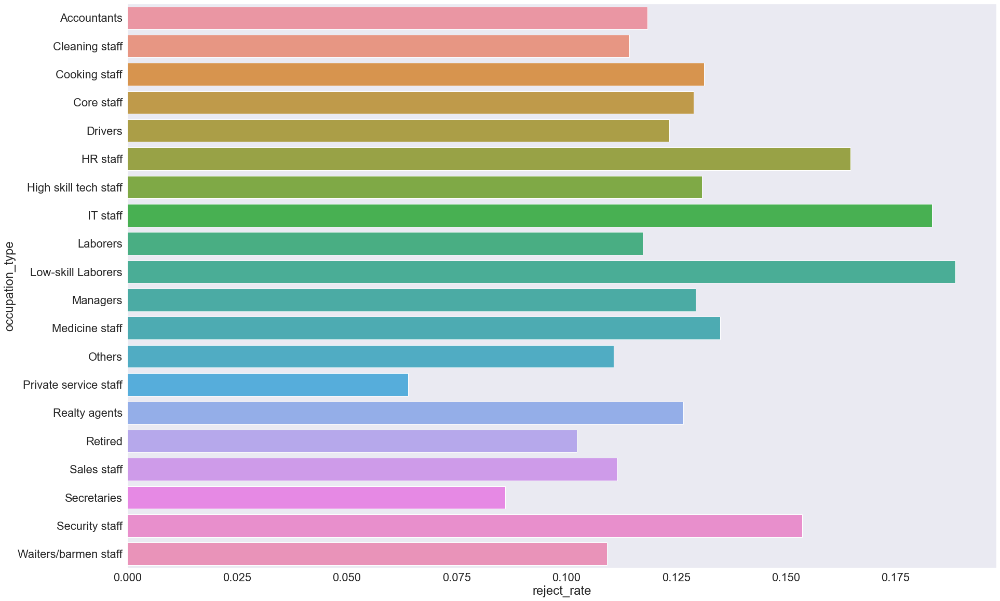

In [509]:
plt.subplots(figsize = (30, 20))
sns.barplot(x = "reject_rate", y = "occupation_type", data = occ_reject_rate, orient = 'h')
plt.grid(False)
plt.show()

#### Drop few insignificant columns

In [510]:
categorical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [511]:
categorical_df = categorical_df.drop(['days_birth', 'days_employed'], axis = 1)

In [512]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,Y,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,...,N,Retired,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,...,N,Retired,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [513]:
categorical_df.shape

(36457, 21)

In [514]:
# Drop the more variables:-

categorical_df = categorical_df.drop(['cnt_children', 'cnt_fam_members', 'income_bucket', 'age_bucket'], axis = 1)

In [515]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,children_cnt_bucket,cnt_fam_members_bucket,age,employed_years
0,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
1,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
2,F,N,Y,27000.00,Working,Secondary / secondary special,Married,House / apartment,Y,N,N,Security staff,0,None,Two,52,3.00
3,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00
4,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00


In [516]:
categorical_df.shape

(36457, 17)

In [517]:
cleaned_df = categorical_df.copy()

In [518]:
cleaned_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,children_cnt_bucket,cnt_fam_members_bucket,age,employed_years
0,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
1,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
2,F,N,Y,27000.00,Working,Secondary / secondary special,Married,House / apartment,Y,N,N,Security staff,0,None,Two,52,3.00
3,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00
4,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00


In [519]:
# Save the cleaned EDA dataset

cleaned_df.to_csv('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\cleaned_df_final.csv', index = False)

#### EDA ENDS HERE !!!

## VISUALIZATIONS

### UNIVARIATE ANALYSIS

### Continuous Variables

In [520]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [521]:
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})

#### cnt_children

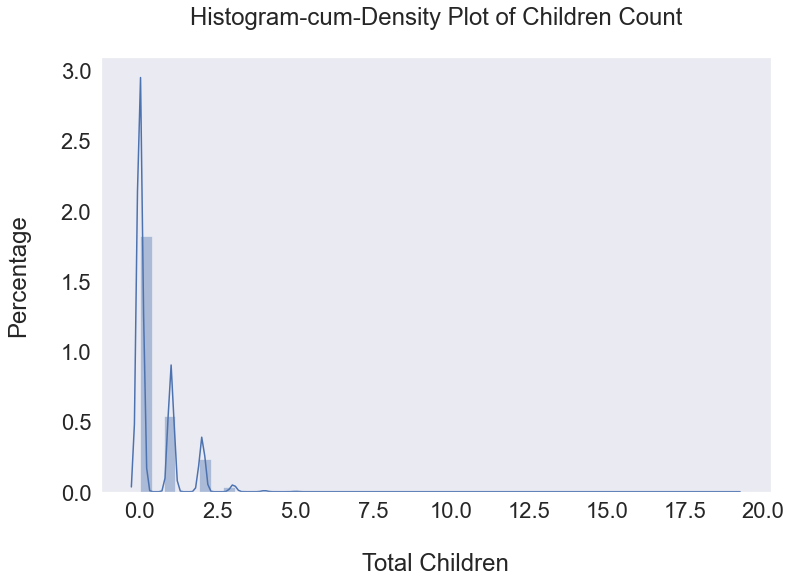

In [522]:
# Distribution Plot

plt.subplots(figsize = (12, 8))

sns.distplot(continuous_df['cnt_children'], hist = True, kde = True)

plt.title('Histogram-cum-Density Plot of Children Count\n')
plt.xlabel('\nTotal Children')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### amt_income_total

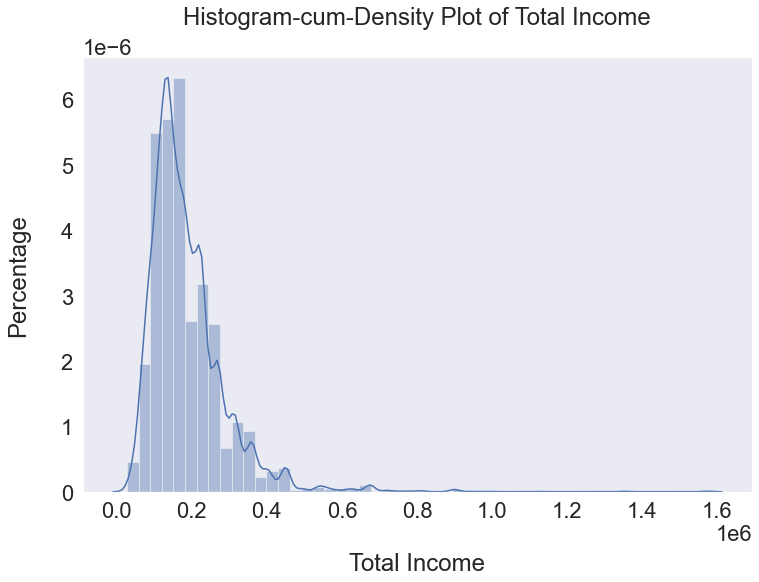

In [523]:
# Distribution Plot

plt.subplots(figsize = (12, 8))

sns.distplot(continuous_df['amt_income_total'], hist = True, kde = True)

plt.title('Histogram-cum-Density Plot of Total Income\n')
plt.xlabel('\nTotal Income')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### cnt_fam_members

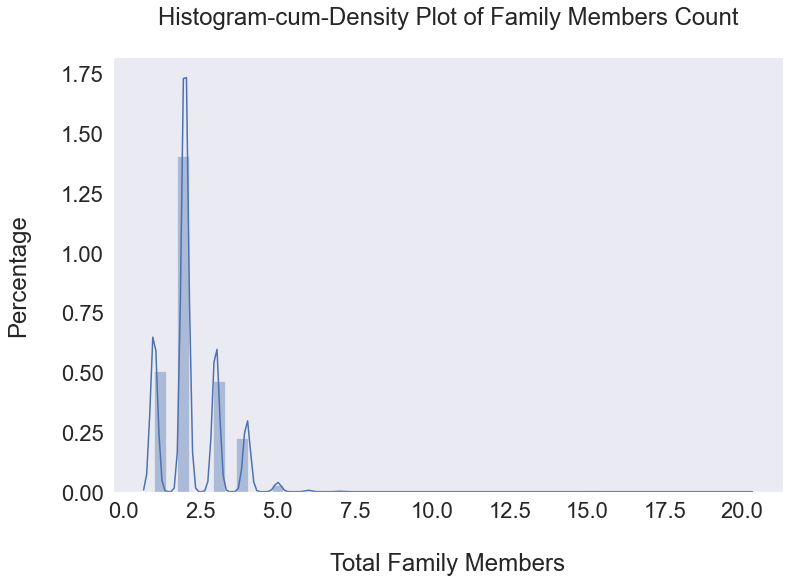

In [524]:
# Distribution Plot

plt.subplots(figsize = (12, 8))

sns.distplot(continuous_df['cnt_fam_members'], hist = True, kde = True)

plt.title('Histogram-cum-Density Plot of Family Members Count\n')
plt.xlabel('\nTotal Family Members')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### age

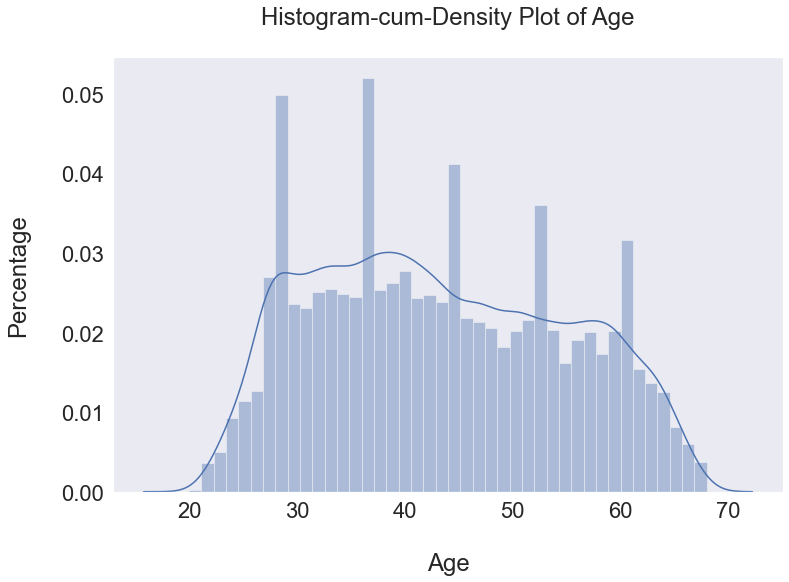

In [525]:
# Distribution Plot

plt.subplots(figsize = (12, 8))

sns.distplot(continuous_df['age'], hist = True, kde = True)

plt.title('Histogram-cum-Density Plot of Age\n')
plt.xlabel('\nAge')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### employed_years

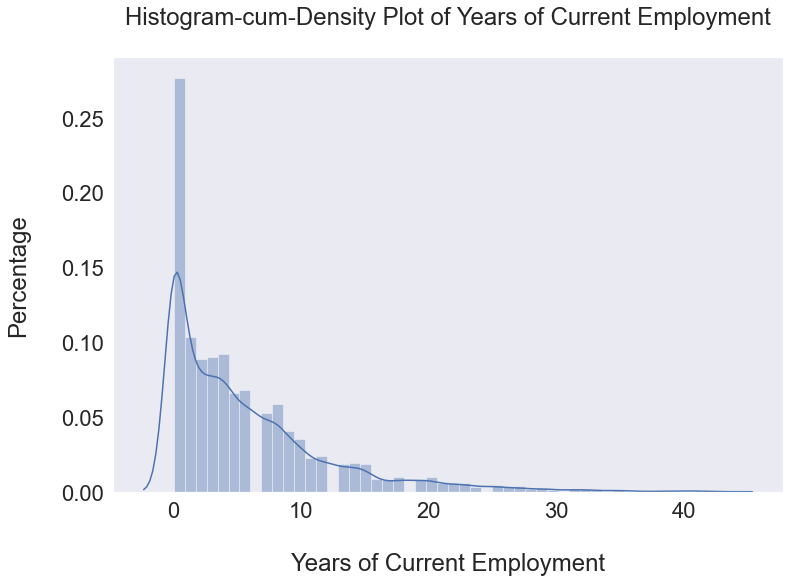

In [526]:
# Distribution Plot

plt.subplots(figsize = (12, 8))

sns.distplot(continuous_df['employed_years'], hist = True, kde = True)

plt.title('Histogram-cum-Density Plot of Years of Current Employment\n')
plt.xlabel('\nYears of Current Employment')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### status

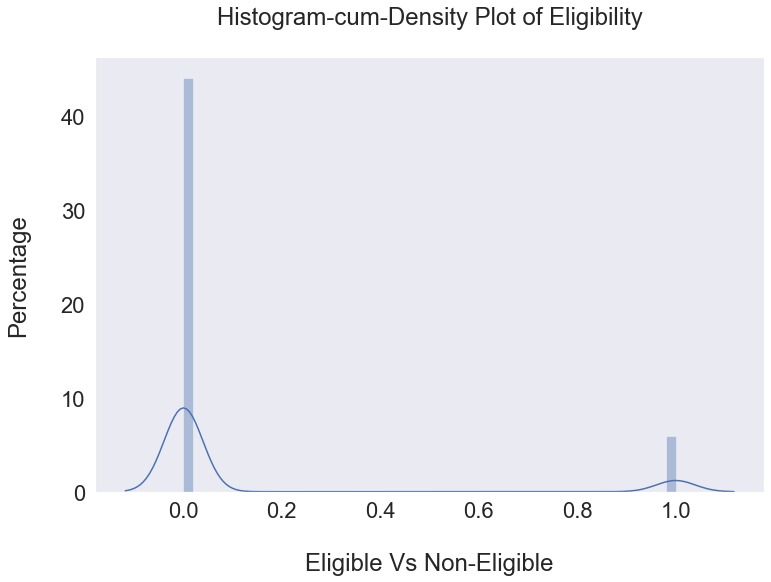

In [527]:
# Distribution Plot

plt.subplots(figsize = (12, 8))

sns.distplot(continuous_df['status'], hist = True, kde = True)

plt.title('Histogram-cum-Density Plot of Eligibility\n')
plt.xlabel('\nEligible Vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

### Categorical Variables

In [528]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,children_cnt_bucket,cnt_fam_members_bucket,age,employed_years
0,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
1,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
2,F,N,Y,27000.00,Working,Secondary / secondary special,Married,House / apartment,Y,N,N,Security staff,0,None,Two,52,3.00
3,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00
4,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00


#### code_gender

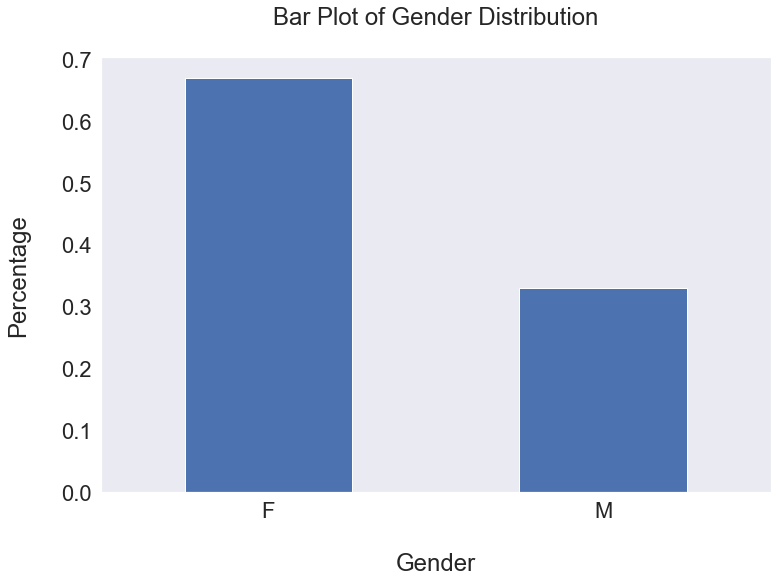

In [529]:
# Bar Plot

categorical_df['code_gender'].value_counts(normalize = True).sort_index().plot.bar()

plt.title('Bar Plot of Gender Distribution\n')
plt.xlabel('\nGender')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### flag_own_car

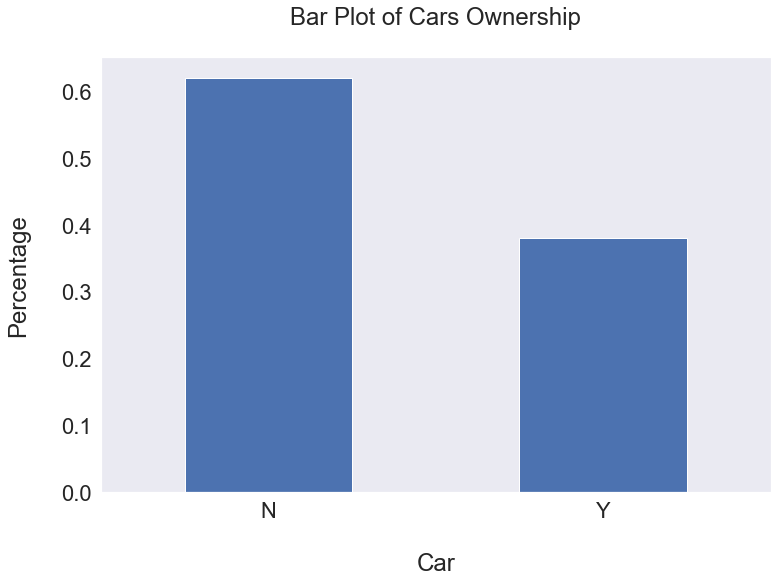

In [530]:
# Bar Plot

categorical_df['flag_own_car'].value_counts(normalize = True).sort_index().plot.bar()

plt.title('Bar Plot of Cars Ownership\n')
plt.xlabel('\nCar')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### flag_own_realty

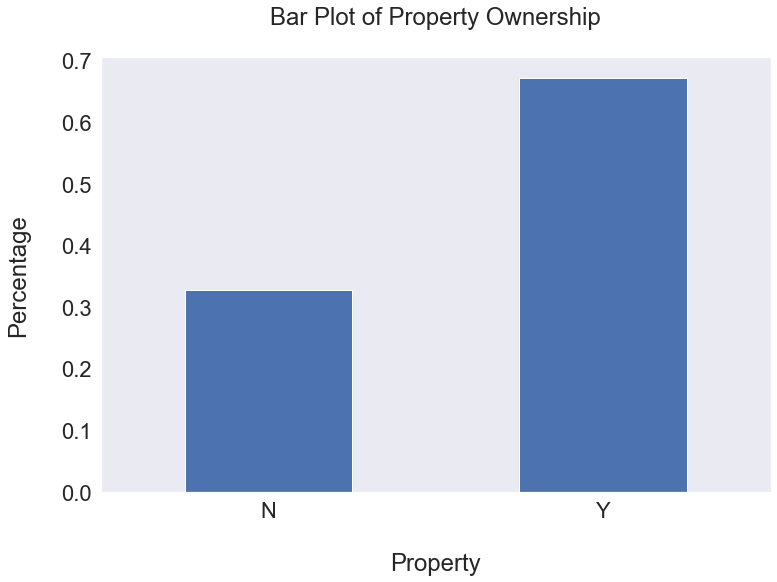

In [531]:
# Bar Plot

categorical_df['flag_own_realty'].value_counts(normalize = True).sort_index().plot.bar()

plt.title('Bar Plot of Property Ownership\n')
plt.xlabel('\nProperty')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### name_income_type

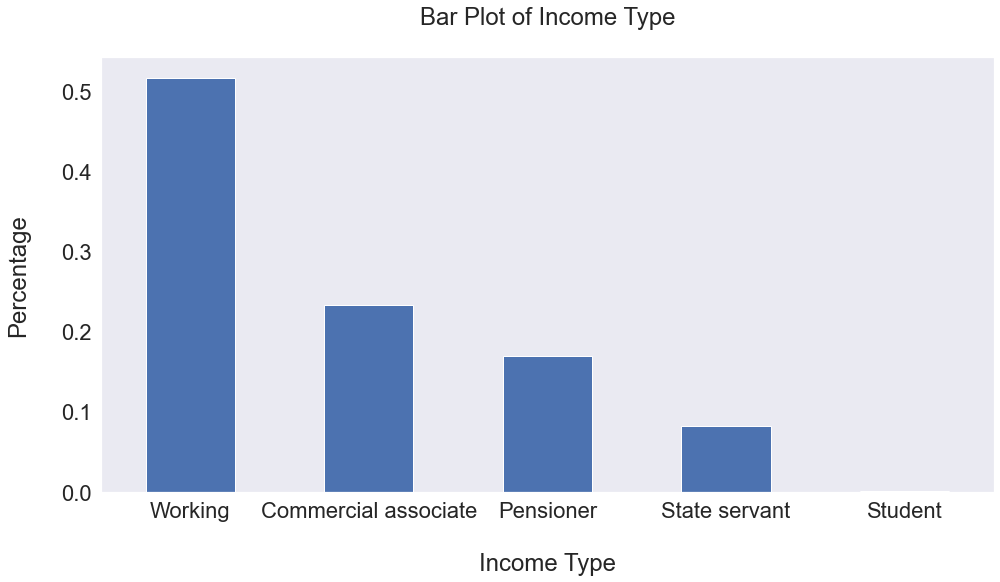

In [532]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['name_income_type'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Income Type\n')
plt.xlabel('\nIncome Type')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### name_education_type

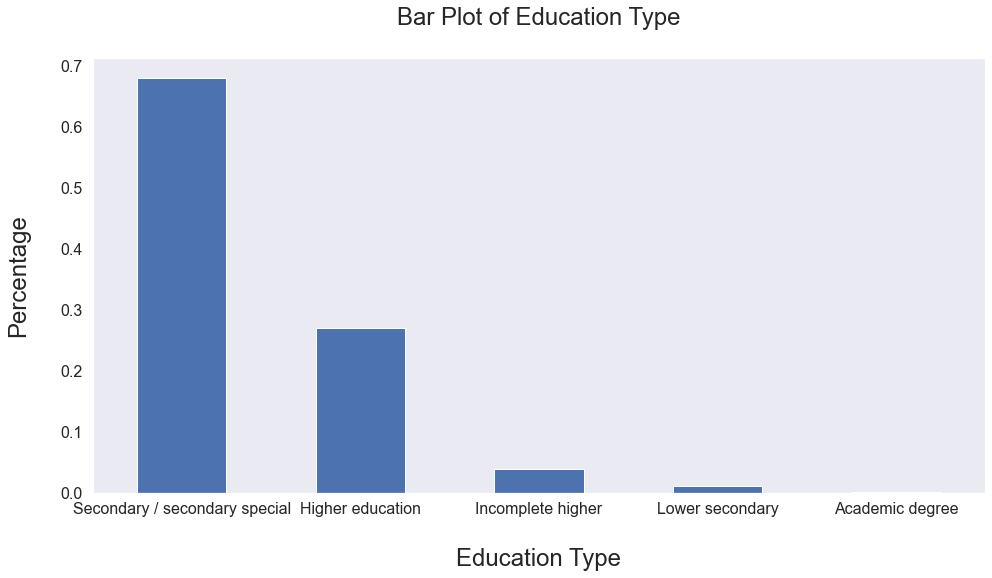

In [533]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['name_education_type'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Education Type\n')
plt.xlabel('\nEducation Type')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0, fontsize = 16)
plt.yticks(rotation = 0, fontsize = 16)

plt.grid(False)

#### name_family_status

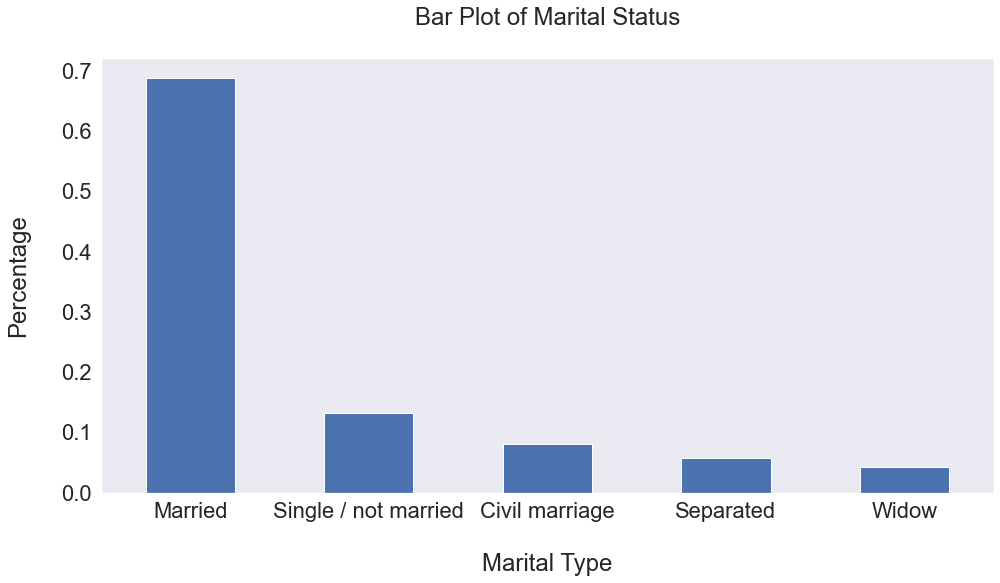

In [534]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['name_family_status'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Marital Status\n')
plt.xlabel('\nMarital Type')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### name_housing_type

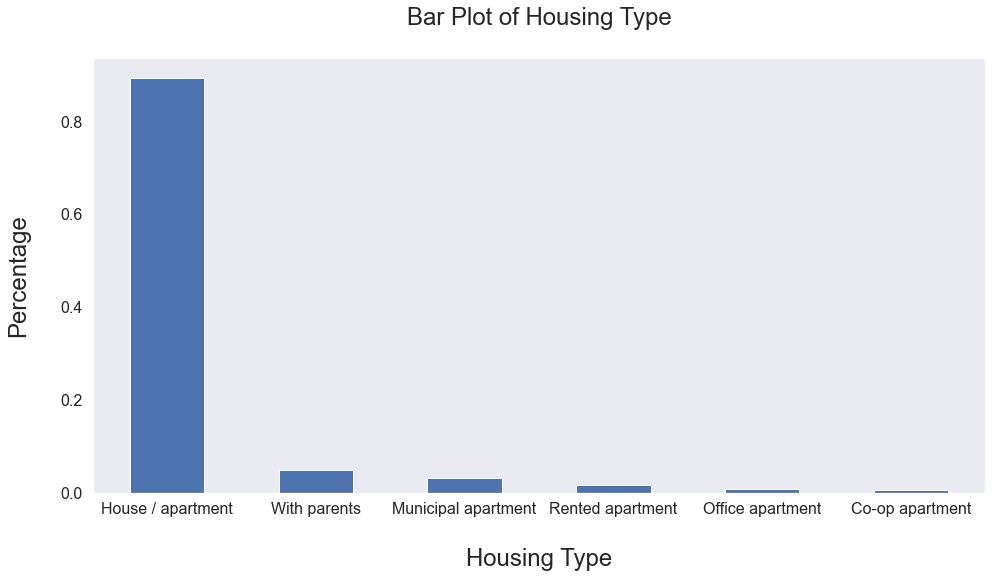

In [535]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['name_housing_type'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Housing Type\n')
plt.xlabel('\nHousing Type')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)
plt.xticks(rotation = 0, fontsize = 16)
plt.yticks(rotation = 0, fontsize = 16)

plt.grid(False)

#### occupation_type

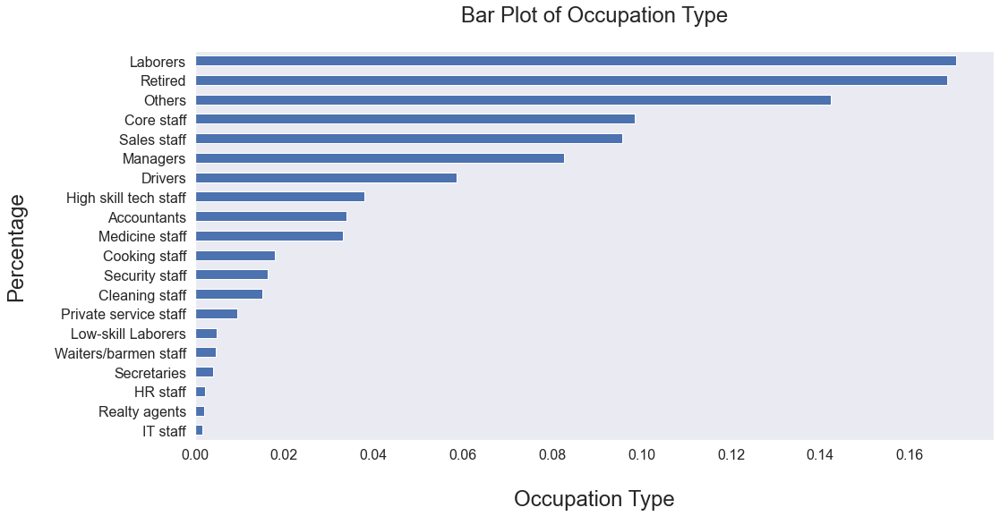

In [536]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['occupation_type'].value_counts(normalize = True).sort_values(ascending=True).plot.barh()

plt.title('Bar Plot of Occupation Type\n')
plt.xlabel('\nOccupation Type')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)
plt.xticks(rotation = 0, fontsize = 16)
plt.yticks(rotation = 0, fontsize = 16)

plt.grid(False)

#### flag_work_phone

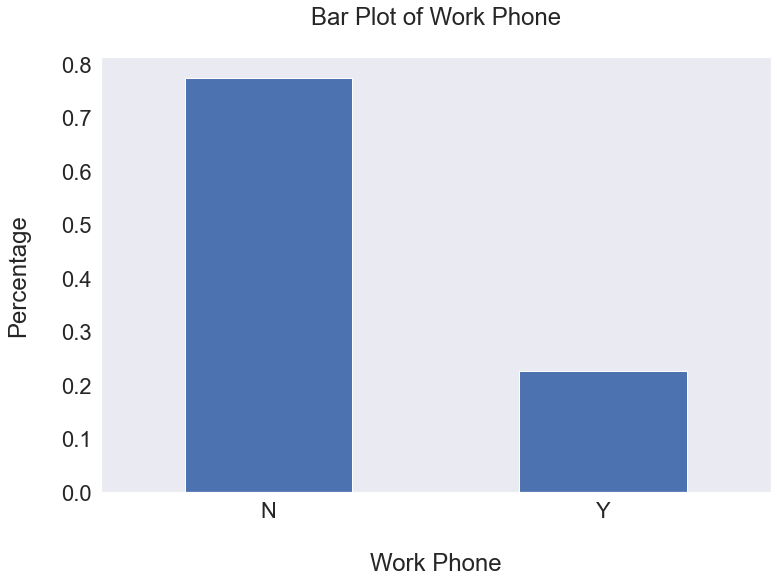

In [537]:
# Bar Plot

#plt.subplots(figsize = (16, 8))

categorical_df['flag_work_phone'].value_counts(normalize = True).sort_index().plot.bar()

plt.title('Bar Plot of Work Phone\n')
plt.xlabel('\nWork Phone')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### flag_phone

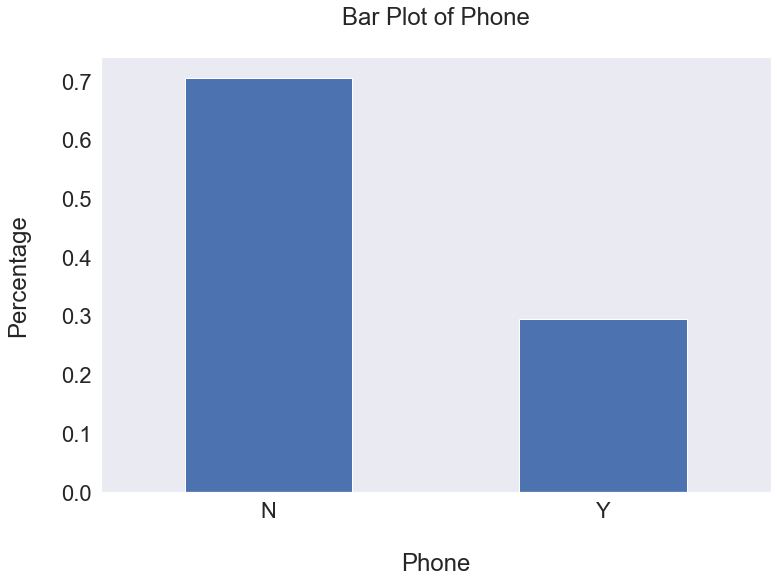

In [538]:
# Bar Plot

#plt.subplots(figsize = (16, 8))

categorical_df['flag_phone'].value_counts(normalize = True).sort_index().plot.bar()

plt.title('Bar Plot of Phone\n')
plt.xlabel('\nPhone')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### flag_email

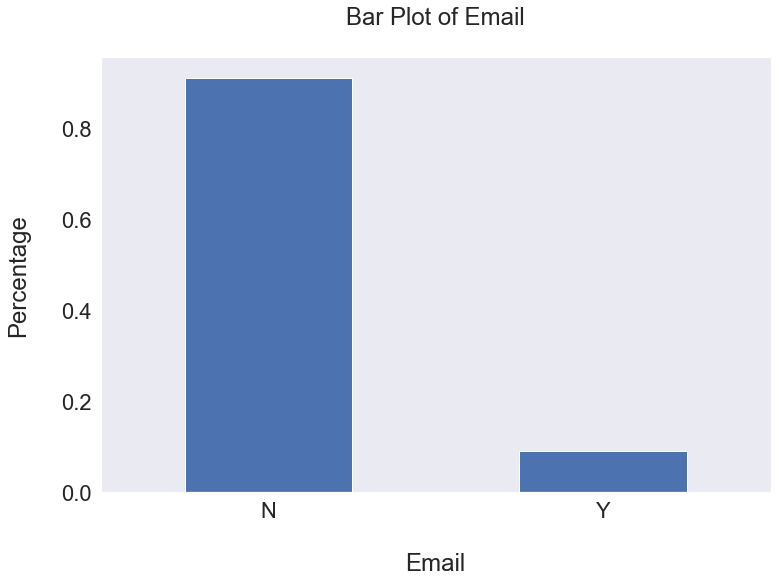

In [539]:
# Bar Plot

#plt.subplots(figsize = (16, 8))

categorical_df['flag_email'].value_counts(normalize = True).sort_index().plot.bar()

plt.title('Bar Plot of Email\n')
plt.xlabel('\nEmail')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### children_cnt_bucket

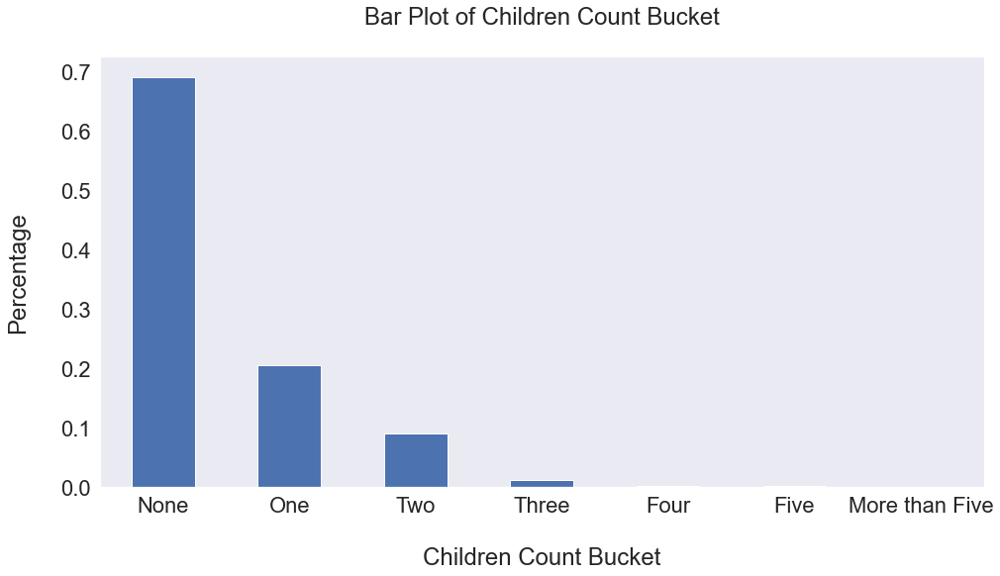

In [540]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['children_cnt_bucket'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Children Count Bucket\n')
plt.xlabel('\nChildren Count Bucket')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)

plt.grid(False)

#### cnt_fam_members_bucket

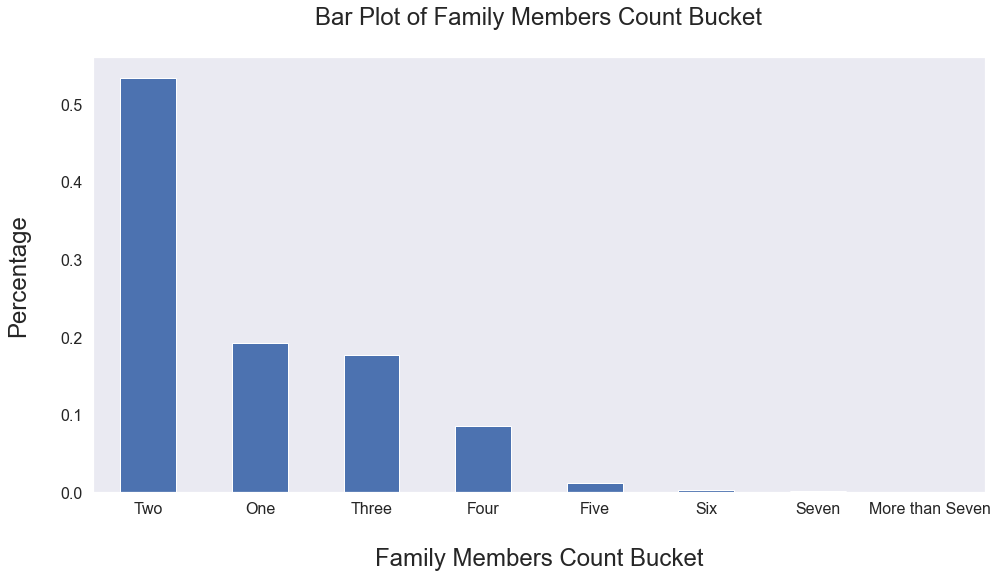

In [541]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['cnt_fam_members_bucket'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Family Members Count Bucket\n')
plt.xlabel('\nFamily Members Count Bucket')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)
plt.xticks(rotation = 0, fontsize = 16)
plt.yticks(rotation = 0, fontsize = 16)

plt.grid(False)

#### status

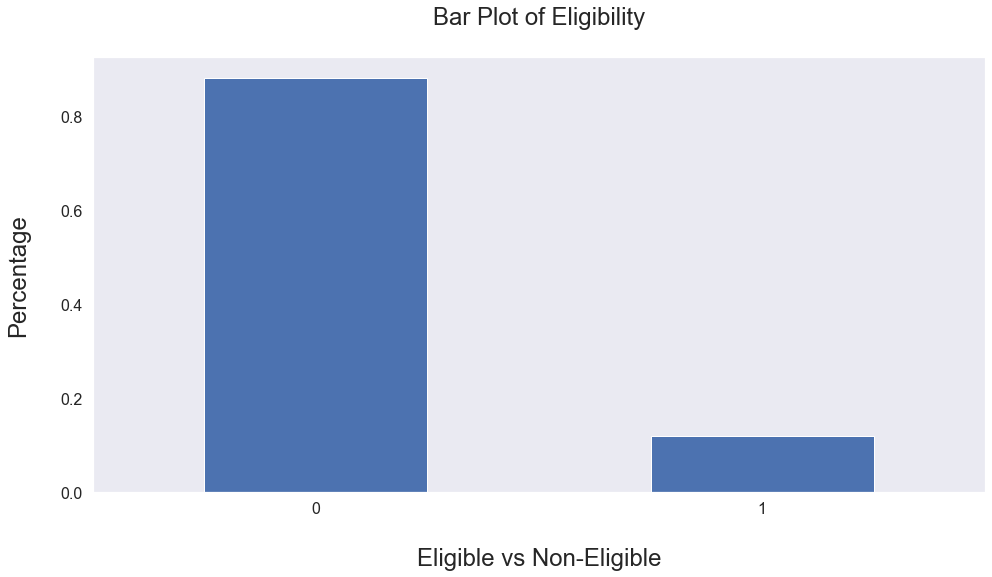

In [542]:
# Bar Plot

plt.subplots(figsize = (16, 8))

categorical_df['status'].value_counts(normalize = True).sort_values(ascending=False).plot.bar()

plt.title('Bar Plot of Eligibility\n')
plt.xlabel('\nEligible vs Non-Eligible')
plt.ylabel('Percentage\n')
plt.xticks(rotation = 0)
plt.xticks(rotation = 0, fontsize = 16)
plt.yticks(rotation = 0, fontsize = 16)

plt.grid(False)

### BI-VARIATE ANALYSIS

### Continuous Variables Vs Categorical Variable

In [543]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [544]:
# Correlation

In [545]:
continuous_df[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years', 'status']].corr()

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years,status
cnt_children,1.00,0.03,0.89,-0.34,0.04,0.01
amt_income_total,0.03,1.00,0.02,-0.07,0.08,0.02
cnt_fam_members,0.89,0.02,1.00,-0.30,0.05,0.01
age,-0.34,-0.07,-0.30,1.00,-0.01,-0.03
employed_years,0.04,0.08,0.05,-0.01,1.00,0.00
status,0.01,0.02,0.01,-0.03,0.00,1.00


* There  is a strong correlation between cnt_children and cnt_fam_members variables of 89%

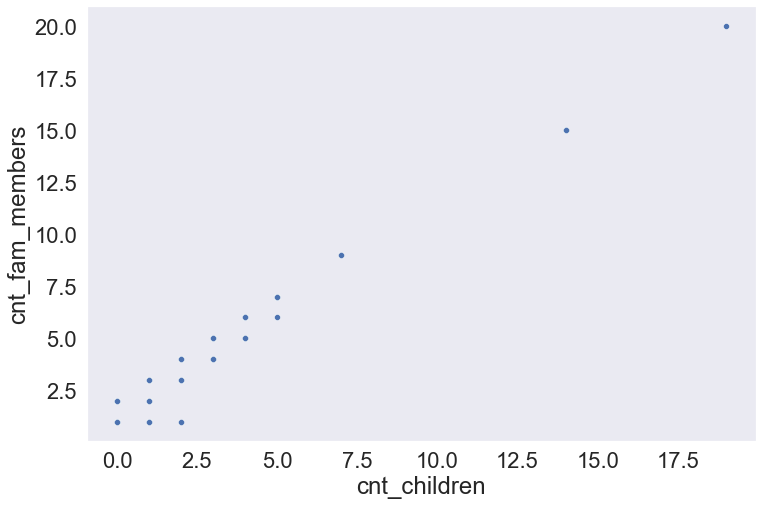

In [546]:
# Scatter plot to view the correlation pattern

sns.scatterplot(continuous_df.cnt_children, continuous_df.cnt_fam_members)
#plt.ylim(0,25)
plt.grid(False)
plt.show()

#### cnt_children

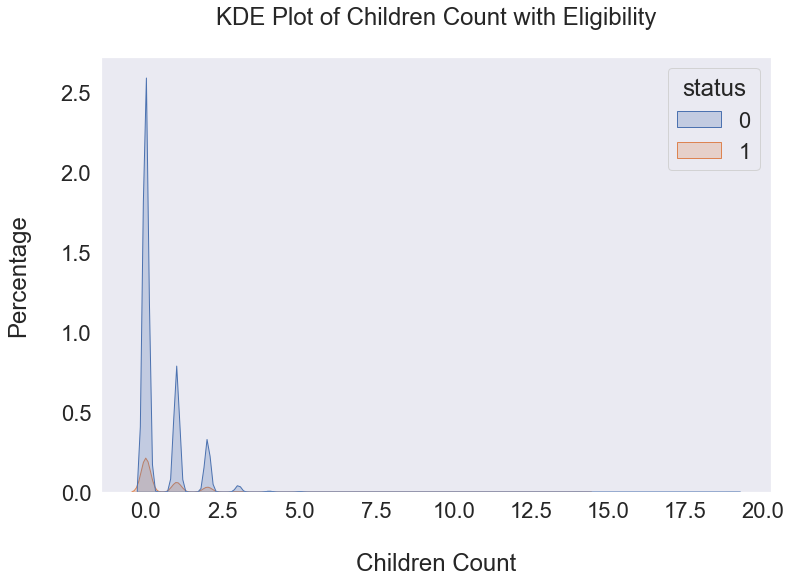

In [547]:
# KDE Plot

plt.subplots(figsize = (12, 8))

sns.kdeplot(data = continuous_df, x = 'cnt_children', hue = 'status', fill = True)

plt.title('KDE Plot of Children Count with Eligibility\n')
plt.xlabel('\nChildren Count')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### amt_income_total

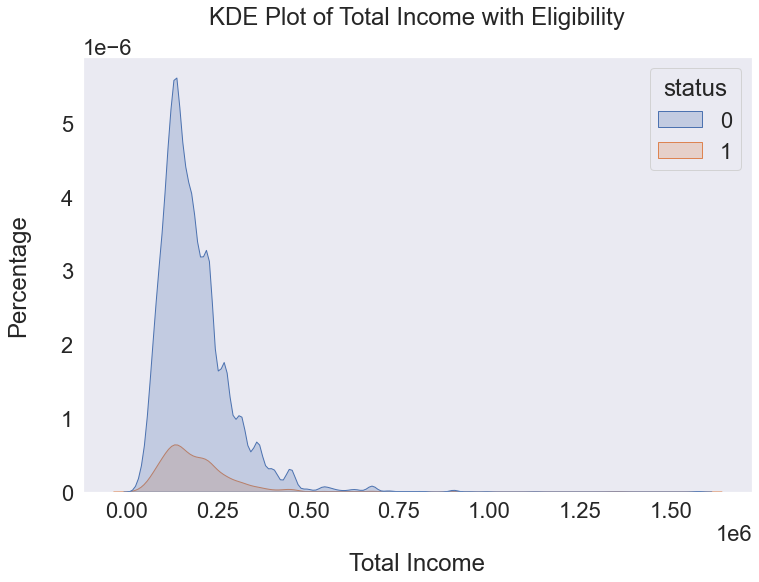

In [548]:
# KDE Plot

plt.subplots(figsize = (12, 8))

sns.kdeplot(data = continuous_df, x = 'amt_income_total', hue = 'status', fill = True)

plt.title('KDE Plot of Total Income with Eligibility\n')
plt.xlabel('\nTotal Income')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### cnt_fam_members

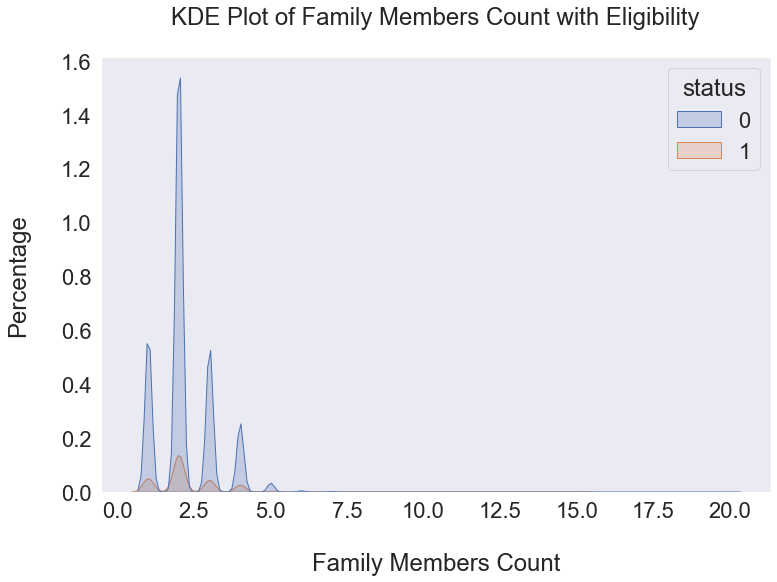

In [549]:
# KDE Plot

plt.subplots(figsize = (12, 8))

sns.kdeplot(data = continuous_df, x = 'cnt_fam_members', hue = 'status', fill = True)

plt.title('KDE Plot of Family Members Count with Eligibility\n')
plt.xlabel('\nFamily Members Count')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### age

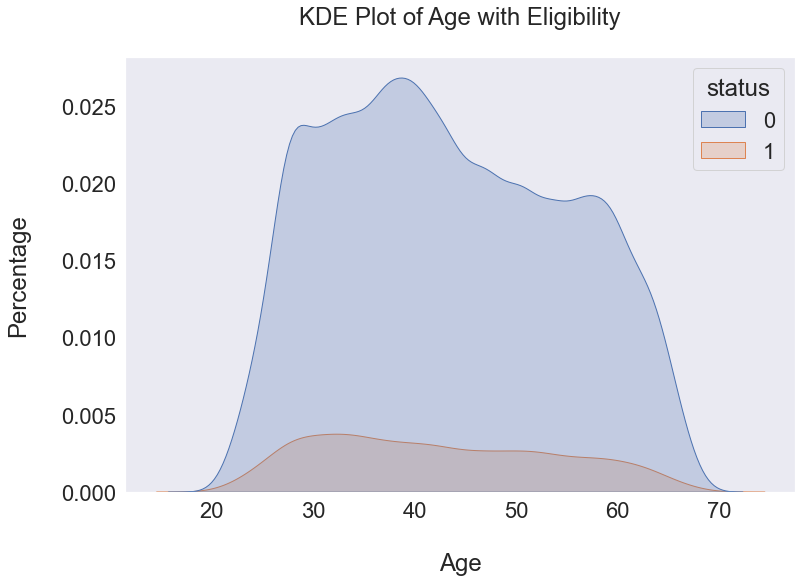

In [550]:
# KDE Plot

plt.subplots(figsize = (12, 8))

sns.kdeplot(data = continuous_df, x = 'age', hue = 'status', fill = True)

plt.title('KDE Plot of Age with Eligibility\n')
plt.xlabel('\nAge')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

#### employed_years

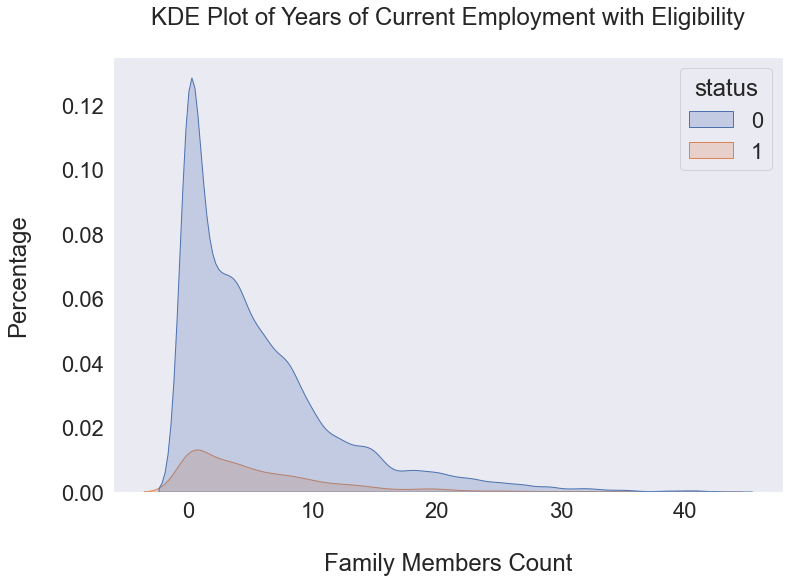

In [551]:
# KDE Plot

plt.subplots(figsize = (12, 8))

sns.kdeplot(data = continuous_df, x = 'employed_years', hue = 'status', fill = True)

plt.title('KDE Plot of Years of Current Employment with Eligibility\n')
plt.xlabel('\nFamily Members Count')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

### Categorical Variables Vs Categorical Variable

In [552]:
categorical_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,children_cnt_bucket,cnt_fam_members_bucket,age,employed_years
0,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
1,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
2,F,N,Y,27000.00,Working,Secondary / secondary special,Married,House / apartment,Y,N,N,Security staff,0,None,Two,52,3.00
3,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00
4,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00


In [553]:
# Group-by

continuous_df.groupby(by = 'status').agg('mean')[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']]

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years
status,,,,,
0,0.43,185785.99,2.20,43.35,5.60
1,0.45,193430.41,2.22,42.31,5.69


* In the above table, we can see that the average across all the variables of all the eligible and not-eligible applicants is almost similar. This shows that any applicant can be rejected or approved for the credit card.

#### code_gender

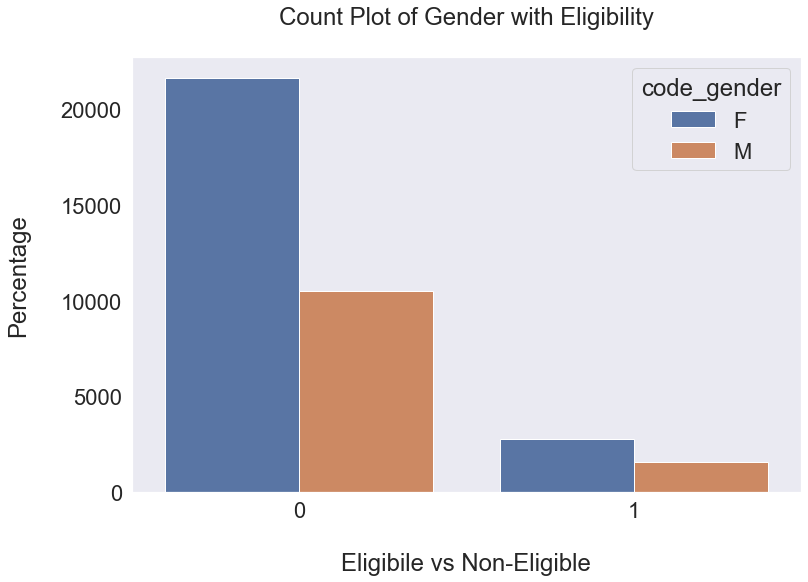

In [554]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'code_gender')

plt.title('Count Plot of Gender with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [555]:
pd.crosstab(categorical_df.code_gender, categorical_df.status, margins = True)

status,0,1,All
code_gender,,,
F,21672,2758,24430
M,10494,1533,12027
All,32166,4291,36457


In [556]:
all = pd.crosstab(categorical_df.code_gender, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.code_gender, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
code_gender,,,
F,0.89,0.11,1.00
M,0.87,0.13,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for both the genders is very close (87% is close to 89%). Hence, it seems that there wasn’t any discrimination against any gender.

#### flag_own_car

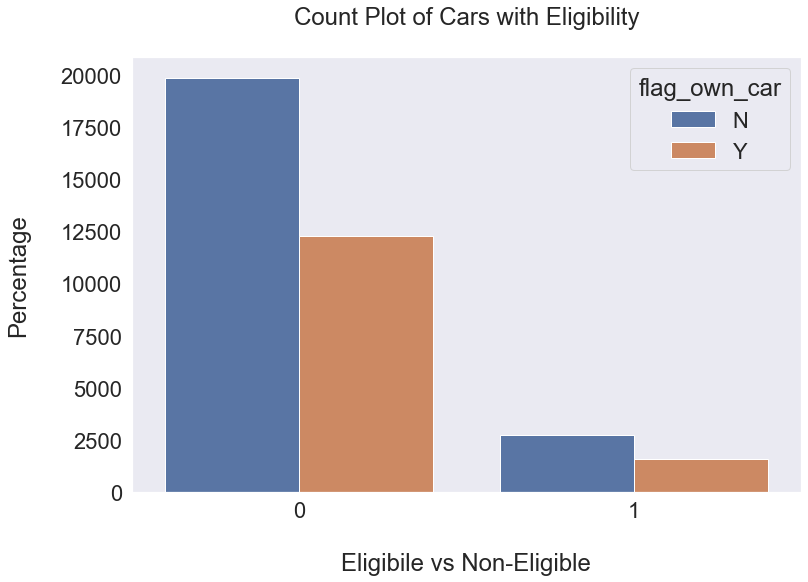

In [557]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'flag_own_car')

plt.title('Count Plot of Cars with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [558]:
pd.crosstab(categorical_df.flag_own_car, categorical_df.status, margins = True)

status,0,1,All
flag_own_car,,,
N,19892,2722,22614
Y,12274,1569,13843
All,32166,4291,36457


In [559]:
all = pd.crosstab(categorical_df.flag_own_car, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.flag_own_car, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
flag_own_car,,,
N,0.88,0.12,1.00
Y,0.89,0.11,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for both the car-ownership and non-car-ownership is very close (88% is close to 88%). Hence, it seems that there wasn’t any discrimination against any car owners or non-owners.

#### flag_own_realty

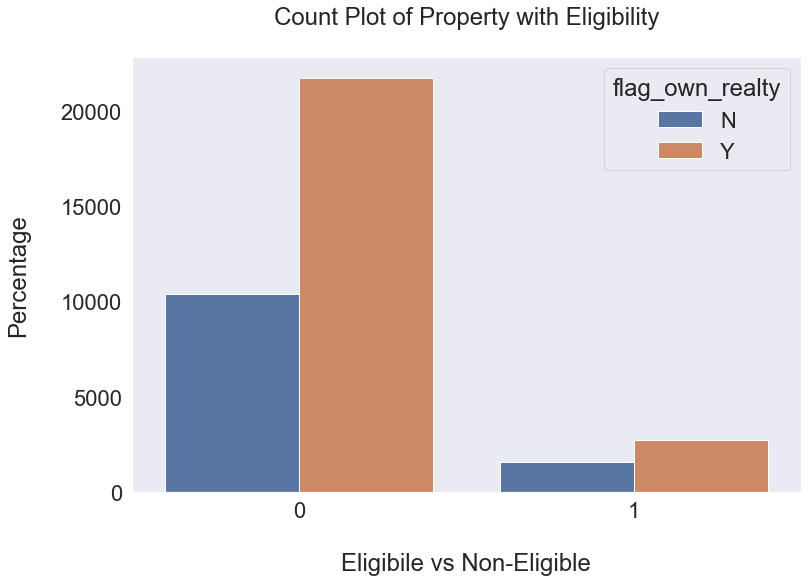

In [560]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'flag_own_realty')

plt.title('Count Plot of Property with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [561]:
pd.crosstab(categorical_df.flag_own_realty, categorical_df.status, margins = True)

status,0,1,All
flag_own_realty,,,
N,10390,1561,11951
Y,21776,2730,24506
All,32166,4291,36457


In [562]:
all = pd.crosstab(categorical_df.flag_own_realty, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.flag_own_realty, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
flag_own_realty,,,
N,0.87,0.13,1.00
Y,0.89,0.11,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for both the property-owners and non-property-owner is very close (87% is close to 89%). Hence, it seems that there wasn’t any discrimination against any property owners or non-owners.

#### name_income_type

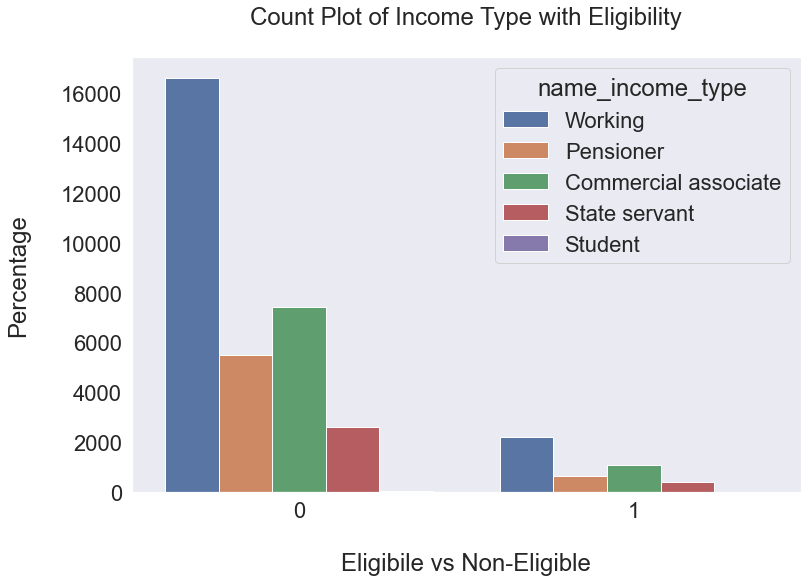

In [563]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'name_income_type')

plt.title('Count Plot of Income Type with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [564]:
pd.crosstab(categorical_df.name_income_type, categorical_df.status, margins = True)

status,0,1,All
name_income_type,,,
Commercial associate,7410,1080,8490
Pensioner,5508,644,6152
State servant,2600,385,2985
Student,10,1,11
Working,16638,2181,18819
All,32166,4291,36457


In [565]:
all = pd.crosstab(categorical_df.name_income_type, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.name_income_type, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
name_income_type,,,
Commercial associate,0.87,0.13,1.00
Pensioner,0.90,0.10,1.00
State servant,0.87,0.13,1.00
Student,0.91,0.09,1.00
Working,0.88,0.12,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for all the income types is very close (87% is close to 91%). Hence, it seems that there wasn’t any discrimination against any income types.

#### name_education_type

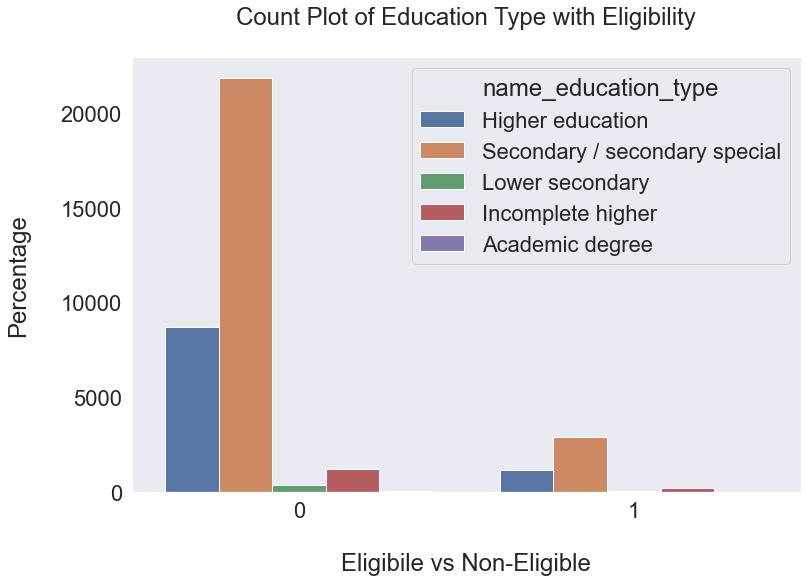

In [566]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'name_education_type')

plt.title('Count Plot of Education Type with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [567]:
pd.crosstab(categorical_df.name_education_type, categorical_df.status, margins = True)

status,0,1,All
name_education_type,,,
Academic degree,25,7,32
Higher education,8716,1148,9864
Incomplete higher,1203,207,1410
Lower secondary,335,39,374
Secondary / secondary special,21887,2890,24777
All,32166,4291,36457


In [568]:
all = pd.crosstab(categorical_df.name_education_type, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.name_education_type, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
name_education_type,,,
Academic degree,0.78,0.22,1.00
Higher education,0.88,0.12,1.00
Incomplete higher,0.85,0.15,1.00
Lower secondary,0.90,0.10,1.00
Secondary / secondary special,0.88,0.12,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for the Academic degree type (78%) is lower than the others (85% to 90%). Hence, we need to check if there was any discrimination against the Academic degree type!

In [569]:
# Group-by

continuous_df.groupby(by = 'status').agg('mean')[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']]

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years
status,,,,,
0,0.43,185785.99,2.20,43.35,5.60
1,0.45,193430.41,2.22,42.31,5.69


In [570]:
# Now filter rows by Academic degree

continuous_df[continuous_df.name_education_type == 'Academic degree'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.72
amt_income_total   247500.00
cnt_fam_members         2.47
age                    42.19
employed_years          4.69
dtype: float64

In [571]:
# Now filter rows by Lower secondary

continuous_df[continuous_df.name_education_type == 'Lower secondary'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.32
amt_income_total   141659.76
cnt_fam_members         2.13
age                    47.83
employed_years          3.07
dtype: float64

* From the above observation it is not clear that why the applicant with an Academic degree education has a higher rejection rate than the applicant with a lower secondary education.

* Almost on all the counts the applicant with an Academic degree education served better than the applicant with a lower secondary education.

#### name_family_status

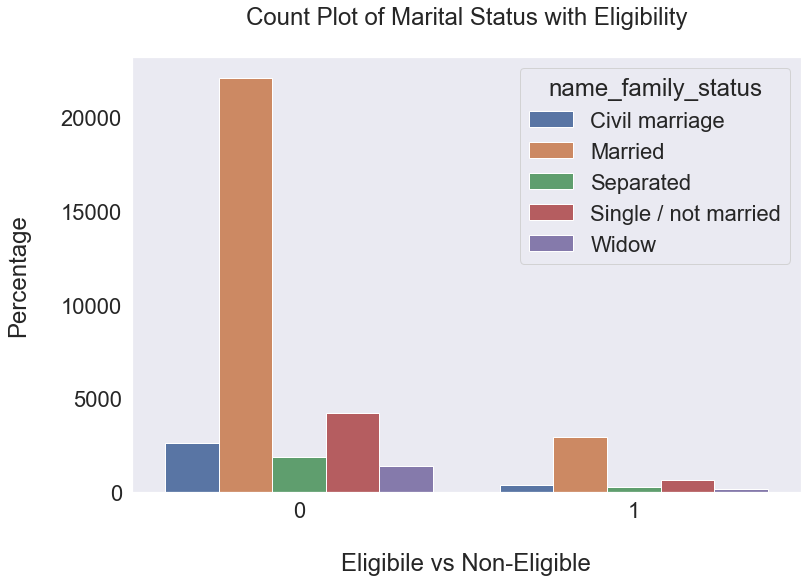

In [572]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'name_family_status')

plt.title('Count Plot of Marital Status with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [573]:
pd.crosstab(categorical_df.name_family_status, categorical_df.status, margins = True)

status,0,1,All
name_family_status,,,
Civil marriage,2578,367,2945
Married,22134,2914,25048
Separated,1878,225,2103
Single / not married,4206,623,4829
Widow,1370,162,1532
All,32166,4291,36457


In [574]:
all = pd.crosstab(categorical_df.name_family_status, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.name_family_status, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
name_family_status,,,
Civil marriage,0.88,0.12,1.00
Married,0.88,0.12,1.00
Separated,0.89,0.11,1.00
Single / not married,0.87,0.13,1.00
Widow,0.89,0.11,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for all the marital status types is very close (87% is close to 89%). Hence, it seems that there wasn’t any discrimination against any marital status types.

#### name_housing_type

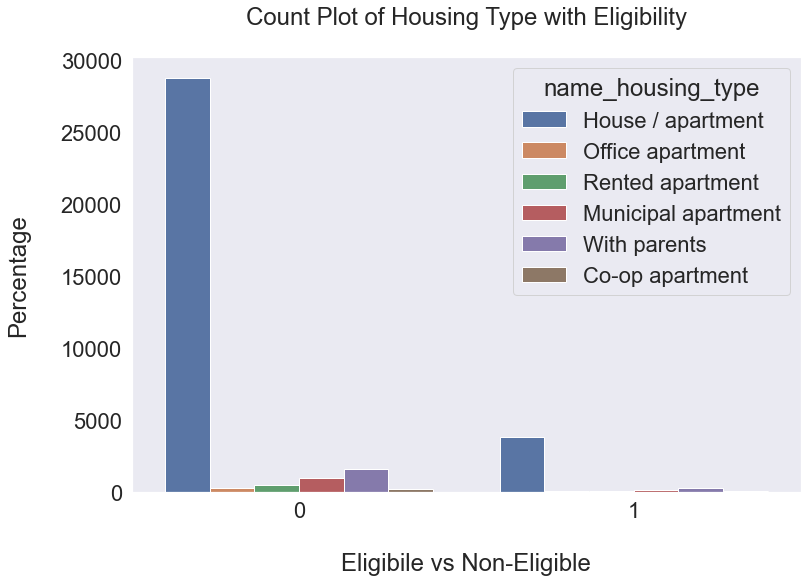

In [575]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'name_housing_type')

plt.title('Count Plot of Housing Type with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [576]:
pd.crosstab(categorical_df.name_housing_type, categorical_df.status, margins = True)

status,0,1,All
name_housing_type,,,
Co-op apartment,154,14,168
House / apartment,28766,3782,32548
Municipal apartment,978,150,1128
Office apartment,224,38,262
Rented apartment,495,80,575
With parents,1549,227,1776
All,32166,4291,36457


In [577]:
all = pd.crosstab(categorical_df.name_housing_type, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.name_housing_type, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
name_housing_type,,,
Co-op apartment,0.92,0.08,1.00
House / apartment,0.88,0.12,1.00
Municipal apartment,0.87,0.13,1.00
Office apartment,0.85,0.15,1.00
Rented apartment,0.86,0.14,1.00
With parents,0.87,0.13,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for all the housing types is very close (85% is close to 92%). Hence, it seems that there wasn’t any discrimination against any housing types.

#### flag_work_phone

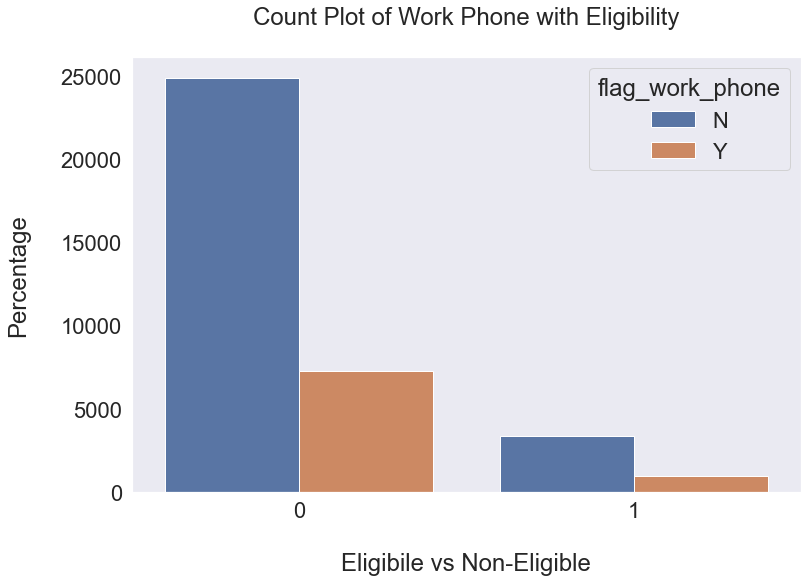

In [578]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'flag_work_phone')

plt.title('Count Plot of Work Phone with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [579]:
pd.crosstab(categorical_df.flag_work_phone, categorical_df.status, margins = True)

status,0,1,All
flag_work_phone,,,
N,24911,3324,28235
Y,7255,967,8222
All,32166,4291,36457


In [580]:
all = pd.crosstab(categorical_df.flag_work_phone, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.flag_work_phone, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
flag_work_phone,,,
N,0.88,0.12,1.00
Y,0.88,0.12,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for all the applicants with a work phone is similar (88%). Hence, it seems that there wasn’t any discrimination against the applicants with or without a work phone.

#### flag_phone

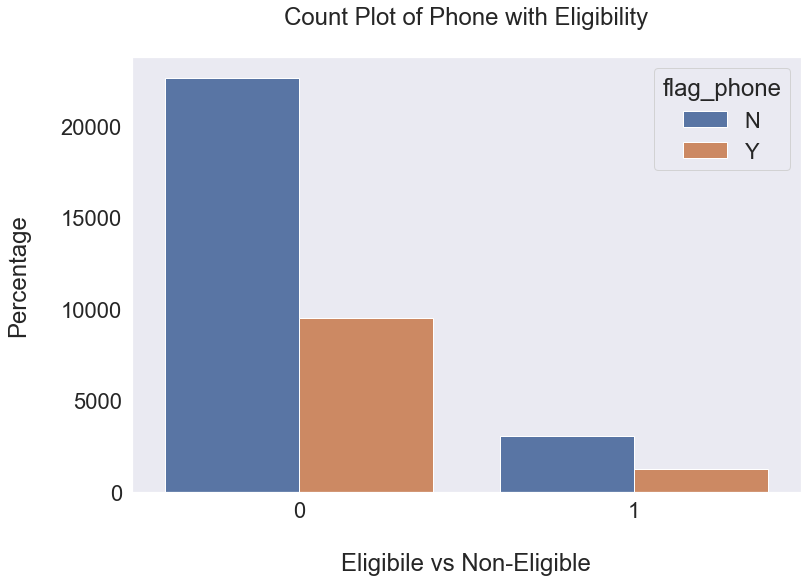

In [581]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'flag_phone')

plt.title('Count Plot of Phone with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [582]:
pd.crosstab(categorical_df.flag_phone, categorical_df.status, margins = True)

status,0,1,All
flag_phone,,,
N,22649,3060,25709
Y,9517,1231,10748
All,32166,4291,36457


In [583]:
all = pd.crosstab(categorical_df.flag_phone, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.flag_phone, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
flag_phone,,,
N,0.88,0.12,1.00
Y,0.89,0.11,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for all the applicants with a phone is very close (88% is close to 89%). Hence, it seems that there wasn’t any discrimination against the applicants with or without a phone.

#### flag_email

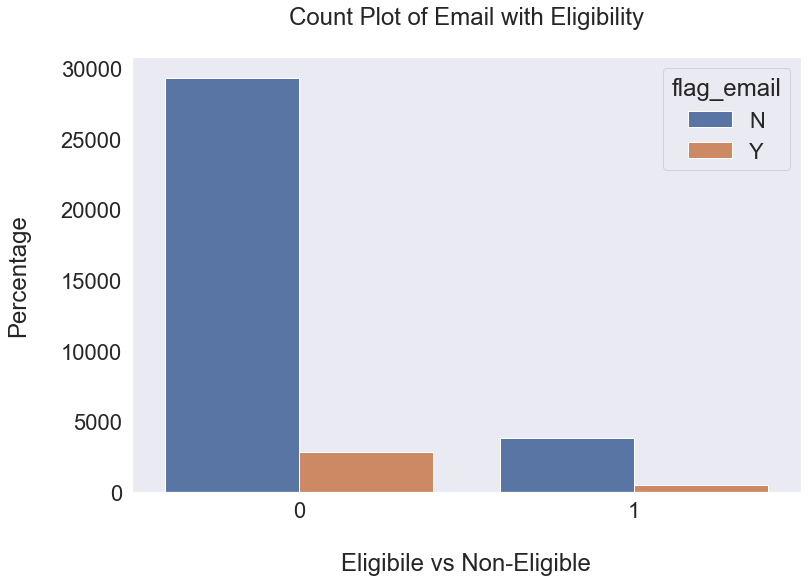

In [584]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'flag_email')

plt.title('Count Plot of Email with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.grid(False)
plt.show()

In [585]:
pd.crosstab(categorical_df.flag_email, categorical_df.status, margins = True)

status,0,1,All
flag_email,,,
N,29346,3840,33186
Y,2820,451,3271
All,32166,4291,36457


In [586]:
all = pd.crosstab(categorical_df.flag_email, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.flag_email, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
flag_email,,,
N,0.88,0.12,1.00
Y,0.86,0.14,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for all the applicants with a email is very close (86% is close to 88%). Hence, it seems that there wasn’t any discrimination against the applicants with or without a email.

#### occupation_type

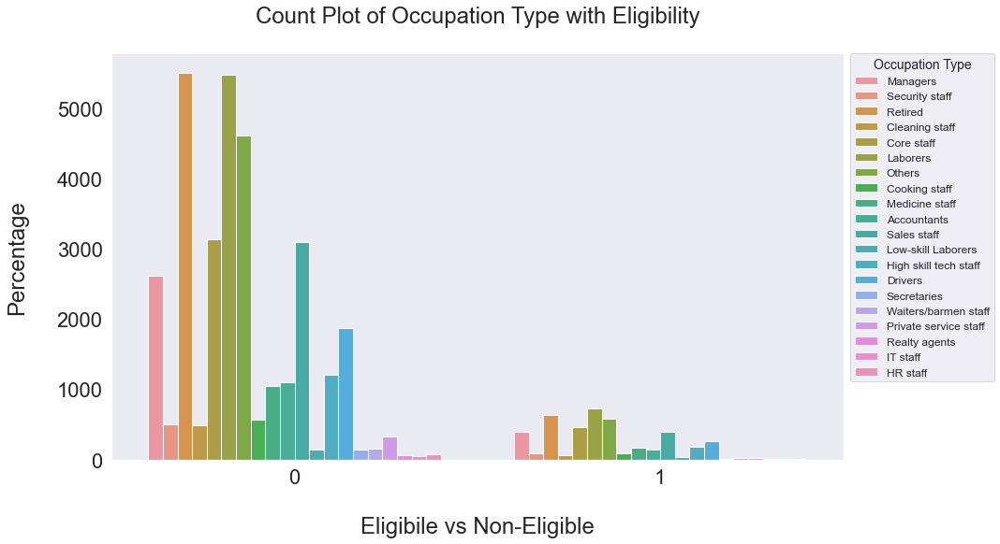

In [587]:
# Count Plot

plt.subplots(figsize = (14, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'occupation_type')

plt.title('Count Plot of Occupation Type with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.legend(bbox_to_anchor = (1.01, 1), loc = 'upper left', borderaxespad = 0, fontsize = 12, 
           title = "Occupation Type", title_fontsize = 14)

plt.grid(False)
plt.show()

In [588]:
pd.crosstab(categorical_df.occupation_type, categorical_df.status, margins = True)

status,0,1,All
occupation_type,,,
Accountants,1094,147,1241
Cleaning staff,488,63,551
Cooking staff,569,86,655
Core staff,3128,463,3591
Drivers,1874,264,2138
HR staff,71,14,85
High skill tech staff,1202,181,1383
IT staff,49,11,60
Laborers,5481,729,6210


In [589]:
all = pd.crosstab(categorical_df.occupation_type, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.occupation_type, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
occupation_type,,,
Accountants,0.88,0.12,1.00
Cleaning staff,0.89,0.11,1.00
Cooking staff,0.87,0.13,1.00
Core staff,0.87,0.13,1.00
Drivers,0.88,0.12,1.00
HR staff,0.84,0.16,1.00
High skill tech staff,0.87,0.13,1.00
IT staff,0.82,0.18,1.00
Laborers,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for most of the occupation types is quite close (87% is close to 94%). But few of the occupation types like Low-skill Laborers, IT staff, HR staff, Security staff and Medicine staff have higher rejection rates of 19%, 18%, 16%, 15% and 14% respectively. Hence, we need to check if there was any discrimination against these occupation type!

In [590]:
# Group-by

continuous_df.groupby(by = 'status').agg('mean')[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']]

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years
status,,,,,
0,0.43,185785.99,2.20,43.35,5.60
1,0.45,193430.41,2.22,42.31,5.69


In [591]:
# Now filter rows by Low-skill Laborers

continuous_df[continuous_df.occupation_type == 'Low-skill Laborers'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.44
amt_income_total   133920.00
cnt_fam_members         2.34
age                    40.94
employed_years          5.51
dtype: float64

* From the above observation it is visible that the applicant with a Low-skill Laborers occupation type has a lower average income than the approved applicants average income. This could be the deciding factor in this case.

In [592]:
# Now filter rows by IT staff

continuous_df[continuous_df.occupation_type == 'IT staff'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.37
amt_income_total   199860.00
cnt_fam_members         2.12
age                    34.67
employed_years          3.65
dtype: float64

* From the above observation it is visible that the applicant with an IT staff occupation type has a lower average age as well as the lower years of employment than the approved applicants average age and the years of employment. This could be the deciding factor in this case.

In [593]:
# Now filter rows by HR staff

continuous_df[continuous_df.occupation_type == 'HR staff'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.45
amt_income_total   193764.71
cnt_fam_members         2.00
age                    38.14
employed_years          4.84
dtype: float64

* From the above observation it is visible that the applicant with an HR staff occupation type has a lower average age as well as the lower years of employment than the approved applicants average age and the years of employment. This could be the deciding factor in this case.

In [594]:
# Now filter rows by Security staff

continuous_df[continuous_df.occupation_type == 'Security staff'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.40
amt_income_total   177037.75
cnt_fam_members         2.19
age                    45.30
employed_years          4.55
dtype: float64

* From the above observation it is visible that the applicant with an Security staff occupation type has a lower average income as well as the lower years of employment than the approved applicants average income and the years of employment. This could be the deciding factor in this case.

In [595]:
# Now filter rows by Medicine staff

continuous_df[continuous_df.occupation_type == 'Medicine staff'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children            0.44
amt_income_total   166114.62
cnt_fam_members         2.22
age                    42.96
employed_years         11.11
dtype: float64

* From the above observation it is visible that the applicant with a Medicine staff occupation type has a lower average income than the approved applicants average income. This could be the deciding factor in this case.

#### children_cnt_bucket

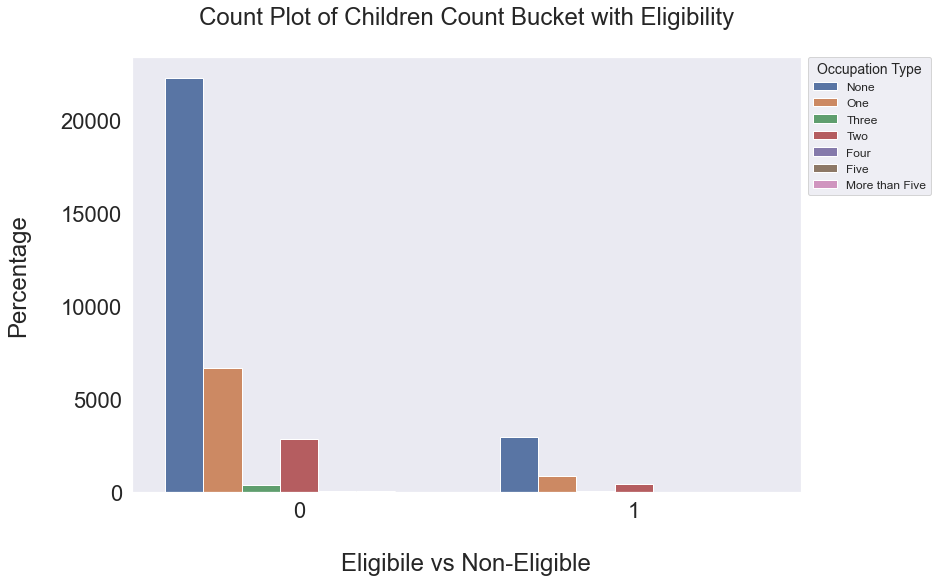

In [596]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'children_cnt_bucket')

plt.title('Count Plot of Children Count Bucket with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.legend(bbox_to_anchor = (1.01, 1), loc = 'upper left', borderaxespad = 0, fontsize = 12, 
           title = "Occupation Type", title_fontsize = 14)

plt.grid(False)
plt.show()

In [597]:
pd.crosstab(categorical_df.children_cnt_bucket, categorical_df.status, margins = True)

status,0,1,All
children_cnt_bucket,,,
Five,20,0,20
Four,58,5,63
More than Five,2,4,6
None,22259,2942,25201
One,6642,850,7492
Three,364,55,419
Two,2821,435,3256
All,32166,4291,36457


In [598]:
all = pd.crosstab(categorical_df.children_cnt_bucket, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.children_cnt_bucket, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
children_cnt_bucket,,,
Five,1.00,0.00,1.00
Four,0.92,0.08,1.00
More than Five,0.33,0.67,1.00
None,0.88,0.12,1.00
One,0.89,0.11,1.00
Three,0.87,0.13,1.00
Two,0.87,0.13,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for the applicants with children count is quite close (87% is close to 92%) except an applicant with 5 children who has an eligibility rate of 100%. But applicants with more than five children have higher rejection rate of 67%. Hence, we need to check if there was any discrimination against these applicants!

In [599]:
# Group-by

continuous_df.groupby(by = 'status').agg('mean')[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']]

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years
status,,,,,
0,0.43,185785.99,2.20,43.35,5.60
1,0.45,193430.41,2.22,42.31,5.69


In [600]:
# Now filter rows by More than Five

continuous_df[continuous_df.children_cnt_bucket == 'More than Five'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children           12.50
amt_income_total   183750.00
cnt_fam_members        13.83
age                    41.33
employed_years          4.17
dtype: float64

* From the above observation it is visible that the applicants with more than five children has a lower average income as well as the lower years of employment than the approved applicants average income and the years of employment. Apart from this, their children and family count is also way beyond the applicants average of the same. Also their average age is also lower than the approved applicants average age. These could be the deciding factor in this case.

#### cnt_fam_members_bucket

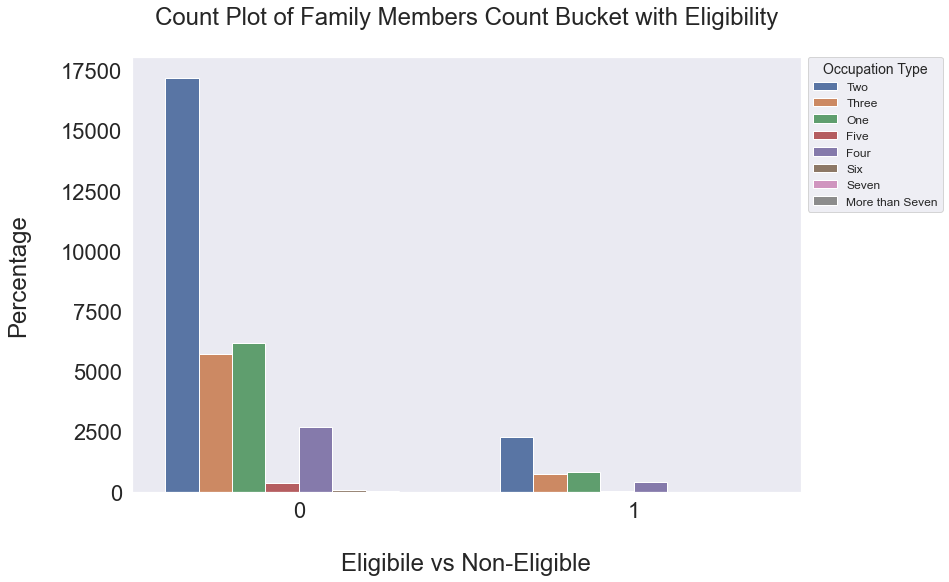

In [601]:
# Count Plot

plt.subplots(figsize = (12, 8))

sns.countplot(data = categorical_df, x = 'status', hue = 'cnt_fam_members_bucket')

plt.title('Count Plot of Family Members Count Bucket with Eligibility\n')
plt.xlabel('\nEligibile vs Non-Eligible')
plt.ylabel('Percentage\n')

plt.legend(bbox_to_anchor = (1.01, 1), loc = 'upper left', borderaxespad = 0, fontsize = 12, 
           title = "Occupation Type", title_fontsize = 14)

plt.grid(False)
plt.show()

In [602]:
pd.crosstab(categorical_df.cnt_fam_members_bucket, categorical_df.status, margins = True)

status,0,1,All
cnt_fam_members_bucket,,,
Five,349,48,397
Four,2683,423,3106
More than Seven,2,4,6
One,6162,825,6987
Seven,19,0,19
Six,53,5,58
Three,5698,723,6421
Two,17200,2263,19463
All,32166,4291,36457


In [603]:
all = pd.crosstab(categorical_df.cnt_fam_members_bucket, categorical_df.status, margins = True)['All']
pd.crosstab(categorical_df.cnt_fam_members_bucket, categorical_df.status, margins = True).divide(all, axis = 0).dropna()

status,0,1,All
cnt_fam_members_bucket,,,
Five,0.88,0.12,1.00
Four,0.86,0.14,1.00
More than Seven,0.33,0.67,1.00
One,0.88,0.12,1.00
Seven,1.00,0.00,1.00
Six,0.91,0.09,1.00
Three,0.89,0.11,1.00
Two,0.88,0.12,1.00
All,0.88,0.12,1.00


* In the above table, we can see that the eligibility percentage for the applicants with family count is quite close (86% is close to 91%) except an applicant with 7 family members who has an eligibility rate of 100%. But applicants with more than seven family members have higher rejection rate of 67%. Hence, we need to check if there was any discrimination against these applicants!

In [604]:
# Group-by

continuous_df.groupby(by = 'status').agg('mean')[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']]

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years
status,,,,,
0,0.43,185785.99,2.20,43.35,5.60
1,0.45,193430.41,2.22,42.31,5.69


In [605]:
# Now filter rows by More than Seven

continuous_df[continuous_df.cnt_fam_members_bucket == 'More than Seven'][['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']].agg('mean')

cnt_children           12.50
amt_income_total   183750.00
cnt_fam_members        13.83
age                    41.33
employed_years          4.17
dtype: float64

* From the above observation it is visible that the applicants with more than seven family members has a lower average income as well as the lower years of employment than the approved applicants average income and the years of employment. Apart from this, their children and family count is also way beyond the applicants average of the same. Also their average age is also lower than the approved applicants average age. These could be the deciding factor in this case.

### Continuous Variables Vs Continuous Variable

In [606]:
continuous_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


#### amt_income_total vs cnt_children

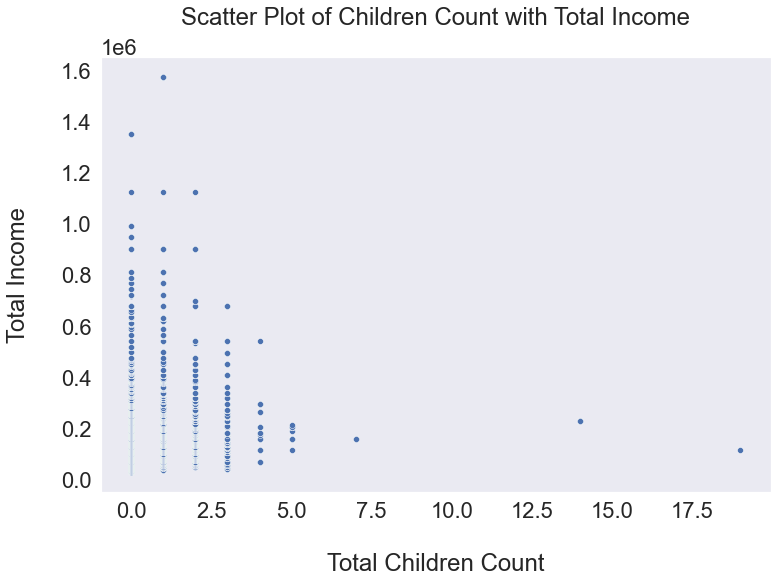

In [607]:
# Scatter plot

plt.subplots(figsize = (12, 8))

sns.scatterplot(continuous_df.cnt_children, continuous_df.amt_income_total)
#plt.ylim(0,25)

plt.title('Scatter Plot of Children Count with Total Income\n')
plt.xlabel('\nTotal Children Count')
plt.ylabel('Total Income\n')

plt.grid(False)
plt.show()

#### amt_income_total vs cnt_fam_members

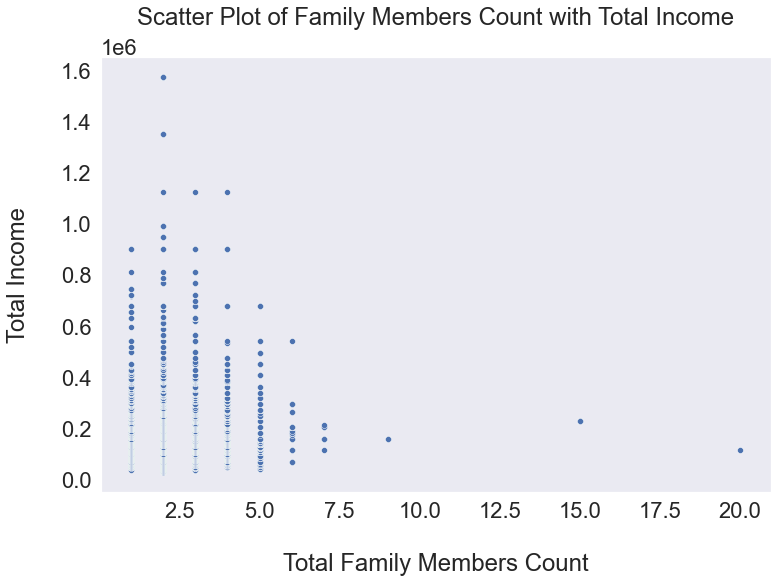

In [608]:
# Scatter plot

plt.subplots(figsize = (12, 8))

sns.scatterplot(continuous_df.cnt_fam_members, continuous_df.amt_income_total)
#plt.ylim(0,25)

plt.title('Scatter Plot of Family Members Count with Total Income\n')
plt.xlabel('\nTotal Family Members Count')
plt.ylabel('Total Income\n')

plt.grid(False)
plt.show()

#### amt_income_total vs age

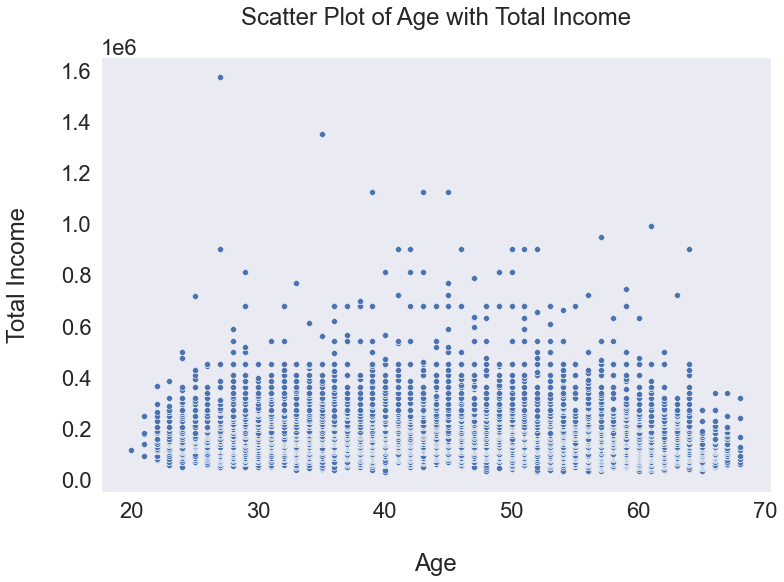

In [609]:
# Scatter plot

plt.subplots(figsize = (12, 8))

sns.scatterplot(continuous_df.age, continuous_df.amt_income_total)
#plt.ylim(0,25)

plt.title('Scatter Plot of Age with Total Income\n')
plt.xlabel('\nAge')
plt.ylabel('Total Income\n')

plt.grid(False)
plt.show()

#### amt_income_total vs employed_years

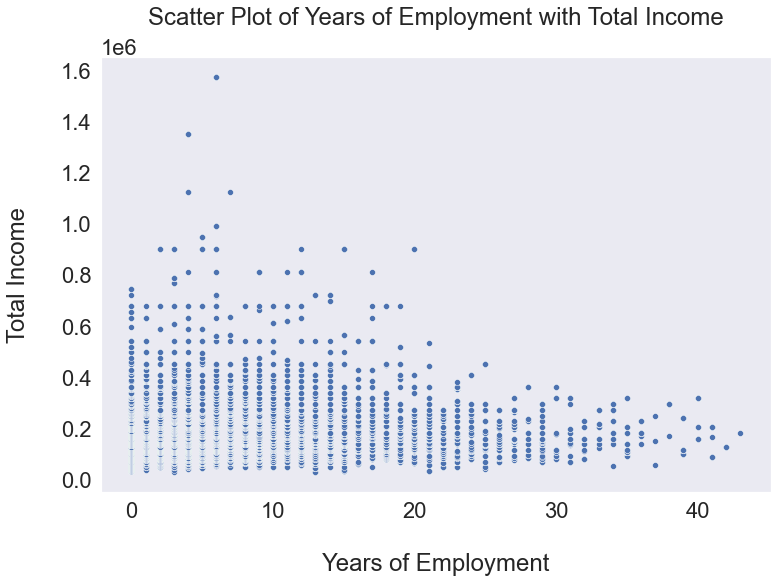

In [610]:
# Scatter plot

plt.subplots(figsize = (12, 8))

sns.scatterplot(continuous_df.employed_years, continuous_df.amt_income_total)
#plt.ylim(0,25)

plt.title('Scatter Plot of Years of Employment with Total Income\n')
plt.xlabel('\nYears of Employment')
plt.ylabel('Total Income\n')

plt.grid(False)
plt.show()

* The applicants who are getting income at zero years of employment are the pensioners.

### MULTI-VARIATE ANALYSIS

### Continuous Variables Vs Target Variable

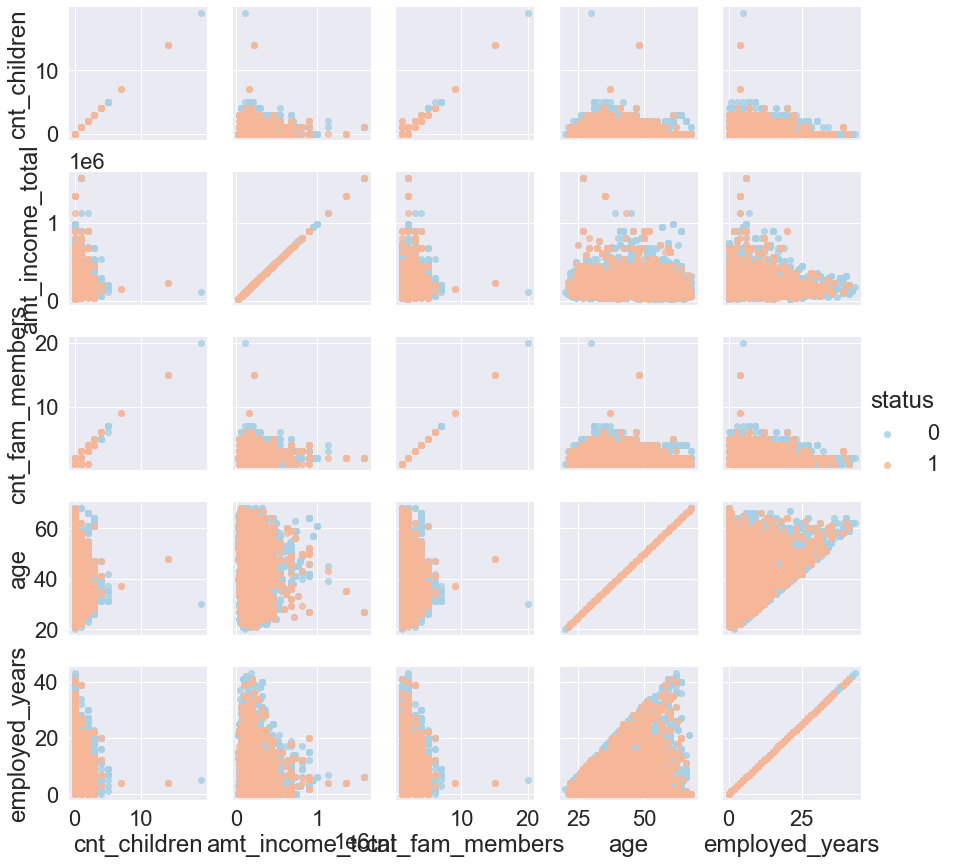

In [611]:
# PairGrid

g = sns.PairGrid(data = continuous_df[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years', 'status']], 
             hue = 'status', size = 2.5, palette='RdBu_r')

g.map(plt.scatter, alpha=0.8)
g.add_legend()

* For the above graph it is observed that only cnt_children and cnt_fam_members have a strong pattern.
* This need to be treated by dropping one of them as they are strongly correlated with each other.

#### Boxplot of Outliers Detection

In [612]:
boxplot_df = continuous_df.copy()

In [613]:
boxplot_df.head()

,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,...,flag_email,occupation_type,cnt_fam_members,status,children_cnt_bucket,cnt_fam_members_bucket,income_bucket,age,age_bucket,employed_years
0,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
1,F,N,N,0,27000.00,Working,Higher education,Civil marriage,House / apartment,14869,...,N,Managers,2.00,1,None,Two,Very_low,40,Middle_Age,13.00
2,F,N,Y,0,27000.00,Working,Secondary / secondary special,Married,House / apartment,19128,...,N,Security staff,2.00,0,None,Two,Very_low,52,Middle_Age,3.00
3,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00
4,F,Y,Y,0,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,20086,...,N,NaN,2.00,0,None,Two,Very_low,54,Middle_Age,0.00


In [614]:
boxplot_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   code_gender             36457 non-null  category
 1   flag_own_car            36457 non-null  category
 2   flag_own_realty         36457 non-null  category
 3   cnt_children            36457 non-null  int64   
 4   amt_income_total        36457 non-null  float64 
 5   name_income_type        36457 non-null  object  
 6   name_education_type     36457 non-null  object  
 7   name_family_status      36457 non-null  object  
 8   name_housing_type       36457 non-null  object  
 9   days_birth              36457 non-null  int64   
 10  days_employed           36457 non-null  int64   
 11  flag_work_phone         36457 non-null  category
 12  flag_phone              36457 non-null  category
 13  flag_email              36457 non-null  category
 14  occupation_type       

In [615]:
numerical_col2 = boxplot_df[['cnt_children', 'amt_income_total', 'cnt_fam_members', 'age', 'employed_years']]
numerical_col2.head()

,cnt_children,amt_income_total,cnt_fam_members,age,employed_years
0,0,27000.00,2.00,40,13.00
1,0,27000.00,2.00,40,13.00
2,0,27000.00,2.00,52,3.00
3,0,29250.00,2.00,54,0.00
4,0,29250.00,2.00,54,0.00


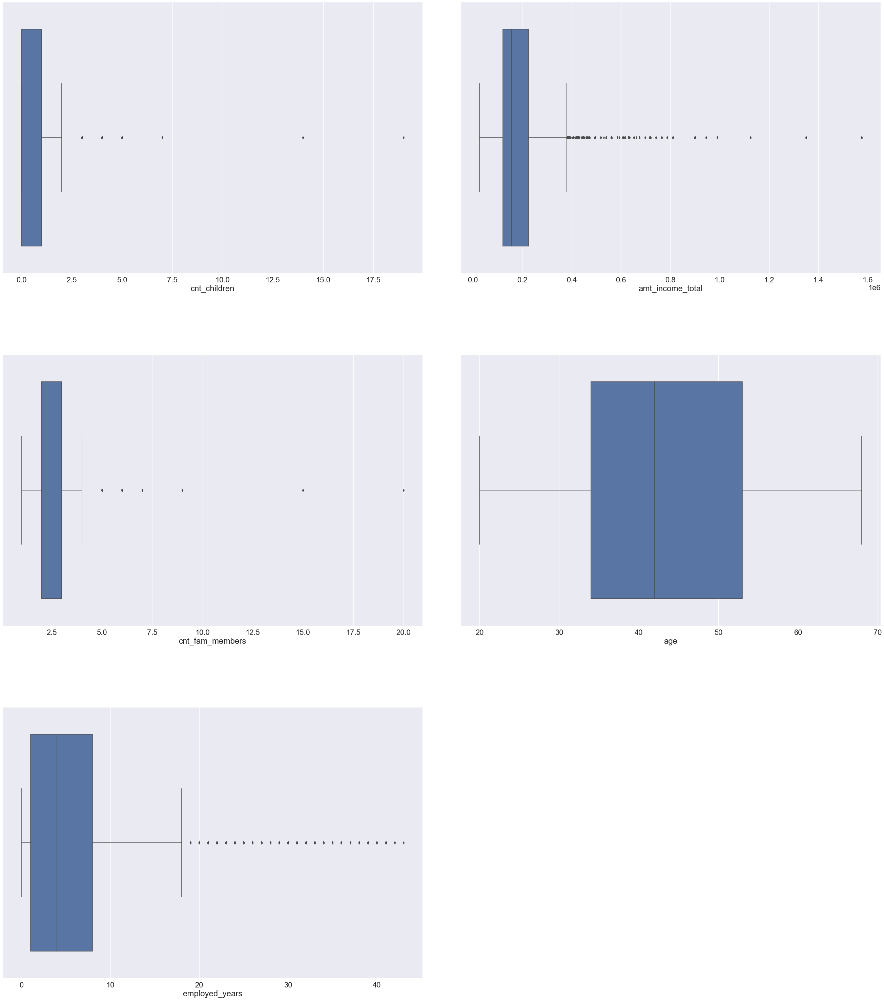

In [616]:
fig , axes = plt.subplots(nrows = 3, ncols = 2, constrained_layout = True)

fig.subplots_adjust(left = 0, bottom = 0, right = 3, top = 5, wspace = 0.09, hspace = 0.3)


for ax, column in zip(axes.flatten(), numerical_col2):
    sns.boxplot(numerical_col2[column], ax = ax)
plt.grid(False)

fig.delaxes(axes[2][1])
plt.show()

#### VISUALIZATION ENDS HERE !!!

## NLP PART

### Word CLoud

In [617]:
from wordcloud import WordCloud

In [618]:
nlp_df = cleaned_df.copy()

In [619]:
nlp_df.isna().sum()

code_gender               0
flag_own_car              0
flag_own_realty           0
amt_income_total          0
name_income_type          0
name_education_type       0
name_family_status        0
name_housing_type         0
flag_work_phone           0
flag_phone                0
flag_email                0
occupation_type           0
status                    0
children_cnt_bucket       0
cnt_fam_members_bucket    0
age                       0
employed_years            0
dtype: int64

#### name_income_type

In [620]:
# Create the an object fields and store the categorical columns in it

fields = ['name_income_type', 'name_education_type', 'name_family_status', 'name_housing_type', 'occupation_type']

# Read the dataset (use the cleaned EDA dataset)

text = pd.read_csv('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\cleaned_df_final.csv', usecols = fields)

In [621]:
inc_text = ' '.join(text['name_income_type'])

In [622]:
# Creating word_cloud with text as argument in .generate() method

word_cloud_inc = WordCloud(collocations = False, background_color = 'white').generate(inc_text)

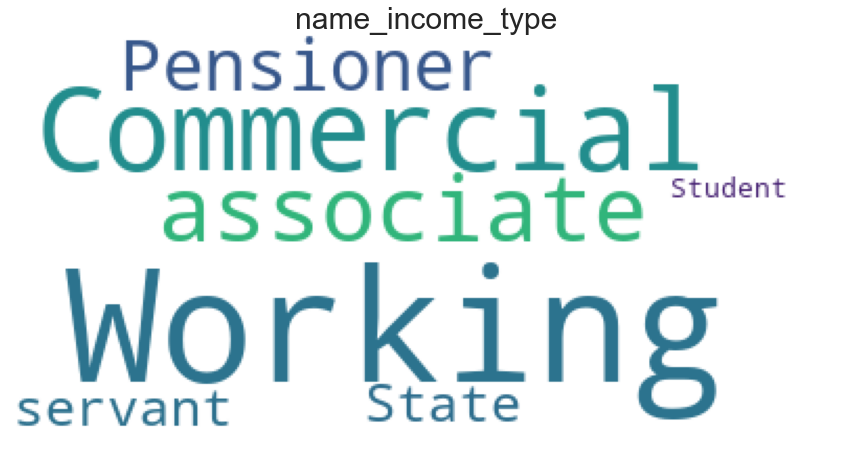

In [623]:
# Generate plot

plt.figure(figsize = (15, 8))
plt.imshow(word_cloud_inc)
plt.title('name_income_type', fontsize = 30)
plt.axis("off")
plt.show()

#### name_education_type

In [624]:
edu_text = ' '.join(text['name_education_type'])

In [625]:
# Creating word_cloud with text as argument in .generate() method

word_cloud_edu = WordCloud(collocations = False, background_color = 'white').generate(edu_text)

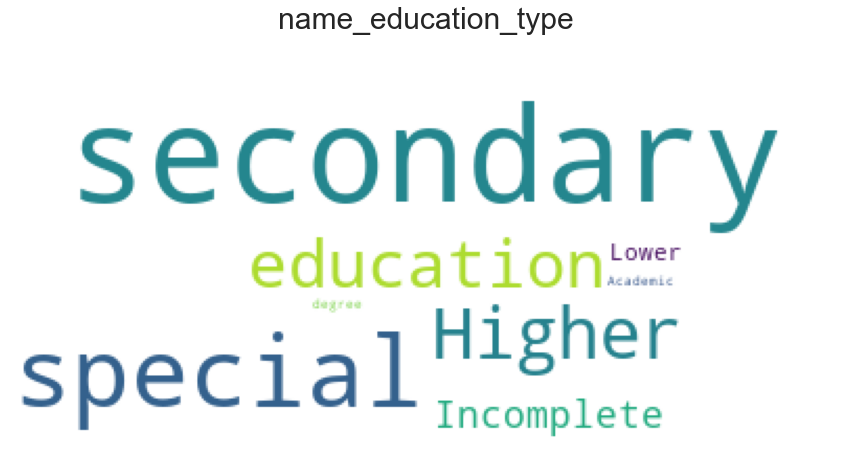

In [626]:
# Generate plot

plt.figure(figsize = (15, 8))
plt.imshow(word_cloud_edu)
plt.title('name_education_type', fontsize = 30)
plt.axis("off")
plt.show()

#### name_family_status

In [627]:
fam_text = ' '.join(text['name_family_status'])

In [628]:
# Creating word_cloud with text as argument in .generate() method

word_cloud_fam = WordCloud(collocations = False, background_color = 'white').generate(fam_text)

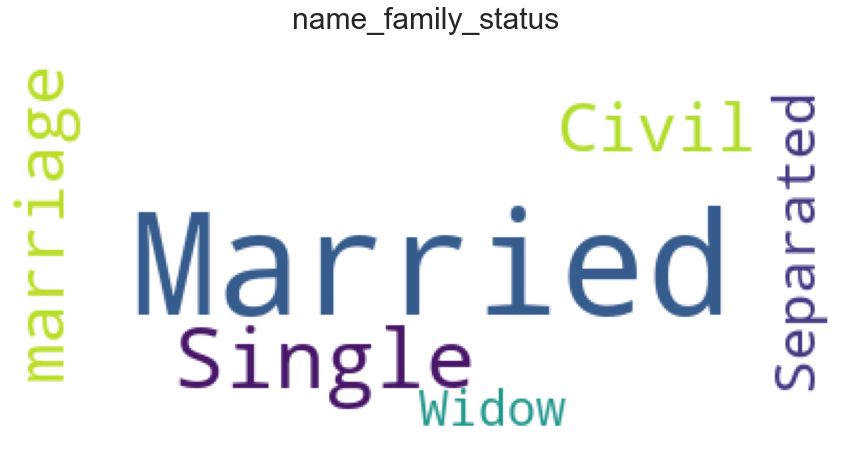

In [629]:
# Generate plot

plt.figure(figsize = (15, 8))
plt.imshow(word_cloud_fam)
plt.title('name_family_status', fontsize = 30)
plt.axis("off")
plt.show()

#### name_housing_type

In [630]:
house_text = ' '.join(text['name_housing_type'])

In [631]:
# Creating word_cloud with text as argument in .generate() method

word_cloud_house = WordCloud(collocations = False, background_color = 'white').generate(house_text)

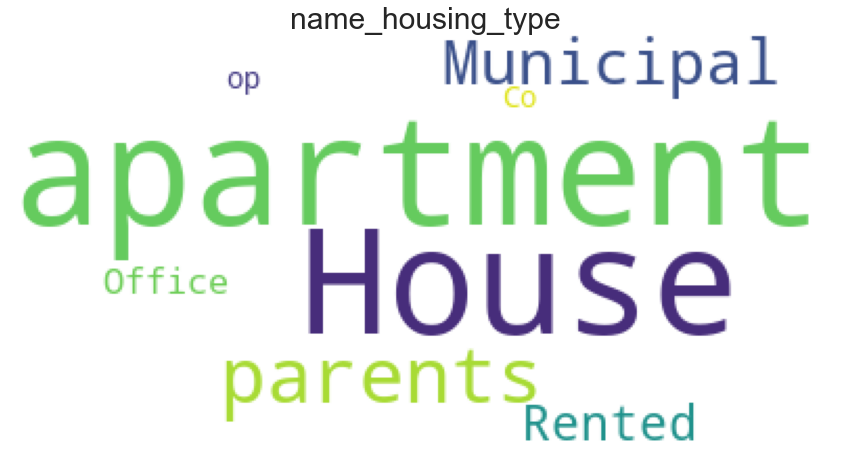

In [632]:
# Generate plot

plt.figure(figsize = (15, 8))
plt.imshow(word_cloud_house)
plt.title('name_housing_type', fontsize = 30)
plt.axis("off")
plt.show()

#### occupation_type

In [633]:
occ_text = ' '.join(text['occupation_type'])

In [634]:
# Creating word_cloud with text as argument in .generate() method

word_cloud_occ = WordCloud(collocations = False, background_color = 'white').generate(occ_text)

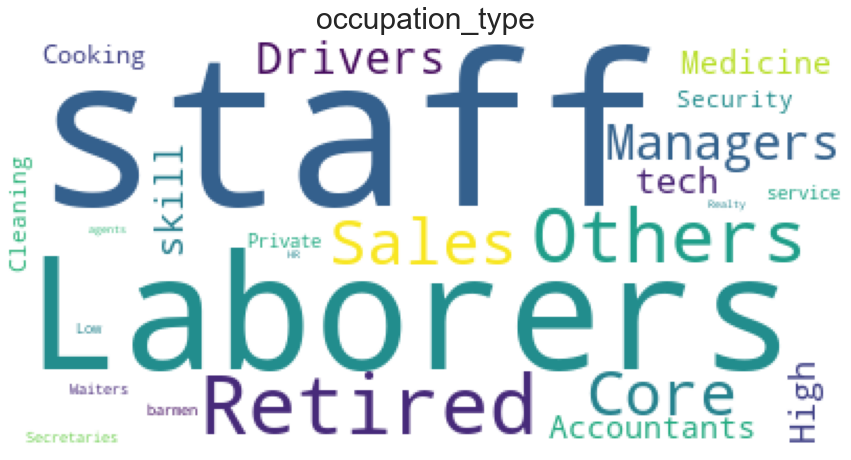

In [635]:
# Generate plot

plt.figure(figsize = (15, 8))
plt.imshow(word_cloud_occ)
plt.title('occupation_type', fontsize = 30)
plt.axis("off")
plt.show()

#### Correlation Matrix

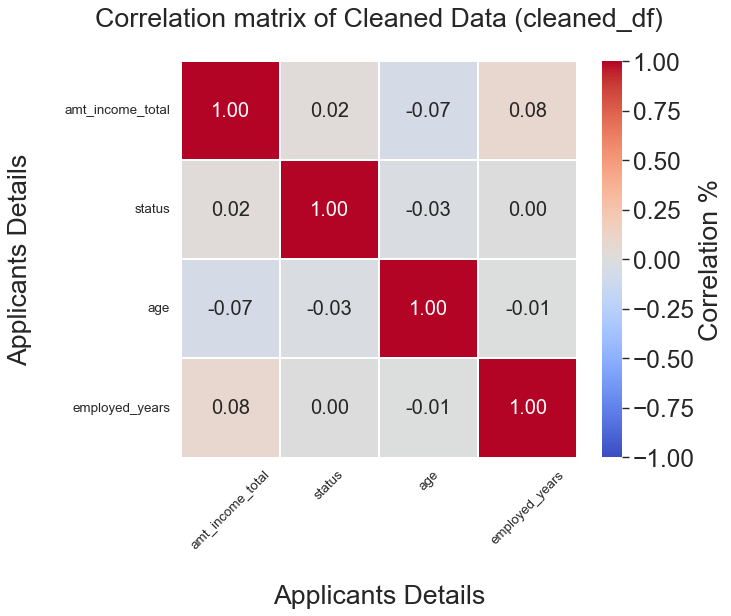

In [636]:
# Correlation of cleaned dataset categorical_df after EDA
 
plt.figure(figsize = (8, 8), dpi = 80, facecolor = 'white', edgecolor = 'k')

sns.set(font_scale = 2)

hm_corr = sns.heatmap(cleaned_df.corr(), annot = True, vmin = -1, vmax = 1, cmap = 'coolwarm', fmt = '.2f', 
                 cbar_kws = {"shrink": .82, 'label': 'Correlation %'},
                 annot_kws = {"size": 18}, linewidths = 0.1, linecolor = 'white', square = True)

plt.title('Correlation matrix of Cleaned Data (cleaned_df)\n')

hm_corr.set(xlabel = '\nApplicants Details', ylabel = 'Applicants Details\n')

hm_corr.set_xticklabels(hm_corr.get_xmajorticklabels(), fontsize = 12, rotation = 45)

hm_corr.set_yticklabels(hm_corr.get_ymajorticklabels(), fontsize = 12)

plt.savefig('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\corr_matrix_eda2.jpg')

plt.show()

#### END OF NLP WORD CLOUD

### Label Encoding

In [637]:
encoding_df = cleaned_df.copy()
encoding_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,children_cnt_bucket,cnt_fam_members_bucket,age,employed_years
0,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
1,F,N,N,27000.00,Working,Higher education,Civil marriage,House / apartment,Y,N,N,Managers,1,None,Two,40,13.00
2,F,N,Y,27000.00,Working,Secondary / secondary special,Married,House / apartment,Y,N,N,Security staff,0,None,Two,52,3.00
3,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00
4,F,Y,Y,29250.00,Pensioner,Secondary / secondary special,Married,House / apartment,N,N,N,Retired,0,None,Two,54,0.00


In [638]:
from sklearn.preprocessing import LabelEncoder

In [639]:
# code_gender

encoding_df.code_gender.unique()

['F', 'M']
Categories (2, object): ['F', 'M']

In [640]:
encoding_df.code_gender.value_counts()

F    24430
M    12027
Name: code_gender, dtype: int64

In [641]:
le_code_gender = LabelEncoder()

encoding_df['code_gender'] = le_code_gender.fit_transform(encoding_df['code_gender'])

encoding_df['code_gender'].unique()

array([0, 1])

In [642]:
encoding_df.code_gender.value_counts()

0    24430
1    12027
Name: code_gender, dtype: int64

In [643]:
# flag_own_car

encoding_df.flag_own_car.unique()

['N', 'Y']
Categories (2, object): ['N', 'Y']

In [644]:
encoding_df.flag_own_car.value_counts()

N    22614
Y    13843
Name: flag_own_car, dtype: int64

In [645]:
le_flag_own_car = LabelEncoder()

encoding_df['flag_own_car'] = le_flag_own_car.fit_transform(encoding_df['flag_own_car'])

encoding_df['flag_own_car'].unique()

array([0, 1])

In [646]:
encoding_df.flag_own_car.value_counts()

0    22614
1    13843
Name: flag_own_car, dtype: int64

In [647]:
# flag_own_realty

encoding_df.flag_own_realty.unique()

['N', 'Y']
Categories (2, object): ['N', 'Y']

In [648]:
encoding_df.flag_own_realty.value_counts()

Y    24506
N    11951
Name: flag_own_realty, dtype: int64

In [649]:
le_flag_own_realty = LabelEncoder()

encoding_df['flag_own_realty'] = le_flag_own_realty.fit_transform(encoding_df['flag_own_realty'])

encoding_df['flag_own_realty'].unique()

array([0, 1])

In [650]:
encoding_df.flag_own_realty.value_counts()

1    24506
0    11951
Name: flag_own_realty, dtype: int64

In [651]:
# name_income_type

encoding_df.name_income_type.unique()

array(['Working', 'Pensioner', 'Commercial associate', 'State servant',
       'Student'], dtype=object)

In [652]:
encoding_df.name_income_type.value_counts()

Working                 18819
Commercial associate     8490
Pensioner                6152
State servant            2985
Student                    11
Name: name_income_type, dtype: int64

In [653]:
le_name_income_type = LabelEncoder()

encoding_df['name_income_type'] = le_name_income_type.fit_transform(encoding_df['name_income_type'])

encoding_df['name_income_type'].unique()

array([4, 1, 0, 2, 3])

In [654]:
encoding_df.name_income_type.value_counts()

4    18819
0     8490
1     6152
2     2985
3       11
Name: name_income_type, dtype: int64

In [655]:
# name_education_type

encoding_df.name_education_type.unique()

array(['Higher education', 'Secondary / secondary special',
       'Lower secondary', 'Incomplete higher', 'Academic degree'],
      dtype=object)

In [656]:
encoding_df.name_education_type.value_counts()

Secondary / secondary special    24777
Higher education                  9864
Incomplete higher                 1410
Lower secondary                    374
Academic degree                     32
Name: name_education_type, dtype: int64

In [657]:
le_name_education_type = LabelEncoder()

encoding_df['name_education_type'] = le_name_education_type.fit_transform(encoding_df['name_education_type'])

encoding_df['name_education_type'].unique()

array([1, 4, 3, 2, 0])

In [658]:
encoding_df.name_education_type.value_counts()

4    24777
1     9864
2     1410
3      374
0       32
Name: name_education_type, dtype: int64

In [659]:
# name_family_status

encoding_df.name_family_status.unique()

array(['Civil marriage', 'Married', 'Separated', 'Single / not married',
       'Widow'], dtype=object)

In [660]:
encoding_df.name_family_status.value_counts()

Married                 25048
Single / not married     4829
Civil marriage           2945
Separated                2103
Widow                    1532
Name: name_family_status, dtype: int64

In [661]:
le_name_family_status = LabelEncoder()

encoding_df['name_family_status'] = le_name_family_status.fit_transform(encoding_df['name_family_status'])

encoding_df['name_family_status'].unique()

array([0, 1, 2, 3, 4])

In [662]:
encoding_df.name_family_status.value_counts()

1    25048
3     4829
0     2945
2     2103
4     1532
Name: name_family_status, dtype: int64

In [663]:
# name_housing_type

encoding_df.name_housing_type.unique()

array(['House / apartment', 'Office apartment', 'Rented apartment',
       'Municipal apartment', 'With parents', 'Co-op apartment'],
      dtype=object)

In [664]:
encoding_df.name_housing_type.value_counts()

House / apartment      32548
With parents            1776
Municipal apartment     1128
Rented apartment         575
Office apartment         262
Co-op apartment          168
Name: name_housing_type, dtype: int64

In [665]:
le_name_housing_type = LabelEncoder()

encoding_df['name_housing_type'] = le_name_housing_type.fit_transform(encoding_df['name_housing_type'])

encoding_df['name_housing_type'].unique()

array([1, 3, 4, 2, 5, 0])

In [666]:
encoding_df.name_housing_type.value_counts()

1    32548
5     1776
2     1128
4      575
3      262
0      168
Name: name_housing_type, dtype: int64

In [667]:
# occupation_type

encoding_df.occupation_type.unique()

array(['Managers', 'Security staff', 'Retired', 'Cleaning staff',
       'Core staff', 'Laborers', 'Others', 'Cooking staff',
       'Medicine staff', 'Accountants', 'Sales staff',
       'Low-skill Laborers', 'High skill tech staff', 'Drivers',
       'Secretaries', 'Waiters/barmen staff', 'Private service staff',
       'Realty agents', 'IT staff', 'HR staff'], dtype=object)

In [668]:
encoding_df.occupation_type.value_counts()

Laborers                 6210
Retired                  6136
Others                   5188
Core staff               3591
Sales staff              3485
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: occupation_type, dtype: int64

In [669]:
le_occupation_type = LabelEncoder()

encoding_df['occupation_type'] = le_occupation_type.fit_transform(encoding_df['occupation_type'])

encoding_df['occupation_type'].unique()

array([10, 18, 15,  1,  3,  8, 12,  2, 11,  0, 16,  9,  6,  4, 17, 19, 13,
       14,  7,  5])

In [670]:
encoding_df.occupation_type.value_counts()

8     6210
15    6136
12    5188
3     3591
16    3485
10    3012
4     2138
6     1383
0     1241
11    1207
2      655
18     592
1      551
13     344
9      175
19     174
17     151
5       85
14      79
7       60
Name: occupation_type, dtype: int64

In [671]:
# flag_work_phone

encoding_df.flag_work_phone.unique()

['Y', 'N']
Categories (2, object): ['N', 'Y']

In [672]:
encoding_df.flag_work_phone.value_counts()

N    28235
Y     8222
Name: flag_work_phone, dtype: int64

In [673]:
le_flag_work_phone = LabelEncoder()

encoding_df['flag_work_phone'] = le_flag_work_phone.fit_transform(encoding_df['flag_work_phone'])

encoding_df['flag_work_phone'].unique()

array([1, 0])

In [674]:
encoding_df.flag_work_phone.value_counts()

0    28235
1     8222
Name: flag_work_phone, dtype: int64

In [675]:
# flag_phone

encoding_df.flag_phone.unique()

['N', 'Y']
Categories (2, object): ['N', 'Y']

In [676]:
encoding_df.flag_phone.value_counts()

N    25709
Y    10748
Name: flag_phone, dtype: int64

In [677]:
le_flag_phone = LabelEncoder()

encoding_df['flag_phone'] = le_flag_phone.fit_transform(encoding_df['flag_phone'])

encoding_df['flag_phone'].unique()

array([0, 1])

In [678]:
encoding_df.flag_phone.value_counts()

0    25709
1    10748
Name: flag_phone, dtype: int64

In [679]:
# flag_email

encoding_df.flag_email.unique()

['N', 'Y']
Categories (2, object): ['N', 'Y']

In [680]:
encoding_df.flag_email.value_counts()

N    33186
Y     3271
Name: flag_email, dtype: int64

In [681]:
le_flag_email = LabelEncoder()

encoding_df['flag_email'] = le_flag_email.fit_transform(encoding_df['flag_email'])

encoding_df['flag_email'].unique()

array([0, 1])

In [682]:
encoding_df.flag_email.value_counts()

0    33186
1     3271
Name: flag_email, dtype: int64

In [683]:
# children_cnt_bucket

encoding_df.children_cnt_bucket.unique()

array(['None', 'One', 'Three', 'Two', 'Four', 'Five', 'More than Five'],
      dtype=object)

In [684]:
encoding_df.children_cnt_bucket.value_counts()

None              25201
One                7492
Two                3256
Three               419
Four                 63
Five                 20
More than Five        6
Name: children_cnt_bucket, dtype: int64

In [685]:
le_children_cnt_bucket = LabelEncoder()

encoding_df['children_cnt_bucket'] = le_children_cnt_bucket.fit_transform(encoding_df['children_cnt_bucket'])

encoding_df['children_cnt_bucket'].unique()

array([3, 4, 5, 6, 1, 0, 2])

In [686]:
encoding_df.children_cnt_bucket.value_counts()

3    25201
4     7492
6     3256
5      419
1       63
0       20
2        6
Name: children_cnt_bucket, dtype: int64

In [687]:
# cnt_fam_members_bucket

encoding_df.cnt_fam_members_bucket.unique()

array(['Two', 'Three', 'One', 'Five', 'Four', 'Six', 'Seven',
       'More than Seven'], dtype=object)

In [688]:
encoding_df.cnt_fam_members_bucket.value_counts()

Two                19463
One                 6987
Three               6421
Four                3106
Five                 397
Six                   58
Seven                 19
More than Seven        6
Name: cnt_fam_members_bucket, dtype: int64

In [689]:
le_cnt_fam_members_bucket = LabelEncoder()

encoding_df['cnt_fam_members_bucket'] = le_cnt_fam_members_bucket.fit_transform(encoding_df['cnt_fam_members_bucket'])

encoding_df['cnt_fam_members_bucket'].unique()

array([7, 6, 3, 0, 1, 5, 4, 2])

In [690]:
encoding_df.cnt_fam_members_bucket.value_counts()

7    19463
3     6987
6     6421
1     3106
0      397
5       58
4       19
2        6
Name: cnt_fam_members_bucket, dtype: int64

### CORRELATION MATRIX

In [691]:
encoding_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   code_gender             36457 non-null  int32  
 1   flag_own_car            36457 non-null  int32  
 2   flag_own_realty         36457 non-null  int32  
 3   amt_income_total        36457 non-null  float64
 4   name_income_type        36457 non-null  int32  
 5   name_education_type     36457 non-null  int32  
 6   name_family_status      36457 non-null  int32  
 7   name_housing_type       36457 non-null  int32  
 8   flag_work_phone         36457 non-null  int32  
 9   flag_phone              36457 non-null  int32  
 10  flag_email              36457 non-null  int32  
 11  occupation_type         36457 non-null  int32  
 12  status                  36457 non-null  int64  
 13  children_cnt_bucket     36457 non-null  int32  
 14  cnt_fam_members_bucket  36457 non-null

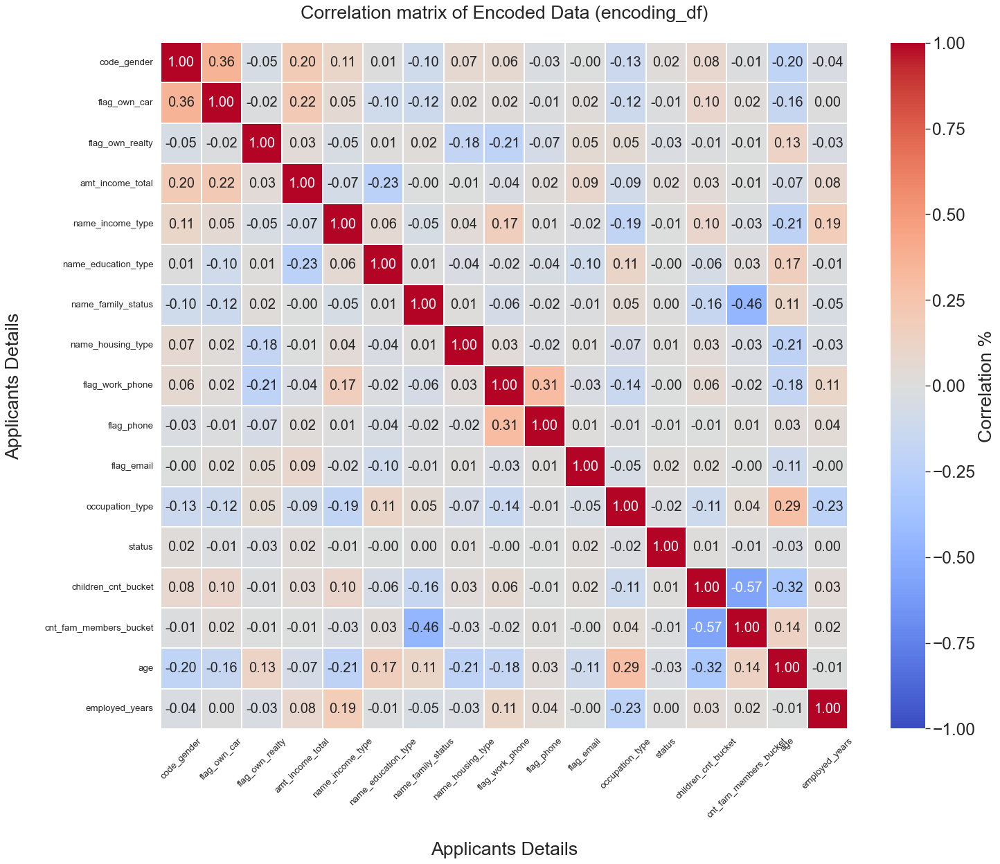

In [692]:
# Correlation of cleaned dataset encoding_df after Label Encoder
 
plt.figure(figsize = (20, 20), dpi = 80, facecolor = 'white', edgecolor = 'k')

sns.set(font_scale = 2)

hm_corr2 = sns.heatmap(encoding_df.corr(), annot = True, vmin = -1, vmax = 1, cmap = 'coolwarm', fmt = '.2f', 
                 cbar_kws = {"shrink": .82, 'label': 'Correlation %'},
                 annot_kws = {"size": 18}, linewidths = 0.1, linecolor = 'white', square = True)

plt.title('Correlation matrix of Encoded Data (encoding_df)\n')

hm_corr2.set(xlabel = '\nApplicants Details', ylabel = 'Applicants Details\n')

hm_corr2.set_xticklabels(hm_corr2.get_xmajorticklabels(), fontsize = 12, rotation = 45)

hm_corr2.set_yticklabels(hm_corr2.get_ymajorticklabels(), fontsize = 12)

plt.savefig('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\corr_matrix_eda3.jpg')

plt.show()

#### Check VIF to treat Multicollinearity

In [693]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [694]:
encoding_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,children_cnt_bucket,cnt_fam_members_bucket,age,employed_years
0,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,3,7,40,13.00
1,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,3,7,40,13.00
2,0,0,1,27000.00,4,4,1,1,1,0,0,18,0,3,7,52,3.00
3,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,3,7,54,0.00
4,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,3,7,54,0.00


In [695]:
vif_data = pd.DataFrame()

In [696]:
vif_data["Columns"] = encoding_df.columns

In [697]:
vif_data["VIF"] = [variance_inflation_factor(encoding_df.values, i)
                          for i in range(len(encoding_df.columns))]

In [698]:
vif_data.sort_values('VIF', ascending = False)

,Columns,VIF
15,age,17.48
13,children_cnt_bucket,11.47
14,cnt_fam_members_bucket,9.03
5,name_education_type,6.86
11,occupation_type,5.83
3,amt_income_total,4.93
6,name_family_status,3.63
2,flag_own_realty,3.29
4,name_income_type,3.26
7,name_housing_type,2.91


* Although the VIF of age is 17.48 but we will not drop it, as it's a very significant variable from the business point of view.
* Instead, we will drop children_cnt_bucket as it is above 10 with a score of 11.47.

In [699]:
encoding_df = encoding_df.drop(['children_cnt_bucket'], axis = 1)
encoding_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,cnt_fam_members_bucket,age,employed_years
0,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
1,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
2,0,0,1,27000.00,4,4,1,1,1,0,0,18,0,7,52,3.00
3,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00
4,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00


In [700]:
encoding_df.shape

(36457, 16)

In [701]:
encoding_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   code_gender             36457 non-null  int32  
 1   flag_own_car            36457 non-null  int32  
 2   flag_own_realty         36457 non-null  int32  
 3   amt_income_total        36457 non-null  float64
 4   name_income_type        36457 non-null  int32  
 5   name_education_type     36457 non-null  int32  
 6   name_family_status      36457 non-null  int32  
 7   name_housing_type       36457 non-null  int32  
 8   flag_work_phone         36457 non-null  int32  
 9   flag_phone              36457 non-null  int32  
 10  flag_email              36457 non-null  int32  
 11  occupation_type         36457 non-null  int32  
 12  status                  36457 non-null  int64  
 13  cnt_fam_members_bucket  36457 non-null  int32  
 14  age                     36457 non-null

In [702]:
# Recheck the VIF of the dataset

In [703]:
vif_data2 = pd.DataFrame()

In [704]:
vif_data2["Columns"] = encoding_df.columns

In [705]:
vif_data2["VIF"] = [variance_inflation_factor(encoding_df.values, i)
                          for i in range(len(encoding_df.columns))]

In [706]:
vif_data2.sort_values('VIF', ascending = False)

,Columns,VIF
14,age,16.23
13,cnt_fam_members_bucket,8.46
5,name_education_type,6.51
11,occupation_type,5.63
3,amt_income_total,4.58
6,name_family_status,3.60
2,flag_own_realty,3.17
4,name_income_type,3.03
7,name_housing_type,2.70
15,employed_years,1.95


In [707]:
encoding_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,cnt_fam_members_bucket,age,employed_years
0,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
1,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
2,0,0,1,27000.00,4,4,1,1,1,0,0,18,0,7,52,3.00
3,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00
4,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00


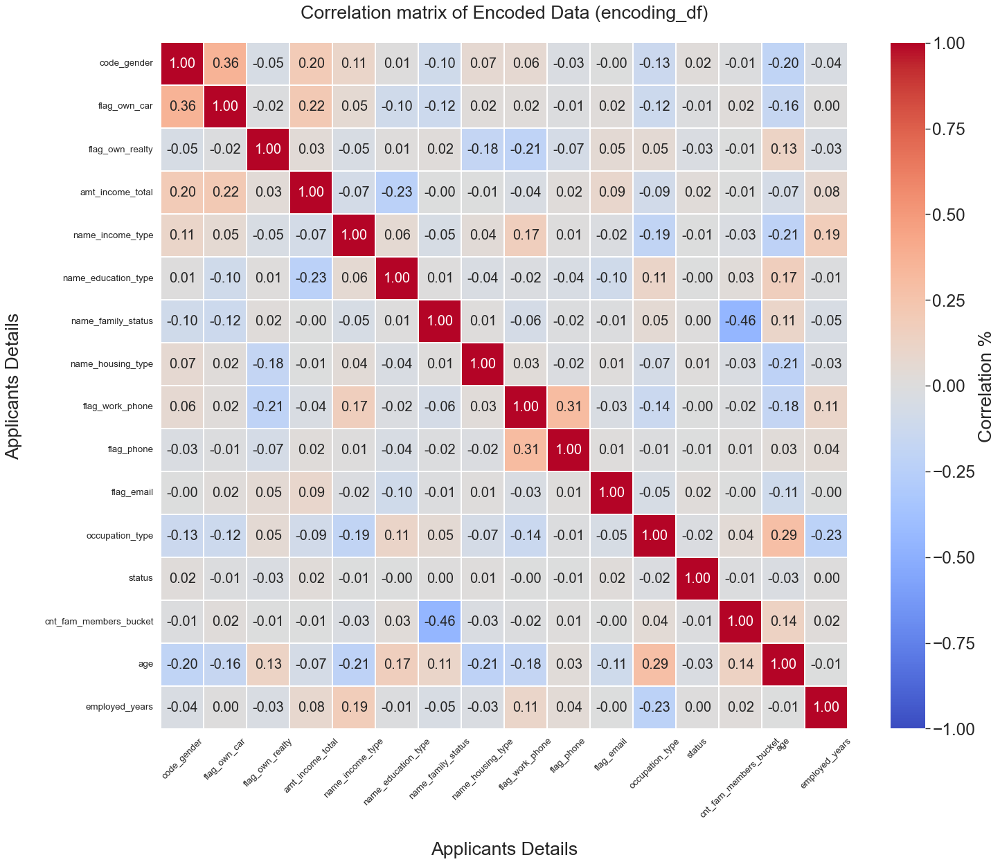

In [708]:
# Correlation of cleaned dataset encoding_df after Label Encoder
 
plt.figure(figsize = (20, 20), dpi = 80, facecolor = 'white', edgecolor = 'k')

sns.set(font_scale = 2)

hm_corr3 = sns.heatmap(encoding_df.corr(), annot = True, vmin = -1, vmax = 1, cmap = 'coolwarm', fmt = '.2f', 
                 cbar_kws = {"shrink": .82, 'label': 'Correlation %'},
                 annot_kws = {"size": 18}, linewidths = 0.1, linecolor = 'white', square = True)

plt.title('Correlation matrix of Encoded Data (encoding_df)\n')

hm_corr3.set(xlabel = '\nApplicants Details', ylabel = 'Applicants Details\n')

hm_corr3.set_xticklabels(hm_corr3.get_xmajorticklabels(), fontsize = 12, rotation = 45)

hm_corr3.set_yticklabels(hm_corr3.get_ymajorticklabels(), fontsize = 12)

plt.savefig('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\corr_matrix_vif4.jpg')

plt.show()

* Multicollinearity is taken care of.

#### Checking p-values of the variables

In [709]:
import statsmodels.api as sm

In [710]:
p_value_df = encoding_df.copy()
p_value_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,cnt_fam_members_bucket,age,employed_years
0,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
1,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
2,0,0,1,27000.00,4,4,1,1,1,0,0,18,0,7,52,3.00
3,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00
4,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00


In [711]:
X_p_value_df = p_value_df.drop(['status'], axis = 1)

In [712]:
y_p_value_df = p_value_df['status']

In [713]:
X_p_value_df = sm.add_constant(X_p_value_df)
model_demo = sm.OLS(y_p_value_df, X_p_value_df)
# model_demo = sm.Logit(y_demo, X_demo)
results = model_demo.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 status   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     8.735
Date:                Sat, 24 Sep 2022   Prob (F-statistic):           1.47e-20
Time:                        18:28:17   Log-Likelihood:                -10380.
No. Observations:               36457   AIC:                         2.079e+04
Df Residuals:                   36441   BIC:                         2.093e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

### Model Building

In [714]:
model_df = encoding_df.copy()

In [715]:
model_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,status,cnt_fam_members_bucket,age,employed_years
0,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
1,0,0,0,27000.00,4,1,0,1,1,0,0,10,1,7,40,13.00
2,0,0,1,27000.00,4,4,1,1,1,0,0,18,0,7,52,3.00
3,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00
4,0,1,1,29250.00,1,4,1,1,0,0,0,15,0,7,54,0.00


In [716]:
model_df.shape

(36457, 16)

In [717]:
# Save the Dataset for model building

model_df.to_csv('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\model_dataset.csv', index = False)

In [718]:
# X value contains all the variables except status (target variable)

X = model_df.drop(['status'], axis = 1)

In [719]:
X.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
0,0,0,0,27000.00,4,1,0,1,1,0,0,10,7,40,13.00
1,0,0,0,27000.00,4,1,0,1,1,0,0,10,7,40,13.00
2,0,0,1,27000.00,4,4,1,1,1,0,0,18,7,52,3.00
3,0,1,1,29250.00,1,4,1,1,0,0,0,15,7,54,0.00
4,0,1,1,29250.00,1,4,1,1,0,0,0,15,7,54,0.00


In [720]:
X.shape

(36457, 15)

In [721]:
# y contains only status (target variable)

y = model_df['status']

In [722]:
y.head()

0    1
1    1
2    0
3    0
4    0
Name: status, dtype: int64

In [723]:
y.shape

(36457,)

#### Split the dataset

In [724]:
# We create the test train split first

from sklearn.model_selection import train_test_split

In [725]:
X_balanced, X_test_balanced, y_balanced, y_test_balanced = train_test_split(X , y, test_size = 0.3, random_state = 42, stratify = y)

In [726]:
encoding_df.status.value_counts() / encoding_df.shape[0]

0   0.88
1   0.12
Name: status, dtype: float64

In [727]:
y_balanced.value_counts() / len(y_balanced)

0   0.88
1   0.12
Name: status, dtype: float64

In [728]:
y_test_balanced.value_counts() / len(y_test_balanced)

0   0.88
1   0.12
Name: status, dtype: float64

In [729]:
X_balanced.shape

(25519, 15)

In [730]:
y_balanced.shape

(25519,)

In [731]:
X_test_balanced.shape

(10938, 15)

In [732]:
y_test_balanced.shape

(10938,)

In [733]:
X_balanced.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
11957,1,1,1,135000.00,4,4,1,1,0,1,0,8,7,39,9.00
11052,1,0,1,135000.00,4,4,0,1,0,0,0,12,6,36,7.00
13960,1,0,0,135000.00,4,4,1,1,1,0,0,4,7,40,9.00
5372,0,0,1,103500.00,0,4,1,1,1,1,0,16,7,46,4.00
30992,1,1,0,270000.00,0,4,1,1,1,1,0,10,7,56,7.00


In [734]:
y_balanced.head()

11957    0
11052    0
13960    0
5372     0
30992    1
Name: status, dtype: int64

In [735]:
y_balanced.value_counts()

0    22515
1     3004
Name: status, dtype: int64

In [736]:
X_test_balanced.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
36245,0,0,1,675000.00,4,4,1,1,0,0,1,12,7,49,18.00
30510,0,0,1,270000.00,4,4,1,1,0,0,0,6,7,49,27.00
7249,0,0,1,112500.00,4,4,1,1,0,0,1,16,7,42,6.00
22707,1,0,0,189000.00,2,4,1,1,0,0,0,3,7,43,7.00
18346,0,0,0,157500.00,4,1,2,1,0,0,0,11,3,47,8.00


In [737]:
y_test_balanced.head()

36245    0
30510    0
7249     0
22707    0
18346    0
Name: status, dtype: int64

In [738]:
y_test_balanced.value_counts()

0    9651
1    1287
Name: status, dtype: int64

Insights:-
* By using the stratify method in the train_test split, we will maintain the same imbalance ratio of Eligible and Non-Eligible Candidates.
* We will now implement different models to see which one performs the best.

#### Apply the models

In [739]:
# Import the model libraries

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [740]:
classifiers = {
    "LogisticRegression" : LogisticRegression(),
    "KNeighbors" : KNeighborsClassifier(),
    "DecisionTree" : DecisionTreeClassifier(),
    "RandomForest" : RandomForestClassifier(),
    "XGBoost" : XGBClassifier(),
    "GradientBoostingClassifier" : GradientBoostingClassifier()
}

In [741]:
scores_dict = {}

for key, classifier in classifiers.items():
    classifier.fit(X_balanced, y_balanced)
    
    train_score = classifier.score(X_balanced, y_balanced)
   
    test_score = classifier.score(X_test_balanced, y_test_balanced)
    
    scores_dict[key] = {"Train Score" : train_score, "Test Score" : test_score}

for key, value in scores_dict.items():
    print("\n{} :".format(key))
    for key1, value1 in value.items():
        print("\t{}\t : {}".format(key1, value1))


LogisticRegression :
	Train Score	 : 0.882283788549708
	Test Score	 : 0.8823368074602304

KNeighbors :
	Train Score	 : 0.9003487597476391
	Test Score	 : 0.8722801243371732

DecisionTree :
	Train Score	 : 0.9336572749715898
	Test Score	 : 0.8762113731943683

RandomForest :
	Train Score	 : 0.9336572749715898
	Test Score	 : 0.8819711098921192

XGBoost :
	Train Score	 : 0.8987029272306909
	Test Score	 : 0.8869994514536478

GradientBoostingClassifier :
	Train Score	 : 0.8826364669461969
	Test Score	 : 0.882519656244286


#### Insights:-

* We see that among the models above, XGBoost model is performing best on the train set as well as test set with the accuracies of 89.87% and 88.69%.
* Also the the variation between the train and test of XGBoost is also very minimal.
* Therefore, we will use the XGBoost model to predict our values.

### Predict using the best Model as per the Test Score - XGBoost

In [742]:
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})

In [743]:
#xgb = XGBClassifier()

xgb = XGBClassifier()

#model = xgb.fit(X_balanced, y_balanced)

xgb.fit(X_balanced, y_balanced)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [744]:
# Check the probability of the Eligible applicants

xgb.predict_proba(X_test_balanced)

array([[0.7641203 , 0.23587973],
       [0.94811034, 0.05188968],
       [0.93724144, 0.06275856],
       ...,
       [0.87145746, 0.12854256],
       [0.94180006, 0.05819992],
       [0.6944636 , 0.30553636]], dtype=float32)

In [745]:
# Predict the eligibility of the applicants

xgb_pred = xgb.predict(X_test_balanced)

In [746]:
#print(prediction)

xgb_pred

array([0, 0, 0, ..., 0, 0, 0])

In [747]:
xgb_pred.shape

(10938,)

#### Model Evaluation

In [748]:
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score

In [749]:
print(classification_report(y_test_balanced, xgb_pred))

              precision    recall  f1-score   support

           0       0.89      0.99      0.94      9651
           1       0.61      0.11      0.19      1287

    accuracy                           0.89     10938
   macro avg       0.75      0.55      0.56     10938
weighted avg       0.86      0.89      0.85     10938



In [750]:
               Accuracy = metrics.accuracy_score(y_test_balanced, xgb_pred)
Precision = metrics.precision_score(y_test_balanced, xgb_pred)
Sensitivity_recall = metrics.recall_score(y_test_balanced, xgb_pred)
Specificity = metrics.recall_score(y_test_balanced, xgb_pred, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, xgb_pred)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8869994514536478, 'Precision': 0.6075949367088608, 'Sensitivity_recall': 0.11188811188811189, 'Specificity': 0.9903636928815667, 'F1_score': 0.1889763779527559}


In [751]:
# RMSE Computation

rmse = np.sqrt(MSE(y_test_balanced, xgb_pred))
print("RMSE : % f" %(rmse))

RMSE :  0.336156


In [752]:
# Accuracy Score

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test_balanced, xgb_pred)))

Accuracy Score is 0.887


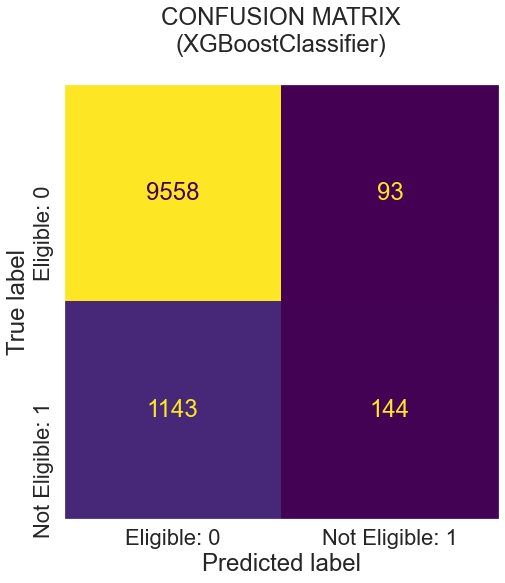

In [753]:
# Confusion Matrix Chart

confusion_matrix = metrics.confusion_matrix(y_test_balanced, xgb_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(XGBoostClassifier)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

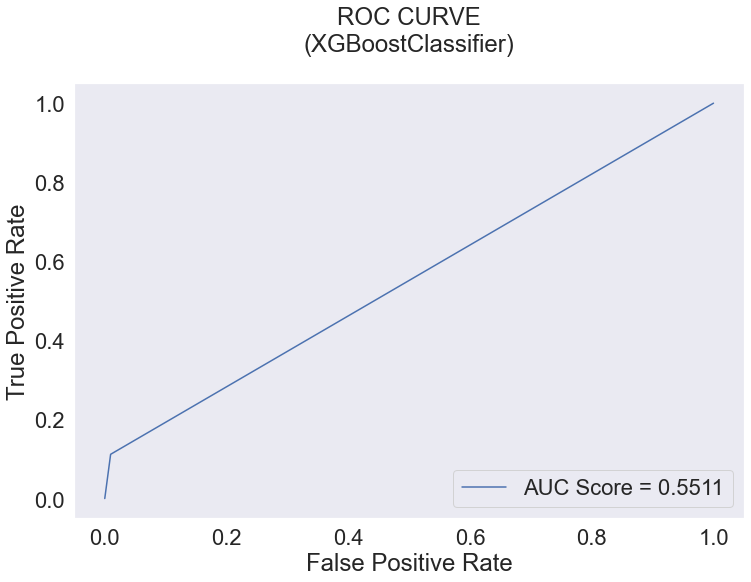

In [754]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced,  xgb_pred)

auc = metrics.roc_auc_score(y_test_balanced, xgb_pred)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(XGBoostClassifier)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

### Feature Importance - XGBoost

In [755]:
# Find the feature importance

importances = pd.DataFrame(data = {
    'Attribute': X_test_balanced.columns,
    'Importance': xgb.feature_importances_
})

importances = importances.sort_values(by = 'Importance', ascending = False)

In [756]:
importances

,Attribute,Importance
10,flag_email,0.08
6,name_family_status,0.07
11,occupation_type,0.07
4,name_income_type,0.07
5,name_education_type,0.07
14,employed_years,0.07
0,code_gender,0.07
12,cnt_fam_members_bucket,0.07
13,age,0.07
3,amt_income_total,0.07


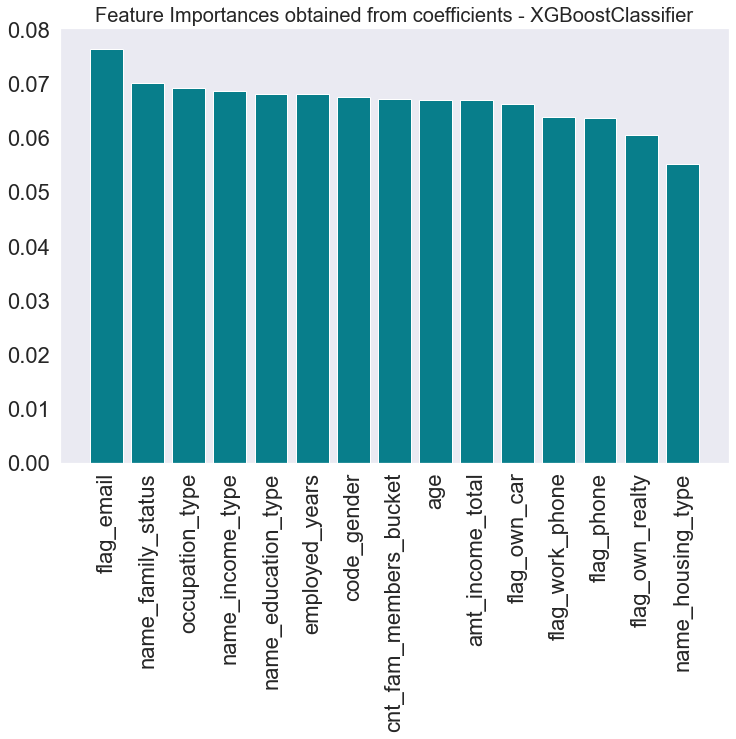

In [757]:
# Visually plot the feature importances

plt.bar(x = importances['Attribute'], height = importances['Importance'], color = '#087E8B')
plt.title('Feature Importances obtained from coefficients - XGBoostClassifier', size = 20)
plt.xticks(rotation = 'vertical')
plt.grid(False)
plt.show()

## Check other Models One-by-One

### Logistic Regression

In [758]:
classifierLR = LogisticRegression(random_state = 42)
classifierLR.fit(X_balanced, y_balanced)

LogisticRegression(random_state=42)

In [759]:
classifierLR.classes_

array([0, 1], dtype=int64)

In [760]:
classifierLR.intercept_

array([-0.00079533])

In [761]:
classifierLR.coef_

array([[-4.49477424e-05, -1.46305928e-04, -5.86505862e-04,
        -1.10170730e-06, -2.06135467e-03, -2.94275601e-03,
        -1.04725840e-03, -9.40760603e-04, -2.14072027e-04,
        -2.43595801e-04,  5.82821780e-06, -9.34892576e-03,
        -4.56880447e-03, -3.80768034e-02, -3.30012017e-03]])

In [762]:
pred_prob = classifierLR.predict_proba(X_test_balanced)
pred_prob

array([[0.94460969, 0.05539031],
       [0.91402403, 0.08597597],
       [0.87521895, 0.12478105],
       ...,
       [0.90400326, 0.09599674],
       [0.94300127, 0.05699873],
       [0.79473563, 0.20526437]])

In the matrix above, each row corresponds to a single observation. The first column is the probability of the predicted output being zero, that is 1 - 𝑝(𝑥). The second column is the probability that the output is one, or 𝑝(𝑥).

In [763]:
y_predLR = classifierLR.predict(X_test_balanced)
y_predLR

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [764]:
y_predLR.shape

(10938,)

In [765]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test_balanced, y_predLR)))

Accuracy Score is 0.88234


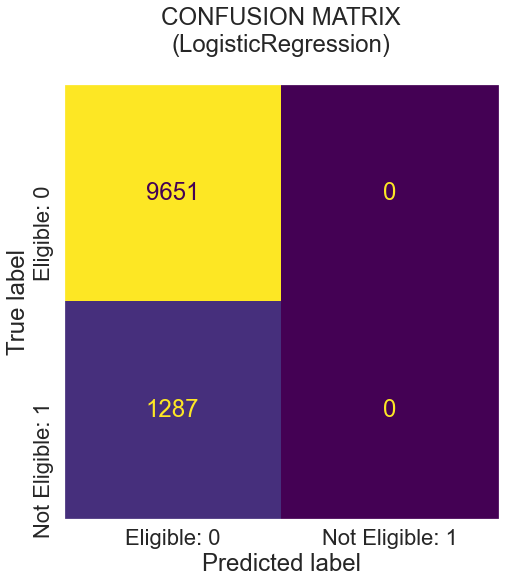

In [766]:
# Confusion Matrix Chart

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_predLR)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(LogisticRegression)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

#### Results Explained

The Confusion Matrix created has four different quadrants:

* True Negative (Top-Left Quadrant)
* False Positive (Top-Right Quadrant)
* False Negative (Bottom-Left Quadrant)
* True Positive (Bottom-Right Quadrant)

True means that the values were accurately predicted, False means that there was an error or wrong prediction.

In [767]:
print(classification_report(y_test_balanced, y_predLR))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94      9651
           1       0.00      0.00      0.00      1287

    accuracy                           0.88     10938
   macro avg       0.44      0.50      0.47     10938
weighted avg       0.78      0.88      0.83     10938



In [768]:
Accuracy = metrics.accuracy_score(y_test_balanced, y_predLR)
Precision = metrics.precision_score(y_test_balanced, y_predLR)
Sensitivity_recall = metrics.recall_score(y_test_balanced, y_predLR)
Specificity = metrics.recall_score(y_test_balanced, y_predLR, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, y_predLR)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8823368074602304, 'Precision': 0.0, 'Sensitivity_recall': 0.0, 'Specificity': 1.0, 'F1_score': 0.0}


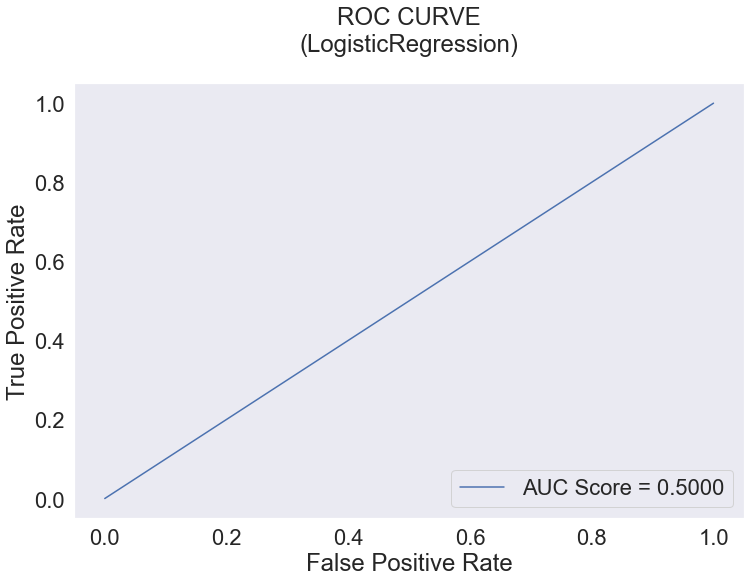

In [769]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced,  y_predLR)

auc = metrics.roc_auc_score(y_test_balanced, y_predLR)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(LogisticRegression)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [770]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_predLR))
print("RMSE : % f" %(rmse))

RMSE :  0.343021


### KNeighborsClassifier

In [771]:
# Find the value of k

In [772]:
import matplotlib.pyplot as plt
from matplotlib import style
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

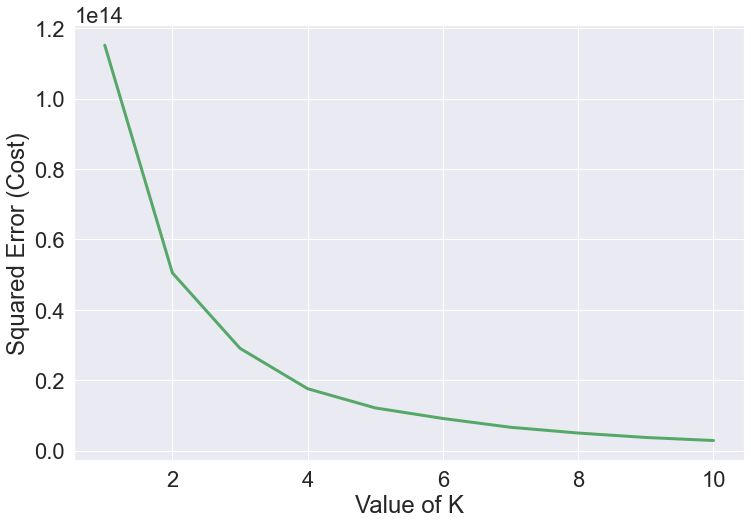

In [773]:
cost =[]
for i in range(1, 11):
    KM = KMeans(n_clusters = i, max_iter = 500)
    KM.fit(X_test_balanced)
     
    # calculates squared error
    # for the clustered points
    cost.append(KM.inertia_)    
 
# plot the cost against K values
plt.plot(range(1, 11), cost, color ='g', linewidth ='3')
plt.xlabel("Value of K")
plt.ylabel("Squared Error (Cost)")
plt.show()

In this case the optimal value for k would be 4. (the last elbow bend)

In [774]:
# Apply the k value in the model

In [775]:
knn = KNeighborsClassifier(n_neighbors = 4)
  
knn.fit(X_balanced, y_balanced)

KNeighborsClassifier(n_neighbors=4)

In [776]:
knn_pred_prob = knn.predict_proba(X_test_balanced)
knn_pred_prob

array([[0.75, 0.25],
       [1.  , 0.  ],
       [1.  , 0.  ],
       ...,
       [0.75, 0.25],
       [1.  , 0.  ],
       [0.5 , 0.5 ]])

In [777]:
knn_pred = knn.predict(X_test_balanced)
knn_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [778]:
knn_pred.shape

(10938,)

In [779]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test_balanced, knn_pred)))

Accuracy Score is 0.8806


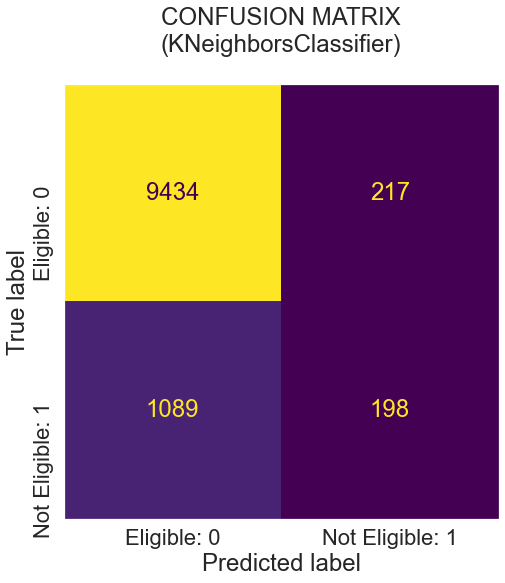

In [780]:
# Confusion Matrix Chart

confusion_matrix = metrics.confusion_matrix(y_test_balanced, knn_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(KNeighborsClassifier)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [781]:
print(classification_report(y_test_balanced, knn_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      9651
           1       0.48      0.15      0.23      1287

    accuracy                           0.88     10938
   macro avg       0.69      0.57      0.58     10938
weighted avg       0.85      0.88      0.85     10938



In [782]:
Accuracy = metrics.accuracy_score(y_test_balanced, knn_pred)
Precision = metrics.precision_score(y_test_balanced, knn_pred)
Sensitivity_recall = metrics.recall_score(y_test_balanced, knn_pred)
Specificity = metrics.recall_score(y_test_balanced, knn_pred, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, knn_pred)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8805997440117023, 'Precision': 0.4771084337349398, 'Sensitivity_recall': 0.15384615384615385, 'Specificity': 0.9775152833903222, 'F1_score': 0.23266745005875444}


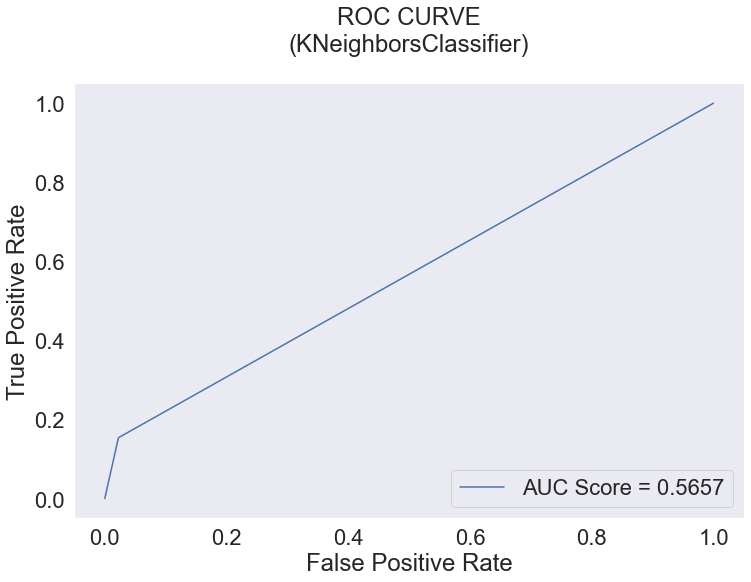

In [783]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced,  knn_pred)

auc = metrics.roc_auc_score(y_test_balanced, knn_pred)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(KNeighborsClassifier)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [784]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, knn_pred))
print("RMSE : % f" %(rmse))

RMSE :  0.345543


### Decision Tree Classifier

In [785]:
# Create Decision Tree classifer object

clf_dt = DecisionTreeClassifier()

In [786]:
# Train Decision Tree Classifer

clf_dt = clf_dt.fit(X_balanced, y_balanced)

In [787]:
#Predict probabilities for test dataset

clf_dt.predict_proba(X_test_balanced)

array([[0.75, 0.25],
       [1.  , 0.  ],
       [1.  , 0.  ],
       ...,
       [0.8 , 0.2 ],
       [1.  , 0.  ],
       [0.  , 1.  ]])

In [788]:
#Predict the response for test dataset

y_pred_dt = clf_dt.predict(X_test_balanced)

In [789]:
y_pred_dt

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [790]:
# Model Accuracy, how often is the classifier correct?

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test_balanced, y_pred_dt)))

Accuracy Score is 0.8763


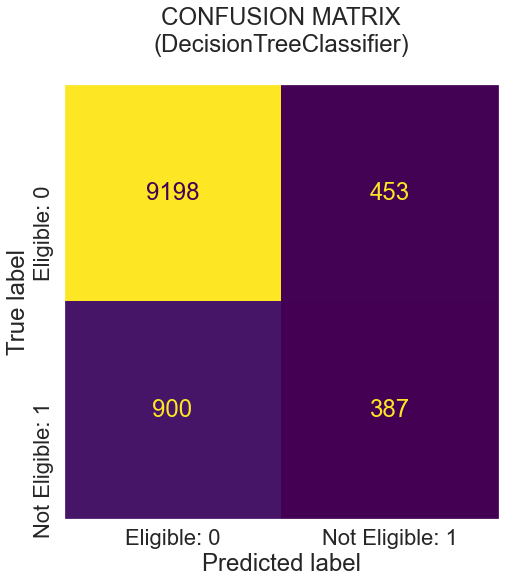

In [791]:
# Confusion Matrix Chart

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_pred_dt)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(DecisionTreeClassifier)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [792]:
print(classification_report(y_test_balanced, y_pred_dt))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      9651
           1       0.46      0.30      0.36      1287

    accuracy                           0.88     10938
   macro avg       0.69      0.63      0.65     10938
weighted avg       0.86      0.88      0.86     10938



In [793]:
Accuracy = metrics.accuracy_score(y_test_balanced, y_pred_dt)
Precision = metrics.precision_score(y_test_balanced, y_pred_dt)
Sensitivity_recall = metrics.recall_score(y_test_balanced, y_pred_dt)
Specificity = metrics.recall_score(y_test_balanced, y_pred_dt, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, y_pred_dt)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8763027975863961, 'Precision': 0.4607142857142857, 'Sensitivity_recall': 0.3006993006993007, 'Specificity': 0.953061858874728, 'F1_score': 0.36389280677009866}


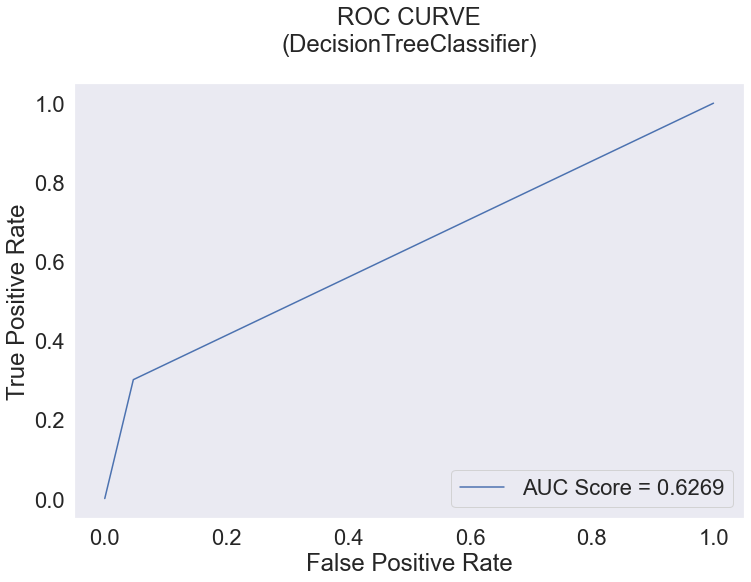

In [794]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced, y_pred_dt)

auc = metrics.roc_auc_score(y_test_balanced, y_pred_dt)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(DecisionTreeClassifier)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [795]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_pred_dt))
print("RMSE : % f" %(rmse))

RMSE :  0.351706


In [796]:
# Decision Tree - Gini

In [797]:
clf_dt_gini = DecisionTreeClassifier(criterion = "gini", max_depth = 3, min_samples_leaf = 5, random_state = 42)

In [798]:
clf_dt_gini = clf_dt_gini.fit(X_balanced, y_balanced)

In [799]:
clf_dt_gini.predict_proba(X_test_balanced)

array([[0.89387755, 0.10612245],
       [0.86319153, 0.13680847],
       [0.9057356 , 0.0942644 ],
       ...,
       [0.87664042, 0.12335958],
       [0.89387755, 0.10612245],
       [0.87736173, 0.12263827]])

In [800]:
y_pred_dt_gini = clf_dt.predict(X_test_balanced)
y_pred_dt_gini

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [801]:
# Model Accuracy, how often is the classifier correct?

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test_balanced, y_pred_dt_gini)))

Accuracy Score is 0.8763


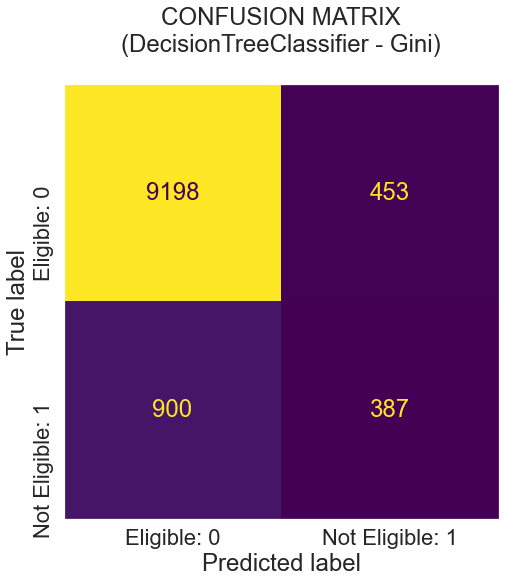

In [802]:
# Confusion Matrix Chart

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_pred_dt_gini)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(DecisionTreeClassifier - Gini)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [803]:
print(classification_report(y_test_balanced, y_pred_dt_gini))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      9651
           1       0.46      0.30      0.36      1287

    accuracy                           0.88     10938
   macro avg       0.69      0.63      0.65     10938
weighted avg       0.86      0.88      0.86     10938



In [804]:
Accuracy = metrics.accuracy_score(y_test_balanced, y_pred_dt_gini)
Precision = metrics.precision_score(y_test_balanced, y_pred_dt_gini)
Sensitivity_recall = metrics.recall_score(y_test_balanced, y_pred_dt_gini)
Specificity = metrics.recall_score(y_test_balanced, y_pred_dt_gini, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, y_pred_dt_gini)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8763027975863961, 'Precision': 0.4607142857142857, 'Sensitivity_recall': 0.3006993006993007, 'Specificity': 0.953061858874728, 'F1_score': 0.36389280677009866}


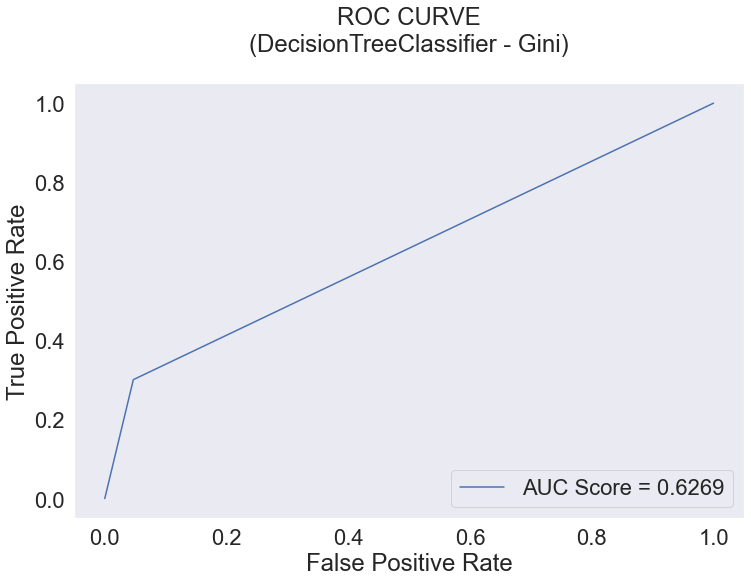

In [805]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced, y_pred_dt_gini)

auc = metrics.roc_auc_score(y_test_balanced, y_pred_dt_gini)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(DecisionTreeClassifier - Gini)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [806]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_pred_dt_gini))
print("RMSE : % f" %(rmse))

RMSE :  0.351706


In [807]:
from sklearn.tree import export_graphviz
from six import StringIO 
from IPython.display import Image  
import pydotplus

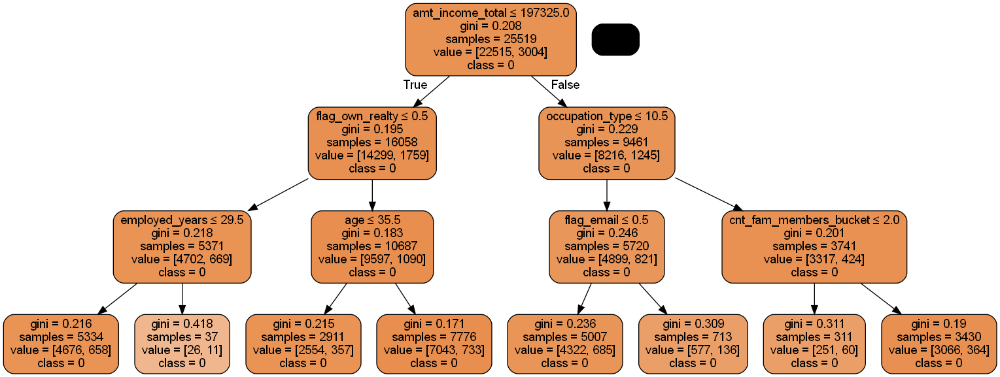

In [808]:
dot_data = StringIO()
export_graphviz(clf_dt_gini, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_test_balanced.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree_gini.png')
Image(graph.create_png())

In [809]:
# Decision Tree - Entropy

In [810]:
clf_dt_ent = DecisionTreeClassifier(criterion = "entropy", max_depth = 3, min_samples_leaf = 5, random_state = 42)

In [811]:
clf_dt_ent = clf_dt_ent.fit(X_balanced, y_balanced)

In [812]:
clf_dt_ent.predict_proba(X_test_balanced)

array([[0.90344453, 0.09655547],
       [0.86371412, 0.13628588],
       [0.90344453, 0.09655547],
       ...,
       [0.87728879, 0.12271121],
       [0.86371412, 0.13628588],
       [0.87728879, 0.12271121]])

In [813]:
y_pred_dt_ent = clf_dt.predict(X_test_balanced)
y_pred_dt_ent

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [814]:
# Model Accuracy, how often is the classifier correct?

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test_balanced, y_pred_dt_ent)))

Accuracy Score is 0.8763


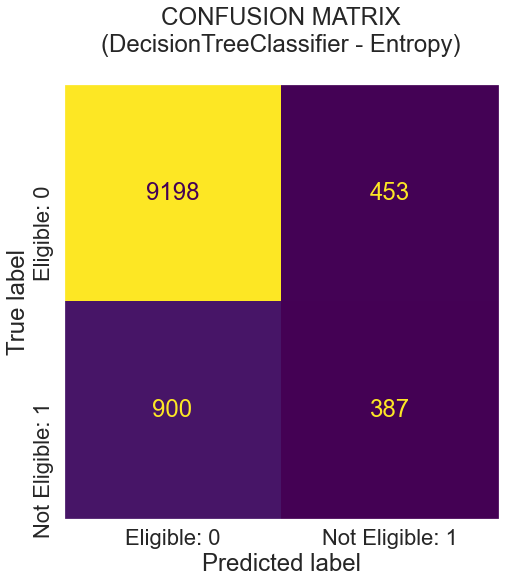

In [815]:
# Confusion Matrix Chart

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_pred_dt_ent)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(DecisionTreeClassifier - Entropy)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [816]:
print(classification_report(y_test_balanced, y_pred_dt_ent))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      9651
           1       0.46      0.30      0.36      1287

    accuracy                           0.88     10938
   macro avg       0.69      0.63      0.65     10938
weighted avg       0.86      0.88      0.86     10938



In [817]:
Accuracy = metrics.accuracy_score(y_test_balanced, y_pred_dt_ent)
Precision = metrics.precision_score(y_test_balanced, y_pred_dt_ent)
Sensitivity_recall = metrics.recall_score(y_test_balanced, y_pred_dt_ent)
Specificity = metrics.recall_score(y_test_balanced, y_pred_dt_ent, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, y_pred_dt_ent)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8763027975863961, 'Precision': 0.4607142857142857, 'Sensitivity_recall': 0.3006993006993007, 'Specificity': 0.953061858874728, 'F1_score': 0.36389280677009866}


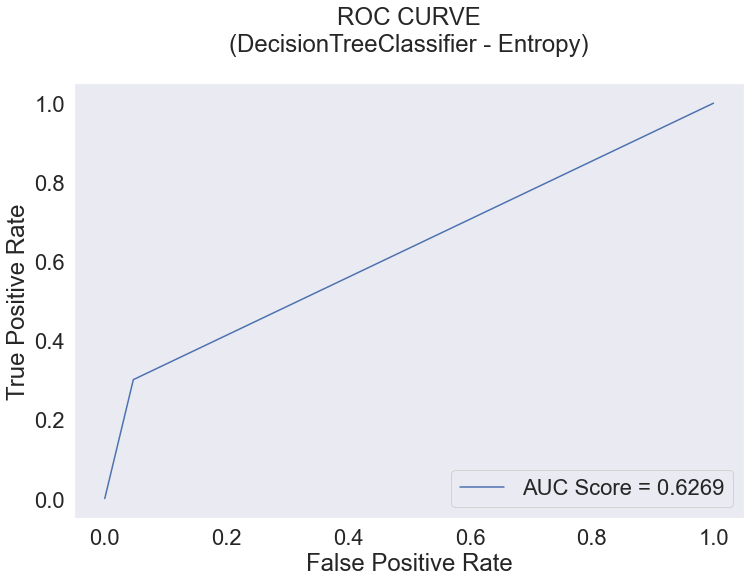

In [818]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced, y_pred_dt_ent)

auc = metrics.roc_auc_score(y_test_balanced, y_pred_dt_ent)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(DecisionTreeClassifier - Entropy)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [819]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_pred_dt_ent))
print("RMSE : % f" %(rmse))

RMSE :  0.351706


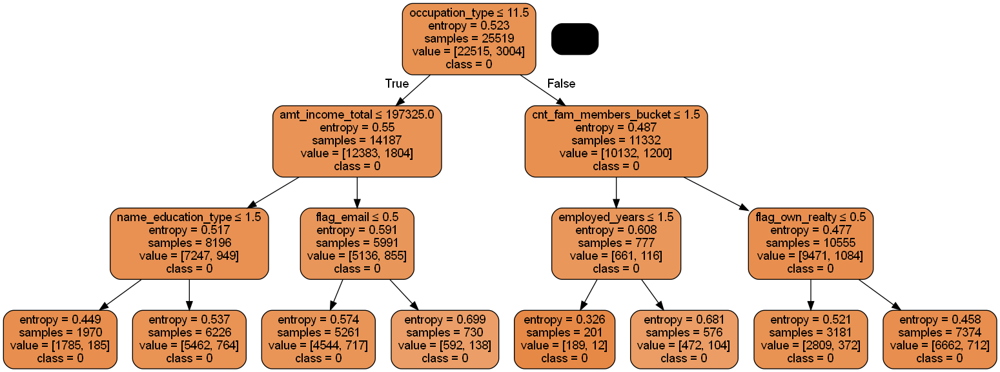

In [820]:
dot_data = StringIO()
export_graphviz(clf_dt_ent, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_test_balanced.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree_entropy.png')
Image(graph.create_png())

### Random Forest Classifier

In [821]:
from sklearn.ensemble import RandomForestClassifier

# create regressor object
# clf_rf = RandomForestClassifier(n_estimators = 100, max_depth = 2, random_state = 42)
clf_rf = RandomForestClassifier(n_estimators = 100, random_state = 42)

  
# fit the regressor with x and y data
clf_rf.fit(X_balanced, y_balanced) 

RandomForestClassifier(random_state=42)

In [822]:
y_pred_rf = clf_rf.predict(X_test_balanced)
y_pred_rf

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [823]:
y_pred_rf.shape

(10938,)

In [824]:
# Calculate the accuracy of the model
print(clf_rf.score(X_test_balanced, y_test_balanced))

0.8814225635399524


In [825]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_pred_rf))
print("RMSE : % f" %(rmse))

RMSE :  0.344351


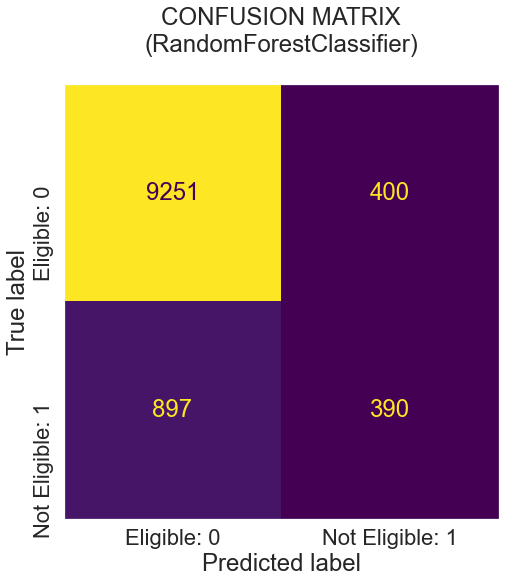

In [826]:
# Confusion Matrix Chart

from sklearn.metrics import confusion_matrix

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_pred_rf)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(RandomForestClassifier)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [827]:
print(classification_report(y_test_balanced, y_pred_rf))

              precision    recall  f1-score   support

           0       0.91      0.96      0.93      9651
           1       0.49      0.30      0.38      1287

    accuracy                           0.88     10938
   macro avg       0.70      0.63      0.66     10938
weighted avg       0.86      0.88      0.87     10938



In [828]:
Accuracy = metrics.accuracy_score(y_test_balanced, y_pred_rf)
Precision = metrics.precision_score(y_test_balanced, y_pred_rf)
Sensitivity_recall = metrics.recall_score(y_test_balanced, y_pred_rf)
Specificity = metrics.recall_score(y_test_balanced, y_pred_rf, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, y_pred_rf)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8814225635399524, 'Precision': 0.4936708860759494, 'Sensitivity_recall': 0.30303030303030304, 'Specificity': 0.9585535177701793, 'F1_score': 0.3755416466056813}


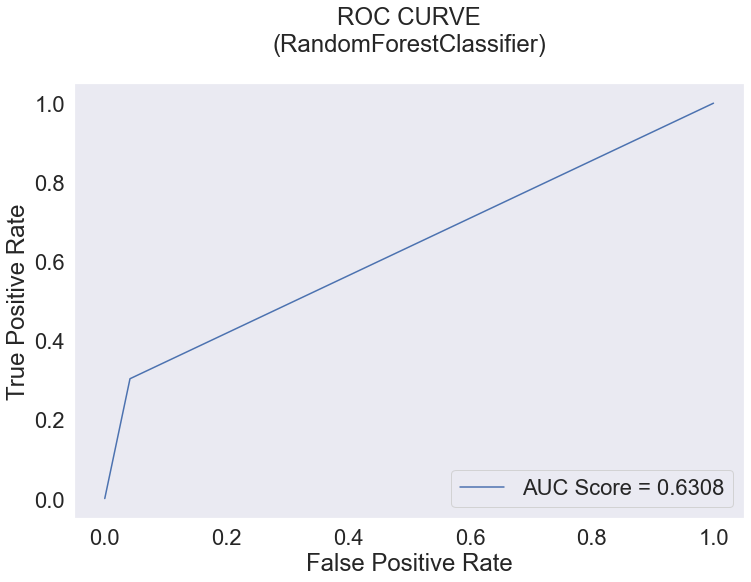

In [829]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced, y_pred_rf)

auc = metrics.roc_auc_score(y_test_balanced, y_pred_rf)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(RandomForestClassifier)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [830]:
# Find best number of estimators using RandomForestClassifier

In [831]:
for w in range(10, 300, 20):
    mod_rf = RandomForestClassifier(n_estimators = w, oob_score = True, n_jobs = 1, random_state = 42)
    mod_rf.fit(X_balanced,y_balanced)
    
    oob = mod_rf.oob_score_
    print('For n_estimators = '+str(w))
    print('oob score is '+str(oob))
    print('*****************')

For n_estimators = 10
oob score is 0.8760923233669031
*****************
For n_estimators = 30
oob score is 0.8816568047337278
*****************
For n_estimators = 50
oob score is 0.8824405345037031
*****************
For n_estimators = 70
oob score is 0.8825580939691994
*****************
For n_estimators = 90
oob score is 0.8830675183196833
*****************
For n_estimators = 110
oob score is 0.8828323993886907
*****************
For n_estimators = 130
oob score is 0.8832634507621772
*****************
For n_estimators = 150
oob score is 0.8834985696931698
*****************
For n_estimators = 170
oob score is 0.8836553156471648
*****************
For n_estimators = 190
oob score is 0.8838120616011599
*****************
For n_estimators = 210
oob score is 0.8838120616011599
*****************
For n_estimators = 230
oob score is 0.883968807555155
*****************
For n_estimators = 250
oob score is 0.8840863670206512
*****************
For n_estimators = 270
oob score is 0.8838120616011599
**

In [832]:
for w in range(300, 600, 20):
    mod_rf2 = RandomForestClassifier(n_estimators = w, oob_score = True, n_jobs = 1, random_state = 42)
    mod_rf2.fit(X_balanced, y_balanced)
    
    oob = mod_rf2.oob_score_
    print('For n_estimators = '+str(w))
    print('oob score is '+str(oob))
    print('*****************')

For n_estimators = 300
oob score is 0.8838120616011599
*****************
For n_estimators = 320
oob score is 0.8839296210666562
*****************
For n_estimators = 340
oob score is 0.8840471805321525
*****************
For n_estimators = 360
oob score is 0.8842039264861475
*****************
For n_estimators = 380
oob score is 0.8843214859516438
*****************
For n_estimators = 400
oob score is 0.8840079940436537
*****************
For n_estimators = 420
oob score is 0.8840863670206512
*****************
For n_estimators = 440
oob score is 0.8842039264861475
*****************
For n_estimators = 460
oob score is 0.8838512480896586
*****************
For n_estimators = 480
oob score is 0.8840863670206512
*****************
For n_estimators = 500
oob score is 0.8840863670206512
*****************
For n_estimators = 520
oob score is 0.8840079940436537
*****************
For n_estimators = 540
oob score is 0.8841647399976488
*****************
For n_estimators = 560
oob score is 0.8839688075551

In [833]:
# Taking 380 as the correct number of estimators becasue it has the highest oob score as 0.884321

In [834]:
from sklearn.ensemble import RandomForestClassifier

# create regressor object
clf_rf4 = RandomForestClassifier(n_estimators = 380, random_state = 42)
  
# fit the regressor with x and y data
clf_rf4.fit(X_balanced, y_balanced) 

RandomForestClassifier(n_estimators=380, random_state=42)

In [835]:
clf_rf4.predict_proba(X_test_balanced)

array([[0.75672067, 0.24327933],
       [1.        , 0.        ],
       [0.97535088, 0.02464912],
       ...,
       [0.79329948, 0.20670052],
       [0.99793233, 0.00206767],
       [0.09219298, 0.90780702]])

In [836]:
Y_pred_rf4 = clf_rf4.predict(X_test_balanced)
Y_pred_rf4

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [837]:
Y_pred_rf4.shape

(10938,)

In [838]:
# RMSE Computation

rmse = np.sqrt(MSE(y_test_balanced, Y_pred_rf4))
print("RMSE : % f" %(rmse))

RMSE :  0.342220


In [839]:
# Calculate the accuracy of the model

print(clf_rf4.score(X_test_balanced, y_test_balanced))

0.8828853538123972


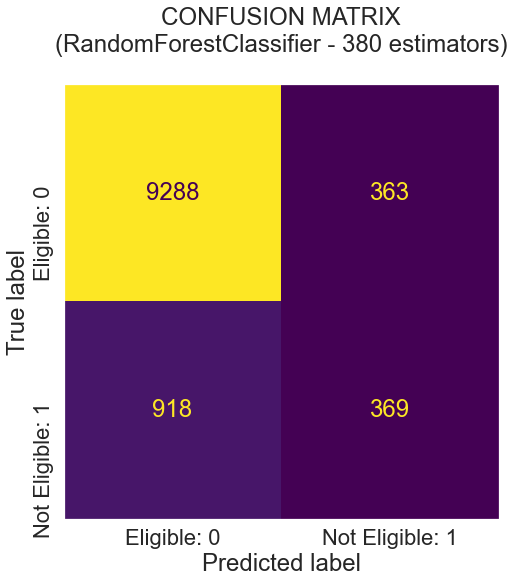

In [840]:
# Confusion Matrix Chart

from sklearn.metrics import confusion_matrix

confusion_matrix = metrics.confusion_matrix(y_test_balanced, Y_pred_rf4)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(RandomForestClassifier - 380 estimators)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [841]:
print(classification_report(y_test_balanced, Y_pred_rf4))

              precision    recall  f1-score   support

           0       0.91      0.96      0.94      9651
           1       0.50      0.29      0.37      1287

    accuracy                           0.88     10938
   macro avg       0.71      0.62      0.65     10938
weighted avg       0.86      0.88      0.87     10938



In [842]:
Accuracy = metrics.accuracy_score(y_test_balanced, Y_pred_rf4)
Precision = metrics.precision_score(y_test_balanced, Y_pred_rf4)
Sensitivity_recall = metrics.recall_score(y_test_balanced, Y_pred_rf4)
Specificity = metrics.recall_score(y_test_balanced, Y_pred_rf4, pos_label = 0)
F1_score = metrics.f1_score(y_test_balanced, Y_pred_rf4)

print({"Accuracy": Accuracy, "Precision": Precision, "Sensitivity_recall": Sensitivity_recall,
       "Specificity": Specificity, "F1_score": F1_score})

{'Accuracy': 0.8828853538123972, 'Precision': 0.5040983606557377, 'Sensitivity_recall': 0.2867132867132867, 'Specificity': 0.9623873173764377, 'F1_score': 0.3655274888558693}


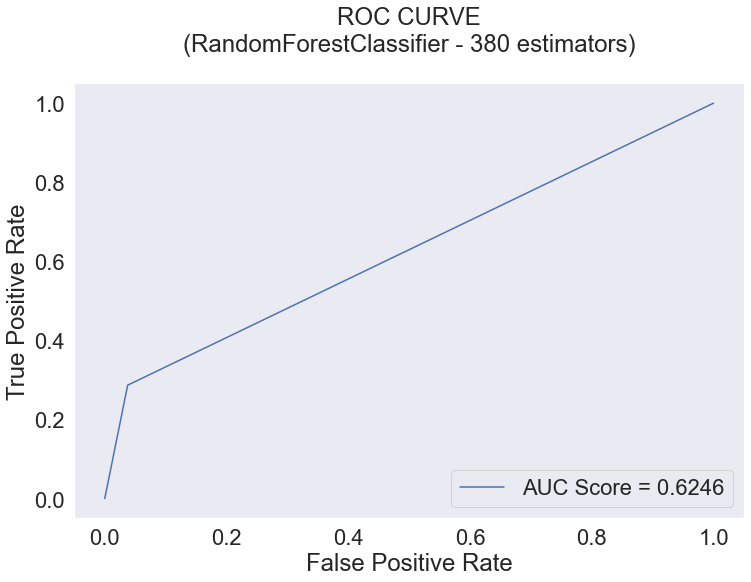

In [843]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced, Y_pred_rf4)

auc = metrics.roc_auc_score(y_test_balanced, Y_pred_rf4)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(RandomForestClassifier - 380 estimators)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

In [844]:
# Accuracy

clf_rf4.score(X_test_balanced, y_test_balanced)

0.8828853538123972

### Feature Importance - RandomForestClassifier

In [845]:
from sklearn.inspection import permutation_importance

In [846]:
clf_rf.feature_importances_

array([0.02443374, 0.03142517, 0.0213844 , 0.20423693, 0.03928624,
       0.03690086, 0.04983252, 0.02667157, 0.0249356 , 0.03164262,
       0.01321561, 0.09781582, 0.05098756, 0.20879432, 0.13843703])

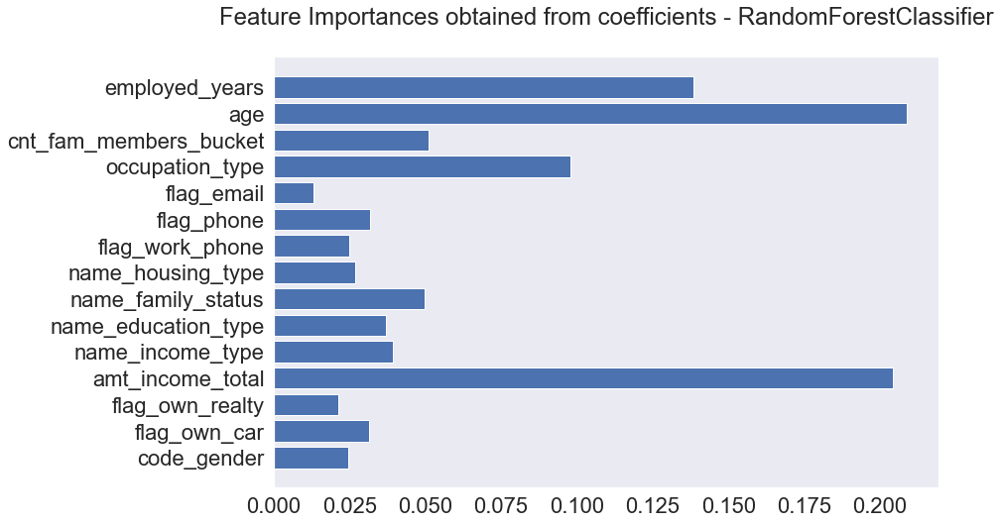

In [847]:
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})

plt.barh(X_test_balanced.columns, clf_rf.feature_importances_)
plt.title('Feature Importances obtained from coefficients - RandomForestClassifier\n')
plt.grid(False)

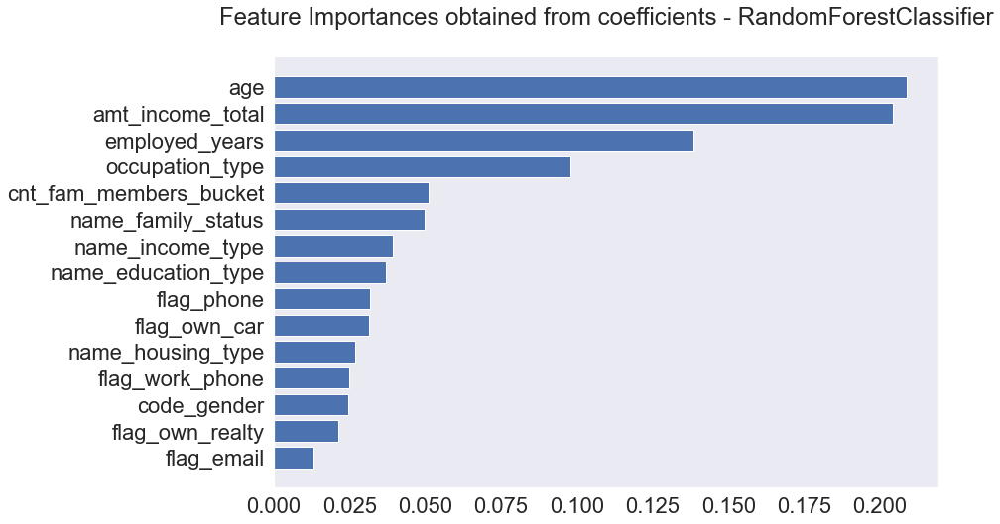

In [848]:
sorted_idx = clf_rf.feature_importances_.argsort()
plt.barh(X_test_balanced.columns[sorted_idx], clf_rf.feature_importances_[sorted_idx])
#plt.xlabel("Random Forest Feature Importance")
plt.title('Feature Importances obtained from coefficients - RandomForestClassifier\n')
plt.grid(False)

### Build the Random Forest model on selected features

* Now, I will drop the least important feature flag_email from the model, rebuild the model and check its effect on accuracy.

In [849]:
# drop the least important feature from X_balanced and X_test_balanced

In [850]:
X_balanced_fi = X_balanced.copy()

In [851]:
X_balanced_fi.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
11957,1,1,1,135000.00,4,4,1,1,0,1,0,8,7,39,9.00
11052,1,0,1,135000.00,4,4,0,1,0,0,0,12,6,36,7.00
13960,1,0,0,135000.00,4,4,1,1,1,0,0,4,7,40,9.00
5372,0,0,1,103500.00,0,4,1,1,1,1,0,16,7,46,4.00
30992,1,1,0,270000.00,0,4,1,1,1,1,0,10,7,56,7.00


In [852]:
X_balanced_fi = X_balanced_fi.drop(['flag_email'], axis=1)

In [853]:
X_balanced_fi.shape

(25519, 14)

In [854]:
X_balanced_fi.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,occupation_type,cnt_fam_members_bucket,age,employed_years
11957,1,1,1,135000.00,4,4,1,1,0,1,8,7,39,9.00
11052,1,0,1,135000.00,4,4,0,1,0,0,12,6,36,7.00
13960,1,0,0,135000.00,4,4,1,1,1,0,4,7,40,9.00
5372,0,0,1,103500.00,0,4,1,1,1,1,16,7,46,4.00
30992,1,1,0,270000.00,0,4,1,1,1,1,10,7,56,7.00


In [855]:
X_test_balanced_fi = X_test_balanced.copy()

In [856]:
X_test_balanced_fi.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
36245,0,0,1,675000.00,4,4,1,1,0,0,1,12,7,49,18.00
30510,0,0,1,270000.00,4,4,1,1,0,0,0,6,7,49,27.00
7249,0,0,1,112500.00,4,4,1,1,0,0,1,16,7,42,6.00
22707,1,0,0,189000.00,2,4,1,1,0,0,0,3,7,43,7.00
18346,0,0,0,157500.00,4,1,2,1,0,0,0,11,3,47,8.00


In [857]:
X_test_balanced_fi = X_test_balanced_fi.drop(['flag_email'], axis=1)

In [858]:
X_test_balanced_fi.shape

(10938, 14)

In [859]:
X_test_balanced_fi.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,occupation_type,cnt_fam_members_bucket,age,employed_years
36245,0,0,1,675000.00,4,4,1,1,0,0,12,7,49,18.00
30510,0,0,1,270000.00,4,4,1,1,0,0,6,7,49,27.00
7249,0,0,1,112500.00,4,4,1,1,0,0,16,7,42,6.00
22707,1,0,0,189000.00,2,4,1,1,0,0,3,7,43,7.00
18346,0,0,0,157500.00,4,1,2,1,0,0,11,3,47,8.00


In [860]:
# Now, I will build the random forest model again and check accuracy

In [861]:
clf_rf_fi = RandomForestClassifier(n_estimators = 100, random_state = 42)

  
# fit the regressor with x and y data
clf_rf_fi.fit(X_balanced_fi, y_balanced) 

RandomForestClassifier(random_state=42)

In [862]:
clf_rf_fi.predict_proba(X_test_balanced_fi)

array([[0.74740612, 0.25259388],
       [1.        , 0.        ],
       [1.        , 0.        ],
       ...,
       [0.78396442, 0.21603558],
       [1.        , 0.        ],
       [0.115     , 0.885     ]])

In [863]:
y_pred_rf_fi = clf_rf_fi.predict(X_test_balanced_fi)
y_pred_rf_fi

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [864]:
# Calculate the accuracy of the model
print(clf_rf_fi.score(X_test_balanced_fi, y_test_balanced))

0.8804168952276468


In [865]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_pred_rf_fi))
print("RMSE : % f" %(rmse))

RMSE :  0.345808


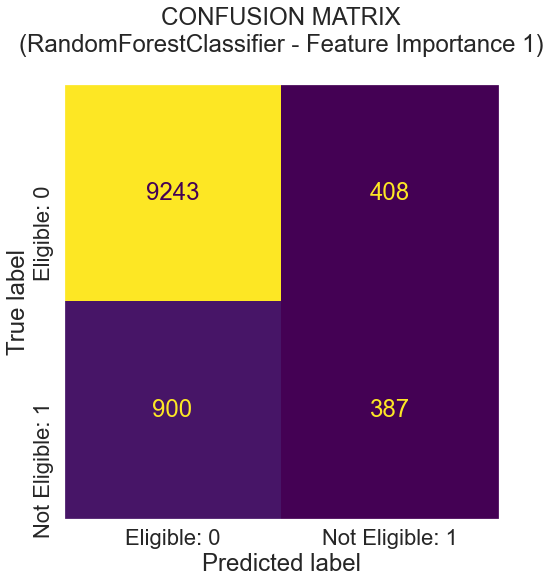

In [866]:
# Confusion Matrix Chart

from sklearn.metrics import confusion_matrix

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_pred_rf_fi)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(RandomForestClassifier - Feature Importance 1)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

* There was not any significant change in the accuracy and RMSE score.
* Both of them dipped slightly further after removing the least significant variable flag_email

In [867]:
# Drop another least significant variable

* Now, I will drop the least important feature flag_own_realty from the model, rebuild the model and check its effect on accuracy.

In [868]:
X_balanced_fi = X_balanced_fi.drop(['flag_own_realty'], axis=1)

In [869]:
X_balanced_fi.shape

(25519, 13)

In [870]:
X_balanced_fi.head()

,code_gender,flag_own_car,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,occupation_type,cnt_fam_members_bucket,age,employed_years
11957,1,1,135000.00,4,4,1,1,0,1,8,7,39,9.00
11052,1,0,135000.00,4,4,0,1,0,0,12,6,36,7.00
13960,1,0,135000.00,4,4,1,1,1,0,4,7,40,9.00
5372,0,0,103500.00,0,4,1,1,1,1,16,7,46,4.00
30992,1,1,270000.00,0,4,1,1,1,1,10,7,56,7.00


In [871]:
X_test_balanced_fi = X_test_balanced_fi.drop(['flag_own_realty'], axis=1)

In [872]:
X_test_balanced_fi.shape

(10938, 13)

In [873]:
X_test_balanced_fi.head()

,code_gender,flag_own_car,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,occupation_type,cnt_fam_members_bucket,age,employed_years
36245,0,0,675000.00,4,4,1,1,0,0,12,7,49,18.00
30510,0,0,270000.00,4,4,1,1,0,0,6,7,49,27.00
7249,0,0,112500.00,4,4,1,1,0,0,16,7,42,6.00
22707,1,0,189000.00,2,4,1,1,0,0,3,7,43,7.00
18346,0,0,157500.00,4,1,2,1,0,0,11,3,47,8.00


In [874]:
# Now, I will build the random forest model again and check accuracy

In [875]:
clf_rf_fi = RandomForestClassifier(n_estimators = 100, random_state = 42)

  
# fit the regressor with x and y data
clf_rf_fi.fit(X_balanced_fi, y_balanced) 

RandomForestClassifier(random_state=42)

In [876]:
clf_rf_fi.predict_proba(X_test_balanced_fi)

array([[0.74740612, 0.25259388],
       [1.        , 0.        ],
       [0.96      , 0.04      ],
       ...,
       [0.78396442, 0.21603558],
       [0.992     , 0.008     ],
       [0.119     , 0.881     ]])

In [877]:
y_pred_rf_fi = clf_rf_fi.predict(X_test_balanced_fi)
y_pred_rf_fi

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [878]:
# Calculate the accuracy of the model
print(clf_rf_fi.score(X_test_balanced_fi, y_test_balanced))

0.8808740171877857


In [879]:
# RMSE Computation
rmse = np.sqrt(MSE(y_test_balanced, y_pred_rf_fi))
print("RMSE : % f" %(rmse))

RMSE :  0.345146


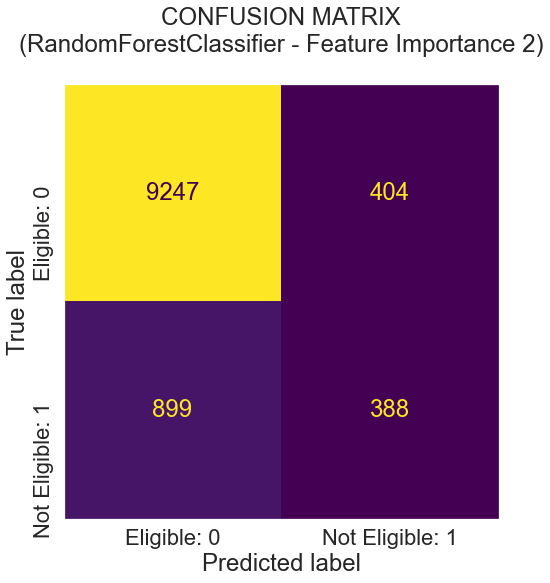

In [880]:
# Confusion Matrix Chart

from sklearn.metrics import confusion_matrix

confusion_matrix = metrics.confusion_matrix(y_test_balanced, y_pred_rf_fi)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(RandomForestClassifier - Feature Importance 2)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

#### Observation:-
* The model gave the better accurace and RMSE score without dropping flag_email and flag_own_realty.

### Gradient Boosting Classifier

In [881]:
from sklearn.ensemble import GradientBoostingClassifier

gboost = GradientBoostingClassifier(n_estimators = 5000, max_depth = 3, random_state = 42)

In [882]:
gboost.fit(X_balanced, y_balanced)

GradientBoostingClassifier(n_estimators=5000, random_state=42)

In [883]:
gboost.predict_proba(X_test_balanced)

array([[0.77102469, 0.22897531],
       [0.97609289, 0.02390711],
       [0.92565536, 0.07434464],
       ...,
       [0.86420675, 0.13579325],
       [0.96229184, 0.03770816],
       [0.33288448, 0.66711552]])

In [884]:
preds_gb = gboost.predict(X_test_balanced)
preds_gb

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [885]:
preds_gb.shape

(10938,)

In [886]:
# Calculate the accuracy of the model

print(gboost.score(X_test_balanced, y_test_balanced))

0.8833424757725361


In [887]:
# RMSE Computation

rmse = np.sqrt(MSE(y_test_balanced, preds_gb))
print("RMSE : % f" %(rmse))

RMSE :  0.341552


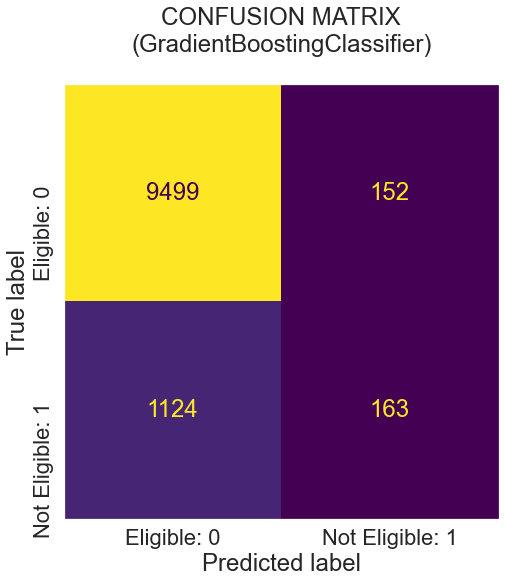

In [888]:
# Confusion Matrix Chart

from sklearn.metrics import confusion_matrix

confusion_matrix = metrics.confusion_matrix(y_test_balanced, preds_gb)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Eligible: 0', 'Not Eligible: 1'])
cm_display.plot(cmap = 'viridis', colorbar = False, xticks_rotation='horizontal')
cm_display.ax_.set_title("CONFUSION MATRIX\n" + "(GradientBoostingClassifier)\n")
plt.yticks(rotation = 90)
plt.grid(False)
plt.show()

In [889]:
print(classification_report(y_test_balanced, preds_gb))

              precision    recall  f1-score   support

           0       0.89      0.98      0.94      9651
           1       0.52      0.13      0.20      1287

    accuracy                           0.88     10938
   macro avg       0.71      0.56      0.57     10938
weighted avg       0.85      0.88      0.85     10938



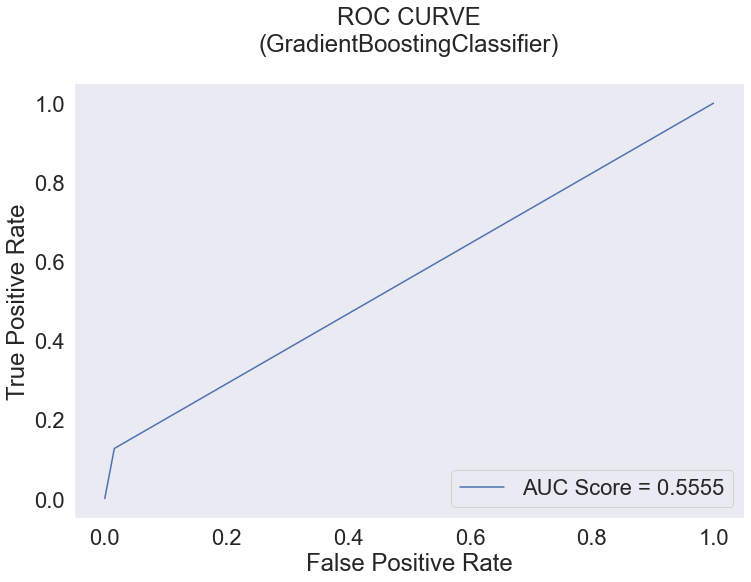

In [890]:
# AUC - ROC

fpr, tpr, _ = metrics.roc_curve(y_test_balanced, preds_gb)

auc = metrics.roc_auc_score(y_test_balanced, preds_gb)

# ax = plt.axes()
plt.plot(fpr, tpr, label = 'AUC Score = %.4f'%auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC CURVE' + "\n(GradientBoostingClassifier)\n")
plt.legend(loc = 4)
# ax.set_facecolor("grey")
plt.grid(False)
plt.show()

### Save the Final Output

In [891]:
predictions = pd.DataFrame(y_pred_rf)
predictions

,0
0,0
1,0
2,0
3,0
4,0
...,...
10933,0
10934,0
10935,0
10936,0


In [892]:
# Save the Predicted Values to a .csv file

predictions.to_csv('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\predictions.csv')

In [893]:
# Add prediction column to the test dataframe X_test

predictions.rename(columns = {0:'predicted_status'}, inplace = True)
predictions.head()

,predicted_status
0,0
1,0
2,0
3,0
4,0


In [894]:
tested_df = X_test_balanced.copy()
tested_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
36245,0,0,1,675000.00,4,4,1,1,0,0,1,12,7,49,18.00
30510,0,0,1,270000.00,4,4,1,1,0,0,0,6,7,49,27.00
7249,0,0,1,112500.00,4,4,1,1,0,0,1,16,7,42,6.00
22707,1,0,0,189000.00,2,4,1,1,0,0,0,3,7,43,7.00
18346,0,0,0,157500.00,4,1,2,1,0,0,0,11,3,47,8.00


In [895]:
tested_df['predicted_status'] = predictions['predicted_status']
tested_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years,predicted_status
36245,0,0,1,675000.00,4,4,1,1,0,0,1,12,7,49,18.00,NaN
30510,0,0,1,270000.00,4,4,1,1,0,0,0,6,7,49,27.00,NaN
7249,0,0,1,112500.00,4,4,1,1,0,0,1,16,7,42,6.00,0.00
22707,1,0,0,189000.00,2,4,1,1,0,0,0,3,7,43,7.00,NaN
18346,0,0,0,157500.00,4,1,2,1,0,0,0,11,3,47,8.00,NaN


In [896]:
tested_df.predicted_status.value_counts()

0.00    3049
1.00     212
Name: predicted_status, dtype: int64

In [897]:
# Save the final DataFrame to .csv

final_df = tested_df.copy()
final_df.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years,predicted_status
36245,0,0,1,675000.00,4,4,1,1,0,0,1,12,7,49,18.00,NaN
30510,0,0,1,270000.00,4,4,1,1,0,0,0,6,7,49,27.00,NaN
7249,0,0,1,112500.00,4,4,1,1,0,0,1,16,7,42,6.00,0.00
22707,1,0,0,189000.00,2,4,1,1,0,0,0,3,7,43,7.00,NaN
18346,0,0,0,157500.00,4,1,2,1,0,0,0,11,3,47,8.00,NaN


In [898]:
final_df.to_csv('D:\\D - Drive\\IPBA\\BYOP\\Capstone Project\\Final - Credit Card Approval Model\\final_df.csv', index = False)

### Making a Prediction

In [899]:
model_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   code_gender             36457 non-null  int32  
 1   flag_own_car            36457 non-null  int32  
 2   flag_own_realty         36457 non-null  int32  
 3   amt_income_total        36457 non-null  float64
 4   name_income_type        36457 non-null  int32  
 5   name_education_type     36457 non-null  int32  
 6   name_family_status      36457 non-null  int32  
 7   name_housing_type       36457 non-null  int32  
 8   flag_work_phone         36457 non-null  int32  
 9   flag_phone              36457 non-null  int32  
 10  flag_email              36457 non-null  int32  
 11  occupation_type         36457 non-null  int32  
 12  status                  36457 non-null  int64  
 13  cnt_fam_members_bucket  36457 non-null  int32  
 14  age                     36457 non-null

In [900]:
X_balanced.head()

,code_gender,flag_own_car,flag_own_realty,amt_income_total,name_income_type,name_education_type,name_family_status,name_housing_type,flag_work_phone,flag_phone,flag_email,occupation_type,cnt_fam_members_bucket,age,employed_years
11957,1,1,1,135000.00,4,4,1,1,0,1,0,8,7,39,9.00
11052,1,0,1,135000.00,4,4,0,1,0,0,0,12,6,36,7.00
13960,1,0,0,135000.00,4,4,1,1,1,0,0,4,7,40,9.00
5372,0,0,1,103500.00,0,4,1,1,1,1,0,16,7,46,4.00
30992,1,1,0,270000.00,0,4,1,1,1,1,0,10,7,56,7.00


In [901]:
X_balanced.shape

(25519, 15)

In [902]:
X_balanced = np.array([['F', 'N', 'Y', 27000, "Working", "Higher education", "Civil marriage", "House / apartment", 'Y', 'N', 'N', "Managers",
                     'Two', 40, 13]])
X_balanced

array([['F', 'N', 'Y', '27000', 'Working', 'Higher education',
        'Civil marriage', 'House / apartment', 'Y', 'N', 'N', 'Managers',
        'Two', '40', '13']], dtype='<U17')

In [903]:
X_balanced[:, 0] = le_code_gender.transform(X_balanced[:, 0])
X_balanced[:, 1] = le_flag_own_car.transform(X_balanced[:, 1])
X_balanced[:, 2] = le_flag_own_realty.transform(X_balanced[:, 2])
X_balanced[:, 4] = le_name_income_type.transform(X_balanced[:, 4])
X_balanced[:, 5] = le_name_education_type.transform(X_balanced[:, 5])
X_balanced[:, 6] = le_name_family_status.transform(X_balanced[:, 6])
X_balanced[:, 7] = le_name_housing_type.transform(X_balanced[:, 7])
X_balanced[:, 8] = le_flag_work_phone.transform(X_balanced[:, 8])
X_balanced[:, 9] = le_flag_phone.transform(X_balanced[:, 9])
X_balanced[:, 10] = le_flag_email.transform(X_balanced[:, 10])
X_balanced[:, 11] = le_occupation_type.transform(X_balanced[:, 11])
X_balanced[:, 12] = le_cnt_fam_members_bucket.transform(X_balanced[:, 12])

X_balanced = X_balanced.astype(int)

X_balanced

array([[    0,     0,     1, 27000,     4,     1,     0,     1,     1,
            0,     0,    10,     7,    40,    13]])

In [904]:
y_pred_rf = clf_rf.predict(X_balanced)
print(y_pred_rf)

[1]


In [905]:
if (y_pred_rf[0] == 0):
    print('Congratulations! You are ELIGIBLE for the Credit Card!')
else:
    print('Sorry! You are NOT ELIGIBLE for the Credit Card!')

Sorry! You are NOT ELIGIBLE for the Credit Card!


### Create a Pickle file

In [906]:
import pickle

In [907]:
data = {"model" : clf_rf, "le_code_gender" : le_code_gender, "le_flag_own_car" : le_flag_own_car,
        "le_flag_own_realty" : le_flag_own_realty, "le_name_income_type" : le_name_income_type,
        "le_name_education_type" : le_name_education_type, "le_name_family_status" : le_name_family_status,
        "le_name_housing_type" : le_name_housing_type, "le_flag_work_phone" : le_flag_work_phone,
        "le_flag_phone" : le_flag_phone, "le_flag_email" : le_flag_email, "le_occupation_type" : le_occupation_type,
        "le_cnt_fam_members_bucket" : le_cnt_fam_members_bucket}

with open('saved_steps.pkl', 'wb') as file:
    pickle.dump(data, file)

In [908]:
with open('saved_steps.pkl', 'rb') as file:
    data = pickle.load(file)
    
clf_rf_loaded = data["model"]
le_code_gender = data["le_code_gender"]
le_flag_own_car = data["le_flag_own_car"]
le_flag_own_realty = data["le_flag_own_realty"]
le_name_income_type = data["le_name_income_type"]
le_name_education_type = data["le_name_education_type"]
le_name_family_status = data["le_name_family_status"]
le_name_housing_type = data["le_name_housing_type"]
le_flag_work_phone = data["le_flag_work_phone"]
le_flag_phone = data["le_flag_phone"]
le_flag_email = data["le_flag_email"]
le_occupation_type = data["le_occupation_type"]
le_cnt_fam_members_bucket = data["le_cnt_fam_members_bucket"]

In [909]:
round(clf_rf.predict_proba(X_balanced)[:, 0][0] * 100, 2)

43.56

In [910]:
type(clf_rf.predict_proba(X_balanced)[:, 0][0])

numpy.float64

In [911]:
y_pred_rf = clf_rf_loaded.predict(X_balanced)
y_pred_rf

array([1], dtype=int64)

In [912]:
if (y_pred_rf[0] == 0):
    print('Congratulations! You are ELIGIBLE for the Credit Card!')
else:
    print('Sorry! You are NOT ELIGIBLE for the Credit Card!')

Sorry! You are NOT ELIGIBLE for the Credit Card!


# THE END!!!